# 수요와 리밸런싱을 고려한 최적 자전거 스테이션 제안

# 1. 공모 배경

과제의 목표는 공공 자전거의 활성화와 불만족도를 낮추는 것이다. 이 해당 목표에 대해 크게 3가지의 방향을 갖고 분석을 진행하였다.


## 1.1 동기
공공성을 가지는 과제의 목표가 마음에 들었고, 공간 데이터를 기반으로 새로운 데이터 분석에 도전하고 싶었다. 도전을 통해 개인의 성장과 더불어 좋은 결과를 도출하여 공공의 이익에 일조하고 싶다.


## 1.2 분석 방향

1. 잠재적 수요 발굴
   * 새롭게 자전거 거치대를 배치하였을 때 발생하는 수요를 파악할 필요가 존재한다.
   * 접근성의 문제 때문에 놓치고 있는 수요를 발굴해야 한다.
   * 주변 위치에 따른 잠재적 수요를 측정한다.
2. 공공성 확보
    * 공공 자전거는 많은 고양시민들이 이를 즐길 수 있게 하는 것이 중요한 요소이다.
    * 서비스의 사각지대로 어느정도 고려하는 것이 필요하다.
3. Rebalancing 문제
    * 자전거 거치 대수의 불균형 문제를 해결하는 것이 Rebalancing 문제이다.
    * 자전거를 많이 배치하는 것 외에도 이의 수량을 조절하는 것이 필요하다.
    * 재배치 비용을 줄이기 위해서라도, Rebalancing을 고려해야 한다.

- 용어 정의
    - 총 자전거 이용량 (반입량+반출량)의 일별 평균 : 절대 수요
        * $(return+lease)/totalDay$

    - 총 자전거 변화량 (반입량-반출량)의 일별 평균 : 상대 수요
         * $(return-lease)/totalDay$


## 1.3 사용한 라이브러리

실행 후 런타임 다시시작하세요!

In [1]:
!pip install -q folium==0.8.3
!pip install -q geopandas
!pip install haversine
!pip install -q mapclassify==2.3.0

# 기본 데이터 라이브러리 로드
import sys # 시스템 파라미터에 접근할 수 있게 도와준다.
print("Python version: {}". format(sys.version))

import pandas as pd # 데이터 정제에 도움을 주는 라이브러리
print("pandas version: {}". format(pd.__version__))

import matplotlib # 매트랩에서 사용하는 시각화 도구를 사용할 수 있게 도와주는 시각화 도구
print("matplotlib version: {}". format(matplotlib.__version__))

import numpy as np # 행렬 계산을 위해 필요한 라이브러리
print("NumPy version: {}". format(np.__version__))

import scipy as sp # 수학 관련 함수가 내장된 라이브러리
print("SciPy version: {}". format(sp.__version__)) 

import IPython
from IPython import display # 주피터 노트북에서 예쁘게 시각화 해주는 도구
print("IPython version: {}". format(IPython.__version__)) 

import sklearn # 각종 통계 도구와 머신 러닝 알고리즘이 내장되어 있는 라이브러리
print("scikit-learn version: {}". format(sklearn.__version__))

import tensorflow as tf
print("tensorflow version: {}".format(tf.__version__))

import geopandas as gpd # 공간정보 라이브러리
print("geopandas version: {}".format(gpd.__version__))

# 파이썬 내장 라이브러리
import random
import datetime
import time
import os
from datetime import datetime, timedelta
from dateutil.relativedelta import relativedelta
import copy

# 모델링 라이브러리, 수학 계산 툴 로드
# 일반적인 모델링 라이브러리
from sklearn import svm, tree, linear_model, neighbors, naive_bayes, ensemble, discriminant_analysis, gaussian_process
from xgboost import XGBClassifier

# 모델링 시 헬퍼 함수들
from sklearn.preprocessing import OneHotEncoder, LabelEncoder
from sklearn import feature_selection
from sklearn import model_selection
from sklearn import metrics

# interpolation 함수
import scipy.interpolate as spi
from scipy import stats

# model load
import pickle
# from sklearn.externals import joblib

# 시각화 도구
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.pylab as pylab
import seaborn as sns
from pandas.plotting import scatter_matrix

# 시각화 도구 default 세팅
# 주피터 노트북에서 plot 결과를 볼 수 있게 해준다.
%matplotlib inline
mpl.style.use('ggplot') # matplotlib에서 plot되는 결과를 선택할 수 있다.
sns.set_style('white') # seaborn에서 사용할 style을 설정할 수 있다.
pylab.rcParams['figure.figsize'] = 12,8 # plot의 크기와 선 등의 기본 값을 설정할 수 있다.

plt.style.use(['fivethirtyeight'])
sns.set_style('darkgrid')

from IPython.display import display #print가 아닌 display()로 연속 출력
from IPython.display import HTML #출력 결과를 HTML로 생성
import fiona #공간데이터를 딕셔너리 형태 등으로 접근할 수 있는 라이브러리

# 좌표계 정의/변환용 라이브러리
import pyproj

# 좌표간의 거리 구하기 위한 라이브러리
from haversine import haversine

# Jupyter Notebook 이나 ipython 을 사용하다보면 향후 버전이 올라갈 때 변경될 사항 등을 알려주는 경고 메시지(warning message)를 뜨지 않게 해준다.
import warnings
warnings.filterwarnings('ignore')
print('-'*25)

# 뒤에서 overlay를 활용하기 위함. 설치 후 런타임 다시 시작할 것
import rtree
import pathlib
from geoband import API

import mapclassify

Python version: 3.6.9 (default, Nov 11 2019, 11:24:16) 
[GCC 4.8.5 20150623 (Red Hat 4.8.5-39)]
pandas version: 1.1.1
matplotlib version: 3.3.0
NumPy version: 1.19.1
SciPy version: 1.4.1
IPython version: 7.16.1
scikit-learn version: 0.23.1
tensorflow version: 2.2.0
geopandas version: 0.8.1


/opt/app-root/lib/python3.6/site-packages/dask/dataframe/utils.py:15: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


-------------------------


In [2]:
import os
# 사용하는 디렉토리 정의
BASE_WORKING_DIR = os.getcwd()
DATA_RAW_PATH = os.path.join(BASE_WORKING_DIR, "input")

In [3]:
# 사용 좌표계
default_crs = "epsg:4326"
meter_crs = "epsg:5179"

In [4]:
# 데이터 불러오기
input_path = pathlib.Path('./input')
if not input_path.is_dir():
    input_path.mkdir()

API.GetCompasData('SBJ_2007_001', '1', input_path.joinpath('운영이력.csv'))
API.GetCompasData('SBJ_2007_001', '2', input_path.joinpath('자전거스테이션.csv'))
API.GetCompasData('SBJ_2007_001', '3', input_path.joinpath('꽃박람회일정.csv'))
API.GetCompasData('SBJ_2007_001', '4', input_path.joinpath('KINTEX행사일정.csv'))
API.GetCompasData('SBJ_2007_001', '5', input_path.joinpath('기상정보.csv'))
API.GetCompasData('SBJ_2007_001', '6', input_path.joinpath('인구(거주)분포도(100M X 100M).geojson'))
API.GetCompasData('SBJ_2007_001', '7', input_path.joinpath('인구통계.csv'))
API.GetCompasData('SBJ_2007_001', '8', input_path.joinpath('행정경계(시군구).geojson'))
API.GetCompasData('SBJ_2007_001', '9', input_path.joinpath('행정경계(읍면동).geojson'))
API.GetCompasData('SBJ_2007_001', '10', input_path.joinpath('도시계획(공간시설).geojson'))
API.GetCompasData('SBJ_2007_001', '11', input_path.joinpath('도시계획(공공문화제육시설).geojson'))
API.GetCompasData('SBJ_2007_001', '12', input_path.joinpath('도시계획(교통시설).geojson'))
API.GetCompasData('SBJ_2007_001', '13', input_path.joinpath('용도지역지구(습지보호지역).geojson'))
API.GetCompasData('SBJ_2007_001', '14', input_path.joinpath('고양시 지적도.geojson'))
API.GetCompasData('SBJ_2007_001', '15', input_path.joinpath('도로명주소_건물.geojson'))
API.GetCompasData('SBJ_2007_001', '16', input_path.joinpath('도로명주소_도로.geojson'))
API.GetCompasData('SBJ_2007_001', '17', input_path.joinpath('일반건물 분포도(100M X 100M).geojson'))
API.GetCompasData('SBJ_2007_001', '18', input_path.joinpath('행사장_공간정보.csv'))
API.GetCompasData('SBJ_2007_001', '19', input_path.joinpath('전철역_공간정보.csv'))
API.GetCompasData('SBJ_2007_001', '20', input_path.joinpath('고양시 버스정류소.csv'))
API.GetCompasData('SBJ_2007_001', '21', input_path.joinpath('버스 정류장별 승하차 정보.csv'))
API.GetCompasData('SBJ_2007_001', '22', input_path.joinpath('주차장정보.csv'))
API.GetCompasData('SBJ_2007_001', '23', input_path.joinpath('고양시덕양구_DEM.img'))
API.GetCompasData('SBJ_2007_001', '24', input_path.joinpath('고양시일산동구_DEM.img'))
API.GetCompasData('SBJ_2007_001', '25', input_path.joinpath('고양시일산서구_DEM.img'))
API.GetCompasData('SBJ_2007_001', '26', input_path.joinpath('고양시 공연장 박물관 정보.csv'))
API.GetCompasData('SBJ_2007_001', '27', input_path.joinpath('고양시 체육시설 현황 정보.csv'))
API.GetCompasData('SBJ_2007_001', '28', input_path.joinpath('코드정의서.xlsx'))
API.GetCompasData('SBJ_2007_001', '29', input_path.joinpath('지하철 역별 이용객수.csv'))
API.GetCompasData('SBJ_2007_001', '30', input_path.joinpath('고양시_덕양구_고도.geojson'))
API.GetCompasData('SBJ_2007_001', '31', input_path.joinpath('고양시_일산동구_고도.geojson'))
API.GetCompasData('SBJ_2007_001', '32', input_path.joinpath('고양시_일산서구_고도.geojson'))
API.GetCompasData('SBJ_2007_001', '33', input_path.joinpath('고양시_인도.geojson'))
API.GetCompasData('SBJ_2007_001', '34', input_path.joinpath('행정경계(행정동기준).geojson'))
API.GetCompasData('SBJ_2007_001', '35', input_path.joinpath('고양시_도시화지역경계.geojson'))

for path in list(input_path.glob('*.csv')) + list(input_path.glob('*.geojson')):
    print(path)


input/운영이력.csv
input/자전거스테이션.csv
input/꽃박람회일정.csv
input/KINTEX행사일정.csv
input/기상정보.csv
input/인구통계.csv
input/행사장_공간정보.csv
input/전철역_공간정보.csv
input/고양시 버스정류소.csv
input/버스 정류장별 승하차 정보.csv
input/주차장정보.csv
input/고양시 체육시설 현황 정보.csv
input/고양시 공연장 박물관 정보.csv
input/지하철 역별 이용객수.csv
input/인구(거주)분포도(100M X 100M).geojson
input/행정경계(시군구).geojson
input/행정경계(읍면동).geojson
input/도시계획(공간시설).geojson
input/도시계획(공공문화제육시설).geojson
input/도시계획(교통시설).geojson
input/용도지역지구(습지보호지역).geojson
input/고양시 지적도.geojson
input/도로명주소_건물.geojson
input/도로명주소_도로.geojson
input/일반건물 분포도(100M X 100M).geojson
input/고양시_덕양구_고도.geojson
input/고양시_일산동구_고도.geojson
input/고양시_일산서구_고도.geojson
input/고양시_인도.geojson
input/해

## 1.4 데이터 정제

### 1.4.0 코드 정의서

각 지역과 도로에 대한 코드의 의미를 정리한 테이블이다. 

|code definition|dataframe variable name|
|:-:|:-:|
| 읍면동 코드(EMD_CD) | dong_code_df |
| 시군구 코드(SIG_CD) | gu_code_df |
| 광역도로 구분 코드(WDR_RD_CD) | road_code1_df |
| 도로구간종속구분코드(RDS_DPN_SE) | road_code2_df |
| 도로위계구분코드(ROA_CLS_SE) | road_code3_df |
| 건축물용도코드(BDTYP_CD) | building_usage_code_df |

|code definition|dataframe variable name|
|:-:|:-:|
| 법정동 코드 -> 이름 | gu_legal_dic |
| 행정동 코드 -> 이름 | gu_administration_dic |



|법정동 시군구 code|value|
|:-:|:-:|
| '41281' | 덕양구|
| '41285' | 일산동구|
| '41287' | 일산서구|

|행정동 시군구 code|value|
|:-:|:-:|
| '31100' | 고양시  |
| '31101' | 덕양구  |
| '31103' | 일산동구|
| '31104' | 일산서구|

In [5]:
# 코드 정의서 로드
code_def_df = pd.read_excel(os.path.join(DATA_RAW_PATH, "코드정의서.xlsx"))

In [6]:
# 읍면동 코드(EMD_CD)
dong_code_df = code_def_df.loc[2:55]
dong_code_df.columns = ["code", "meaning"]
dong_code_df = dong_code_df.reset_index(drop=True)
dong_code_df.head()

,code,meaning
0,41281101,경기도 고양시 덕양구 주교동
1,41281102,경기도 고양시 덕양구 원당동
2,41281103,경기도 고양시 덕양구 신원동
3,41281104,경기도 고양시 덕양구 원흥동
4,41281105,경기도 고양시 덕양구 도내동


In [7]:
# 시군구 코드(SIG_CD)
gu_code_df = code_def_df.loc[553:555]
gu_code_df.columns = ["code", "meaning"]
gu_code_df = gu_code_df.reset_index(drop=True)
gu_code_df.head()

,code,meaning
0,41281,경기도 고양시 덕양구
1,41285,경기도 고양시 일산동구
2,41287,경기도 고양시 일산서구


In [8]:
# 구코드 법정동 기반 dictionary를 제작해둔다.
gu_code_list = list(gu_code_df["code"].apply(lambda x: str(x)))
gu_mean_list = list(gu_code_df["meaning"].apply(lambda x: x.split()[2]))

gu_legal_dic = dict(zip(gu_code_list, gu_mean_list))
gu_legal_dic

{'41281': '덕양구', '41285': '일산동구', '41287': '일산서구'}

In [9]:
# 구코드 행정동 기반 dictionary를 제작해둔다.
gu_code_list = ["31100", "31101", "31103", "31104"]
gu_mean_list = ["고양시", "덕양구", "일산동구", "일산서구"]

gu_administration_dic = dict(zip(gu_code_list, gu_mean_list))
gu_administration_dic

{'31100': '고양시', '31101': '덕양구', '31103': '일산동구', '31104': '일산서구'}

In [10]:
# 광역도로 구분 코드(WDR_RD_CD)
road_code1_df = code_def_df.loc[58:60]
road_code1_df.columns = ["code", "meaning"]
road_code1_df = road_code1_df.reset_index(drop=True)
road_code1_df.head()

,code,meaning
0,1,행자부도로
1,2,광역도로
2,3,시군구도로


In [11]:
# 도로구간종속구분코드(RDS_DPN_SE)
road_code2_df = code_def_df.loc[540:542]
road_code2_df.columns = ["code", "meaning"]
road_code2_df = road_code2_df.reset_index(drop=True)
road_code2_df.head()

,code,meaning
0,0,주도로
1,1,1차 종속도로
2,2,2차 종속도로


In [12]:
# 도로위계구분코드(ROA_CLS_SE)
road_code3_df = code_def_df.loc[546:549]
road_code3_df.columns = ["code", "meaning"]
road_code3_df = road_code3_df.reset_index(drop=True)
road_code3_df.head()

,code,meaning
0,1,고속도로
1,2,대로
2,3,로
3,4,길


In [13]:
# 건축물용도코드(BDTYP_CD)
building_usage_code_df = code_def_df.loc[64:536]
building_usage_code_df.columns = ["code", "meaning"]
building_usage_code_df = building_usage_code_df.reset_index(drop=True)
building_usage_code_df.head()

,code,meaning
0,01000,단독주택
1,01001,단독주택
2,01002,다중주택
3,01003,다가구주택
4,01004,공관


## 1.4.1 정류장 기반 Table

주어진 데이터를 기반으로 아래와 같은 geopandas dataframe 형태의 변수를 가지고 있는다.

<br>

|code definition|dataframe variable name|
|:-:|:-:|
| 정류장 중심 정리 데이터 | station_df |

<br>
<br>

|STATION_ID|NAME|LAT|LON|geometry|
|:-:|:-:|:-:|:-:|:-:
|101|xx아파트|127|36|POINT(x, y)|

In [14]:
# 데이터 불러오기
station_df = pd.read_csv(os.path.join(DATA_RAW_PATH, "자전거스테이션.csv"))

In [15]:
# column명 변경
station_df.columns = ['STATION_ID', 'STATION_NM', 'HOLDER_CAPACITY', 'LAT', 'LON']
station_df.head()

,STATION_ID,STATION_NM,HOLDER_CAPACITY,LAT,LON
0,101,어울림마을 701동 앞,20,37.654775,126.834584
1,103,대림e-편한세상106동,20,37.660442,126.840377
2,104,탄현마을8단지,25,37.698523,126.766042
3,105,KT 덕양지사 앞,20,37.655244,126.839261
4,106,원당역 앞 공영주차장,30,37.653410,126.842530


In [16]:
# LAT, LON 를 geometry point 객체로 변환하고 변수로 추가한다.
import pyproj
from fiona.crs import from_epsg
coulumns = ['STATION_ID', 'STATION_NM', 'HOLDER_CAPACITY', 'LAT', 'LON']
station_df = gpd.GeoDataFrame(station_df[coulumns], geometry=gpd.points_from_xy(station_df.LON, station_df.LAT))
station_df.crs = default_crs

station_df.head()

,STATION_ID,STATION_NM,HOLDER_CAPACITY,LAT,LON,geometry
0,101,어울림마을 701동 앞,20,37.654775,126.834584,POINT (126.83458 37.65477)
1,103,대림e-편한세상106동,20,37.660442,126.840377,POINT (126.84038 37.66044)
2,104,탄현마을8단지,25,37.698523,126.766042,POINT (126.76604 37.69852)
3,105,KT 덕양지사 앞,20,37.655244,126.839261,POINT (126.83926 37.65524)
4,106,원당역 앞 공영주차장,30,37.653410,126.842530,POINT (126.84253 37.65341)


## 1.4.2 운행이력 기반 Table

주어진 데이터를 기반으로 아래와 같은 geopandas dataframe 형태의 변수를 가지고 있는다.

|변수명|의미|
|:-:|:-:|
|LEAS_NO   | 대여 번호|
|LEAS_DATE  |  대여 시간|
|LEAS_STATION  |  대여 스테이션 번호|
|LEAS_DEF_NO  |  대여 거치대 번호|
|RTN_DATE  |  반납 시간|
|RTN_STATION  |  반납 스테이션 번호|
|RTN_DEF_NO  |  반납 거치대 번호|
|TRNV_QTY  |  추정 이동 거리(m)|
|MEMB_DIV  |  회원 구분(비회원은 99이며 나머지는 정회원)|
|MEMB_NO  |  회원 번호|
|TEMP_MEMB_NO   | 비회원 번호|
|BIKE_TAG  |  자전거 번호|
|RTN_PROCESS  |  관제반납구분값 <br><br>(01:관제반납/02:관리자반납/03:관리자반출/04:타사용자 반납/05:다른 사용자 반출) |

<br>


<br>

|code definition|dataframe variable name|
|:-:|:-:|
| 운행 중심 정리 데이터 | route_df |

<br>
<br>




|LEAS_NO	|LEAS_DATE	|LEAS_STATION	|LEAS_DEF_NO	|LEAS_LAT	|LEAS_LON	|LEAS_geometry	|LEAS_HOLDER_CAPACITY	|LEAS_STATION_NAME	|RTN_DATE	|RTN_STATION	|RTN_DEF_NO	|RTN_LAT	|RTN_LON	|RTN_geometry	|RTN_HOLDER_CAPACITY	|RTN_STATION_NAME	|TRNV_QTY	|MEMB_DIV	|MEMB_NO	|TEMP_MEMB_NO	|BIKE_TAG	|RTN_PROCESS |
|:-:|:-:|:-:|:-:|:-:|:-:|:-:|:-:|:-:|:-:|:-:|:-:|:-:|:-:|:-:|:-:|:-:|:-:|:-:|:-:|:-:|:-:|:-:|
|0	|15945541	|2017-01-01 00:00:41	|213	|18	|37.659119	|126.787998	|POINT (126.78800 37.65912)	|25.0	|마두1동 사거리	|2017-01-01 |00:13:52	|260	|17	|37.662030	|126.768952	|POINT (126.76895 37.66203)	|30.0	|★장항 제1공영주차장|	0.0	|6	|164203	|0.0	|1A844000000BB7	|NaN|

<br>
<br>

In [17]:
# 데이터 불러오기
route_df = pd.read_csv(os.path.join(DATA_RAW_PATH, "운영이력.csv"))

In [18]:
print(route_df.shape)
route_df.head()

(3142688, 14)


,LEAS_NO,LEAS_STAT,LEAS_DATE,LEAS_STATION,LEAS_DEF_NO,RTN_DATE,RTN_STATION,RTN_DEF_NO,TRNV_QTY,MEMB_DIV,MEMB_NO,TEMP_MEMB_NO,BIKE_TAG,RTN_PROCESS
0,15945541,2,2017-01-01 00:00:41,213,18,2017-01-01 00:13:52,260,17,0.0,6,164203,0.0,1A844000000BB7,NaN
1,15945542,2,2017-01-01 00:01:03,231,4,2017-01-01 00:50:24,231,17,31039.0,1,187551,0.0,1A844000000494,NaN
2,15945543,2,2017-01-01 00:01:50,119,14,2017-01-01 01:01:50,0,0,NaN,12,168994,0.0,1A844000000533,1.0
3,15945544,2,2017-01-01 00:02:09,121,17,2017-01-01 00:15:58,133,14,15490.0,12,183971,0.0,1A844000000731,NaN
4,15945545,2,2017-01-01 00:03:32,320,29,2017-01-01 00:18:44,259,27,0.0,12,167475,0.0,1A84400000F343,NaN


In [19]:
# 이상한 변수 LEAS_STAT이 있다. 삭제해주자.
route_df = route_df.drop(columns=["LEAS_STAT"])

In [20]:
# 회원 비회원은 int와 string이 섞여있다.
route_df["MEMB_DIV"].unique()

array([6, 1, 12, 99, 2, 3, 24, 15, 36, 14, 7, 76, '3', '12', '2', '6',
       '99', '36', '15', '24', '1', '76', '7', '01', '06', '02', '03',
       '07', '95', 'B8', 'FF'], dtype=object)

In [21]:
# str로 형변환 해준다.
route_df["MEMB_DIV"] = route_df["MEMB_DIV"].apply(lambda x: str(x))

In [22]:
# LEAS_STATION, RTN_STATION에 대한 정류장 위치를 추가해주자.
change_list = ["LAT", "LON", "geometry", "HOLDER_CAPACITY", "STATION_NM"]

route_df = pd.merge(route_df, station_df, how="left", left_on="LEAS_STATION", right_on="STATION_ID")
route_df.rename(columns=lambda x: f"LEAS_{x}" if x in change_list else x, inplace=True)
route_df = route_df.drop(columns=["STATION_ID"])

route_df = pd.merge(route_df, station_df, how="left", left_on="RTN_STATION", right_on="STATION_ID")
route_df.rename(columns=lambda x: f"RTN_{x}" if x in change_list else x, inplace=True)
route_df = route_df.drop(columns=["STATION_ID"])

route_df =  route_df[
                     [
                    "LEAS_NO",

                    "LEAS_DATE",
                    "LEAS_STATION",
                    "LEAS_DEF_NO",
                    "LEAS_LAT",
                    "LEAS_LON",
                    "LEAS_geometry",
                    "LEAS_HOLDER_CAPACITY", 
                    "LEAS_STATION_NM",

                    "RTN_DATE",
                    "RTN_STATION",
                    "RTN_DEF_NO",
                    "RTN_LAT",
                    "RTN_LON",
                    "RTN_geometry",
                    "RTN_HOLDER_CAPACITY", 
                    "RTN_STATION_NM",

                    "TRNV_QTY",
                    "MEMB_DIV",
                    "MEMB_NO",
                    "TEMP_MEMB_NO",

                    "BIKE_TAG",
                    "RTN_PROCESS",
                    ]
                     ]

route_df.head()

,LEAS_NO,LEAS_DATE,LEAS_STATION,LEAS_DEF_NO,LEAS_LAT,LEAS_LON,LEAS_geometry,LEAS_HOLDER_CAPACITY,LEAS_STATION_NM,RTN_DATE,...,RTN_LON,RTN_geometry,RTN_HOLDER_CAPACITY,RTN_STATION_NM,TRNV_QTY,MEMB_DIV,MEMB_NO,TEMP_MEMB_NO,BIKE_TAG,RTN_PROCESS
0,15945541,2017-01-01 00:00:41,213,18,37.659119,126.787998,POINT (126.78800 37.65912),25.0,마두1동 사거리,2017-01-01 00:13:52,...,126.768952,POINT (126.76895 37.66203),30.0,★장항 제1공영주차장,0.0,6,164203,0.0,1A844000000BB7,NaN
1,15945542,2017-01-01 00:01:03,231,4,37.664181,126.784667,POINT (126.78467 37.66418),20.0,국립암센터 맞은편,2017-01-01 00:50:24,...,126.784667,POINT (126.78467 37.66418),20.0,국립암센터 맞은편,31039.0,1,187551,0.0,1A844000000494,NaN
2,15945543,2017-01-01 00:01:50,119,14,37.634807,126.832925,POINT (126.83292 37.63481),15.0,★화정역 4번 출구,2017-01-01 01:01:50,...,NaN,None,NaN,NaN,NaN,12,168994,0.0,1A844000000533,1.0
3,15945544,2017-01-01 00:02:09,121,17,37.631134,126.830449,POINT (126.83045 37.63113),20.0,세일빌딩 앞,2017-01-01 00:15:58,...,126.820909,POINT (126.82091 37.61952),20.0,능곡역,15490.0,12,183971,0.0,1A844000000731,NaN
4,15945545,2017-01-01 00:03:32,320,29,37.683161,126.777589,POINT (126.77759 37.68316),25.0,★산들마을 사거리 604동 앞,2017-01-01 00:18:44,...,126.771620,POINT (126.77162 37.65672),30.0,★웨스턴돔 입구,0.0,12,167475,0.0,1A84400000F343,NaN


## 1.4.3 행정구역 데이터 로드

지적도에 있는 PNU를 쪼개고, 이를 기반으로 feature를 추가한 데이터 구조를 제작한다.

<br>

<center><img src="http://www.gisdeveloper.co.kr/wp-content/uploads/1/1362600795.png" width="50%" ></center>

<center><img src="https://user-images.githubusercontent.com/37871541/91109810-037abb00-e6b7-11ea-8f91-8dd8fbaba8bb.png" width="50%" ></center>




<br>

|code definition|dataframe variable name|
|:-:|:-:|
| 지적도 | goyang_geo_gdf |
| 구별 geometry | administration_boundary_city_gdf |
| 법정동 : 구별/동별 geometry | legal_boundary_town_gdf |
| 행정동 : 구별/동별 geometry | administration_boundary_town_gdf |

<br>
<br>

In [23]:
# 지역 데이터 로드
goyang_geo_gdf = gpd.read_file(os.path.join(DATA_RAW_PATH, '고양시 지적도.geojson'), encoding='cp949')
administration_boundary_city_gdf = gpd.read_file(os.path.join(DATA_RAW_PATH, '행정경계(시군구).geojson'), encoding='cp949')
legal_boundary_town_gdf = gpd.read_file(os.path.join(DATA_RAW_PATH, '행정경계(읍면동).geojson'), encoding='cp949')
administration_boundary_town_gdf = gpd.read_file(os.path.join(DATA_RAW_PATH, '행정경계(행정동기준).geojson'), encoding='cp949')

# 좌표계 설정
goyang_geo_gdf = goyang_geo_gdf.set_crs(default_crs)
administration_boundary_city_gdf = administration_boundary_city_gdf.set_crs(default_crs)
legal_boundary_town_gdf = legal_boundary_town_gdf.set_crs(default_crs)
administration_boundary_town_gdf = administration_boundary_town_gdf.set_crs(default_crs)

# 좌표계 확인
print("goyang_geo_gdf 현재 좌표계 :", goyang_geo_gdf.crs)
print("administration_boundary_city_gdf 현재 좌표계 :", administration_boundary_city_gdf.crs)
print("legal_boundary_town_gdf 현재 좌표계 :", legal_boundary_town_gdf.crs)
print("administration_boundary_town_gdf 현재 좌표계 :", administration_boundary_town_gdf.crs)

goyang_geo_gdf 현재 좌표계 : epsg:4326
administration_boundary_city_gdf 현재 좌표계 : epsg:4326
legal_boundary_town_gdf 현재 좌표계 : epsg:4326
administration_boundary_town_gdf 현재 좌표계 : epsg:4326


In [24]:
# 지적도 데이터 살펴보기
print(goyang_geo_gdf.shape)
goyang_geo_gdf.head() 

(176713, 3)


,PNU,JIBUN,geometry
0,4128112000102450007,245-7전,"MULTIPOLYGON (((126.81877 37.62812, 126.81872 ..."
1,4128112000102450006,245-6전,"MULTIPOLYGON (((126.81871 37.62811, 126.81872 ..."
2,4128112000108770002,877-2대,"MULTIPOLYGON (((126.82489 37.62063, 126.82502 ..."
3,4128112000108760006,876-6대,"MULTIPOLYGON (((126.82579 37.62061, 126.82592 ..."
4,4128112000102450002,245-2전,"MULTIPOLYGON (((126.81874 37.62809, 126.81851 ..."


In [25]:
# plot 해보니 outlier가 검출된다. 위도가 지나치게 높은 녀석들이 존재했다. 이를 제거하자. 
# 이미 알아냈기 때문에 코드 수행할 필요가 없다.

# x = list(range(goyang_geo_gdf.shape[0]))
# y = []
# for i in range(goyang_geo_gdf.shape[0]):
#   temp = 0
#   for j in range(4):
#     temp += np.float(goyang_geo_gdf.loc[i, "geometry"].boundary[0].coords[j][1])
#   if temp/5 > 30.4:
#     print(i)
#   y.append(temp/5)
  
# # plt.plot(x, y, "o")

<AxesSubplot:>

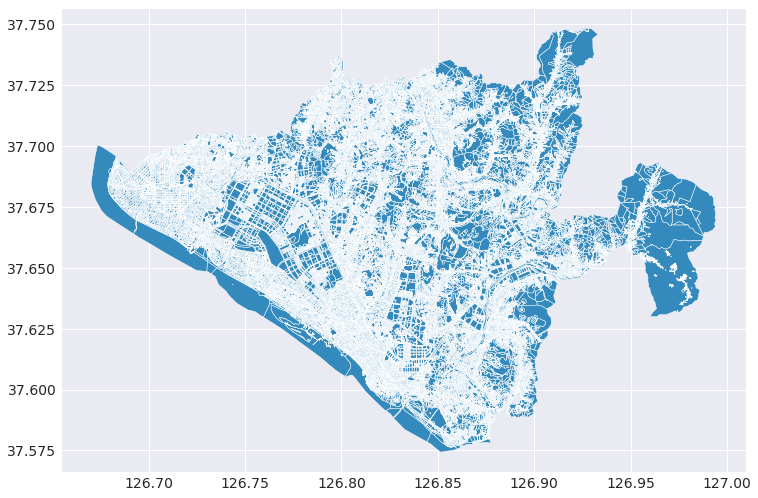

In [26]:
# 검출된 아웃라이어를 제거한다.
outlierList = [
          15096,
          38110,
          45014,
          45015,
          68191,
          114263,
          114266,
          150993,
          150994,
          150995,
          155565,
          155566,
          176546,
      ]

goyang_geo_gdf = goyang_geo_gdf.drop(index=outlierList)
goyang_geo_gdf.plot()

In [27]:
# 시군구 행정경계 데이터
administration_boundary_city_gdf.head()

,SIG_CD,SIG_KOR_NM,geometry
0,41281,고양시덕양구,"MULTIPOLYGON (((126.92910 37.74849, 126.92964 ..."
1,41285,고양시일산동구,"MULTIPOLYGON (((126.77762 37.67899, 126.77825 ..."
2,41287,고양시일산서구,"MULTIPOLYGON (((126.76703 37.70717, 126.76719 ..."


In [28]:
# geometry 완결성 검사
print("유효하지 않은 데이터 갯수 : ", administration_boundary_city_gdf.shape[0] - administration_boundary_city_gdf.geometry.is_valid.sum())

유효하지 않은 데이터 갯수 :  0


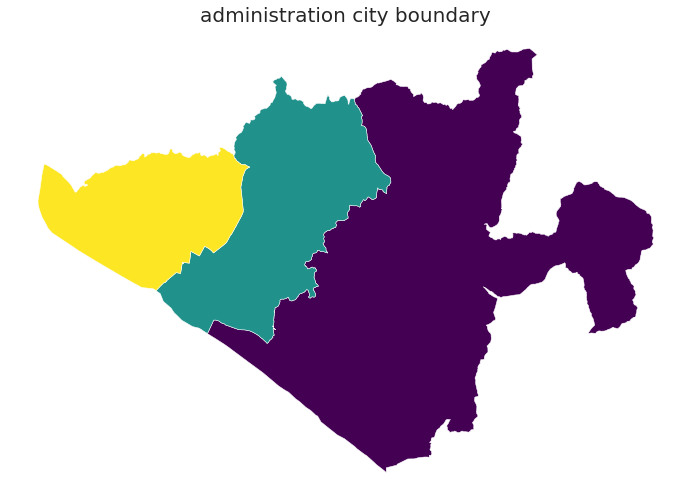

In [29]:
# 데이터를 plot해본다.
ax = administration_boundary_city_gdf.plot(column="SIG_CD", cmap='viridis')
ax.set_title("administration city boundary", fontsize=20)
ax.set_axis_off()
plt.show()

In [30]:
# 법정동 행정경계
legal_boundary_town_gdf.head()

,EMD_CD,EMD_KOR_NM,geometry
0,41281101,주교동,"MULTIPOLYGON (((126.81068 37.65820, 126.81069 ..."
1,41281102,원당동,"MULTIPOLYGON (((126.83321 37.68013, 126.83340 ..."
2,41281103,신원동,"MULTIPOLYGON (((126.86362 37.67729, 126.86364 ..."
3,41281104,원흥동,"MULTIPOLYGON (((126.85975 37.65081, 126.85990 ..."
4,41281105,도내동,"MULTIPOLYGON (((126.84806 37.62348, 126.84835 ..."


In [31]:
# Code를 기반으로 구 정보를 추가한다.
legal_boundary_town_gdf["GU_CD"] = legal_boundary_town_gdf["EMD_CD"].apply(lambda x: str(x)[:5])
legal_boundary_town_gdf["GU_NM"] = legal_boundary_town_gdf["GU_CD"].apply(lambda x: gu_legal_dic[f"{x}"])

legal_boundary_town_gdf.columns = ["DONG_CD",	"DONG_NM",	"geometry", "GU_CD", "GU_NM"]

legal_boundary_town_gdf = legal_boundary_town_gdf[["GU_CD", "GU_NM", "DONG_CD", "DONG_NM", "geometry"]]
legal_boundary_town_gdf.head()

,GU_CD,GU_NM,DONG_CD,DONG_NM,geometry
0,41281,덕양구,41281101,주교동,"MULTIPOLYGON (((126.81068 37.65820, 126.81069 ..."
1,41281,덕양구,41281102,원당동,"MULTIPOLYGON (((126.83321 37.68013, 126.83340 ..."
2,41281,덕양구,41281103,신원동,"MULTIPOLYGON (((126.86362 37.67729, 126.86364 ..."
3,41281,덕양구,41281104,원흥동,"MULTIPOLYGON (((126.85975 37.65081, 126.85990 ..."
4,41281,덕양구,41281105,도내동,"MULTIPOLYGON (((126.84806 37.62348, 126.84835 ..."


In [32]:
# geometry 완결성 검사
print("유효하지 않은 데이터 갯수 : ", legal_boundary_town_gdf.shape[0] - legal_boundary_town_gdf.geometry.is_valid.sum())

유효하지 않은 데이터 갯수 :  0


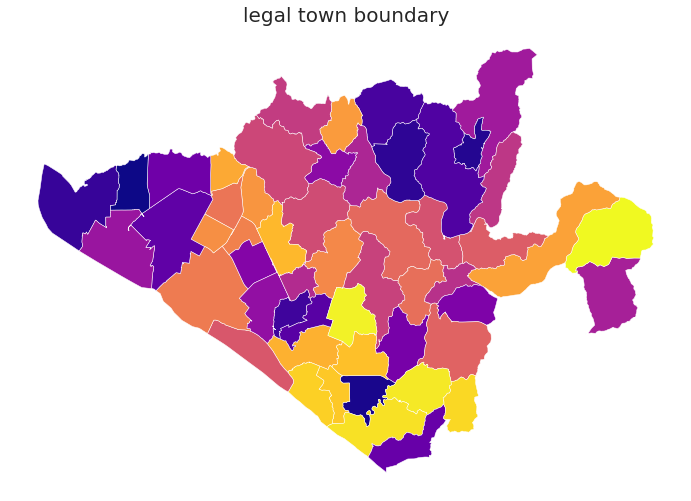

In [33]:
# 데이터를 plot해본다.
ax = legal_boundary_town_gdf.plot(column="DONG_NM", cmap='plasma')
ax.set_title("legal town boundary", fontsize=20)
ax.set_axis_off()
plt.show()

In [34]:
# 추후에 dissolve를 사용하여 통계량을 검증할 목적으로 테스트한다.
si_gdf = legal_boundary_town_gdf.dissolve(by='GU_NM').reset_index(drop=True) 
si_gdf.head()

,geometry,GU_CD,DONG_CD,DONG_NM
0,"POLYGON ((126.90089 37.61222, 126.90079 37.612...",41281,41281101,주교동
1,"POLYGON ((126.81107 37.65936, 126.81111 37.659...",41285,41285101,식사동
2,"POLYGON ((126.77186 37.67094, 126.77179 37.670...",41287,41287101,일산동


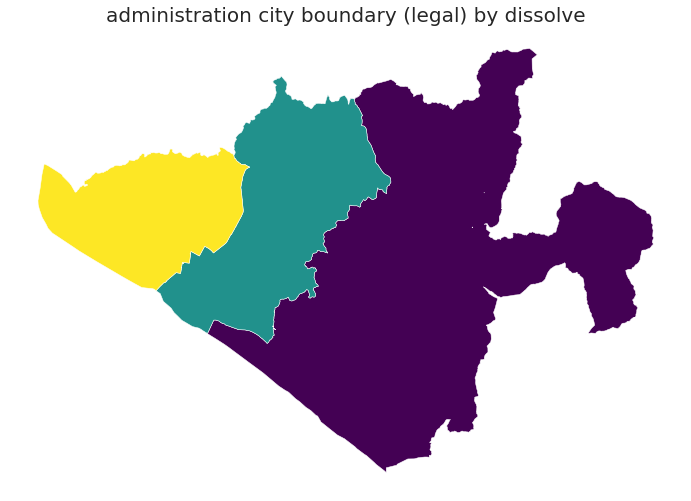

In [35]:
# Key는 CD로, 구역을 나누는 것은 NM으로 진행한다.
ax = si_gdf.plot(column="GU_CD", cmap='viridis')
ax.set_title("administration city boundary (legal) by dissolve", fontsize=20)
ax.set_axis_off()
plt.show()

In [36]:
# 행정동 행정경계
administration_boundary_town_gdf.head()

,행정동코드,행정동명,geometry
0,3110151,주교동,"MULTIPOLYGON (((126.83514 37.67683, 126.83517 ..."
1,3110152,원신동,"MULTIPOLYGON (((126.84983 37.68986, 126.84996 ..."
2,3110153,흥도동,"MULTIPOLYGON (((126.87615 37.64768, 126.87562 ..."
3,3110154,성사1동,"MULTIPOLYGON (((126.84898 37.66872, 126.84915 ..."
4,3110155,성사2동,"MULTIPOLYGON (((126.83502 37.65491, 126.83527 ..."


In [37]:
# Code를 기반으로 구 정보를 추가한다.
administration_boundary_town_gdf["GU_CD"] = administration_boundary_town_gdf["행정동코드"].apply(lambda x: str(x)[:5])
administration_boundary_town_gdf["GU_NM"] = administration_boundary_town_gdf["GU_CD"].apply(lambda x: gu_administration_dic[f"{x}"])

administration_boundary_town_gdf.columns = ["DONG_CD",	"DONG_NM",	"geometry", "GU_CD", "GU_NM"]

administration_boundary_town_gdf = administration_boundary_town_gdf[["GU_CD", "GU_NM", "DONG_CD", "DONG_NM", "geometry"]]
administration_boundary_town_gdf.head()

,GU_CD,GU_NM,DONG_CD,DONG_NM,geometry
0,31101,덕양구,3110151,주교동,"MULTIPOLYGON (((126.83514 37.67683, 126.83517 ..."
1,31101,덕양구,3110152,원신동,"MULTIPOLYGON (((126.84983 37.68986, 126.84996 ..."
2,31101,덕양구,3110153,흥도동,"MULTIPOLYGON (((126.87615 37.64768, 126.87562 ..."
3,31101,덕양구,3110154,성사1동,"MULTIPOLYGON (((126.84898 37.66872, 126.84915 ..."
4,31101,덕양구,3110155,성사2동,"MULTIPOLYGON (((126.83502 37.65491, 126.83527 ..."


In [38]:
# geometry 완결성 검사
print("잘못된 데이터 갯수 : ", administration_boundary_town_gdf.shape[0] - administration_boundary_town_gdf.geometry.is_valid.sum())

잘못된 데이터 갯수 :  7


In [39]:
# 오류가 있는 데이터를 검색한다.
administration_boundary_town_gdf.geometry[~administration_boundary_town_gdf.geometry.is_valid]

5     MULTIPOLYGON (((126.95736 37.69195, 126.95790 ...
10    MULTIPOLYGON (((126.81304 37.64460, 126.81364 ...
13    MULTIPOLYGON (((126.83030 37.62541, 126.83014 ...
19    MULTIPOLYGON (((126.82024 37.69395, 126.82026 ...
20    MULTIPOLYGON (((126.78349 37.69875, 126.78457 ...
22    MULTIPOLYGON (((126.79451 37.65875, 126.79451 ...
38    MULTIPOLYGON (((126.75385 37.70495, 126.75394 ...
Name: geometry, dtype: geometry

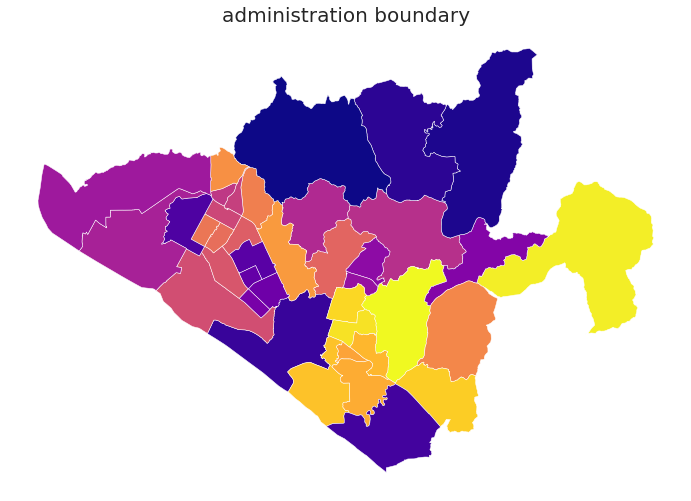

In [40]:
# 데이터를 plot해본다.
ax = administration_boundary_town_gdf.plot(column="DONG_NM", cmap='plasma')
ax.set_title("administration boundary", fontsize=20)
ax.set_axis_off()
plt.show()

살짝 데이터 토폴로지에 문제가 있는 것으로 보이나, 직접적으로 해당 데이터를 사용할 것이 아니기에 추후 처리는 하지 않았다.

## 1.4.4 인구 거주 분포도 로드

인구 거주 분포도를 로드하고, 각 구역의 인구 수를 알기 쉽게 시각화 한다.

<br>

|code definition|dataframe variable name|
|:-:|:-:|
| 인구(거주)분포도(100M_X_100M) | population_dist_gdf |
| 월간 인구통계 | population_statistics_df |
| 동기준 인구통계 | population_statistics_dong_df |

<br>
<br>



In [41]:
# 데이터 로드
population_dist_gdf = gpd.read_file(os.path.join(DATA_RAW_PATH, '인구(거주)분포도(100M X 100M).geojson'), encoding='cp949')
population_statistics_df = pd.read_csv(os.path.join(DATA_RAW_PATH, "인구통계.csv"))

In [42]:
# 좌표계 변경
population_dist_gdf = population_dist_gdf.set_crs(default_crs)
print("population_dist_gdf 현재 좌표계 :", population_dist_gdf.crs)
population_dist_gdf.head()

population_dist_gdf 현재 좌표계 : epsg:4326


,gid,val,geometry
0,다사268650,NaN,"MULTIPOLYGON (((126.66985 37.68162, 126.66984 ..."
1,다사268651,NaN,"MULTIPOLYGON (((126.66984 37.68252, 126.66983 ..."
2,다사268652,NaN,"MULTIPOLYGON (((126.66983 37.68342, 126.66982 ..."
3,다사268653,NaN,"MULTIPOLYGON (((126.66982 37.68432, 126.66981 ..."
4,다사268654,NaN,"MULTIPOLYGON (((126.66981 37.68522, 126.66980 ..."


In [43]:
# Nan은 거주인구가 0인 곳이다.
population_dist_gdf["val"] = population_dist_gdf["val"].fillna(0)

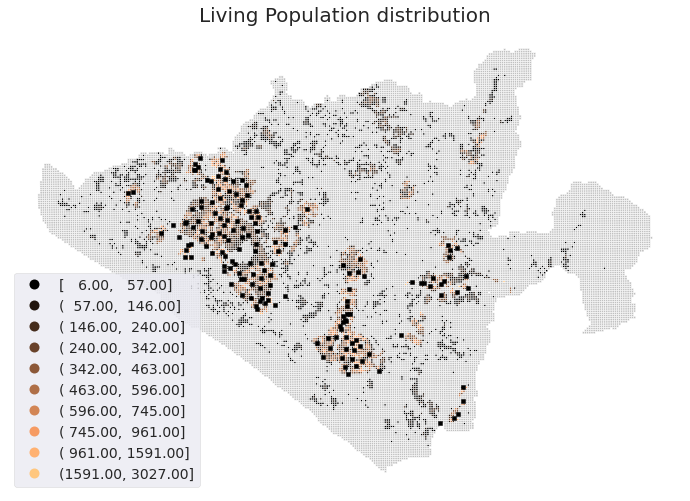

In [44]:
# 거주인구가 없는 곳과 있는 곳으로 나누어 시각화를 진행한다.
population_dist_not_zero_gdf = population_dist_gdf[population_dist_gdf["val"] > 0]
population_dist_zero_gdf = population_dist_gdf[population_dist_gdf["val"] == 0]

ax = population_dist_not_zero_gdf.plot( column="val", cmap='copper', scheme='Fisher_Jenks', legend=True, legend_kwds={'loc': 'lower left'}, k=10)
population_dist_zero_gdf.plot(color="silver", ax=ax)
station_df.plot(ax=ax, marker=",", color="k", markersize=10)
ax.set_title("Living Population distribution", fontsize=20)
ax.set_axis_off()
plt.show()

In [45]:
# 인구 통계 datatype 전처리
population_statistics_df["총인구수"] = population_statistics_df["총인구수"].apply(lambda x: int(x.replace(',' , '')))
population_statistics_df["세대수"] = population_statistics_df["세대수"].apply(lambda x: int(x.replace(',' , '')))
population_statistics_df["남자 인구수"] = population_statistics_df["남자 인구수"].apply(lambda x: int(x.replace(',' , '')))
population_statistics_df["여자 인구수"] = population_statistics_df["여자 인구수"].apply(lambda x: int(x.replace(',' , '')))

# 변수명 변경
population_statistics_df.rename(columns = {"행정구역": "EMD_KOR_NM", "조회기준": "CHECK_DATE", "총인구수": "TOTAL_POP", "세대수": "TOTAL_HOUSEHOLDS", "세대당 인구": "POP_PER_HOUSEHOLDS", "남자 인구수": "M_POP", "여자 인구수": "W_POP", "남여 비율": "MW_RATE"}, inplace = True)
population_statistics_df.head()

,EMD_KOR_NM,CHECK_DATE,TOTAL_POP,TOTAL_HOUSEHOLDS,POP_PER_HOUSEHOLDS,M_POP,W_POP,MW_RATE
0,경기도 고양시 (4128000000),2017년01월,1040648,402440,2.59,511353,529295,0.97
1,경기도 고양시 (4128000000),2017년02월,1040483,403042,2.58,511266,529217,0.97
2,경기도 고양시 (4128000000),2017년03월,1040482,403443,2.58,511182,529300,0.97
3,경기도 고양시 (4128000000),2017년04월,1040608,403933,2.58,511225,529383,0.97
4,경기도 고양시 (4128000000),2017년05월,1040892,404603,2.57,511347,529545,0.97


## 1.4.5 빌딩 연면적 분포도 로드

빌딩 연면적 분포도를 로드하고, 각 구역의 연면적을 알기 쉽게 시각화 한다.

<br>

|code definition|dataframe variable name|
|:-:|:-:|
| 일반건물 분포도(100M X 100M) | building_area_gdf |

<br>
<br>

In [46]:
# 건물 분포도 로드
building_area_gdf = gpd.read_file(os.path.join(DATA_RAW_PATH, '일반건물 분포도(100M X 100M).geojson'), encoding='cp949')

In [47]:
# 좌표계 변경
building_area_gdf = building_area_gdf.set_crs(default_crs)
print("building_area_gdf 현재 좌표계 :", building_area_gdf.crs)

building_area_gdf 현재 좌표계 : epsg:4326


In [48]:
building_area_gdf.head()

,gid,val,geometry
0,다사268650,NaN,"MULTIPOLYGON (((126.66985 37.68162, 126.66984 ..."
1,다사268651,NaN,"MULTIPOLYGON (((126.66984 37.68252, 126.66983 ..."
2,다사268652,NaN,"MULTIPOLYGON (((126.66983 37.68342, 126.66982 ..."
3,다사268653,NaN,"MULTIPOLYGON (((126.66982 37.68432, 126.66981 ..."
4,다사268654,NaN,"MULTIPOLYGON (((126.66981 37.68522, 126.66980 ..."


In [49]:
# Nan은 연면적이 0인 곳이다.
building_area_gdf["val"] = building_area_gdf["val"].fillna(0)
building_area_gdf.head()

,gid,val,geometry
0,다사268650,0.0,"MULTIPOLYGON (((126.66985 37.68162, 126.66984 ..."
1,다사268651,0.0,"MULTIPOLYGON (((126.66984 37.68252, 126.66983 ..."
2,다사268652,0.0,"MULTIPOLYGON (((126.66983 37.68342, 126.66982 ..."
3,다사268653,0.0,"MULTIPOLYGON (((126.66982 37.68432, 126.66981 ..."
4,다사268654,0.0,"MULTIPOLYGON (((126.66981 37.68522, 126.66980 ..."


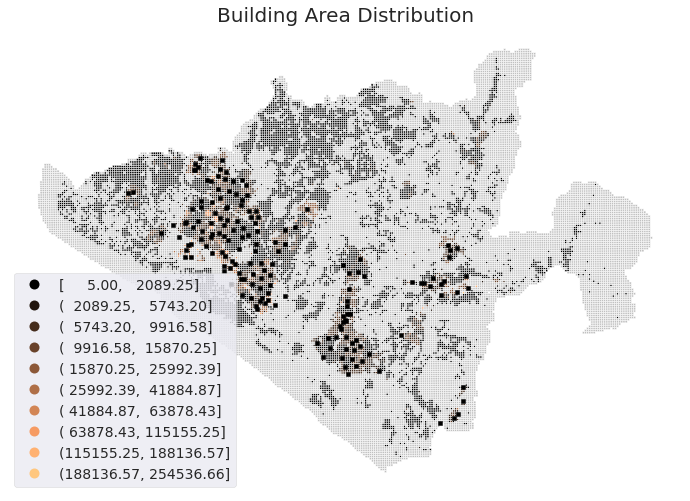

In [50]:
# 빌딩 면적 분포
building_area_not_zero_gdf = building_area_gdf[building_area_gdf["val"] > 0]
building_area_zero_gdf = building_area_gdf[building_area_gdf["val"] == 0]

ax = building_area_not_zero_gdf.plot( column="val", cmap='copper', scheme='Fisher_Jenks', legend=True, legend_kwds={'loc': 'lower left'}, k=10)
building_area_zero_gdf.plot(color="silver", ax=ax)
station_df.plot(ax=ax, marker=",", color="k", markersize=10)
ax.set_title("Building Area Distribution", fontsize=20)
ax.set_axis_off()
plt.show()

## 1.4.6 행사장, 박물관, 지하철역, 버스정류장, 학교, 체육시설 , 주차장 위치 Table

주어진 데이터를 기반으로 아래와 같은 table을 만든다.

<br>

|code definition|dataframe variable name|
|:-:|:-:|
| 행사장 공간정보| eventhall_space_df |
| 공연장 공간정보 | concerthall_space_df |
| 박물관/미술관 공간정보 | museum_space_df |
| 버스정류장 정보 | busstop_df |
| 지하철 역 정보 | subway_space_df |
| 공공시설 정보 | city_plan_public_gdf |
| 체육시설 정보 | sport_complex_info_df |
| 주차장 정보 | parking_df |

<br>
<br>


### 1.4.6.1 행사장/공연장/박물관&미술관

|NAME|LAT|LON|geometry|
|:-:|:-:|:-:|:-:|
|KINTEX|	37.669028|	126.746184|	POINT (126.74618 37.66903)|



In [51]:
# 행사장 로드
eventhall_space_df = pd.read_csv(os.path.join(DATA_RAW_PATH, "행사장_공간정보.csv"))
culture_complex_info_df = pd.read_csv(os.path.join(DATA_RAW_PATH, "고양시 공연장 박물관 정보.csv"))

In [52]:
# column명 변경
eventhall_space_df.columns = ['NAME', 'LAT', 'LON']
eventhall_space_df.head()

,NAME,LAT,LON
0,KINTEX,37.669028,126.746184
1,꽃 박람회,37.655155,126.767543


In [53]:
# LAT, LON 를 geometry point 객체로 변환하고 변수로 추가한다.
import pyproj
from fiona.crs import from_epsg
coulumns = ['NAME', 'LAT', 'LON']
eventhall_space_df = gpd.GeoDataFrame(eventhall_space_df[coulumns], geometry=gpd.points_from_xy(eventhall_space_df.LON, eventhall_space_df.LAT))
eventhall_space_df.crs = default_crs

eventhall_space_df.head()

,NAME,LAT,LON,geometry
0,KINTEX,37.669028,126.746184,POINT (126.74618 37.66903)
1,꽃 박람회,37.655155,126.767543,POINT (126.76754 37.65516)


In [54]:
culture_complex_info_df.sample(5)

,servicetype,place_nm,X,Y
1,공연장,행주아트홀,126.822885,37.602563
27,공연장,토당청소년수련관,126.829787,37.625808
14,박물관/미술관,증권박물관,126.786221,37.638689
12,박물관/미술관,장천 꽃 박물관,126.824826,37.651784
33,박물관/미술관,고양가와지볍씨박물관,126.869282,37.649587


In [55]:
# 공연장 정보만 새로운 테이블로 관리한다.
concerthall_space_df = culture_complex_info_df[culture_complex_info_df["servicetype"] == "공연장"]
concerthall_space_df.columns = ["servicetype", "NAME", "LON", "LAT"]
concerthall_space_df.head()

,servicetype,NAME,LON,LAT
0,공연장,활주로7080 공연장,126.767487,37.663502
1,공연장,행주아트홀,126.822885,37.602563
2,공연장,올리브,126.767880,37.663102
3,공연장,3 NEW THEATRE,126.725248,37.690864
4,공연장,터 시어터,126.782173,37.659433


In [56]:
# LAT, LON 를 geometry point 객체로 변환하고 변수로 추가한다.
import pyproj
from fiona.crs import from_epsg
coulumns = ['NAME', 'LAT', 'LON']
concerthall_space_df = gpd.GeoDataFrame(concerthall_space_df[coulumns], geometry=gpd.points_from_xy(concerthall_space_df.LON, concerthall_space_df.LAT))
concerthall_space_df.crs = default_crs

concerthall_space_df.head()

,NAME,LAT,LON,geometry
0,활주로7080 공연장,37.663502,126.767487,POINT (126.76749 37.66350)
1,행주아트홀,37.602563,126.822885,POINT (126.82288 37.60256)
2,올리브,37.663102,126.767880,POINT (126.76788 37.66310)
3,3 NEW THEATRE,37.690864,126.725248,POINT (126.72525 37.69086)
4,터 시어터,37.659433,126.782173,POINT (126.78217 37.65943)


In [57]:
# 박물관/미술관 정보만 새로운 테이블로 관리한다.
museum_space_df = culture_complex_info_df[culture_complex_info_df["servicetype"] == "박물관/미술관"]
museum_space_df.columns = ["servicetype", "NAME", "LON", "LAT"]
museum_space_df.head()

,servicetype,NAME,LON,LAT
11,박물관/미술관,배다리박물관,126.846280,37.658470
12,박물관/미술관,장천 꽃 박물관,126.824826,37.651784
13,박물관/미술관,(주)일산씨월드-한화 아쿠아플라넷 일산,126.755455,37.663520
14,박물관/미술관,증권박물관,126.786221,37.638689
15,박물관/미술관,테마동물원Zoozoo,126.854966,37.689298


In [58]:
# LAT, LON 를 geometry point 객체로 변환하고 변수로 추가한다.
import pyproj
from fiona.crs import from_epsg
coulumns = ['NAME', 'LAT', 'LON']
museum_space_df = gpd.GeoDataFrame(museum_space_df[coulumns], geometry=gpd.points_from_xy(museum_space_df.LON, museum_space_df.LAT))
museum_space_df.crs = default_crs

museum_space_df.head()

,NAME,LAT,LON,geometry
11,배다리박물관,37.658470,126.846280,POINT (126.84628 37.65847)
12,장천 꽃 박물관,37.651784,126.824826,POINT (126.82483 37.65178)
13,(주)일산씨월드-한화 아쿠아플라넷 일산,37.663520,126.755455,POINT (126.75546 37.66352)
14,증권박물관,37.638689,126.786221,POINT (126.78622 37.63869)
15,테마동물원Zoozoo,37.689298,126.854966,POINT (126.85497 37.68930)



### 1.4.6.2 버스 정류장


|STATION_ID	|STATION_NM	|LAT	|LON	|geometry	|GETON_CNT|
|:-:|:-:|:-:|:-:|:-:|:-:|
|219000619	|신일비즈니스고등학교	|37.683296	|126.760592	|POINT (126.76059 37.68330)	|3496.0|


In [59]:
# 버스 정류장 로드
busstop_df = pd.read_csv(os.path.join(DATA_RAW_PATH, "고양시 버스정류소.csv"))

# 최근 1년치 고양시 버스 정류장별 승하차 정보이다.
busstop_getin_df = pd.read_csv(os.path.join(DATA_RAW_PATH, "버스 정류장별 승하차 정보.csv"))

In [60]:
busstop_df.columns = ["STATION_NM",	"STATION_ID", "LON", "LAT"]
busstop_df = busstop_df[["STATION_ID", "STATION_NM", "LAT", "LON"]]
print(busstop_df.shape)
busstop_df.head()

(2232, 4)


,STATION_ID,STATION_NM,LAT,LON
0,219000619,신일비즈니스고등학교,37.683296,126.760592
1,219000587,중앙공원삼거리,37.688934,126.776989
2,219000624,문촌마을14.19단지,37.671011,126.752451
3,219000623,문촌마을14.19단지,37.671448,126.752452
4,219000586,중앙공원삼거리,37.688771,126.777412


In [61]:
# LAT, LON 를 geometry point 객체로 변환하고 변수로 추가한다.
import pyproj
from fiona.crs import from_epsg
coulumns = ["STATION_ID", "STATION_NM", "LAT", "LON"]
busstop_df = gpd.GeoDataFrame(busstop_df[coulumns], geometry=gpd.points_from_xy(busstop_df.LON, busstop_df.LAT))
busstop_df.crs = default_crs

busstop_df.head()

,STATION_ID,STATION_NM,LAT,LON,geometry
0,219000619,신일비즈니스고등학교,37.683296,126.760592,POINT (126.76059 37.68330)
1,219000587,중앙공원삼거리,37.688934,126.776989,POINT (126.77699 37.68893)
2,219000624,문촌마을14.19단지,37.671011,126.752451,POINT (126.75245 37.67101)
3,219000623,문촌마을14.19단지,37.671448,126.752452,POINT (126.75245 37.67145)
4,219000586,중앙공원삼거리,37.688771,126.777412,POINT (126.77741 37.68877)


In [62]:
# 승하차 데이터 보기
print(busstop_getin_df.shape)
busstop_getin_df.head()

(2888, 3)


,STATION_ID,STATION_NM,GETON_CNT
0,218001046,화정역3호선,229091
1,218001083,원당역,219186
2,218000974,화정역3호선,197084
3,219000193,대화역,191696
4,219000193,대화역,169990


In [63]:
# 정류장 데이터에 합치기
busstop_getin_df = busstop_getin_df.groupby(['STATION_ID', 'STATION_NM'])['GETON_CNT'].sum()
busstop_getin_df = busstop_getin_df.reset_index()
print(busstop_getin_df.shape)
busstop_getin_df.head()

(2145, 3)


,STATION_ID,STATION_NM,GETON_CNT
0,218000001,고개,1
1,218000002,고개,13
2,218000003,양조장입구,844
3,218000004,원당중학교,1368
4,218000005,원당중학교,2492


In [64]:
# 버스 정류장 데이터에 승하차 데이터를 추가한다.
busstop_df = pd.merge(busstop_df, busstop_getin_df, on = ["STATION_ID", "STATION_NM"], how = "left")
print(busstop_df.shape)
busstop_df.head()

(2232, 6)


,STATION_ID,STATION_NM,LAT,LON,geometry,GETON_CNT
0,219000619,신일비즈니스고등학교,37.683296,126.760592,POINT (126.76059 37.68330),3496.0
1,219000587,중앙공원삼거리,37.688934,126.776989,POINT (126.77699 37.68893),2666.0
2,219000624,문촌마을14.19단지,37.671011,126.752451,POINT (126.75245 37.67101),NaN
3,219000623,문촌마을14.19단지,37.671448,126.752452,POINT (126.75245 37.67145),298.0
4,219000586,중앙공원삼거리,37.688771,126.777412,POINT (126.77741 37.68877),25.0



### 1.4.6.3 지하철 역

|RAIL_NM	|STATION_NM	|LOT_NUM_ADDR	|ROAD_NM_ADDR	|LON	|LAT	|geometry	|IN	|OUT	|TOTAL	|NET_TOTAL|
|:-:|:-:|:-:|:-:|:-:|:-:|:-:|:-:|:-:|:-:|:-:|
|3호선	|대화	|경기도 고양시 일산서구 대화동 2221	|경기도 고양시 일산서구 중앙로 지하 1569|	37.675846	|126.747206	|POINT (37.676 126.747)	|5547363.0	|4460662.0 |10008025.0	|1086701.0|


In [65]:
# 지하철 역 로드
subway_space_df = pd.read_csv(os.path.join(DATA_RAW_PATH, "전철역_공간정보.csv"))
subway_getin_df = pd.read_csv(os.path.join(DATA_RAW_PATH, "지하철 역별 이용객수.csv"))

In [66]:
# 변수명 변경
subway_space_df.columns = ["RAIL_NM", "STATION_NM", "LOT_NUM_ADDR", "ROAD_NM_ADDR", "LON", "LAT"]
subway_space_df.head()

,RAIL_NM,STATION_NM,LOT_NUM_ADDR,ROAD_NM_ADDR,LON,LAT
0,3호선,대곡,경기도 고양시 덕양구 대장동 420-1,경기도 고양시 덕양구 대주로107번길 71-81,126.809614,37.632306
1,3호선,대화,경기도 고양시 일산서구 대화동 2221,경기도 고양시 일산서구 중앙로 지하 1569,126.747206,37.675846
2,경의중앙,일산,경기도 고양시 일산서구 일산동 655-691,경기도 고양시 일산서구 경의로 672,126.770067,37.682007
3,3호선,백석,경기도 고양시 일산동구 백석동 1538,경기도 고양시 일산동구 중앙로 지하 1042,126.788148,37.642953
4,경의중앙,대곡,경기도 고양시 덕양구 대장동 420-1,경기도 고양시 덕양구 대주로 107번길 71-81,126.811047,37.631615


In [67]:
# LAT, LON 를 geometry point 객체로 변환하고 변수로 추가한다.
import pyproj
from fiona.crs import from_epsg
coulumns = ["RAIL_NM", "STATION_NM", "LOT_NUM_ADDR", "ROAD_NM_ADDR", "LAT", "LON"]
subway_space_df = gpd.GeoDataFrame(subway_space_df[coulumns], geometry=gpd.points_from_xy(subway_space_df.LON, subway_space_df.LAT))
subway_space_df = subway_space_df.set_crs(default_crs)
print(subway_space_df.shape)
subway_space_df.head()

(21, 7)


,RAIL_NM,STATION_NM,LOT_NUM_ADDR,ROAD_NM_ADDR,LAT,LON,geometry
0,3호선,대곡,경기도 고양시 덕양구 대장동 420-1,경기도 고양시 덕양구 대주로107번길 71-81,37.632306,126.809614,POINT (126.80961 37.63231)
1,3호선,대화,경기도 고양시 일산서구 대화동 2221,경기도 고양시 일산서구 중앙로 지하 1569,37.675846,126.747206,POINT (126.74721 37.67585)
2,경의중앙,일산,경기도 고양시 일산서구 일산동 655-691,경기도 고양시 일산서구 경의로 672,37.682007,126.770067,POINT (126.77007 37.68201)
3,3호선,백석,경기도 고양시 일산동구 백석동 1538,경기도 고양시 일산동구 중앙로 지하 1042,37.642953,126.788148,POINT (126.78815 37.64295)
4,경의중앙,대곡,경기도 고양시 덕양구 대장동 420-1,경기도 고양시 덕양구 대주로 107번길 71-81,37.631615,126.811047,POINT (126.81105 37.63161)


In [68]:
# 대곡역 2개 중 3호선 라인을 지웠다. 
subway_space_df = subway_space_df.drop([0])
subway_space_df = subway_space_df.reset_index(drop=True)
print(subway_space_df.shape)
subway_space_df.head()

(20, 7)


,RAIL_NM,STATION_NM,LOT_NUM_ADDR,ROAD_NM_ADDR,LAT,LON,geometry
0,3호선,대화,경기도 고양시 일산서구 대화동 2221,경기도 고양시 일산서구 중앙로 지하 1569,37.675846,126.747206,POINT (126.74721 37.67585)
1,경의중앙,일산,경기도 고양시 일산서구 일산동 655-691,경기도 고양시 일산서구 경의로 672,37.682007,126.770067,POINT (126.77007 37.68201)
2,3호선,백석,경기도 고양시 일산동구 백석동 1538,경기도 고양시 일산동구 중앙로 지하 1042,37.642953,126.788148,POINT (126.78815 37.64295)
3,경의중앙,대곡,경기도 고양시 덕양구 대장동 420-1,경기도 고양시 덕양구 대주로 107번길 71-81,37.631615,126.811047,POINT (126.81105 37.63161)
4,경의중앙,강매,경기도 고양시 덕양구 행신동 1115-1,경기도 고양시 덕양구 소원로 202,37.612290,126.844436,POINT (126.84444 37.61229)


In [69]:
# 화전역은 한국 항공대로 표현되어 있다.
subway_space_df[subway_space_df["STATION_NM"]== "화전(한국항공대)"]

,RAIL_NM,STATION_NM,LOT_NUM_ADDR,ROAD_NM_ADDR,LAT,LON,geometry
9,경의중앙,화전(한국항공대),경기도 고양시 덕양구 화전동 183-10,경기도 고양시 덕양구 화랑로 53,37.603298,126.867947,POINT (126.86795 37.60330)


In [70]:
# 화전(한국항공대)을 화전으로 바꾼다.
subway_space_df.loc[9, "STATION_NM"] = "화전"
subway_space_df[subway_space_df["STATION_NM"]== "화전"]

,RAIL_NM,STATION_NM,LOT_NUM_ADDR,ROAD_NM_ADDR,LAT,LON,geometry
9,경의중앙,화전,경기도 고양시 덕양구 화전동 183-10,경기도 고양시 덕양구 화랑로 53,37.603298,126.867947,POINT (126.86795 37.60330)


In [71]:
# 승하차 데이터의 전체 합계만 가져온다.
subway_getin_df = subway_getin_df.iloc[:, [1,4,12]]
subway_getin_df.head()

,역명,승하차구분,모든요일_합계
0,지축,승차,476014
1,지축,하차,536446
2,지축,총승하차,1012460
3,화전,승차,928786
4,화전,하차,870375


In [72]:
# 지축역은 분리해서 관리했나보다. 이 부분을 병합할 필요성이 있다.
subway_getin_df[subway_getin_df["역명"] == "지축"]

,역명,승하차구분,모든요일_합계
0,지축,승차,476014
1,지축,하차,536446
2,지축,총승하차,1012460
33,지축,승차,85110
34,지축,하차,85268
35,지축,총승하차,170378


In [73]:
# 지하철 역에 관해 중복 제거한 승하차 데이터를 만들기 위한 빈 테이블을 만든다.
subway_getin_temp_df = pd.DataFrame(np.zeros((int(len(subway_getin_df)/3), 5)), columns= ["STATION_NM", "IN", "OUT", "TOTAL", "NET_TOTAL"])
len(subway_getin_temp_df)

21

In [74]:
# 지하철 역에 관해 중복을 제거한 승하차 데이터를 만든다.
for i in range(len(subway_getin_temp_df)):
  subway_getin_temp_df["STATION_NM"][i] = subway_getin_df.iloc[i*3,0]
  subway_getin_temp_df["IN"][i] = subway_getin_df.iloc[i*3,2]
  subway_getin_temp_df["OUT"][i] = subway_getin_df.iloc[i*3+1,2]
  subway_getin_temp_df["TOTAL"][i] = subway_getin_df.iloc[i*3 + 2,2]
  subway_getin_temp_df["NET_TOTAL"][i] = (subway_getin_df.iloc[i*3,2] - subway_getin_df.iloc[i*3 + 1,2])
  
subway_getin_temp_df.loc[21] = subway_getin_temp_df[subway_getin_temp_df["STATION_NM"] == "지축"].sum()
subway_getin_temp_df.iloc[21,0] = "지축역"
subway_getin_temp_df = subway_getin_temp_df.drop(index=[0,11])
subway_getin_temp_df = subway_getin_temp_df.reset_index(drop=True)
print(subway_getin_temp_df.shape)
subway_getin_temp_df.head()

(20, 5)


,STATION_NM,IN,OUT,TOTAL,NET_TOTAL
0,화전,928786.0,870375.0,1799161.0,58411.0
1,강매,993149.0,866571.0,1859720.0,126578.0
2,행신,2843071.0,2725061.0,5568132.0,118010.0
3,능곡,1372493.0,1265362.0,2637855.0,107131.0
4,곡산,202878.0,201535.0,404413.0,1343.0


In [75]:
# 최종적으로 승하차 데이터를 지하철 위치 데이터에 합한다.
subway_space_df = pd.merge(subway_space_df, subway_getin_temp_df, how="left")
subway_space_df.head()

,RAIL_NM,STATION_NM,LOT_NUM_ADDR,ROAD_NM_ADDR,LAT,LON,geometry,IN,OUT,TOTAL,NET_TOTAL
0,3호선,대화,경기도 고양시 일산서구 대화동 2221,경기도 고양시 일산서구 중앙로 지하 1569,37.675846,126.747206,POINT (126.74721 37.67585),5547363.0,4460662.0,10008025.0,1086701.0
1,경의중앙,일산,경기도 고양시 일산서구 일산동 655-691,경기도 고양시 일산서구 경의로 672,37.682007,126.770067,POINT (126.77007 37.68201),3430691.0,3377383.0,6808074.0,53308.0
2,3호선,백석,경기도 고양시 일산동구 백석동 1538,경기도 고양시 일산동구 중앙로 지하 1042,37.642953,126.788148,POINT (126.78815 37.64295),4271531.0,4261695.0,8533226.0,9836.0
3,경의중앙,대곡,경기도 고양시 덕양구 대장동 420-1,경기도 고양시 덕양구 대주로 107번길 71-81,37.631615,126.811047,POINT (126.81105 37.63161),619157.0,475595.0,1094752.0,143562.0
4,경의중앙,강매,경기도 고양시 덕양구 행신동 1115-1,경기도 고양시 덕양구 소원로 202,37.612290,126.844436,POINT (126.84444 37.61229),993149.0,866571.0,1859720.0,126578.0



### 1.4.6.4 공공시설

|TYPE	|AREA	|LENGTH	|geometry|
|:-:|:-:|:-:|:-:|
|기타 |사회복지시설	|2627	|211	|MULTIPOLYGON (((126.86736 37.62940, 126.86761 ...|




In [76]:
# 공공시설 로드
city_plan_public_gdf = gpd.read_file(os.path.join(DATA_RAW_PATH, '도시계획(공공문화제육시설).geojson'), encoding='cp949')

In [77]:
# 좌표계 변경
city_plan_public_gdf = city_plan_public_gdf.set_crs(default_crs)
print("city_plan_public_gdf 현재 좌표계 :", city_plan_public_gdf.crs)

# 데이터 확인
print(city_plan_public_gdf.shape)
city_plan_public_gdf.head()

city_plan_public_gdf 현재 좌표계 : epsg:4326
(408, 4)


,DGM_NM,DGM_AR,DGM_LT,geometry
0,기타 사회복지시설,2627,211,"MULTIPOLYGON (((126.86736 37.62940, 126.86761 ..."
1,초등학교,13070,461,"MULTIPOLYGON (((126.90542 37.71515, 126.90619 ..."
2,기타 사회복지시설,560,95,"MULTIPOLYGON (((126.78826 37.67892, 126.78836 ..."
3,초등학교,12000,444,"MULTIPOLYGON (((126.81611 37.68054, 126.81659 ..."
4,유치원,3000,219,"MULTIPOLYGON (((126.81012 37.68488, 126.81062 ..."


In [78]:
# 변수명 변경
city_plan_public_gdf.columns = ["TYPE", "AREA", "LENGTH", 'geometry']
city_plan_public_gdf.head()

,TYPE,AREA,LENGTH,geometry
0,기타 사회복지시설,2627,211,"MULTIPOLYGON (((126.86736 37.62940, 126.86761 ..."
1,초등학교,13070,461,"MULTIPOLYGON (((126.90542 37.71515, 126.90619 ..."
2,기타 사회복지시설,560,95,"MULTIPOLYGON (((126.78826 37.67892, 126.78836 ..."
3,초등학교,12000,444,"MULTIPOLYGON (((126.81611 37.68054, 126.81659 ..."
4,유치원,3000,219,"MULTIPOLYGON (((126.81012 37.68488, 126.81062 ..."


In [79]:
# 공공 시설에 해당하는 유형은 다음과 같다
city_plan_public_gdf["TYPE"].unique()

array(['기타 사회복지시설', '초등학교', '유치원', '기타 체육시설', '중학교', '기타 도서관시설', '청사(국가)',
       '고등학교', '공공체육시설', '기타 공공청사시설', '특수학교', '각종학교', '기타 공공직업훈련시설', '대학',
       '기타 운동장시설', '지방자치단체', '골프장', '기타 연구시설', '기타청소년수련시설', '기타 문화시설',
       '공관', '박물관', '기타 학교시설', '종합운동장'], dtype=object)

<AxesSubplot:>

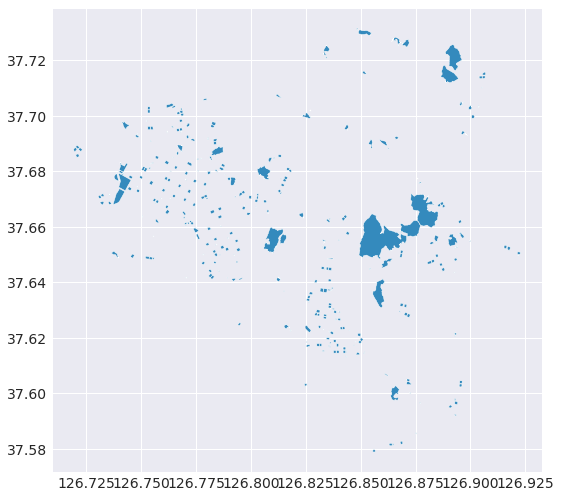

In [80]:
# 이를 간단하게 plot한다. 골고루 분포되어 있다.
city_plan_public_gdf.plot()


### 1.4.6.5 체육 시설

|TYPE	|NAME	|LAT	|LON	|geometry|
|:-:|:-:|:-:|:-:|:-:|
|육상	|고양종합운동장(주,보조)	|37.675787	|126.742594	|POINT (126.74259 37.67579)|


In [81]:
# 체육시설을 로드한다.
sport_complex_info_df = pd.read_csv(os.path.join(DATA_RAW_PATH, "고양시 체육시설 현황 정보.csv"))

In [82]:
# 필요한 변수만을 가져온다.
sport_complex_info_df = sport_complex_info_df[["GBN", "FAC_NAME", "X", "Y"]]
sport_complex_info_df.head()

,GBN,FAC_NAME,X,Y
0,육상,"고양종합운동장(주,보조)",126.742594,37.675787
1,육상,어울림 별무리 운동장,126.834639,37.649847
2,축구장,"고양종합운동장 축구장(주,보조)",126.742594,37.675787
3,축구장,백석공원 축구장,126.794876,37.645546
4,축구장,중산중앙 근린공원축구장,126.778620,37.691654


In [83]:
# 변수명을 변경한다.
sport_complex_info_df.columns = ["TYPE", "NAME", "LON", "LAT"]
sport_complex_info_df.head()

,TYPE,NAME,LON,LAT
0,육상,"고양종합운동장(주,보조)",126.742594,37.675787
1,육상,어울림 별무리 운동장,126.834639,37.649847
2,축구장,"고양종합운동장 축구장(주,보조)",126.742594,37.675787
3,축구장,백석공원 축구장,126.794876,37.645546
4,축구장,중산중앙 근린공원축구장,126.778620,37.691654


In [84]:
# LAT, LON 를 geometry point 객체로 변환하고 변수로 추가한다.
import pyproj
from fiona.crs import from_epsg
coulumns = ["TYPE", "NAME", "LAT", "LON"]
sport_complex_info_df = gpd.GeoDataFrame(sport_complex_info_df[coulumns], geometry=gpd.points_from_xy(sport_complex_info_df.LON, sport_complex_info_df.LAT))
sport_complex_info_df.crs = default_crs

sport_complex_info_df.head()

,TYPE,NAME,LAT,LON,geometry
0,육상,"고양종합운동장(주,보조)",37.675787,126.742594,POINT (126.74259 37.67579)
1,육상,어울림 별무리 운동장,37.649847,126.834639,POINT (126.83464 37.64985)
2,축구장,"고양종합운동장 축구장(주,보조)",37.675787,126.742594,POINT (126.74259 37.67579)
3,축구장,백석공원 축구장,37.645546,126.794876,POINT (126.79488 37.64555)
4,축구장,중산중앙 근린공원축구장,37.691654,126.778620,POINT (126.77862 37.69165)



### 1.4.6.6 주차장

|NAME	|ROAD_NM_ADDR	|LOT_NUM_ADDR	|SPACE	|LON	|LAT	|geometry|
|:-:|:-:|:-:|:-:|:-:|:-:|:-:|
|고양시청 부설주차장	|경기도 고양시 덕양구 고양시청로10	|경기도 고양시 덕양구 주교동 600|	140	|126.832072	|37.658042	|POINT (126.83207 37.65804)|



In [85]:
# 주차장 데이터 로드
parking_df = pd.read_csv(os.path.join(DATA_RAW_PATH, "주차장정보.csv"))

In [86]:
# 변수명을 변경한다.
parking_df.columns = ["NAME", "ROAD_NM_ADDR", "LOT_NUM_ADDR", "SPACE", "LON", "LAT"]
parking_df.head()

,NAME,ROAD_NM_ADDR,LOT_NUM_ADDR,SPACE,LON,LAT
0,고양시청 부설주차장,경기도 고양시 덕양구 고양시청로10,경기도 고양시 덕양구 주교동 600,140,126.832072,37.658042
1,고양제1,경기도 고양시 덕양구 벽제관로 8,경기도 고양시 덕양구 고양동 195-2,94,126.903861,37.703783
2,고양제2,경기도 고양시 덕양구 혜음로 103,경기도 고양시 덕양구 고양동 444-1,31,126.905347,37.710213
3,노상 1권역,경기도 고양시 덕양구 고양시청로 10,경기도 고양시 덕양구 주교동 600,97,126.831960,37.658414
4,노상 3권역,경기도 고양시 덕양구 은빛로 39,경기도 고양시 덕양구 화정동 909,123,126.832173,37.638096


In [87]:
# LAT, LON 를 geometry point 객체로 변환하고 변수로 추가한다.
import pyproj
from fiona.crs import from_epsg
coulumns = ["NAME", "ROAD_NM_ADDR", "LOT_NUM_ADDR", "SPACE", "LON", "LAT"]
parking_df = gpd.GeoDataFrame(parking_df[coulumns], geometry=gpd.points_from_xy(parking_df.LON, parking_df.LAT))
parking_df.crs = default_crs

parking_df.head()

,NAME,ROAD_NM_ADDR,LOT_NUM_ADDR,SPACE,LON,LAT,geometry
0,고양시청 부설주차장,경기도 고양시 덕양구 고양시청로10,경기도 고양시 덕양구 주교동 600,140,126.832072,37.658042,POINT (126.83207 37.65804)
1,고양제1,경기도 고양시 덕양구 벽제관로 8,경기도 고양시 덕양구 고양동 195-2,94,126.903861,37.703783,POINT (126.90386 37.70378)
2,고양제2,경기도 고양시 덕양구 혜음로 103,경기도 고양시 덕양구 고양동 444-1,31,126.905347,37.710213,POINT (126.90535 37.71021)
3,노상 1권역,경기도 고양시 덕양구 고양시청로 10,경기도 고양시 덕양구 주교동 600,97,126.831960,37.658414,POINT (126.83196 37.65841)
4,노상 3권역,경기도 고양시 덕양구 은빛로 39,경기도 고양시 덕양구 화정동 909,123,126.832173,37.638096,POINT (126.83217 37.63810)


## 1.4.7 건물 / 도로 / 인도 데이터 로드

|code definition|dataframe variable name|
|:-:|:-:|
| 도로명주소_건물 정보| address_building_gdf |
| 도시계획(교통시설) | address_road_gdf |
| 고양시_인도 | sidewalk_gdf |


<br>



### 1.4.7.1 도로명 주소 건물


|BDTYP_CD	|BDTYP_MN	|BULD_NM1	|BULD_NM2	|GU_CD	|GU_NM	|DONG_NM	|DONG_CD	|GRO_FLO_CNT	|UND_FLO_CNT	|geometry|
|:-:|:-:|:-:|:-:|:-:|:-:|:-:|:-:|:-:|:-:|:-:|
|01003	|다가구주택	|None	|None	|41281	|경기도 고양시 덕양구	|경기도 고양시 덕양구 도내동	|41281105	|4	|0	|MULTIPOLYGON (((126.87256 37.62531, 126.87259 ..|.

<br>

In [88]:
# 건물 데이터 로드
address_building_gdf = gpd.read_file(os.path.join(DATA_RAW_PATH, '도로명주소_건물.geojson'), encoding='cp949')

# 좌표계 변경
address_building_gdf = address_building_gdf.set_crs(default_crs)
print("address_building_gdf 현재 좌표계 :", address_building_gdf.crs)

address_building_gdf 현재 좌표계 : epsg:4326


In [89]:
# EMD_CD 만들어주기
address_building_gdf["EMD_CD"] = address_building_gdf["SIG_CD"] + address_building_gdf["EMD_CD"]
address_building_gdf.head()

,BDTYP_CD,BULD_NM,BULD_NM_DC,EMD_CD,GRO_FLO_CO,SIG_CD,UND_FLO_CO,geometry
0,01003,None,None,41281105,4,41281,0,"MULTIPOLYGON (((126.87256 37.62531, 126.87259 ..."
1,02003,헤리티지,3단지,41285113,4,41285,1,"MULTIPOLYGON (((126.77481 37.70779, 126.77485 ..."
2,02003,헤리티지,2단지,41285113,4,41285,1,"MULTIPOLYGON (((126.77510 37.70767, 126.77515 ..."
3,03999,None,None,41281111,3,41281,0,"MULTIPOLYGON (((126.89398 37.65698, 126.89411 ..."
4,03005,None,None,41281103,5,41281,0,"MULTIPOLYGON (((126.89124 37.66385, 126.89140 ..."


In [90]:
# 변수명 변경하기
address_building_gdf.columns = ["BDTYP_CD", "BULD_NM1", "BULD_NM2", "DONG_CD", "GRO_FLO_CNT", "GU_CD", "UND_FLO_CNT", "geometry"]
address_building_gdf.head()

,BDTYP_CD,BULD_NM1,BULD_NM2,DONG_CD,GRO_FLO_CNT,GU_CD,UND_FLO_CNT,geometry
0,01003,None,None,41281105,4,41281,0,"MULTIPOLYGON (((126.87256 37.62531, 126.87259 ..."
1,02003,헤리티지,3단지,41285113,4,41285,1,"MULTIPOLYGON (((126.77481 37.70779, 126.77485 ..."
2,02003,헤리티지,2단지,41285113,4,41285,1,"MULTIPOLYGON (((126.77510 37.70767, 126.77515 ..."
3,03999,None,None,41281111,3,41281,0,"MULTIPOLYGON (((126.89398 37.65698, 126.89411 ..."
4,03005,None,None,41281103,5,41281,0,"MULTIPOLYGON (((126.89124 37.66385, 126.89140 ..."


In [91]:
# 건물 사용 코드 merge
address_building_gdf1 = pd.merge(address_building_gdf, building_usage_code_df, left_on="BDTYP_CD", right_on="code", how="left")
address_building_gdf1 = address_building_gdf1.drop(columns=["code"])
address_building_gdf1.columns = ["BDTYP_CD", "BULD_NM1", "BULD_NM2", "DONG_CD", "GRO_FLO_CNT", "GU_CD", "UND_FLO_CNT", "geometry", "BDTYP_MN"]
address_building_gdf1.head()

,BDTYP_CD,BULD_NM1,BULD_NM2,DONG_CD,GRO_FLO_CNT,GU_CD,UND_FLO_CNT,geometry,BDTYP_MN
0,01003,None,None,41281105,4,41281,0,"MULTIPOLYGON (((126.87256 37.62531, 126.87259 ...",다가구주택
1,02003,헤리티지,3단지,41285113,4,41285,1,"MULTIPOLYGON (((126.77481 37.70779, 126.77485 ...",다세대주택
2,02003,헤리티지,2단지,41285113,4,41285,1,"MULTIPOLYGON (((126.77510 37.70767, 126.77515 ...",다세대주택
3,03999,None,None,41281111,3,41281,0,"MULTIPOLYGON (((126.89398 37.65698, 126.89411 ...",기타제1종근린생활시설
4,03005,None,None,41281103,5,41281,0,"MULTIPOLYGON (((126.89124 37.66385, 126.89140 ...",의원


In [92]:
# dong_code_df의 code 자료형 변경하기
dong_code_df["code"] = dong_code_df["code"].apply(lambda x: str(x))

In [93]:
# 동 코드 주소 merge
address_building_gdf1 = pd.merge(address_building_gdf1, dong_code_df, left_on="DONG_CD", right_on="code", how="left")
address_building_gdf1 = address_building_gdf1.drop(columns=["code"])
address_building_gdf1.columns = ["BDTYP_CD", "BULD_NM1", "BULD_NM2", "DONG_CD", "GRO_FLO_CNT", "GU_CD", "UND_FLO_CNT", "geometry", "BDTYP_MN", "DONG_NM"]
address_building_gdf1.head()

,BDTYP_CD,BULD_NM1,BULD_NM2,DONG_CD,GRO_FLO_CNT,GU_CD,UND_FLO_CNT,geometry,BDTYP_MN,DONG_NM
0,01003,None,None,41281105,4,41281,0,"MULTIPOLYGON (((126.87256 37.62531, 126.87259 ...",다가구주택,경기도 고양시 덕양구 도내동
1,02003,헤리티지,3단지,41285113,4,41285,1,"MULTIPOLYGON (((126.77481 37.70779, 126.77485 ...",다세대주택,경기도 고양시 일산동구 성석동
2,02003,헤리티지,2단지,41285113,4,41285,1,"MULTIPOLYGON (((126.77510 37.70767, 126.77515 ...",다세대주택,경기도 고양시 일산동구 성석동
3,03999,None,None,41281111,3,41281,0,"MULTIPOLYGON (((126.89398 37.65698, 126.89411 ...",기타제1종근린생활시설,경기도 고양시 덕양구 삼송동
4,03005,None,None,41281103,5,41281,0,"MULTIPOLYGON (((126.89124 37.66385, 126.89140 ...",의원,경기도 고양시 덕양구 신원동


In [94]:
# gu_code_df code 자료형 변경하기
gu_code_df["code"] = gu_code_df["code"].apply(lambda x: str(x))

In [95]:
# 구 코드 주소 merge
address_building_gdf1 = pd.merge(address_building_gdf1, gu_code_df, left_on="GU_CD", right_on="code", how="left")
address_building_gdf1 = address_building_gdf1.drop(columns=["code"])
address_building_gdf1.columns = ["BDTYP_CD", "BULD_NM1", "BULD_NM2", "DONG_CD", "GRO_FLO_CNT", "GU_CD", "UND_FLO_CNT", "geometry", "BDTYP_MN", "DONG_NM", "GU_NM"]
address_building_gdf1.head()

,BDTYP_CD,BULD_NM1,BULD_NM2,DONG_CD,GRO_FLO_CNT,GU_CD,UND_FLO_CNT,geometry,BDTYP_MN,DONG_NM,GU_NM
0,01003,None,None,41281105,4,41281,0,"MULTIPOLYGON (((126.87256 37.62531, 126.87259 ...",다가구주택,경기도 고양시 덕양구 도내동,경기도 고양시 덕양구
1,02003,헤리티지,3단지,41285113,4,41285,1,"MULTIPOLYGON (((126.77481 37.70779, 126.77485 ...",다세대주택,경기도 고양시 일산동구 성석동,경기도 고양시 일산동구
2,02003,헤리티지,2단지,41285113,4,41285,1,"MULTIPOLYGON (((126.77510 37.70767, 126.77515 ...",다세대주택,경기도 고양시 일산동구 성석동,경기도 고양시 일산동구
3,03999,None,None,41281111,3,41281,0,"MULTIPOLYGON (((126.89398 37.65698, 126.89411 ...",기타제1종근린생활시설,경기도 고양시 덕양구 삼송동,경기도 고양시 덕양구
4,03005,None,None,41281103,5,41281,0,"MULTIPOLYGON (((126.89124 37.66385, 126.89140 ...",의원,경기도 고양시 덕양구 신원동,경기도 고양시 덕양구


In [96]:
# 변수 순서 정리
address_building_gdf = address_building_gdf1[["BDTYP_CD", "BDTYP_MN", "BULD_NM1", "BULD_NM2", "GU_CD", "GU_NM", "DONG_NM", "DONG_CD", "GRO_FLO_CNT", "UND_FLO_CNT", "geometry"]]
address_building_gdf.head()

,BDTYP_CD,BDTYP_MN,BULD_NM1,BULD_NM2,GU_CD,GU_NM,DONG_NM,DONG_CD,GRO_FLO_CNT,UND_FLO_CNT,geometry
0,01003,다가구주택,None,None,41281,경기도 고양시 덕양구,경기도 고양시 덕양구 도내동,41281105,4,0,"MULTIPOLYGON (((126.87256 37.62531, 126.87259 ..."
1,02003,다세대주택,헤리티지,3단지,41285,경기도 고양시 일산동구,경기도 고양시 일산동구 성석동,41285113,4,1,"MULTIPOLYGON (((126.77481 37.70779, 126.77485 ..."
2,02003,다세대주택,헤리티지,2단지,41285,경기도 고양시 일산동구,경기도 고양시 일산동구 성석동,41285113,4,1,"MULTIPOLYGON (((126.77510 37.70767, 126.77515 ..."
3,03999,기타제1종근린생활시설,None,None,41281,경기도 고양시 덕양구,경기도 고양시 덕양구 삼송동,41281111,3,0,"MULTIPOLYGON (((126.89398 37.65698, 126.89411 ..."
4,03005,의원,None,None,41281,경기도 고양시 덕양구,경기도 고양시 덕양구 신원동,41281103,5,0,"MULTIPOLYGON (((126.89124 37.66385, 126.89140 ..."


<AxesSubplot:>

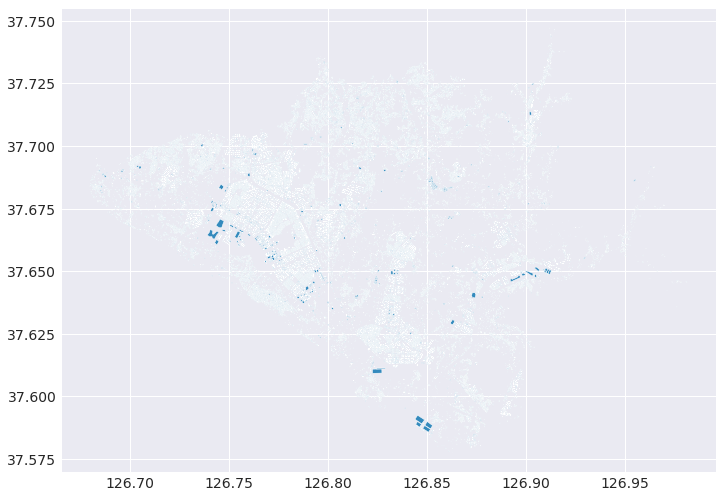

In [97]:
# 간단히 plot해본다.
address_building_gdf.plot()

### 1.4.7.2 도로

| 변수 | 의미 |
|:-:|:-:|
|RN  |  도로명 |
|RDS_MAN_NO  |  도로구간 일련번호 |
|RBP_CN  |  도로 기점 |
|REP_CN  |  도로 종점 |
|BSI_INT  |  기초간격 |
|ROAD_BT  |  도로 폭 |
|ROAD_LT  |  도로 길이 |
|WDR_RD_CD  |  광역도로구분코드 |
|ROA_CLS_SE |   도로위계기능구분 |
|RDS_DPN_SE  |  도로구간종속구분 |

<br>

|RDS_MAN_NO|	RN	|WDR_RD_CD	|ROA_CLS_SE	|RDS_DPN_SE	|ROAD_BT	|ROAD_LT	|geometry|
|:-:|:-:|:-:|:-:|:-:|:-:|:-:|:-:|
|21930	|서울외곽순환고속도로	|1	|1	|0	|50.0	|128020.00	|MULTILINESTRING ((126.91306 37.67694, 126.9128...|




In [98]:
# 데이터 로드
address_road_gdf = gpd.read_file(os.path.join(DATA_RAW_PATH, '도로명주소_도로.geojson'), encoding='cp949')

# 좌표계 변경
address_road_gdf = address_road_gdf.set_crs(default_crs)
print("address_road_gdf 현재 좌표계 :", address_road_gdf.crs)

address_road_gdf 현재 좌표계 : epsg:4326


In [99]:
# 변수명 변경하기
address_road_gdf = address_road_gdf[["RDS_MAN_NO", "RN", "WDR_RD_CD", "ROA_CLS_SE", "RDS_DPN_SE", "ROAD_BT", "ROAD_LT", "geometry"]]
address_road_gdf.head()

,RDS_MAN_NO,RN,WDR_RD_CD,ROA_CLS_SE,RDS_DPN_SE,ROAD_BT,ROAD_LT,geometry
0,21930,서울외곽순환고속도로,1,1,0,50.0,128020.00,"MULTILINESTRING ((126.91306 37.67694, 126.9128..."
1,21932,인천국제공항고속도로,1,1,0,50.0,38550.00,"MULTILINESTRING ((126.82662 37.58822, 126.8266..."
2,23767,수원문산고속도로,1,1,0,30.0,78600.00,"MULTILINESTRING ((126.82665 37.58824, 126.8271..."
3,935,고양대로,3,2,1,2.0,198.82,"MULTILINESTRING ((126.85633 37.64793, 126.8563..."
4,1906,고양대로,3,2,2,3.0,91.00,"MULTILINESTRING ((126.84622 37.65368, 126.8462..."


In [100]:
# 광역도로 구분 코드(WDR_RD_CD)	road_code1_df
road_code1_df

,code,meaning
0,1,행자부도로
1,2,광역도로
2,3,시군구도로


In [101]:
# 도로구간종속구분코드(RDS_DPN_SE)	road_code2_df
road_code2_df

,code,meaning
0,0,주도로
1,1,1차 종속도로
2,2,2차 종속도로


In [102]:
# 도로위계구분코드(ROA_CLS_SE)	road_code3_df
road_code3_df

,code,meaning
0,1,고속도로
1,2,대로
2,3,로
3,4,길


<AxesSubplot:>

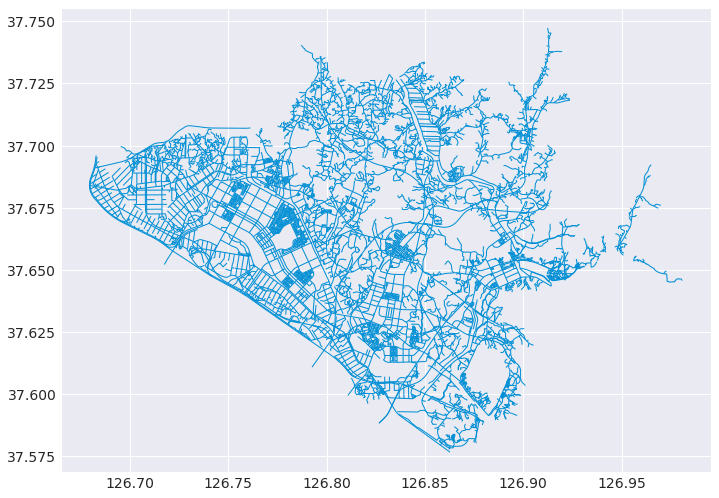

In [103]:
# 간단히 plot하기
address_road_gdf.plot(linewidth=1)

### 1.4.7.3 인도

| 변수 | 의미 |
|:-:|:-:|
| UFID  |  인도별 고유코드  |
| 재질   | 인도의 재질을 나타내는 코드 |
| 자전거도로유/무  |  자전거도로의 유무를 나타내는 코드 |
| 종류  |  인도의 종류를 나타내는 코드 |

<br>

|SD_CD	|BICYCLE	|MATERIAL	|TYPE	|geometry|
|:-:|:-:|:-:|:-:|:-:|
0	|TRN0400000001AAEA	|BYC001	|SWQ001	|SWK001	|MULTILINESTRING ((126.87388 37.59902, 126.8739...|


In [104]:
sidewalk_gdf = gpd.read_file(os.path.join(DATA_RAW_PATH, '고양시_인도.geojson'), encoding='cp949')

# 좌표계 변경
sidewalk_gdf = sidewalk_gdf.set_crs(default_crs)
print("sidewalk_gdf 현재 좌표계 :", sidewalk_gdf.crs)

sidewalk_gdf 현재 좌표계 : epsg:4326


In [105]:
sidewalk_gdf.head()

,UFID,재질,자전거도로유/무,종류,geometry
0,TRN0400000001AAEA,SWQ001,BYC001,SWK001,"MULTILINESTRING ((126.87388 37.59902, 126.8739..."
1,TRN0400000001JVQG,SWQ001,BYC001,SWK001,"MULTILINESTRING ((126.87432 37.59904, 126.8743..."
2,TRN0400000001KUOE,SWQ001,BYC001,SWK001,"MULTILINESTRING ((126.87886 37.64444, 126.8792..."
3,TRN0400000001DA87,SWQ001,BYC001,SWK001,"MULTILINESTRING ((126.87393 37.64831, 126.8744..."
4,TRN0400000001DA87,SWQ001,BYC001,SWK001,"MULTILINESTRING ((126.87384 37.64826, 126.8737..."


In [106]:
# 변수명 변경
sidewalk_gdf.columns = ["SD_CD", "MATERIAL", "BICYCLE", "TYPE", "geometry"]

In [107]:
# 변수 순서 변경
sidewalk_gdf = sidewalk_gdf[["SD_CD", "BICYCLE", "MATERIAL", "TYPE", "geometry"]]
sidewalk_gdf.head()

,SD_CD,BICYCLE,MATERIAL,TYPE,geometry
0,TRN0400000001AAEA,BYC001,SWQ001,SWK001,"MULTILINESTRING ((126.87388 37.59902, 126.8739..."
1,TRN0400000001JVQG,BYC001,SWQ001,SWK001,"MULTILINESTRING ((126.87432 37.59904, 126.8743..."
2,TRN0400000001KUOE,BYC001,SWQ001,SWK001,"MULTILINESTRING ((126.87886 37.64444, 126.8792..."
3,TRN0400000001DA87,BYC001,SWQ001,SWK001,"MULTILINESTRING ((126.87393 37.64831, 126.8744..."
4,TRN0400000001DA87,BYC001,SWQ001,SWK001,"MULTILINESTRING ((126.87384 37.64826, 126.8737..."


<AxesSubplot:>

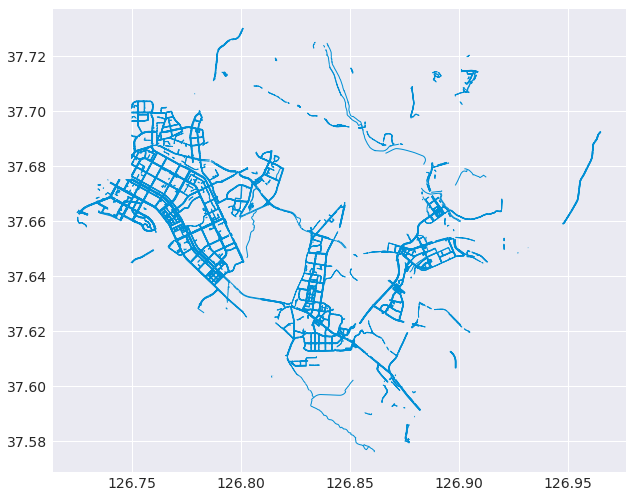

In [108]:
sidewalk_gdf.plot(linewidth=1)

## 1.4.8 고도 데이터 로드

| 파일 | 변수 |
|:-:|:-:|
| 고양시덕양구_고도 | duckyang_height_gdf|
| 고양시일산동구_고도 | ilsan_east_height_gdf|
| 고양시일산서구_고도 | ilsan_west_height_gdf|
| 고양시전체_고도 | height_gdf |



In [109]:
# 고도 데이터 로드
duckyang_height_gdf = gpd.read_file(os.path.join(DATA_RAW_PATH, '고양시_덕양구_고도.geojson'), encoding='cp949')
ilsan_east_height_gdf = gpd.read_file(os.path.join(DATA_RAW_PATH, '고양시_일산동구_고도.geojson'), encoding='cp949')
ilsan_west_height_gdf = gpd.read_file(os.path.join(DATA_RAW_PATH, '고양시_일산서구_고도.geojson'), encoding='cp949')

# 좌표계 변경
duckyang_height_gdf = duckyang_height_gdf.set_crs(default_crs)
ilsan_east_height_gdf = ilsan_east_height_gdf.set_crs(default_crs)
ilsan_west_height_gdf = ilsan_west_height_gdf.set_crs(default_crs)
print("duckyang_height_gdf 현재 좌표계 :", duckyang_height_gdf.crs)
print("ilsan_east_height_gdf 현재 좌표계 :", ilsan_east_height_gdf.crs)
print("ilsan_west_height_gdf 현재 좌표계 :", ilsan_west_height_gdf.crs)

duckyang_height_gdf 현재 좌표계 : epsg:4326
ilsan_east_height_gdf 현재 좌표계 : epsg:4326
ilsan_west_height_gdf 현재 좌표계 : epsg:4326


In [110]:
# 변수명 변경
duckyang_height_gdf.columns = ["ID", "HEIGHT", "geometry"]

In [111]:
duckyang_height_gdf.head()

,ID,HEIGHT,geometry
0,1,347,"POLYGON ((126.92421 37.75297, 126.92421 37.752..."
1,2,361,"POLYGON ((126.92523 37.75297, 126.92523 37.752..."
2,3,374,"POLYGON ((126.92625 37.75297, 126.92625 37.751..."
3,4,425,"POLYGON ((126.92727 37.75297, 126.92727 37.752..."
4,5,484,"POLYGON ((126.92829 37.75297, 126.92829 37.752..."


In [112]:
# 변수명 변경
ilsan_east_height_gdf.columns = ["ID", "HEIGHT", "geometry"]

In [113]:
ilsan_east_height_gdf.head()

,ID,HEIGHT,geometry
0,1,12,"POLYGON ((126.79284 37.73975, 126.79284 37.738..."
1,2,11,"POLYGON ((126.79488 37.73975, 126.79488 37.738..."
2,3,17,"POLYGON ((126.79080 37.73894, 126.79080 37.738..."
3,4,15,"POLYGON ((126.79182 37.73894, 126.79182 37.738..."
4,5,18,"POLYGON ((126.79284 37.73894, 126.79284 37.738..."


In [114]:
# 변수명 변경
ilsan_west_height_gdf.columns = ["ID", "HEIGHT", "geometry"]

In [115]:
ilsan_west_height_gdf.head()

,ID,HEIGHT,geometry
0,1,19,"POLYGON ((126.76181 37.71165, 126.76182 37.710..."
1,2,20,"POLYGON ((126.76283 37.71165, 126.76284 37.709..."
2,3,22,"POLYGON ((126.76385 37.71165, 126.76386 37.710..."
3,4,25,"POLYGON ((126.76487 37.71165, 126.76488 37.710..."
4,5,27,"POLYGON ((126.76589 37.71165, 126.76590 37.710..."


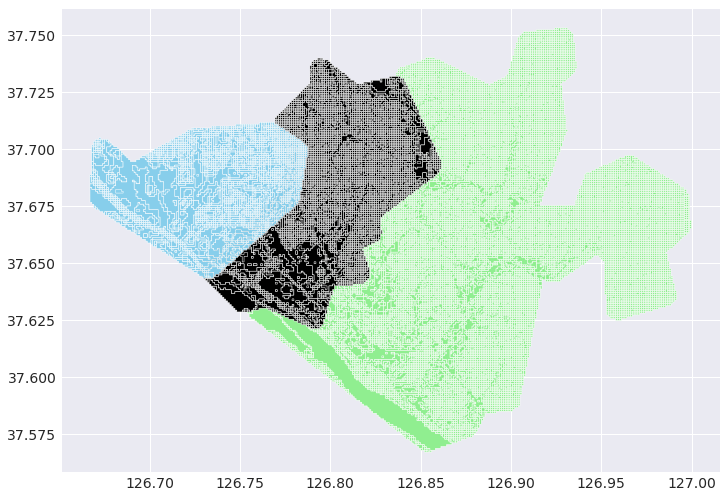

In [116]:
# 임의의 포인트에 대해 위치 확인
ax = duckyang_height_gdf.plot(color="lightgreen")
ilsan_east_height_gdf.plot(color="black", ax=ax)
ilsan_west_height_gdf.plot(color="skyblue", ax=ax)

plt.show()

<AxesSubplot:>

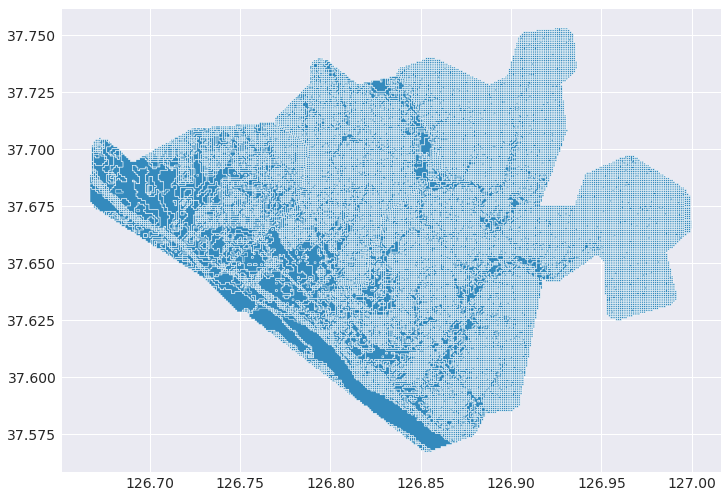

In [117]:
# 합해서 plot 해보기
height_gdf = copy.deepcopy(duckyang_height_gdf)
height_gdf = height_gdf.append(ilsan_east_height_gdf)
height_gdf = height_gdf.append(ilsan_west_height_gdf)
height_gdf.reset_index(inplace=True, drop=True)

height_gdf.plot()

## 1.4.9 도시 계획 데이터 로드


| 파일 | 변수 |
|:-:|:-:|
| 도시계획(공간시설) | city_plan_space_gdf|
| 도시계획(교통시설) | city_plan_traffic_gdf|
| 용도지역지구(습지보호지역) | limit_area_gdf|



In [118]:
# 도시 계획 데이터 로드
city_plan_space_gdf = gpd.read_file(os.path.join(DATA_RAW_PATH, '도시계획(공간시설).geojson'), encoding='cp949')
# city_plan_public_gdf = gpd.read_file(os.path.join(DATA_RAW_PATH, '도시계획(공공문화제육시설).geojson'), encoding='cp949')
city_plan_traffic_gdf = gpd.read_file(os.path.join(DATA_RAW_PATH, '도시계획(교통시설).geojson'), encoding='cp949')
limit_area_gdf = gpd.read_file(os.path.join(DATA_RAW_PATH, '용도지역지구(습지보호지역).geojson'), encoding='cp949')
# goyang_geo_gdf = gpd.read_file(os.path.join(DATA_RAW_PATH, '고양시 지적도.geojson'), encoding='cp949')

# 좌표계 변경
city_plan_space_gdf = city_plan_space_gdf.set_crs(default_crs)
city_plan_traffic_gdf = city_plan_traffic_gdf.set_crs(default_crs)
limit_area_gdf = limit_area_gdf.set_crs(default_crs)
print("city_plan_space_gdf 현재 좌표계 :", city_plan_space_gdf.crs)
print("city_plan_traffic_gdf 현재 좌표계 :", city_plan_traffic_gdf.crs)
print("limit_area_gdf 현재 좌표계 :", limit_area_gdf.crs)

city_plan_space_gdf 현재 좌표계 : epsg:4326
city_plan_traffic_gdf 현재 좌표계 : epsg:4326
limit_area_gdf 현재 좌표계 : epsg:4326


In [119]:
city_plan_space_gdf.head()

,MNUM,ALIAS,REMARK,geometry
0,39400004128020200102UQT3300001000,None,None,"MULTIPOLYGON (((126.79244 37.67061, 126.79245 ..."
1,39400004128020200102UQT3300002000,None,None,"MULTIPOLYGON (((126.79125 37.66747, 126.79126 ..."
2,39400004128020200102UQT2100001000,None,None,"MULTIPOLYGON (((126.79216 37.67002, 126.79221 ..."
3,39400004128020200102UQT3100001000,None,None,"MULTIPOLYGON (((126.79275 37.66799, 126.79301 ..."
4,39400004128020200102UQT3100002000,None,None,"MULTIPOLYGON (((126.79139 37.66740, 126.79154 ..."


<AxesSubplot:>

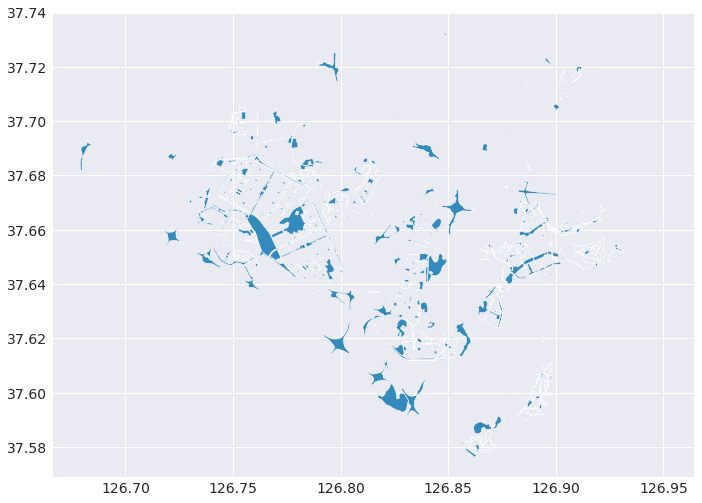

In [120]:
city_plan_space_gdf.plot()

In [121]:
city_plan_traffic_gdf.head()

,DGM_NM,DGM_AR,DGM_LT,geometry
0,노외주차장,1930,269,"MULTIPOLYGON (((126.89527 37.70315, 126.89514 ..."
1,노외주차장,1006,130,"MULTIPOLYGON (((126.79379 37.65890, 126.79391 ..."
2,노외주차장,1111,134,"MULTIPOLYGON (((126.91072 37.71903, 126.91076 ..."
3,노외주차장,631,104,"MULTIPOLYGON (((126.89455 37.62056, 126.89480 ..."
4,노외주차장,987,132,"MULTIPOLYGON (((126.87241 37.59324, 126.87251 ..."


<AxesSubplot:>

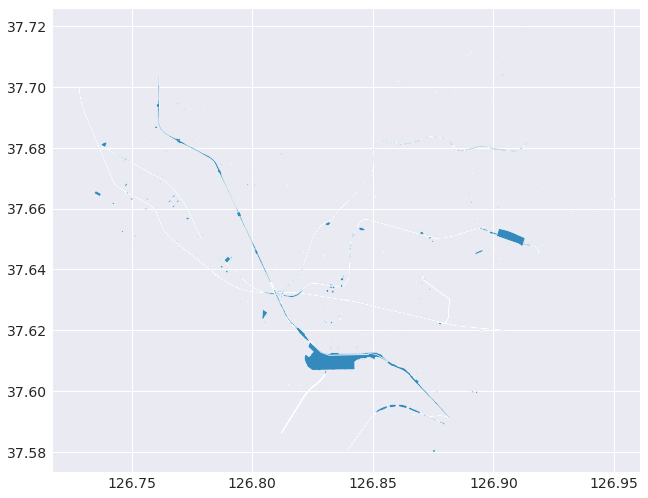

In [122]:
city_plan_traffic_gdf.plot()

In [123]:
limit_area_gdf.head()

,MNUM,ALIAS,REMARK,geometry
0,14800004128020060058UMQ1000000001,장항습지,장항습지,"MULTIPOLYGON (((126.68313 37.69578, 126.68341 ..."


<AxesSubplot:>

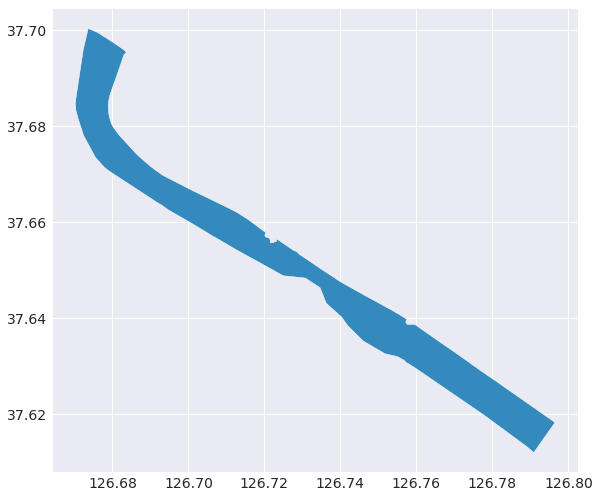

In [124]:
limit_area_gdf.plot()

# 2. EDA

탐험적 데이터 분석을 통해 해당 문제가 어떠한 특징을 갖고 있고 문제점을 가지고 있는지 이해한다.

* 2.0 EDA 전용 데이터셋 만들기
    * 2.0.1 정류장 데이터에 고도 데이터를 추가
    * 2.0.2 정류장 데이터에 운영이력 처리한 변수를 추가
    * 2.0.3 행정동 당 자전거 거치대 개수 정보를 추가
    * 2.0.4 위치 데이터 시각화
* 2.1 공공성의 관점
    * 2.1.1 배치/미배치 지역 구분
        * 2.1.1.1 미배치 지역 데이터화
        * 2.1.1.2 배치 지역 데이터화
* 2.2 수요의 관점
    * 2.2.1 행정동 별 구분
        * 자전거 개수
        * 인구 대비 거치대 개수
        * 총 자전거 이용량 (반입량+반출량)의 일별 평균 : 절대 수요
        * 총 자전거 변화량 (반입량-반출량)의 일별 평균 : 상대 수요
    * 2.2.2 상업/거주인구 대비 이용량
* 2.3 접근성의 관점
    * 2.3.1 거치대 기반 고도
    * 2.3.2 거치대 근처 교통 시설
        * 버스정류장
        * 지하철역
    * 2.3.3 거치대 근처 공공시설
        * 교육시설
        * 문화시설
        * 체육시설
    * 2.3.4 고양시 도로 파악
        * 시군구 도로
* 2.4 Rebalancing의 관점
    * 2.4.1 시간대별 이용량
        * 2.4.1.1 월별
        * 2.4.1.2 요일별
        * 2.4.1.3 시간별
    * 2.4.2 거치대 별 반입/반출량
        * 2.4.2.1 거치대별 상대수요 분포
        * 2.4.2.2 특이 station
    * 2.4.3 네트워크 분석
* 2.5 결론

## 2.0 EDA 전용 데이터셋 만들기

* 2.0.1 정류장 데이터에 고도 데이터를 추가한다.
* 2.0.2 정류장 데이터에 운영이력 처리한 변수를 추가한다.
* 2.0.3 행정동 당 자전거 거치대 개수 정보를 추가한다.
* 2.0.4 위치 데이터 시각화

In [125]:
# 시각화에 앞서 고양시 중심 위치를 정한다.
center = [37.6559448, 126.8026949]

### 2.0.1 EDA에 사용할 함수 정리

In [126]:
# 운영이력에서 각 자전거 정류장별 이용량(수요) 추출 함수
def createDemandDf(route_df, unit='all', remove_stations=[0, 998, 999]):
  """
  input : route_df , unit = ['all', 'month', 'day']
  """
  possible_unit = ['all', 'month', 'day']
  if unit not in possible_unit:
    print("unit Error!")
    return
  if type(route_df['LEAS_DATE'][0]) == str:
    route_df['LEAS_DATE'] = route_df['LEAS_DATE'].apply(lambda x: datetime.strptime(x, "%Y-%m-%d %H:%M:%S"))
  if 'LEAS_DATE_DATE' not in route_df.columns:
    route_df['LEAS_DATE_DATE'] = route_df['LEAS_DATE'].apply(lambda x: x.date())
  if type(route_df['RTN_DATE'][0]) == str:
    route_df['RTN_DATE'] = route_df['RTN_DATE'].apply(lambda x: datetime.strptime(x, "%Y-%m-%d %H:%M:%S"))
  if 'RTN_DATE_DATE' not in route_df.columns:
    route_df['RTN_DATE_DATE'] = route_df['RTN_DATE'].apply(lambda x: x.date())
  now_date = min(route_df['LEAS_DATE'])
  end_date = max(route_df['LEAS_DATE'])

  stations = sorted(route_df['LEAS_STATION'].unique())
  for remove_station in remove_stations:
    if remove_station in stations:
      stations.remove(remove_station)
  stations_num = len(stations)

  if unit == 'all':
    total_date = (end_date - now_date).days + 1
    numpy_route_demand = np.chararray((stations_num, total_date, 2), itemsize=10)
    for i in range(len(stations)):
      if i == 0:
        j = 0
        while now_date <= end_date:
          numpy_route_demand[i, j] = [str(stations[i]), now_date]
          now_date += timedelta(days = 1)
          j += 1
      else:
        temp_numpy_route_demand = copy.deepcopy(numpy_route_demand[0])
        temp_numpy_route_demand[:,0] = str(stations[i])
        numpy_route_demand[i] = temp_numpy_route_demand
    
    demand_df = pd.DataFrame(columns=['STATION', 'DATE'])
    for i in range(len(stations)):
      temp_demand_df = pd.DataFrame(numpy_route_demand[i], columns=['STATION', 'DATE'])
      demand_df = demand_df.append(temp_demand_df)
    demand_df.reset_index(drop=True, inplace=True)
    demand_df['STATION'] = demand_df['STATION'].apply(lambda x : int(x))
    demand_df['DATE'] = demand_df['DATE'].apply(lambda x : datetime.strptime(x.decode('utf-8'), "%Y-%m-%d"))
    demand_df['DATE'] = demand_df['DATE'].apply(lambda x : x.date())
    lea_demand_df = route_df[['LEAS_STATION', 'LEAS_DATE_DATE', 'LEAS_NO']].groupby(['LEAS_STATION', 'LEAS_DATE_DATE']).count()
    lea_demand_df.reset_index(inplace=True)
    lea_demand_df.columns = ['STATION', 'DATE', 'LEAS_COUNTS']
    demand_df = pd.merge(demand_df, lea_demand_df, how='left', on=['STATION', 'DATE'])#left_on=['STATION', 'DATE'], right_on=['LEAS_STATION', 'LEAS_DATE_DATE'])
    rtn_demand_df = route_df[['RTN_STATION', 'RTN_DATE_DATE', 'LEAS_NO']].groupby(['RTN_STATION', 'RTN_DATE_DATE']).count()
    rtn_demand_df.reset_index(inplace=True)
    rtn_demand_df.columns = ['STATION', 'DATE', 'RTN_COUNTS']
    demand_df = pd.merge(demand_df, rtn_demand_df, how='left', on=['STATION', 'DATE'])
    demand_df.fillna(0, inplace=True)
    return demand_df

  elif unit == 'month':
    if 'LEAS_DATE_YEAR' not in route_df.columns:
      route_df['LEAS_DATE_YEAR'] = route_df['LEAS_DATE'].apply(lambda x: x.year)
    if 'LEAS_DATE_MONTH' not in route_df.columns:
      route_df['LEAS_DATE_MONTH'] = route_df['LEAS_DATE'].apply(lambda x: x.month)
    if 'RTN_DATE_YEAR' not in route_df.columns:
      route_df['RTN_DATE_YEAR'] = route_df['RTN_DATE'].apply(lambda x: x.year)
    if 'RTN_DATE_MONTH' not in route_df.columns:
      route_df['RTN_DATE_MONTH'] = route_df['RTN_DATE'].apply(lambda x: x.month)
    numpy_route_demand = np.chararray((stations_num, 3*12, 3), itemsize=10)
    for i in range(len(stations)):
      for year in range(2017, 2020):
        for month in range(1, 13):
          numpy_route_demand[i, (year-2017)*12 + (month-1)] = [str(stations[i]), year, month]
    demand_df = pd.DataFrame(columns=['STATION', 'YEAR', 'MONTH'])     
    for i in range(len(stations)):
      temp_demand_df = pd.DataFrame(numpy_route_demand[i], columns=['STATION', 'YEAR', 'MONTH'])
      demand_df = demand_df.append(temp_demand_df)
    demand_df.reset_index(drop=True, inplace=True)
    demand_df['STATION'] = demand_df['STATION'].apply(lambda x : int(x))
    demand_df['YEAR'] = demand_df['YEAR'].apply(lambda x : int(x))
    demand_df['MONTH'] = demand_df['MONTH'].apply(lambda x : int(x))
    lea_demand_df = route_df[['LEAS_STATION', 'LEAS_DATE_YEAR', 'LEAS_DATE_MONTH', 'LEAS_NO']].groupby(['LEAS_STATION', 'LEAS_DATE_YEAR', 'LEAS_DATE_MONTH']).count()
    lea_demand_df.reset_index(inplace=True)
    lea_demand_df.columns = ['STATION', 'YEAR', 'MONTH', 'LEAS_COUNTS']
    demand_df = pd.merge(demand_df, lea_demand_df, how='left', on=['STATION', 'YEAR', 'MONTH'])
    rtn_demand_df = route_df[['RTN_STATION', 'RTN_DATE_YEAR', 'RTN_DATE_MONTH', 'LEAS_NO']].groupby(['RTN_STATION', 'RTN_DATE_YEAR', 'RTN_DATE_MONTH']).count()
    rtn_demand_df.reset_index(inplace=True)
    rtn_demand_df.columns = ['STATION', 'YEAR', 'MONTH', 'RTN_COUNTS']
    demand_df = pd.merge(demand_df, rtn_demand_df, how='left', on=['STATION', 'YEAR', 'MONTH'])
    demand_df.fillna(0, inplace=True)
    return demand_df

  elif unit == 'day':
    if 'LEAS_DATE_DAY' not in route_df.columns:
      route_df['LEAS_DATE_DAY'] = route_df['LEAS_DATE_DATE'].apply(lambda x: x.weekday())
    if 'RTN_DATE_DAY' not in route_df.columns:
      route_df['RTN_DATE_DAY'] = route_df['RTN_DATE_DATE'].apply(lambda x: x.weekday())
    numpy_route_demand = np.chararray((stations_num, 7, 2), itemsize=10)
    for i in range(len(stations)):
      for day in range(7):
        numpy_route_demand[i, day] = [str(stations[i]), day]
    demand_df = pd.DataFrame(columns=['STATION', 'DAY'])     
    for i in range(len(stations)):
      temp_demand_df = pd.DataFrame(numpy_route_demand[i], columns=['STATION', 'DAY'])
      demand_df = demand_df.append(temp_demand_df)
    demand_df.reset_index(drop=True, inplace=True)
    demand_df['STATION'] = demand_df['STATION'].apply(lambda x : int(x))
    demand_df['DAY'] = demand_df['DAY'].apply(lambda x : int(x))
    lea_demand_df = route_df[['LEAS_STATION', 'LEAS_DATE_DAY', 'LEAS_NO']].groupby(['LEAS_STATION', 'LEAS_DATE_DAY']).count()
    lea_demand_df.reset_index(inplace=True)
    lea_demand_df.columns = ['STATION', 'DAY', 'LEAS_COUNTS']
    demand_df = pd.merge(demand_df, lea_demand_df, how='left', on=['STATION', 'DAY'])
    rtn_demand_df = route_df[['RTN_STATION', 'RTN_DATE_DAY', 'LEAS_NO']].groupby(['RTN_STATION', 'RTN_DATE_DAY']).count()
    rtn_demand_df.reset_index(inplace=True)
    rtn_demand_df.columns = ['STATION', 'DAY', 'RTN_COUNTS']
    demand_df = pd.merge(demand_df, rtn_demand_df, how='left', on=['STATION', 'DAY'])
    demand_df.fillna(0, inplace=True)
    return demand_df

In [127]:
import time
def join_height2station(gdf1, gdf2):
  """
  input : (gdf_station, gdf_pop_dist)
  output : ret_gdf

  describe : station gdf에 해당 정류장 기반으로 해발고도를 추가해준다.

  """
  ret_df = copy.deepcopy(gdf1)
    
  start = time.time()
  for i in range(ret_df.shape[0]):
    if ret_df.shape[0] > 1000 & i % 1000 == 0:
        print("진행중 : {} / {}".format(i, ret_df.shape[0]))
        print("진행시간 : ", time.time()-start)
    station = gdf1.iloc[i]["geometry"]
    temp_df = gdf2[gdf2.contains(station)]
    ret_df.loc[i, "altitude"] = np.mean(list(temp_df["HEIGHT"]))
  
  return ret_df


In [128]:
# 정류장별 이용량 모두 합해주는 함수
def createDemandTotal(x):
  df = {}
  df['LEAS_COUNTS'] = x['LEAS_COUNTS'].sum()
  df['RTN_COUNTS'] = x['RTN_COUNTS'].sum()
  df['TOTAL'] = df['LEAS_COUNTS'] + df['RTN_COUNTS']
  df['RTN-LEAS'] = df['RTN_COUNTS'] - df['LEAS_COUNTS']
  start_index = 0
  if 0 in list(x['LEAS_COUNTS']) and 1 in list(x['LEAS_COUNTS']):
    start_index = list(np.array(list(x['LEAS_COUNTS'])) > 0).index(True)
  df['LEAS_MEAN'] = x['LEAS_COUNTS'][start_index:].mean()
  start_index = 0
  if 0 in list(x['RTN_COUNTS']) and 1 in list(x['RTN_COUNTS']):
    start_index = list(np.array(list(x['RTN_COUNTS'])) > 0).index(True)
  df['RTN_MEAN'] = x['RTN_COUNTS'][start_index:].mean()
  start_index = 0
  if 0 in list(x['TOTAL']) and 1 in list(x['TOTAL']):
    start_index = list(np.array(list(x['TOTAL'])) > 0).index(True)
    df['TOTAL_MEAN'] = x['TOTAL'][start_index:].mean()
  if 0 in list(x['RTN-LEAS']) and 1 in list(x['RTN-LEAS']):
    start_index = list(np.array(list(x['RTN-LEAS'])) > 0).index(True)
  df['RTN-LEAS_MEAN'] = x['RTN-LEAS'][start_index:].mean()
  return pd.Series(df, index=['LEAS_COUNTS', 'RTN_COUNTS', 'TOTAL', 'RTN-LEAS', 'LEAS_MEAN', 'RTN_MEAN', 'TOTAL_MEAN', 'RTN-LEAS_MEAN'])

In [129]:
# 행정동별 자전거 정류장 정보를 모두 합해주는 함수
def calculateStationPerTown(gdf1, gdf2, rel_method=gpd.GeoSeries.within):
  """
  input : (gdf_station, gdf_pop_dist, latitude, longitude, coverage, space_relation_method, cal_method)
  output : ret_gdf

  describe : 행정동 데이터 행 하나에 해당하는 정류장의 개수를 feature로 추가한다.

  space_relation_method = gpd.GeoSeries.within, gpd.GeoSeries.intersects
  """
  ret_df = copy.deepcopy(gdf1)

  for i in range(ret_df.shape[0]):
    town = gdf1.iloc[i]["geometry"]
    temp_df = gdf2[rel_method(gdf2, town)]
    if temp_df.shape[0] == 0:
      ret_df.loc[i, "STATION_COUNT"] = 0
      ret_df.loc[i, "STATION_RTN_COUNTS"] = 0
      ret_df.loc[i, "STATION_LEAS_COUNTS"] = 0
      ret_df.loc[i, "STATION_RTN-LEAS"] = 0
      ret_df.loc[i, "STATION_TOTAL"] = 0
      ret_df.loc[i, "STATION_RTN_MEAN"] = 0
      ret_df.loc[i, "STATION_LEAS_MEAN"] = 0
      ret_df.loc[i, "STATION_RTN-LEAS_MEAN"] = 0
      ret_df.loc[i, "STATION_TOTAL_MEAN"] = 0
    else:
      ret_df.loc[i, "STATION_COUNT"] = temp_df.shape[0]
      ret_df.loc[i, "STATION_RTN_COUNTS"] = np.sum(temp_df["RTN_COUNTS"])
      ret_df.loc[i, "STATION_LEAS_COUNTS"] = np.sum(temp_df["LEAS_COUNTS"])
      ret_df.loc[i, "STATION_RTN-LEAS"] = np.sum(temp_df["RTN-LEAS"])
      ret_df.loc[i, "STATION_TOTAL"] = np.sum(temp_df["TOTAL"])
      ret_df.loc[i, "STATION_RTN_MEAN"] = np.mean(temp_df["RTN_MEAN"])
      ret_df.loc[i, "STATION_LEAS_MEAN"] = np.mean(temp_df["LEAS_MEAN"])
      ret_df.loc[i, "STATION_RTN-LEAS_MEAN"] = np.mean(temp_df["RTN-LEAS_MEAN"])
      ret_df.loc[i, "STATION_TOTAL_MEAN"] = np.mean(temp_df["TOTAL_MEAN"])

  return ret_df

### 2.0.2 정류장 데이터에 고도 데이터 추가

- 최종 데이터셋: station_df
<br>

|STATION_ID|	STATION_NM	|HOLDER_CAPACITY	|LAT	|LON	|geometry	|altitude	|
|:-:|:-:|:-:|:-:|:-:|:-:|:-:|
|101	|어울림마을 701동 앞	|20	|37.654775	|126.834584	|POINT (126.83458 37.65477)	|14.0	|


In [130]:
# 사용하기 전 변수 세팅
args = [station_df, height_gdf]

In [131]:
station_df = join_height2station(*args)
station_df.head()

진행중 : 0 / 164
진행시간 :  8.749961853027344e-05
진행중 : 1 / 164
진행시간 :  0.1805257797241211
진행중 : 2 / 164
진행시간 :  0.3669109344482422
진행중 : 3 / 164
진행시간 :  0.5000958442687988
진행중 : 4 / 164
진행시간 :  0.6673762798309326
진행중 : 5 / 164
진행시간 :  0.807861328125
진행중 : 6 / 164
진행시간 :  0.9583916664123535
진행중 : 7 / 164
진행시간 :  1.1050894260406494
진행중 : 16 / 164
진행시간 :  2.384666919708252
진행중 : 17 / 164
진행시간 :  2.5212857723236084
진행중 : 18 / 164
진행시간 :  2.6952874660491943
진행중 : 19 / 164
진행시간 :  2.860853433609009
진행중 : 20 / 164
진행시간 :  3.04848313331604
진행중 : 21 / 164
진행시간 :  3.182647466659546
진행중 : 22 / 164
진행시간 :  3.3384106159210205
진행중 : 23 / 164
진행시간 :  3.472944498062134


,STATION_ID,STATION_NM,HOLDER_CAPACITY,LAT,LON,geometry,altitude
0,101,어울림마을 701동 앞,20,37.654775,126.834584,POINT (126.83458 37.65477),14.0
1,103,대림e-편한세상106동,20,37.660442,126.840377,POINT (126.84038 37.66044),18.0
2,104,탄현마을8단지,25,37.698523,126.766042,POINT (126.76604 37.69852),35.0
3,105,KT 덕양지사 앞,20,37.655244,126.839261,POINT (126.83926 37.65524),19.0
4,106,원당역 앞 공영주차장,30,37.653410,126.842530,POINT (126.84253 37.65341),18.0


### 2.0.3 자전거 정류장 이용량 추가하기

- 최종 데이터셋: gdf_station
<br>

|STATION_ID|	STATION_NM|	HOLDER_CAPACITY|	LAT|	LON|	geometry|	altitude|	LEAS_COUNTS|	RTN_COUNTS|	TOTAL|	RTN-LEAS|	LEAS_MEAN|	RTN_MEAN|	TOTAL_MEAN|	RTN-LEAS_MEAN|
|:-:|:-:|:-:|:-:|:-:|:-:|:-:|:-:|:-:|:-:|:-:|:-:|:-:|:-:|:-:|
|101	|어울림마을 701동 앞	|20	|37.654775	|126.834584	|POINT (941305.151 1961905.875)	|14.0	|8366.0	|9207.0	|17573.0	|841.0	|7.640183|

In [132]:
# 자전거 정류장별 매일 반입 반출량 데이터 만들기
df_station_leasrtn_all = createDemandDf(route_df)
df_station_leasrtn_all['TOTAL'] = df_station_leasrtn_all['LEAS_COUNTS'] + df_station_leasrtn_all['RTN_COUNTS']
df_station_leasrtn_all['RTN-LEAS'] = df_station_leasrtn_all['RTN_COUNTS'] - df_station_leasrtn_all['LEAS_COUNTS']
df_station_leasrtn_all.head()

,STATION,DATE,LEAS_COUNTS,RTN_COUNTS,TOTAL,RTN-LEAS
0,101,2017-01-01,5.0,11.0,16.0,6.0
1,101,2017-01-02,6.0,6.0,12.0,0.0
2,101,2017-01-03,9.0,11.0,20.0,2.0
3,101,2017-01-04,5.0,7.0,12.0,2.0
4,101,2017-01-05,6.0,11.0,17.0,5.0


In [133]:
station_demand_df = df_station_leasrtn_all.groupby(df_station_leasrtn_all['STATION']).apply(createDemandTotal)
station_demand_df = station_demand_df.reset_index()
station_demand_df.head()

,STATION,LEAS_COUNTS,RTN_COUNTS,TOTAL,RTN-LEAS,LEAS_MEAN,RTN_MEAN,TOTAL_MEAN,RTN-LEAS_MEAN
0,101,8366.0,9207.0,17573.0,841.0,7.640183,8.408219,16.048402,0.768037
1,103,4535.0,5121.0,9656.0,586.0,4.141553,4.676712,8.818265,0.536563
2,104,13402.0,9330.0,22732.0,-4072.0,12.239269,8.520548,20.759817,-3.723404
3,105,2806.0,2696.0,5502.0,-110.0,2.562557,2.462100,5.024658,-0.096419
4,106,4444.0,2357.0,6801.0,-2087.0,4.058447,2.152511,6.210959,-1.908425


In [134]:
# 자전거 거치대 데이터 EDA용 copy해두기
gdf_station = station_df.copy(deep=True)
gdf_station = gdf_station.to_crs(meter_crs) # 좌표계 변환

# 100m*100m 인구분포 데이터 EDA용 copy해두기
gdf_pop_dist = population_dist_gdf.copy(deep=True)

# 좌표계 설정
gdf_pop_dist.crs = default_crs 
gdf_pop_dist = gdf_pop_dist.to_crs(meter_crs)
print("gdf_pop_dist 현재 좌표계 :", gdf_pop_dist.crs)

# na 처리
gdf_pop_dist["val"] = gdf_pop_dist["val"].fillna(0)
gdf_pop_dist.head()

gdf_pop_dist 현재 좌표계 : epsg:5179


,gid,val,geometry
0,다사268650,0.0,"MULTIPOLYGON (((926800.000 1965000.000, 926800..."
1,다사268651,0.0,"MULTIPOLYGON (((926800.000 1965100.000, 926800..."
2,다사268652,0.0,"MULTIPOLYGON (((926800.000 1965200.000, 926800..."
3,다사268653,0.0,"MULTIPOLYGON (((926800.000 1965300.000, 926800..."
4,다사268654,0.0,"MULTIPOLYGON (((926800.000 1965400.000, 926800..."


운행이력에 있는 데이터에 있는 총 정류장 갯수를 조사한 결과 155개이고,  
정류장에 대한 정보를 불러왔을 때의 정류장 갯수는 163개이다.

운행이력에 담겨있지 않은 데이터는 통계치를 산정하는데 문제가 발생하기 때문에 정류소에 대한 정보를 취합할 때 제거한다.

In [135]:
# 자전거 정류장 데이터에 정류장에 대한 통계치 붙이기(merge)
gdf_station = pd.merge(gdf_station, station_demand_df, left_on='STATION_ID', right_on="STATION")
del gdf_station["STATION"]
gdf_station.head()

,STATION_ID,STATION_NM,HOLDER_CAPACITY,LAT,LON,geometry,altitude,LEAS_COUNTS,RTN_COUNTS,TOTAL,RTN-LEAS,LEAS_MEAN,RTN_MEAN,TOTAL_MEAN,RTN-LEAS_MEAN
0,101,어울림마을 701동 앞,20,37.654775,126.834584,POINT (941305.151 1961905.875),14.0,8366.0,9207.0,17573.0,841.0,7.640183,8.408219,16.048402,0.768037
1,103,대림e-편한세상106동,20,37.660442,126.840377,POINT (941820.497 1962531.001),18.0,4535.0,5121.0,9656.0,586.0,4.141553,4.676712,8.818265,0.536563
2,104,탄현마을8단지,25,37.698523,126.766042,POINT (935297.065 1966804.805),35.0,13402.0,9330.0,22732.0,-4072.0,12.239269,8.520548,20.759817,-3.723404
3,105,KT 덕양지사 앞,20,37.655244,126.839261,POINT (941718.000 1961955.000),19.0,2806.0,2696.0,5502.0,-110.0,2.562557,2.462100,5.024658,-0.096419
4,106,원당역 앞 공영주차장,30,37.653410,126.842530,POINT (942004.997 1961749.495),18.0,4444.0,2357.0,6801.0,-2087.0,4.058447,2.152511,6.210959,-1.908425


### 2.0.3 행정동별 자전거 거치대 정보 넣어주기

- 최종 데이터셋: gdf_boundary_town

|GU_CD|	GU_NM	|DONG_CD	|DONG_NM	|geometry	|STATION_COUNT	|STATION_RTN_COUNTS	|STATION_LEAS_COUNTS	|STATION_RTN-LEAS|	STATION_TOTAL|	STATION_RTN_MEAN|	STATION_LEAS_MEAN|	STATION_RTN-LEAS_MEAN|	STATION_TOTAL_MEAN|
|:-:|:-:|:-:|:-:|:-:|:-:|:-:|:-:|:-:|:-:|:-:|:-:|:-:|:-:|
|31101	|덕양구|	3110151	|주교동	|MULTIPOLYGON (((941371.354 1964353.054, 941373...	|1.0	|2950.0	|3671.0	|-721.0	6621.0	|2.696527|	3.355576|	-0.659049	|6.052102|

In [136]:
# 행정동 경계 데이터 EDA용도로 복사한다.
gdf_boundary_town = administration_boundary_town_gdf.copy(deep=True)

# 좌표계 변환
gdf_boundary_town = gdf_boundary_town.to_crs(meter_crs) 
print("변환 좌표계 :", gdf_boundary_town.crs)

gdf_boundary_town.head()

변환 좌표계 : epsg:5179


,GU_CD,GU_NM,DONG_CD,DONG_NM,geometry
0,31101,덕양구,3110151,주교동,"MULTIPOLYGON (((941371.354 1964353.054, 941373..."
1,31101,덕양구,3110152,원신동,"MULTIPOLYGON (((942677.321 1965788.996, 942688..."
2,31101,덕양구,3110153,흥도동,"MULTIPOLYGON (((944966.339 1961093.460, 944919..."
3,31101,덕양구,3110154,성사1동,"MULTIPOLYGON (((942585.687 1963444.268, 942600..."
4,31101,덕양구,3110155,성사2동,"MULTIPOLYGON (((941344.035 1961920.305, 941365..."


In [137]:
# 사용하기 전 변수 세팅
args = [gdf_boundary_town, gdf_station, gpd.GeoSeries.within]

# 함수 실행
gdf_boundary_town = calculateStationPerTown(*args)
gdf_boundary_town.head()

,GU_CD,GU_NM,DONG_CD,DONG_NM,geometry,STATION_COUNT,STATION_RTN_COUNTS,STATION_LEAS_COUNTS,STATION_RTN-LEAS,STATION_TOTAL,STATION_RTN_MEAN,STATION_LEAS_MEAN,STATION_RTN-LEAS_MEAN,STATION_TOTAL_MEAN
0,31101,덕양구,3110151,주교동,"MULTIPOLYGON (((941371.354 1964353.054, 941373...",1.0,2950.0,3671.0,-721.0,6621.0,2.696527,3.355576,-0.659049,6.052102
1,31101,덕양구,3110152,원신동,"MULTIPOLYGON (((942677.321 1965788.996, 942688...",4.0,9496.0,13472.0,-3976.0,22968.0,2.168515,3.077189,-0.907126,5.244954
2,31101,덕양구,3110153,흥도동,"MULTIPOLYGON (((944966.339 1961093.460, 944919...",6.0,36059.0,41872.0,-5813.0,77931.0,5.649315,6.560897,-0.912496,12.207598
3,31101,덕양구,3110154,성사1동,"MULTIPOLYGON (((942585.687 1963444.268, 942600...",3.0,10174.0,11785.0,-1611.0,21959.0,3.097108,3.587519,-0.489427,6.684627
4,31101,덕양구,3110155,성사2동,"MULTIPOLYGON (((941344.035 1961920.305, 941365...",1.0,9207.0,8366.0,841.0,17573.0,8.408219,7.640183,0.768037,16.048402


In [138]:
# 조회기준 2019년 12월 데이터만 사용
# EMD_KOR_NM에서 행정동만 골라내기
gdf_town_pop = population_statistics_df.copy(deep=True)
gdf_town_pop = gdf_town_pop[gdf_town_pop["CHECK_DATE"] == "2019년12월"].reset_index(drop=True)
gdf_town_pop = gdf_town_pop.drop(index=[0,1,22,34]).reset_index(drop=True)
gdf_town_pop = gdf_town_pop.drop('CHECK_DATE', axis=1)
gdf_town_pop["DONG_NM"] = gdf_town_pop["EMD_KOR_NM"].apply(lambda x: x.split(' ')[3].split('(')[0])
del gdf_town_pop["EMD_KOR_NM"]

# 행정동별 정거장 데이터와 인구통계 데이터 합치기
gdf_boundary_town = pd.merge(gdf_boundary_town, gdf_town_pop, on = "DONG_NM", how = "left")

# 정거장당 인구 수 변수 추가
gdf_boundary_town["STATION_PER_POP"] = gdf_boundary_town["TOTAL_POP"] / gdf_boundary_town["STATION_COUNT"]
gdf_boundary_town["RIDE_PER_POP"] = gdf_boundary_town["STATION_TOTAL"] / gdf_boundary_town["TOTAL_POP"]

# 정거장이 0인 경우, 0으로 처리
for i in range(len(gdf_boundary_town)):
  if np.isinf(gdf_boundary_town["STATION_PER_POP"][i]):
    gdf_boundary_town["STATION_PER_POP"][i] = 0
gdf_boundary_town.head()

,GU_CD,GU_NM,DONG_CD,DONG_NM,geometry,STATION_COUNT,STATION_RTN_COUNTS,STATION_LEAS_COUNTS,STATION_RTN-LEAS,STATION_TOTAL,...,STATION_RTN-LEAS_MEAN,STATION_TOTAL_MEAN,TOTAL_POP,TOTAL_HOUSEHOLDS,POP_PER_HOUSEHOLDS,M_POP,W_POP,MW_RATE,STATION_PER_POP,RIDE_PER_POP
0,31101,덕양구,3110151,주교동,"MULTIPOLYGON (((941371.354 1964353.054, 941373...",1.0,2950.0,3671.0,-721.0,6621.0,...,-0.659049,6.052102,15748,7362,2.14,8126,7622,1.07,15748.0,0.420434
1,31101,덕양구,3110152,원신동,"MULTIPOLYGON (((942677.321 1965788.996, 942688...",4.0,9496.0,13472.0,-3976.0,22968.0,...,-0.907126,5.244954,23942,9419,2.54,11568,12374,0.93,5985.5,0.959318
2,31101,덕양구,3110153,흥도동,"MULTIPOLYGON (((944966.339 1961093.460, 944919...",6.0,36059.0,41872.0,-5813.0,77931.0,...,-0.912496,12.207598,44565,18311,2.43,21702,22863,0.95,7427.5,1.748704
3,31101,덕양구,3110154,성사1동,"MULTIPOLYGON (((942585.687 1963444.268, 942600...",3.0,10174.0,11785.0,-1611.0,21959.0,...,-0.489427,6.684627,22062,9676,2.28,10928,11134,0.98,7354.0,0.995331
4,31101,덕양구,3110155,성사2동,"MULTIPOLYGON (((941344.035 1961920.305, 941365...",1.0,9207.0,8366.0,841.0,17573.0,...,0.768037,16.048402,11729,4783,2.45,5689,6040,0.94,11729.0,1.498252


### 2.0.4 위치 데이터 시각화

In [139]:
# folium 마커의 모양을 html로 설정한다.
table = """
<!DOCTYPE html>
<html>
<head>
<style>
table {{
    width:100%;
}}
table, th, td {{
    border: 1px solid black;
    border-collapse: collapse;
}}
th, td {{
    padding: 5px;
    text-align: left;
}}
table#t01 tr:nth-child(odd) {{
    background-color: #eee;
}}
table#t01 tr:nth-child(even) {{
   background-color:#fff;
}}
</style>
</head>
<body>

<table id="t01">
  <tr>
    <td>Name</td>
    <td>{}</td>
  </tr>
</table>
</body>
</html>
""".format

In [140]:
# folium rendering 관계로 버스정류장은 100개만 plot한다.
# colab에서는 모두 렌더링이되는 것을 확인했으나, 구동환경의 차이로 불가한 것을 확인했다.

import folium
from folium import IFrame
from folium.plugins import MarkerCluster, FeatureGroupSubGroup

# 행사장 공간정보	eventhall_space_df
# 공연장 공간정보	concerthall_space_df
# 박물관/미술관 공간정보	museum_space_df
# 버스정류장 정보	busstop_df
# 지하철 역 정보	subway_space_df
# 체육시설 정보	sport_complex_info_df
# 주차장 정보	parking_df

m = folium.Map(location=center, tiles="OpenStreetMap", zoom_start=12)

fg = folium.FeatureGroup(name='ALL') 
m.add_child(fg)

g1 = FeatureGroupSubGroup(fg, 'bike station[star]') 
m.add_child(g1) 
g2 = FeatureGroupSubGroup(fg, 'event hall[cloud]') 
m.add_child(g2)
g3 = FeatureGroupSubGroup(fg, 'concert hall[heart]') 
m.add_child(g3)
g4 = FeatureGroupSubGroup(fg, 'museum[lock]') 
m.add_child(g4)
g5 = FeatureGroupSubGroup(fg, 'busstop[ok]') 
m.add_child(g5) 
g6 = FeatureGroupSubGroup(fg, 'subway station[tag]') 
m.add_child(g6) 
g7 = FeatureGroupSubGroup(fg, 'sport complex[tint]') 
m.add_child(g7)
g8 = FeatureGroupSubGroup(fg, 'parking lot[camera]') 
m.add_child(g8)



width, height = 310,150

popups, locations = [], []
marker_cluster = MarkerCluster().add_to(g1)
for idx, row in station_df.iterrows():
    folium.Marker(
      location=[row['geometry'].y, row['geometry'].x],
      popup=IFrame(table(row['STATION_NM']), width=width, height=height),
      icon=folium.Icon(color='red',icon='star'),
    ).add_to(marker_cluster)

popups, locations = [], []
marker_cluster = MarkerCluster().add_to(g2)
for idx, row in eventhall_space_df.iterrows():
    folium.Marker(
      location=[row['geometry'].y, row['geometry'].x],
      popup=IFrame(table(row['NAME']), width=width, height=height),
      icon=folium.Icon(color='blue',icon='cloud'),
    ).add_to(marker_cluster)

popups, locations = [], []
marker_cluster = MarkerCluster().add_to(g3)
for idx, row in concerthall_space_df.iterrows():
    folium.Marker(
      location=[row['geometry'].y, row['geometry'].x],
      popup=IFrame(table(row['NAME']), width=width, height=height),
      icon=folium.Icon(color='purple',icon='heart'),
    ).add_to(marker_cluster)

popups, locations = [], []
marker_cluster = MarkerCluster().add_to(g4)
for idx, row in museum_space_df.iterrows():
    folium.Marker(
      location=[row['geometry'].y, row['geometry'].x],
      popup=IFrame(table(row['NAME']), width=width, height=height),
      icon=folium.Icon(color='magenda',icon='lock'),
    ).add_to(marker_cluster)

    
popups, locations = [], []
marker_cluster = MarkerCluster().add_to(g5)
for idx, row in busstop_df.iterrows():
    if idx == 100: break
    folium.Marker(
      location=[row['geometry'].y, row['geometry'].x],
      popup=IFrame(table(row['STATION_NM']), width=width, height=height),
      icon=folium.Icon(color='orange',icon='ok'),
    ).add_to(marker_cluster)

popups, locations = [], []
marker_cluster = MarkerCluster().add_to(g6)
for idx, row in subway_space_df.iterrows():
    folium.Marker(
      location=[row['geometry'].y, row['geometry'].x],
      popup=IFrame(table(row['STATION_NM']), width=width, height=height),
      icon=folium.Icon(color='green',icon='tag'),
    ).add_to(marker_cluster)

popups, locations = [], []
marker_cluster = MarkerCluster().add_to(g7)
for idx, row in sport_complex_info_df.iterrows():
    folium.Marker(
      location=[row['geometry'].y, row['geometry'].x],
      popup=IFrame(table(row['NAME']), width=width, height=height),
      icon=folium.Icon(color='yellow',icon='tint'),
    ).add_to(marker_cluster)

popups, locations = [], []
marker_cluster = MarkerCluster().add_to(g8)
for idx, row in parking_df.iterrows():
    folium.Marker(
      location=[row['geometry'].y, row['geometry'].x],
      popup=IFrame(table(row['NAME']), width=width, height=height),
      icon=folium.Icon(color='red',icon='camera'),
    ).add_to(marker_cluster)



folium.GeoJson(
    administration_boundary_town_gdf,
    name='Administration Boundary Layer',
    style_function=lambda feature: {
        'fillOpacity': 0.2,
        'weight': 2,
        "color": "#1C1C1C",
        'lineColor': '#E2E2E2',
        "opacity": 0.4,
    }
    ).add_to(m)

folium.LayerControl(collapsed=False).add_to(m)
m


대부분의 자전거 정류장은 도시지역에 분포한다는 사실을 알 수 있다.

## 2.1 공공성의 관점
- 2.1.1 인구 대비 배치도
    - 2.1.1.1 행정동별 인구수
    - 2.1.1.2 자전거 거치대 대비 인구 수
- 2.2.2 배치/미배치 지역 구분
    - 2.2.2.1 미배치 지역 데이터화
    - 2.2.2.2 배치 지역 데이터화
		* 상업 지역/거주 지역 구분

### 2.1.1 인구 대비 배치도
- 2.1.1.1 행정동별 인구수
- 2.1.1.2 자전거 거치대 대비 인구 수

#### 2.1.1.1 행정동별 인구수

In [141]:
# 행정동 인구수를 파악한다.
from branca.colormap import linear

m = folium.Map(center, zoom_start=12,tiles=None)


# feature groups
# feature_group0 = folium.FeatureGroup(name='TOTAL_POP',overlay=False).add_to(m) # 행정동 인구수
# feature_group1= folium.FeatureGroup(name='STATION_COUNT',overlay=False).add_to(m) # 행정동 내 자전거 정류장 수
feature_group2 = folium.FeatureGroup(name='STATION_PER_POP',overlay=False).add_to(m) # 자전거 정류장 하나 당 커버하는 행정동 인구수


fs = [feature_group2]#,feature_group1]#,feature_group2]
feature_list = ["STATION_PER_POP"]#,"STATION_COUNT"]#,"STATION_PER_POP"]
for i in range(len(feature_list)): 
    choropleth1 = folium.Choropleth(
    geo_data=gdf_boundary_town,
    name='choropleth',
    data=gdf_boundary_town,
    columns=['DONG_NM', feature_list[i]],
    key_on='feature.properties.DONG_NM',
    fill_color='YlGn',
    nan_fill_color="black",
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Arrival (in Quintal)',
    highlight=True,
    line_color='black').geojson.add_to(fs[i])

    colormap = linear.YlGn_09.scale(
    gdf_boundary_town[feature_list[i]].min(),
    gdf_boundary_town[feature_list[i]].max()).to_step(10)
    colormap.caption = feature_list[i]
    colormap.add_to(m)
    
   
folium.TileLayer('cartodbpositron',overlay=True,name="background").add_to(m)
folium.LayerControl('topright',collapsed=False).add_to(m)

m

#### 2.1.1.2 자전거 거치대 대비 인구 수

In [142]:
# 행정동 내 인구 대비 자전거 거치대 수를 파악한다.
from branca.colormap import linear

m = folium.Map(center, zoom_start=12,tiles=None)


# feature groups
# feature_group0 = folium.FeatureGroup(name='TOTAL_POP',overlay=False).add_to(m) # 행정동 인구수
# feature_group1= folium.FeatureGroup(name='STATION_COUNT',overlay=False).add_to(m) # 행정동 내 자전거 정류장 수
feature_group2 = folium.FeatureGroup(name='STATION_PER_POP',overlay=False).add_to(m) # 자전거 정류장 하나 당 커버하는 행정동 인구수


fs = [feature_group2]#,feature_group1]#,feature_group2]
feature_list = ["STATION_PER_POP"]#,"STATION_COUNT"]#,"STATION_PER_POP"]
for i in range(len(feature_list)): 
    choropleth1 = folium.Choropleth(
    geo_data=gdf_boundary_town,
    name='choropleth',
    data=gdf_boundary_town,
    columns=['DONG_NM', feature_list[i]],
    key_on='feature.properties.DONG_NM',
    fill_color='YlGn',
    nan_fill_color="black",
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Arrival (in Quintal)',
    highlight=True,
    line_color='black').geojson.add_to(fs[i])

    colormap = linear.YlGn_09.scale(
    gdf_boundary_town[feature_list[i]].min(),
    gdf_boundary_town[feature_list[i]].max()).to_step(10)
    colormap.caption = feature_list[i]
    colormap.add_to(m)
    
   
folium.TileLayer('cartodbpositron',overlay=True,name="background").add_to(m)
folium.LayerControl('topright',collapsed=False).add_to(m)

m

인구 수가 많은 주엽동, 마두동의 경우 충분한 자전거 정류장이 존재했기에 상대적으로 낮은 거치대 대비 인구 수를 보이나,

행신동은 인구 대비 거치대 수가 적고, 고양시 북부의 경우 아예 거치대가 존재하지 않는 등 배치의 불균형성이 보인다.

### 2.2.2 배치/미배치 지역 구분
- 2.2.2.1 미배치 지역 데이터화
- 2.2.2.2 배치 지역 데이터화
    * 상업 지역/거주 지역 구분

In [143]:
# 100m*100m 인구분포 데이터 전처리

# 좌표계 변환
population_dist_gdfM = population_dist_gdf.copy(deep=True)
population_dist_gdfM = population_dist_gdfM.to_crs(meter_crs)
print("변환 좌표계 :", population_dist_gdfM.crs)

# Nan = 0으로 변환
population_dist_gdfM["val"] = population_dist_gdfM["val"].fillna(0)

# val에 따라 데이터 분리
population_dist_gdfM_not_zero = population_dist_gdfM[population_dist_gdfM["val"] > 0]
population_dist_gdfM_zero = population_dist_gdfM[population_dist_gdfM["val"] == 0]
population_dist_gdfM_not_zero = population_dist_gdfM_not_zero.reset_index(drop=True)
population_dist_gdfM_not_zero.head()

변환 좌표계 : epsg:5179


,gid,val,geometry
0,다사277652,8.0,"MULTIPOLYGON (((927700.000 1965200.000, 927700..."
1,다사277653,11.0,"MULTIPOLYGON (((927700.000 1965300.000, 927700..."
2,다사278651,13.0,"MULTIPOLYGON (((927800.000 1965100.000, 927800..."
3,다사278652,17.0,"MULTIPOLYGON (((927800.000 1965200.000, 927800..."
4,다사278656,9.0,"MULTIPOLYGON (((927800.000 1965600.000, 927800..."


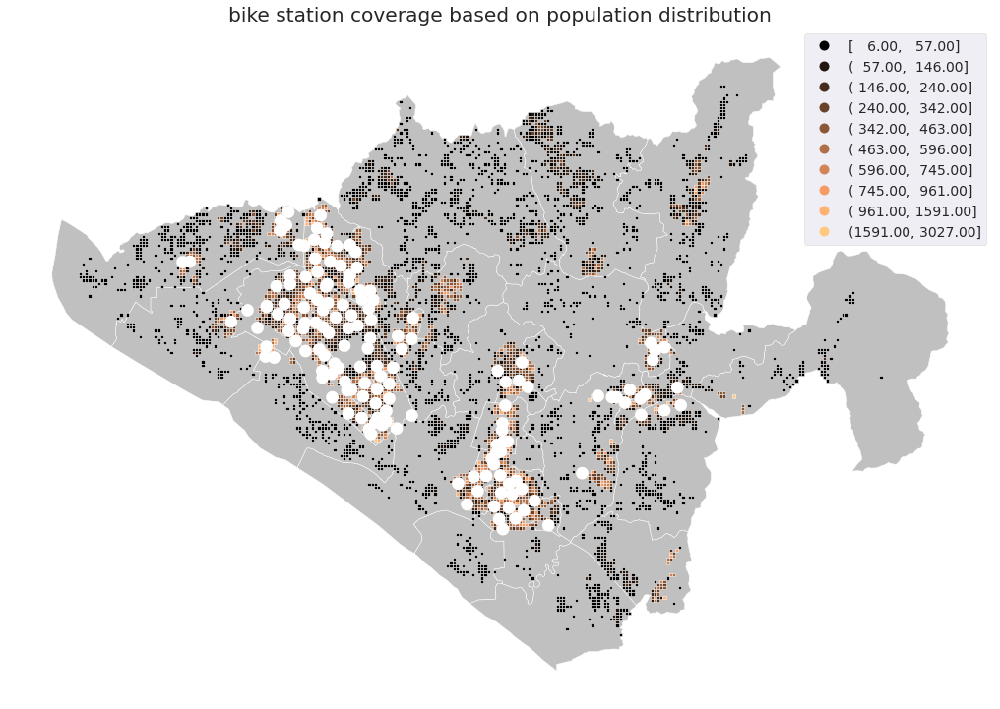

In [144]:
# 인구분포도 바탕으로 자전거 거치대의 200m 반경 커버 지역 시각화
station_boundary_200 = gpd.GeoDataFrame({'geometry': gdf_station.buffer(200)})
origin_ = population_dist_gdfM_not_zero.groupby(['gid']).apply(lambda gr : gr.area.sum())

ax = gdf_boundary_town.plot(color="silver", figsize=(16,16))
population_dist_gdfM_not_zero.plot(column='val', legend=True, scheme='Fisher_Jenks', cmap="copper", k=10, ax=ax)
gdf_station.plot(ax=ax, marker='v', color='black')
station_boundary_200.boundary.plot(ax=ax,linewidth = 0.01, facecolor = 'white', color='red')
ax.set_axis_off()
ax.set_title("bike station coverage based on population distribution")
plt.show()

시각화 결과, 거주 인구가 상당히 있음에도 불구하고 거치대가 설치되지 않은 곳이 많은 것을 알 수 있다. 
우리는 이 부분에서 미배치된 지역과, 배치된 지역을 분리하여 추후에 사용하기로 하였다.


#### 2.2.2.1 미배치 지역 데이터화

1. 거주인구가 0이 아닌 지역을 떼내었다.
2. 100x100 격자를 기준으로 현재 거치대가 cover하지 못하는 비율을 계산한다.
3. 이 비율이 100%인 부분을 미배치 지역이라 판단하였다.

In [145]:
# 100x100 인구분포도를 기반으로 자전거 거치대의 200m 반경 미커버 지역 비율 계산
# 현재 거치대가 cover하지 못하는 gid의 비율을 계산한다.
dif_area = gpd.overlay(population_dist_gdfM_not_zero, station_boundary_200, how='difference')
dif_area = dif_area.dissolve(by='gid')

# 커버 지역의 총 인구수, 인구 비율 (인구분포도 기반)
# 100% cover하는 지역의 return값이 nan으로 생성된다. 이를 0으로 변환한다.
cover_gid_p = round(dif_area.area / origin_ * 100)
cover_gid_p = cover_gid_p.fillna(0)
cover_gid_p[cover_gid_p.isna()]
cover_gid_p.head()

gid
다사277652    100.0
다사277653    100.0
다사278651    100.0
다사278652    100.0
다사278656    100.0
dtype: float64

In [146]:
# 미커비비율 데이터 만들기
cover_gid_p = cover_gid_p.reset_index()
cover_gid_p.columns = ["gid", "not_cover_percentage"]
cover_gid_p.head()

,gid,not_cover_percentage
0,다사277652,100.0
1,다사277653,100.0
2,다사278651,100.0
3,다사278652,100.0
4,다사278656,100.0


In [147]:
# 미커버 비율에 대한 테이블을 원래 100x100 인구분포도 데이터와 gid를 기준으로 merge한다.
# val이 0보다 큰 인구분포 데이터(거주 인구가 0이 아닌 지역)와 합치기(merge)
population_dist_gdfM_not_zero_coverage = population_dist_gdfM_not_zero.copy(deep=True)
population_dist_gdfM_not_zero_coverage["geometry"] = population_dist_gdfM_not_zero_coverage["geometry"].to_crs(meter_crs)
population_dist_gdfM_not_zero_coverage = pd.merge(population_dist_gdfM_not_zero, cover_gid_p, on="gid")
population_dist_gdfM_not_zero_coverage.head()

,gid,val,geometry,not_cover_percentage
0,다사277652,8.0,"MULTIPOLYGON (((927700.000 1965200.000, 927700...",100.0
1,다사277653,11.0,"MULTIPOLYGON (((927700.000 1965300.000, 927700...",100.0
2,다사278651,13.0,"MULTIPOLYGON (((927800.000 1965100.000, 927800...",100.0
3,다사278652,17.0,"MULTIPOLYGON (((927800.000 1965200.000, 927800...",100.0
4,다사278656,9.0,"MULTIPOLYGON (((927800.000 1965600.000, 927800...",100.0


In [148]:
# 미커버비율이 100%인 gid만 골내서 val(인구 수)로 sorting한다.
# 이 부분은 추후에 후보군 선정에서 사용한다.
population_dist_gdfM_not_zero_coverage = population_dist_gdfM_not_zero_coverage[population_dist_gdfM_not_zero_coverage["not_cover_percentage"] == 100]
population_dist_gdfM_not_zero_coverage.sort_values(by=['val'], axis=0, ascending=False, inplace=True)
population_dist_gdfM_not_zero_coverage = population_dist_gdfM_not_zero_coverage.reset_index(drop=True)
population_dist_gdfM_not_zero_coverage.head()

,gid,val,geometry,not_cover_percentage
0,다사464612,3027.0,"MULTIPOLYGON (((946400.000 1961200.000, 946400...",100.0
1,다사485614,2559.0,"MULTIPOLYGON (((948500.000 1961400.000, 948500...",100.0
2,다사439613,2113.0,"MULTIPOLYGON (((943900.000 1961300.000, 943900...",100.0
3,다사446600,1277.0,"MULTIPOLYGON (((944600.000 1960000.000, 944600...",100.0
4,다사463550,1275.0,"MULTIPOLYGON (((946300.000 1955000.000, 946300...",100.0


#### 2.1.1.2 배치 지역 데이터화

현재 거치대는 두가지 위치 특징을 기반으로 설치되었다고 가정한다.

1. 상업지구(유동량, 퇴근)
2. 거주지구(출근)

이러한 가정을 설정한다면, 현재 거치대가 설치된 주변 건물의 특징을 조사한다면, 거치대가 상업지구에 설치되었는지, 거주지구에 설치되었는지 알 수 있다.

우리는 이 단계에서 상업지구와 거주지구를 나누기 위한 변수 "house_counts_mean"를 사용할 것이다. "house_counts_mean"는 거치대 주변 200m내에 존재하는 거주 건물의 수의 평균이다. 만약 200m 반경 내에 4개의 100x100m 격자가 들어가고, 이 격자 각각에 2개 씩의 거주 건물이 들어가 있다면 (4x2)/4 = 2로 생성된다. 이를 적용했을 때, 1을 기준으로 상업지구와 거주인구가 나뉘는 것을 확인할 수 있었다. 이를 좀더 명시적으로 파악하기 위해 네이버 지도에서 해당 위치와의 비교를 통해 검증하였다.

<img width="241" alt="KakaoTalk_Photo_2020-09-11-13-50-50" src="https://user-images.githubusercontent.com/37871541/92862588-ddcf0f00-f435-11ea-8b6a-444d90ac7e1a.png">

과정은 다음과 같다.

1. 100x100m 인구 거주도, 100x100m 빌딩 연면적 데이터를 병합한다.
2. 이 데이터에서 인구수가 0이 아니고, 빌딩 면적도 0이 아닌 데이터를 추출한다.
3. 100x100m 안에 포함된 주거용도 건축물 수를 세고, 평균을 취한다.
4. 이 변수를 2번 데이터 프레임에 추가한다.
5. "house_counts_mean"를 기준으로 상업지구와 거주지구를 나누어 본다.
6. 둘을 가장 잘 나눌 수 있는 threshold를 설정한다.
7. 상업지구와 거주지구에 따른 차이를 검증한다.

In [149]:
# 100m*100m 빌딩연면적 데이터 전처리

# 좌표계 변환
building_area_gdfM = building_area_gdf.copy(deep=True)
building_area_gdfM = building_area_gdfM.to_crs(meter_crs)
print("변환 좌표계 :", building_area_gdfM.crs)

# Nan = 0으로 변환
building_area_gdfM["val"] = building_area_gdfM["val"].fillna(0)

# val에 따라 데이터 분리
building_area_gdfM_not_zero = building_area_gdfM[building_area_gdfM["val"] > 0]
building_area_gdfM_zero = building_area_gdfM[building_area_gdfM["val"] == 0]
building_area_gdfM_not_zero = building_area_gdfM_not_zero.reset_index(drop=True)
building_area_gdfM_not_zero.head()

변환 좌표계 : epsg:5179


,gid,val,geometry
0,다사277649,107.70,"MULTIPOLYGON (((927700.000 1964900.000, 927700..."
1,다사277650,149.10,"MULTIPOLYGON (((927700.000 1965000.000, 927700..."
2,다사277651,198.00,"MULTIPOLYGON (((927700.000 1965100.000, 927700..."
3,다사277652,173.16,"MULTIPOLYGON (((927700.000 1965200.000, 927700..."
4,다사277653,161.00,"MULTIPOLYGON (((927700.000 1965300.000, 927700..."


In [150]:
# 100m*100m 인구분포 데이터와 빌딩연면적 데이터 합치기(merge)
building_pop_gdfM = pd.merge(building_area_gdfM, population_dist_gdfM, on = "gid", how = "left")
building_pop_gdfM = building_pop_gdfM.drop(columns=["geometry_y"])
building_pop_gdfM.columns = ["gid", "b_area", "geometry", "pop"]
building_pop_gdfM[245:251]

,gid,b_area,geometry,pop
245,다사277648,0.00,"MULTIPOLYGON (((927700.000 1964800.000, 927700...",0.0
246,다사277649,107.70,"MULTIPOLYGON (((927700.000 1964900.000, 927700...",0.0
247,다사277650,149.10,"MULTIPOLYGON (((927700.000 1965000.000, 927700...",0.0
248,다사277651,198.00,"MULTIPOLYGON (((927700.000 1965100.000, 927700...",0.0
249,다사277652,173.16,"MULTIPOLYGON (((927700.000 1965200.000, 927700...",8.0
250,다사277653,161.00,"MULTIPOLYGON (((927700.000 1965300.000, 927700...",11.0


In [151]:
# 인구 수와 빌딩 면적이 0보다 큰 데이터셋으로 분류
building_pop_not_all_zero_gdf = building_pop_gdfM[(building_pop_gdfM["b_area"] > 0) & (building_pop_gdfM["pop"] > 0)]
building_pop_not_zero_gdf = building_pop_gdfM[(building_pop_gdfM["b_area"] > 0) | (building_pop_gdfM["pop"] > 0)]

print(building_pop_not_zero_gdf.shape)
print(building_pop_not_zero_gdf[building_pop_not_zero_gdf["b_area"] == 0].shape)
print(building_pop_not_zero_gdf[building_pop_not_zero_gdf["pop"] == 0].shape)
print(building_pop_not_all_zero_gdf.shape)
building_pop_not_zero_gdf.head()

(9778, 4)
(236, 4)
(4051, 4)
(5491, 4)


,gid,b_area,geometry,pop
246,다사277649,107.70,"MULTIPOLYGON (((927700.000 1964900.000, 927700...",0.0
247,다사277650,149.10,"MULTIPOLYGON (((927700.000 1965000.000, 927700...",0.0
248,다사277651,198.00,"MULTIPOLYGON (((927700.000 1965100.000, 927700...",0.0
249,다사277652,173.16,"MULTIPOLYGON (((927700.000 1965200.000, 927700...",8.0
250,다사277653,161.00,"MULTIPOLYGON (((927700.000 1965300.000, 927700...",11.0


**도로명주소의 건축물용도코드를 활용하여 주거지역을 판단한다.**

주거지 관련 건축물용도코드: "01000","01001","01002","01003","01004","02000","02001","02002","02003","02004","02005","02006","02007"

In [152]:
address_building_gdf_temp = address_building_gdf[address_building_gdf["BDTYP_CD"].isin(["01000","01001","01002","01003","01004","02000","02001","02002","02003","02004","02005","02006","02007"])]
address_building_gdf_temp = address_building_gdf_temp.reset_index(drop=True)
address_building_gdf_temp.head()

,BDTYP_CD,BDTYP_MN,BULD_NM1,BULD_NM2,GU_CD,GU_NM,DONG_NM,DONG_CD,GRO_FLO_CNT,UND_FLO_CNT,geometry
0,01003,다가구주택,None,None,41281,경기도 고양시 덕양구,경기도 고양시 덕양구 도내동,41281105,4,0,"MULTIPOLYGON (((126.87256 37.62531, 126.87259 ..."
1,02003,다세대주택,헤리티지,3단지,41285,경기도 고양시 일산동구,경기도 고양시 일산동구 성석동,41285113,4,1,"MULTIPOLYGON (((126.77481 37.70779, 126.77485 ..."
2,02003,다세대주택,헤리티지,2단지,41285,경기도 고양시 일산동구,경기도 고양시 일산동구 성석동,41285113,4,1,"MULTIPOLYGON (((126.77510 37.70767, 126.77515 ..."
3,01001,단독주택,None,None,41287,경기도 고양시 일산서구,경기도 고양시 일산서구 덕이동,41287105,2,0,"MULTIPOLYGON (((126.74412 37.70319, 126.74412 ..."
4,02003,다세대주택,None,101동,41285,경기도 고양시 일산동구,경기도 고양시 일산동구 성석동,41285113,4,0,"MULTIPOLYGON (((126.80368 37.68735, 126.80368 ..."


In [153]:
# # 앞에서 만든 100m*100m 인구분포, 빌딩 면적 데이터의 각각 gid 안에 몇개의 주거용도 건축물이 있는지 count
# import time
# start = time.time() 
# num = len(address_building_gdf_temp)
# address_building_gdf_temp['HOUSE_COUNTS'] = 0
# for idx, row in address_building_gdf_temp.iterrows():
#     if idx % 1000 == 0:
#         print("진행률 : {} / {}".format(idx, num))
#         print("진행시간 : {}".format(time.time() - start))
#     address_building_gdf_temp['HOUSE_COUNTS'] += gpd.GeoSeries.contains(building_pop_not_zero_gdf['geometry'], row.loc['geometry'].centroid) 

In [154]:
house_counts_gdf = gpd.read_file(os.path.join(DATA_RAW_PATH, 'temp.geojson'), encoding='cp949')
# house_counts_gdf = address_building_gdf_temp.copy(deep=True)
house_counts_gdf.head()

,id,HOUSE_COUNTS,b_area,gid,pop,geometry
0,246,1,107.70,다사277649,0.0,"MULTIPOLYGON (((927700.000 1964900.000, 927700..."
1,247,0,149.10,다사277650,0.0,"MULTIPOLYGON (((927700.000 1965000.000, 927700..."
2,248,0,198.00,다사277651,0.0,"MULTIPOLYGON (((927700.000 1965100.000, 927700..."
3,249,2,173.16,다사277652,8.0,"MULTIPOLYGON (((927700.000 1965200.000, 927700..."
4,250,1,161.00,다사277653,11.0,"MULTIPOLYGON (((927700.000 1965300.000, 927700..."


In [155]:
# house_counts의 모든 경우를 살펴본다.
house_counts_gdf["HOUSE_COUNTS"].unique()

array([ 1,  0,  2,  7,  8,  4, 13, 10,  3, 11,  6,  5,  9, 22, 15, 23, 12,
       19, 16, 17, 20, 14, 21, 25, 30, 24, 26, 27, 29, 18, 28, 32, 34, 31,
       40, 33, 42, 38, 39, 37, 51, 62, 46, 35, 69, 43, 36])

In [156]:
house_counts_gdf.head()

,id,HOUSE_COUNTS,b_area,gid,pop,geometry
0,246,1,107.70,다사277649,0.0,"MULTIPOLYGON (((927700.000 1964900.000, 927700..."
1,247,0,149.10,다사277650,0.0,"MULTIPOLYGON (((927700.000 1965000.000, 927700..."
2,248,0,198.00,다사277651,0.0,"MULTIPOLYGON (((927700.000 1965100.000, 927700..."
3,249,2,173.16,다사277652,8.0,"MULTIPOLYGON (((927700.000 1965200.000, 927700..."
4,250,1,161.00,다사277653,11.0,"MULTIPOLYGON (((927700.000 1965300.000, 927700..."


In [157]:
# 각 gid(격자)에 주거용도 건축물의 수 붙여주기
building_pop_not_zero_gdf= building_pop_not_zero_gdf.reset_index(drop=True)
house_counts_gdf = pd.merge(building_pop_not_zero_gdf, house_counts_gdf, on = "gid", how="left")


# 변수 처리
del house_counts_gdf["geometry_y"]
del house_counts_gdf["b_area_y"]
del house_counts_gdf["pop_y"]
del house_counts_gdf["id"]
house_counts_gdf.columns = ["gid", "b_area", "geometry", "pop",  "HOUSE_COUNTS"]
house_counts_gdf.head()

,gid,b_area,geometry,pop,HOUSE_COUNTS
0,다사277649,107.70,"MULTIPOLYGON (((927700.000 1964900.000, 927700...",0.0,1
1,다사277650,149.10,"MULTIPOLYGON (((927700.000 1965000.000, 927700...",0.0,0
2,다사277651,198.00,"MULTIPOLYGON (((927700.000 1965100.000, 927700...",0.0,0
3,다사277652,173.16,"MULTIPOLYGON (((927700.000 1965200.000, 927700...",8.0,2
4,다사277653,161.00,"MULTIPOLYGON (((927700.000 1965300.000, 927700...",11.0,1


In [158]:
# gid 별 현재 자전거 정류장이 미커버하는 비율 붙여주기
house_counts_cover_gdf = pd.merge(cover_gid_p, house_counts_gdf, on = "gid", how="left")
house_counts_cover_gdf = gpd.GeoDataFrame(house_counts_cover_gdf, geometry="geometry")

# 좌표계 변환
house_counts_cover_gdf["geometry"] = house_counts_cover_gdf["geometry"].to_crs(meter_crs)
print(house_counts_cover_gdf.crs)
house_counts_cover_gdf.head()

epsg:5179


,gid,not_cover_percentage,b_area,geometry,pop,HOUSE_COUNTS
0,다사277652,100.0,173.16,"MULTIPOLYGON (((927700.000 1965200.000, 927700...",8.0,2
1,다사277653,100.0,161.00,"MULTIPOLYGON (((927700.000 1965300.000, 927700...",11.0,1
2,다사278651,100.0,221.83,"MULTIPOLYGON (((927800.000 1965100.000, 927800...",13.0,7
3,다사278652,100.0,166.80,"MULTIPOLYGON (((927800.000 1965200.000, 927800...",17.0,8
4,다사278656,100.0,214.63,"MULTIPOLYGON (((927800.000 1965600.000, 927800...",9.0,2


In [159]:
# 주거용도 건축물이 1 이상 있는 데이터셋
house_counts_not_zero_gdf = house_counts_gdf[house_counts_gdf["HOUSE_COUNTS"] > 0]

In [160]:
import time

def join_info2station(gdf1, gdf2, coverage, rel_method=gpd.GeoSeries.within, cal_method=sum):
  """
  input : (gdf_station, house_counts_cover_gdf, latitude, longitude, coverage, space_relation_method, cal_method)
  output : ret_gdf

  describe : station gdf에 해당 정류장 기반으로 coverage 안에 들어오는 인구 분포, 면적 분포, 주거용도 건축물의 수를 feature로 추가한 gdf를 반환한다.

  space_relation_method = gpd.GeoSeries.within, gpd.GeoSeries.intersects
  cal_method = sum, np.mean
  """
  ret_df = copy.deepcopy(gdf1)
  start = time.time()

  for i in range(ret_df.shape[0]):
    if ret_df.shape[0] > 1000 and i % 1000 == 0:
        print("진행중 {} / {}".format(i, ret_df.shape[0]))
        print("진행 시간", time.time()-start)
    station = gdf1.iloc[i]["geometry"]
    station = station.buffer(coverage)
    temp_df = gdf2[rel_method(gdf2, station)]
    ret_df.loc[i, f"pop_{coverage}_{cal_method.__name__}"] = cal_method(temp_df["pop"])
    ret_df.loc[i, f"b_area_{coverage}_{cal_method.__name__}"] = cal_method(temp_df["b_area"])
    ret_df.loc[i, f"HOUSE_COUNTS_{coverage}_mean"] = np.mean(temp_df["HOUSE_COUNTS"])
  
  return ret_df

In [161]:
# 사용하기 전 변수 세팅
args = [gdf_station, house_counts_cover_gdf, 200, gpd.GeoSeries.within, np.sum]
# 함수 실행
gdf_station_cover = join_info2station(*args)
gdf_station_cover.head() # 결과 확인

,STATION_ID,STATION_NM,HOLDER_CAPACITY,LAT,LON,geometry,altitude,LEAS_COUNTS,RTN_COUNTS,TOTAL,RTN-LEAS,LEAS_MEAN,RTN_MEAN,TOTAL_MEAN,RTN-LEAS_MEAN,pop_200_sum,b_area_200_sum,HOUSE_COUNTS_200_mean
0,101,어울림마을 701동 앞,20,37.654775,126.834584,POINT (941305.151 1961905.875),14.0,8366.0,9207.0,17573.0,841.0,7.640183,8.408219,16.048402,0.768037,649.0,7714.92,2.000000
1,103,대림e-편한세상106동,20,37.660442,126.840377,POINT (941820.497 1962531.001),18.0,4535.0,5121.0,9656.0,586.0,4.141553,4.676712,8.818265,0.536563,2317.0,33074.09,4.000000
2,104,탄현마을8단지,25,37.698523,126.766042,POINT (935297.065 1966804.805),35.0,13402.0,9330.0,22732.0,-4072.0,12.239269,8.520548,20.759817,-3.723404,1508.0,23176.40,2.000000
3,105,KT 덕양지사 앞,20,37.655244,126.839261,POINT (941718.000 1961955.000),19.0,2806.0,2696.0,5502.0,-110.0,2.562557,2.462100,5.024658,-0.096419,894.0,7127.04,14.333333
4,106,원당역 앞 공영주차장,30,37.653410,126.842530,POINT (942004.997 1961749.495),18.0,4444.0,2357.0,6801.0,-2087.0,4.058447,2.152511,6.210959,-1.908425,719.0,1352.44,8.666667


<AxesSubplot:xlabel='HOUSE_COUNTS_200_mean'>

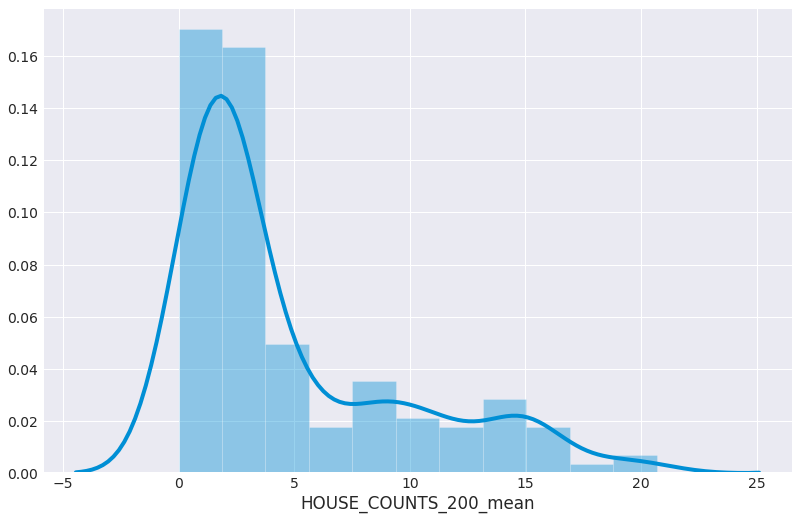

In [162]:
sns.distplot(gdf_station_cover["HOUSE_COUNTS_200_mean"])

200m 단위로 house_counts_mean을 보았을 때, 0과 1에서 가장 많은 양상을 보였다.

우리는 이 점을 바탕으로 1을 기준으로 상업지구와 주거지구를 나누고자 했다.

In [163]:
# 정류장 주변 주거용 건축물이 평균적으로 1 이하/초과인 데이터셋을 추출하여 확인한다.
station_cover_below1 = gdf_station_cover[gdf_station_cover["HOUSE_COUNTS_200_mean"] <= 1]
station_cover_over1 = gdf_station_cover[gdf_station_cover["HOUSE_COUNTS_200_mean"] > 1]
print(station_cover_below1.shape)
print(station_cover_over1.shape)
station_cover_below1.head()

(32, 18)
(118, 18)


,STATION_ID,STATION_NM,HOLDER_CAPACITY,LAT,LON,geometry,altitude,LEAS_COUNTS,RTN_COUNTS,TOTAL,RTN-LEAS,LEAS_MEAN,RTN_MEAN,TOTAL_MEAN,RTN-LEAS_MEAN,pop_200_sum,b_area_200_sum,HOUSE_COUNTS_200_mean
11,116,세이브존 앞,25,37.634360,126.831342,POINT (941002.998 1959643.005),12.0,11767.0,10634.0,22401.0,-1133.0,10.746119,9.711416,20.457534,-1.034703,739.0,57469.41,0.600000
12,118,화정역 3번 출구,25,37.634831,126.832298,POINT (941087.738 1959694.600),12.0,17699.0,15482.0,33181.0,-2217.0,16.163470,14.138813,30.302283,-2.024680,607.0,31431.35,0.500000
13,119,★화정역 4번 출구,15,37.634807,126.832925,POINT (941142.996 1959691.504),12.0,14479.0,12960.0,27439.0,-1519.0,13.222831,11.835616,25.058447,-1.387363,1034.0,41650.34,0.666667
14,121,세일빌딩 앞,20,37.631134,126.830449,POINT (940921.617 1959285.626),12.0,11679.0,10996.0,22675.0,-683.0,10.665753,10.042009,20.707763,-0.618349,1514.0,28083.29,1.000000
32,144,행신역 앞,30,37.612495,126.833894,POINT (941210.898 1957215.546),12.0,13928.0,11285.0,25213.0,-2643.0,12.719635,10.305936,NaN,-2.414991,176.0,6982.76,0.000000


In [164]:
# 시각화한 인구분포도에서 상업지역 걸러내기
station_boundary_200 = gpd.GeoDataFrame({'geometry': station_cover_below1.buffer(200)})
origin_ = house_counts_gdf.groupby(['gid']).apply(lambda gr : gr.area.sum())
dif_area = gpd.overlay(house_counts_gdf, station_boundary_200, how='difference')
dif_area = dif_area.dissolve(by='gid')

# 상업지역 gid 골라내기
commercial_area_gid_p = round(dif_area.area / origin_ * 100)
commercial_area_gid_p = commercial_area_gid_p.fillna(0)

# 미커비비율 데이터 만들기
commercial_area_gid_p = commercial_area_gid_p.reset_index()
commercial_area_gid_p.columns = ["gid", "not_commerical_area_percentage"]
print(commercial_area_gid_p.shape)

# house counts 데이터에 합치기
house_counts_gdf = pd.merge(house_counts_gdf, commercial_area_gid_p, on="gid", how="left")
print(house_counts_gdf.shape)
house_counts_gdf.head()

(9778, 2)
(9778, 6)


,gid,b_area,geometry,pop,HOUSE_COUNTS,not_commerical_area_percentage
0,다사277649,107.70,"MULTIPOLYGON (((927700.000 1964900.000, 927700...",0.0,1,100.0
1,다사277650,149.10,"MULTIPOLYGON (((927700.000 1965000.000, 927700...",0.0,0,100.0
2,다사277651,198.00,"MULTIPOLYGON (((927700.000 1965100.000, 927700...",0.0,0,100.0
3,다사277652,173.16,"MULTIPOLYGON (((927700.000 1965200.000, 927700...",8.0,2,100.0
4,다사277653,161.00,"MULTIPOLYGON (((927700.000 1965300.000, 927700...",11.0,1,100.0


In [165]:
# 시각화한 인구분포도에서 주거지역 걸러내기
station_boundary_200 = gpd.GeoDataFrame({'geometry': station_cover_over1.buffer(200)})
origin_ = house_counts_gdf.groupby(['gid']).apply(lambda gr : gr.area.sum())
dif_area = gpd.overlay(house_counts_gdf, station_boundary_200, how='difference')
dif_area = dif_area.dissolve(by='gid')

# 주거지역 gid 골라내기
residential_area_gid_p = round(dif_area.area / origin_ * 100)
residential_area_gid_p = residential_area_gid_p.fillna(0)

# 미커비비율 데이터 만들기
residential_area_gid_p = residential_area_gid_p.reset_index()
residential_area_gid_p.columns = ["gid", "not_residential_area_percentage"]
print(residential_area_gid_p.shape)

# house counts 데이터에 합치기
house_counts_gdf = pd.merge(house_counts_gdf, residential_area_gid_p, on="gid", how="left")
print(house_counts_gdf.shape)
house_counts_gdf.head()

(9778, 2)
(9778, 7)


,gid,b_area,geometry,pop,HOUSE_COUNTS,not_commerical_area_percentage,not_residential_area_percentage
0,다사277649,107.70,"MULTIPOLYGON (((927700.000 1964900.000, 927700...",0.0,1,100.0,100.0
1,다사277650,149.10,"MULTIPOLYGON (((927700.000 1965000.000, 927700...",0.0,0,100.0,100.0
2,다사277651,198.00,"MULTIPOLYGON (((927700.000 1965100.000, 927700...",0.0,0,100.0,100.0
3,다사277652,173.16,"MULTIPOLYGON (((927700.000 1965200.000, 927700...",8.0,2,100.0,100.0
4,다사277653,161.00,"MULTIPOLYGON (((927700.000 1965300.000, 927700...",11.0,1,100.0,100.0


In [166]:
# 좌표계 변경해주기
building_area_zero_gdf["geometry"] = building_area_zero_gdf["geometry"].to_crs(meter_crs)

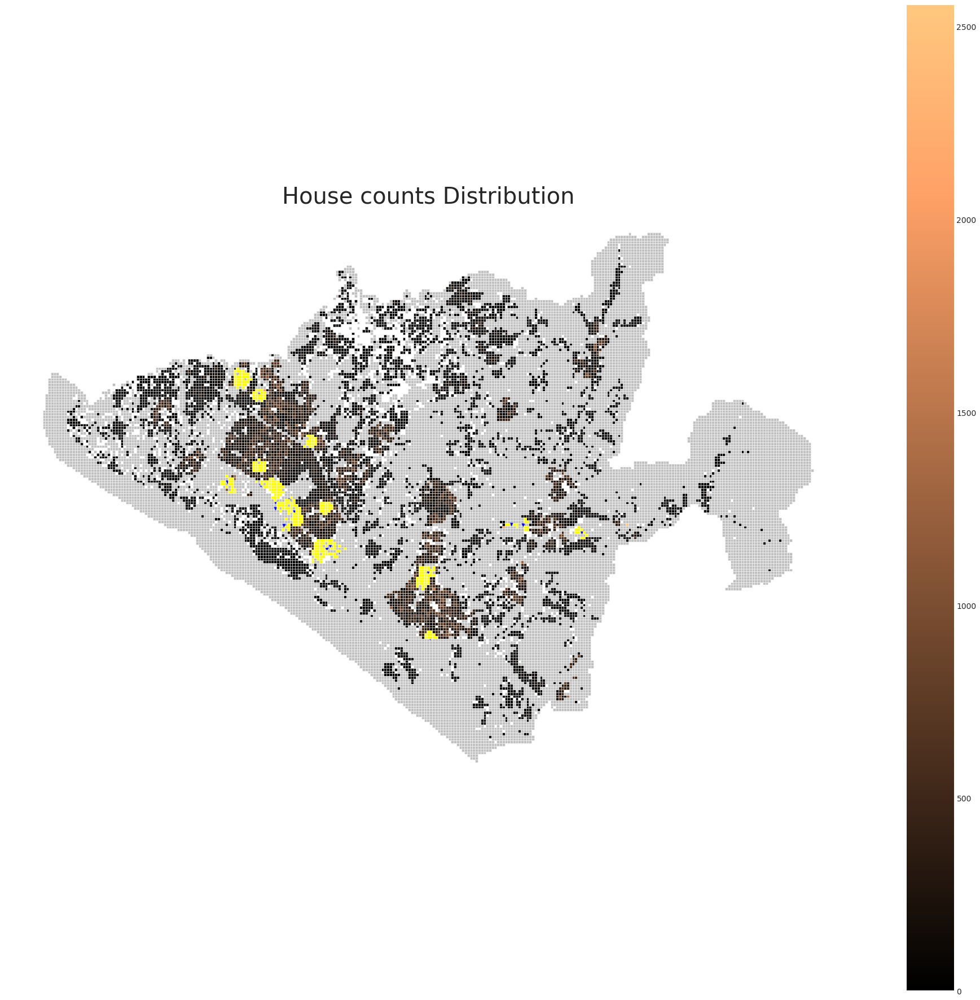

In [167]:
# 선별된 상업지역 시각화
ax = house_counts_not_zero_gdf.plot( column="pop", cmap='copper', figsize = (30,30), legend=True)
building_area_zero_gdf.plot(color="silver", ax=ax)
station_cover_below1.plot(ax=ax, marker='v', markersize = 30, color='blue')
house_counts_gdf[house_counts_gdf["not_commerical_area_percentage"] < 100].plot(marker='v', color = 'yellow', ax=ax)
ax.set_title("House counts Distribution", fontsize=40)
ax.set_axis_off()
plt.show()

흰 지역은 주거용 건축물이 하나도 없는 지역을 의미한다.

빨간 점으로 표시된 주변 지역은 주거용 건축물이 거의 없으면, 실제 지도와 비교 분석해본 결과 **고양시 주요 상업지구로 판단**해도 문제가 없다는 것을 확인했다.


![KakaoTalk_Photo_2020-09-08-18-00-25](https://user-images.githubusercontent.com/37871541/92455884-310a4d00-f1fd-11ea-81c2-e12997c00e85.png)


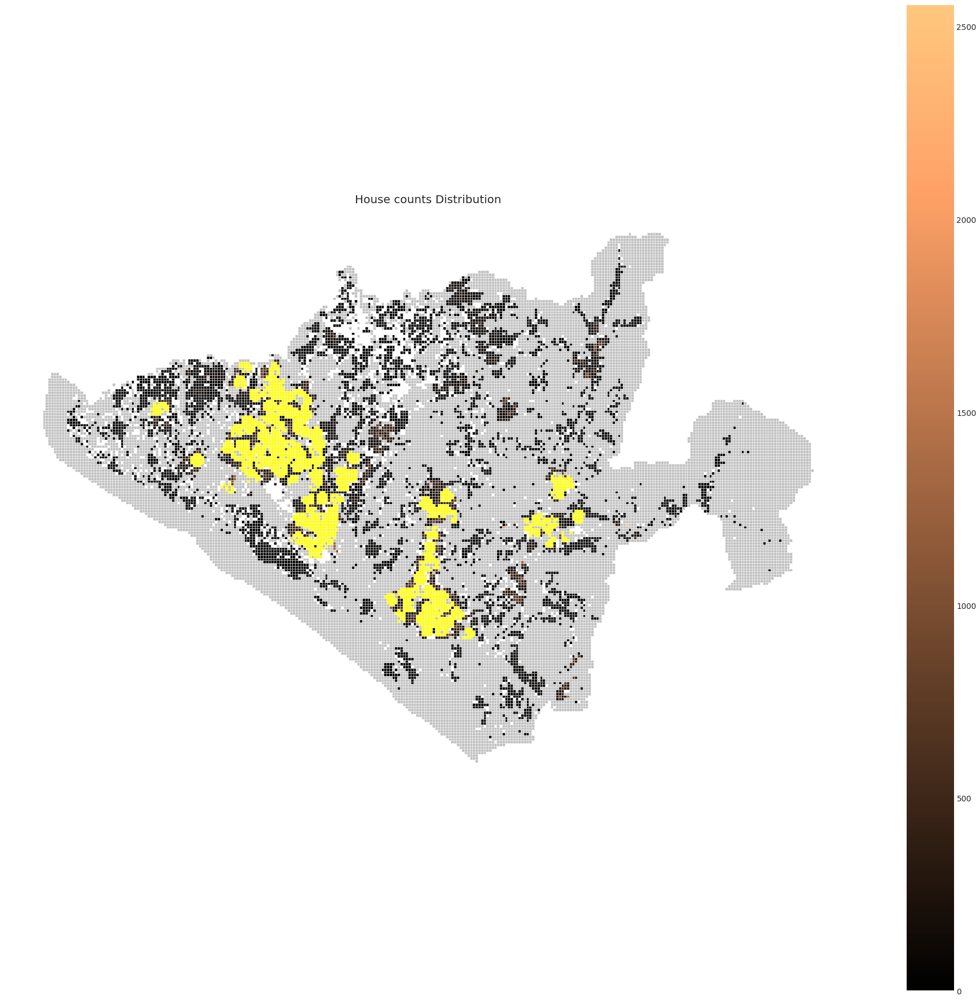

In [168]:
# 선별된 주거지역 시각화
ax = house_counts_not_zero_gdf.plot( column="pop", cmap='copper', figsize = (30,30), legend=True)
building_area_zero_gdf.plot(color="silver", ax=ax)
house_counts_gdf[house_counts_gdf["not_residential_area_percentage"] < 100].plot(marker='v', color = 'yellow', ax=ax)
ax.set_title("House counts Distribution", fontsize=20)
ax.set_axis_off()
plt.show()

In [169]:
house_counts_gdf["commerical_area"] = house_counts_gdf["not_commerical_area_percentage"].apply(lambda x: 0 if x == 100.0 else 1 )
house_counts_gdf["residential_area"] = house_counts_gdf["not_residential_area_percentage"].apply(lambda x: 0 if x == 100.0 else 2)
house_counts_gdf["areatype"] = house_counts_gdf["commerical_area"] + house_counts_gdf["residential_area"]
house_counts_gdf.head()

,gid,b_area,geometry,pop,HOUSE_COUNTS,not_commerical_area_percentage,not_residential_area_percentage,commerical_area,residential_area,areatype
0,다사277649,107.70,"MULTIPOLYGON (((927700.000 1964900.000, 927700...",0.0,1,100.0,100.0,0,0,0
1,다사277650,149.10,"MULTIPOLYGON (((927700.000 1965000.000, 927700...",0.0,0,100.0,100.0,0,0,0
2,다사277651,198.00,"MULTIPOLYGON (((927700.000 1965100.000, 927700...",0.0,0,100.0,100.0,0,0,0
3,다사277652,173.16,"MULTIPOLYGON (((927700.000 1965200.000, 927700...",8.0,2,100.0,100.0,0,0,0
4,다사277653,161.00,"MULTIPOLYGON (((927700.000 1965300.000, 927700...",11.0,1,100.0,100.0,0,0,0


주거 지역 역시 파악해 본 결과 대다수의 거치대가 아파트 근처이거나 거주지임을 확인했다.

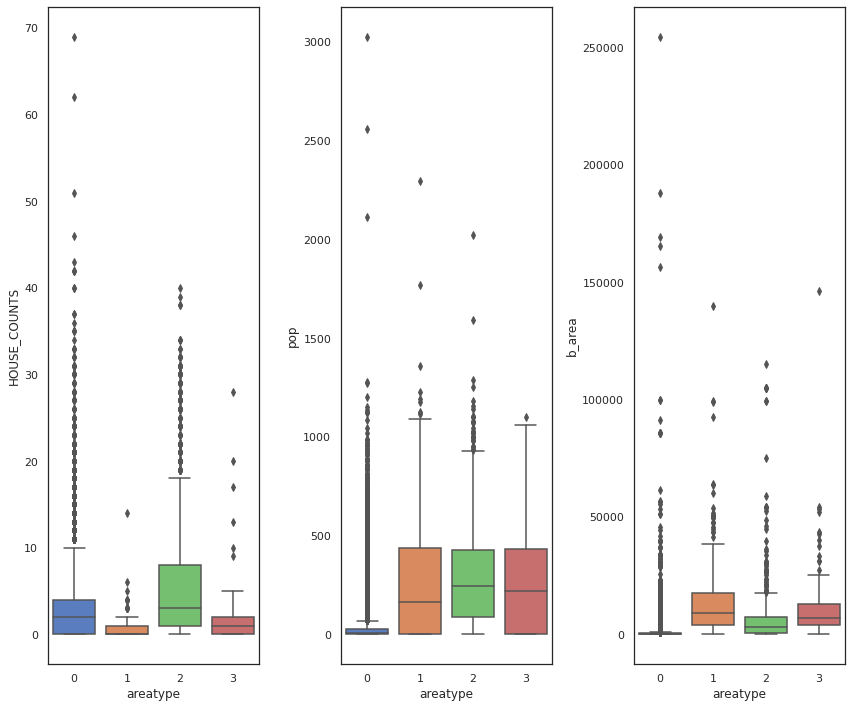

In [170]:
sns.set(style="white", palette="muted", color_codes=True)
fig, axes = plt.subplots(nrows=1,ncols=3)
fig.set_size_inches(12, 10)

sns.boxplot(x="areatype", y="HOUSE_COUNTS", data=house_counts_gdf, ax=axes[0])
sns.boxplot(x="areatype", y="pop", data=house_counts_gdf, ax=axes[1])
sns.boxplot(x="areatype", y="b_area", data=house_counts_gdf, ax=axes[2])


plt.tight_layout()
plt.show()

|areatype|describe|
|:-:|:-:|
|0| 어느곳에도 포함되지 않는 지역|
|1| 상업지역|
|2| 주거지역|
|3| 상업지역 & 주거지역|

위에 그래프들을 보면 주거지역이나 상업지역 어느 곳에도 들지 못한 areatype = 0인 구역에 상당히 많은 아웃라이어들이 보인다.

이는 현재 배치된 **자전거 거치대**을 바탕으로 주거, 상업지역을 판단했기 때문으로, 
현재 자전거 정류장이 **cover하지 못한 주거 지역들이 다수 존재**하는 것으로 판단할 수 있다.

따라서 상업지역은 그 지역의 특성을 대변하는 것으로 사용해도 되지만, 주거지역은 이 데이터만을 믿고 추출하는 것에 무리가 있다. 따라서 추후 주거지역을 기반으로 특성을 추출할 때, 이 데이터 이외에 다른 지표를 기반으로 주거지역을 대변할 필요가 있다.

## 2.2 수요의 관점

자전거의 이용횟수를 수요라고 보았을 때, 다양한 관점으로 이를 관찰하며 어떠한 특징이 있는지 확인한다.

* 2.2.1 행정동 별 구분
    * 2.2.1.1 자전거 개수
    * 2.2.1.2 총 자전거 이용량 (반입량+반출량)의 일별 평균 : 절대 수요
    * 2.2.1.3 총 자전거 변화량 (반입량-반출량)의 일별 평균 : 상대 수요
* 2.2.2 상업/거주인구 대비 이용량

    


### 2.2.1 행정동 별 구분
* 2.2.1.1 자전거 개수
* 2.2.1.2 총 자전거 이용량 (반입량+반출량)의 일별 평균 : 절대 수요
* 2.2.1.3 총 자전거 변화량 (반입량-반출량)의 일별 평균 : 상대 수요

#### 2.2.1.1 자전거 개수

In [171]:
# 행정동 내 자전거 거치대 개수를 파악한다.
from branca.colormap import linear

m = folium.Map(center, zoom_start=12,tiles=None)


# feature groups
# feature_group0 = folium.FeatureGroup(name='TOTAL_POP',overlay=False).add_to(m) # 행정동 인구수
feature_group1= folium.FeatureGroup(name='STATION_COUNT',overlay=False).add_to(m) # 행정동 내 자전거 정류장 수
# feature_group2 = folium.FeatureGroup(name='STATION_PER_POP',overlay=False).add_to(m) # 자전거 정류장 하나 당 커버하는 행정동 인구수


fs = [feature_group1]#,feature_group1]#,feature_group2]
feature_list = ["STATION_COUNT"]#,"STATION_COUNT"]#,"STATION_PER_POP"]
for i in range(len(feature_list)): 
    choropleth1 = folium.Choropleth(
    geo_data=gdf_boundary_town,
    name='choropleth',
    data=gdf_boundary_town,
    columns=['DONG_NM', feature_list[i]],
    key_on='feature.properties.DONG_NM',
    fill_color='YlGn',
    nan_fill_color="black",
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Arrival (in Quintal)',
    highlight=True,
    line_color='black').geojson.add_to(fs[i])

    colormap = linear.YlGn_09.scale(
    gdf_boundary_town[feature_list[i]].min(),
    gdf_boundary_town[feature_list[i]].max()).to_step(10)
    colormap.caption = feature_list[i]
    colormap.add_to(m)
    
   
folium.TileLayer('cartodbpositron',overlay=True,name="background").add_to(m)
folium.LayerControl('topright',collapsed=False).add_to(m)

m

#### 2.2.1.2 총 자전거 이용량 (반입량+반출량)의 일별 평균 : 절대 수요

In [172]:
# 행정동별 총 자전거 이용량 (반입량+반출량)의 일별 평균 : 절대 수요을 시각화한다.
from branca.colormap import linear

m = folium.Map(center, zoom_start=12,tiles=None)


# feature groups
feature_group0 = folium.FeatureGroup(name='STATION_TOTAL_MEAN',overlay=False).add_to(m) # 행정동별 총 자전거 이용량
# feature_group1= folium.FeatureGroup(name='STATION_RTN-LEAS_MEAN',overlay=False).add_to(m) # 행정동별 정류장들의 (자전거 반입량 - 반출량) 평균
# feature_group2 = folium.FeatureGroup(name='STATION_RTN_COUNTS',overlay=False).add_to(m) # 행정동별 총 자전거 반입량
# feature_group3 = folium.FeatureGroup(name='STATION_LEAS_COUNTS',overlay=False).add_to(m) # 행정동별 총 자전거 반출량
# feature_group4 = folium.FeatureGroup(name='RIDE_PER_POP',overlay=False).add_to(m) # 행정동별 한명당 자전거 이용량

fs = [feature_group0]#,feature_group1,feature_group2,feature_group3,feature_group4]
feature_list = ["STATION_TOTAL_MEAN"]#,"STATION_RTN-LEAS_MEAN","STATION_RTN_COUNTS","STATION_LEAS_COUNTS","RIDE_PER_POP"]
for i in range(len(feature_list)): 
    choropleth1 = folium.Choropleth(
    geo_data=gdf_boundary_town,
    name='choropleth',
    data=gdf_boundary_town,
    columns=['DONG_NM', feature_list[i]],
    key_on='feature.properties.DONG_NM',
    fill_color='YlGn',
    nan_fill_color="black",
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Arrival (in Quintal)',
    highlight=True,
    line_color='black').geojson.add_to(fs[i])

    colormap = linear.YlGn_09.scale(
    gdf_boundary_town[feature_list[i]].min(),
    gdf_boundary_town[feature_list[i]].max()).to_step(10)
    colormap.caption = feature_list[i]
    colormap.add_to(m)
    
   
folium.TileLayer('cartodbpositron',overlay=True,name="background").add_to(m)
folium.LayerControl('topright',collapsed=False).add_to(m)

m

#### 2.2.1.3 총 자전거 변화량 (반입량-반출량)의 일별 평균 : 상대 수요

In [173]:
# 행정동별 정류장들의 총 자전거 이용량 (반입량-반출량)의 일별 평균 : 상대 수요을 시각화한다.
from branca.colormap import linear

m = folium.Map(center, zoom_start=12,tiles=None)


# feature groups
# feature_group0 = folium.FeatureGroup(name='STATION_TOTAL',overlay=False).add_to(m) # 행정동별 총 자전거 이용량
feature_group1= folium.FeatureGroup(name='STATION_RTN-LEAS_MEAN',overlay=False).add_to(m) # 행정동별 정류장들의 (자전거 반입량 - 반출량) 평균
# feature_group2 = folium.FeatureGroup(name='STATION_RTN_COUNTS',overlay=False).add_to(m) # 행정동별 총 자전거 반입량
# feature_group3 = folium.FeatureGroup(name='STATION_LEAS_COUNTS',overlay=False).add_to(m) # 행정동별 총 자전거 반출량
# feature_group4 = folium.FeatureGroup(name='RIDE_PER_POP',overlay=False).add_to(m) # 행정동별 한명당 자전거 이용량

fs = [feature_group1]#,feature_group1,feature_group2,feature_group3,feature_group4]
feature_list = ["STATION_RTN-LEAS_MEAN"]#,"STATION_RTN-LEAS_MEAN","STATION_RTN_COUNTS","STATION_LEAS_COUNTS","RIDE_PER_POP"]
for i in range(len(feature_list)): 
    choropleth1 = folium.Choropleth(
    geo_data=gdf_boundary_town,
    name='choropleth',
    data=gdf_boundary_town,
    columns=['DONG_NM', feature_list[i]],
    key_on='feature.properties.DONG_NM',
    fill_color='YlGn',
    nan_fill_color="black",
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Arrival (in Quintal)',
    highlight=True,
    line_color='black').geojson.add_to(fs[i])

    colormap = linear.YlGn_09.scale(
    gdf_boundary_town[feature_list[i]].min(),
    gdf_boundary_town[feature_list[i]].max()).to_step(10)
    colormap.caption = feature_list[i]
    colormap.add_to(m)
    
   
folium.TileLayer('cartodbpositron',overlay=True,name="background").add_to(m)
folium.LayerControl('topright',collapsed=False).add_to(m)

m

1. 거치대는 일산 동구에 대다수가 위치해 있다.
2. 절대적인 수요만을 판단했을 때, 호수 공원과 상업 지구가 위치한 장항 2동이 가장 많았다.
3. 상대적인 수요를 고려했을 때는, 일산 동구 거주지 부근에서는 반출이, 호수 공원 주변에서는 반입량이 많았다.

결과적으로, 거주지역과 상업지역에 따른 반입, 반출의 특징이 상이한 것을 확인할 수 있었다.

### 2.2.2 상업/거주 지역 이용량 비교

2.1.1.2절에서 진행한 상업/거주지역에 따른 이용량을 비교해 본다.

|variable|means|
|:-:|:-:|
|TOTAL| 절대 수요(이용량) |
|pop_200_sum| 200m 내 주변 인구 대비 이용량|
|RTN-LEAS|상대 수요(이용량)|



In [174]:
gdf_station_cover["area_station_type"] = gdf_station_cover["HOUSE_COUNTS_200_mean"].apply(lambda x: 1 if x <= 1.0 else 0)
gdf_station_cover.tail()

,STATION_ID,STATION_NM,HOLDER_CAPACITY,LAT,LON,geometry,altitude,LEAS_COUNTS,RTN_COUNTS,TOTAL,RTN-LEAS,LEAS_MEAN,RTN_MEAN,TOTAL_MEAN,RTN-LEAS_MEAN,pop_200_sum,b_area_200_sum,HOUSE_COUNTS_200_mean,area_station_type
150,348,★하이파크3단지 302동앞 버스정류장옆,30,37.699353,126.754793,POINT (934306.141 1966904.704),32.0,4551.0,2925.0,7476.0,-1626.0,4.156164,2.673675,6.827397,-1.486685,678.0,30425.13,1.00,1
151,349,★고양시 여성창업지원센터 옆,20,37.697838,126.752642,POINT (934115.175 1966738.127),22.0,7532.0,6336.0,13868.0,-1196.0,6.878539,5.786301,12.664840,-1.093236,1760.0,57172.45,1.75,0
152,350,★하이파크5단지 502동앞 버스정류장,20,37.697867,126.753089,POINT (934154.608 1966741.031),26.0,4190.0,3662.0,7852.0,-528.0,3.829982,3.344292,7.170776,-0.482192,550.0,23127.25,1.00,1
153,351,◆일산에듀포레 푸르지오,40,37.702259,126.767231,POINT (935405.196 1967218.501),38.0,473.0,406.0,879.0,-67.0,4.730000,4.060000,8.790000,-0.258065,464.0,2628.42,2.00,0
154,992,★피프틴센터,4,37.637529,126.833760,POINT (941218.850 1959993.001),13.0,952.0,795.0,1747.0,-157.0,0.871795,0.728022,1.599817,-0.144700,277.0,8119.50,2.00,0


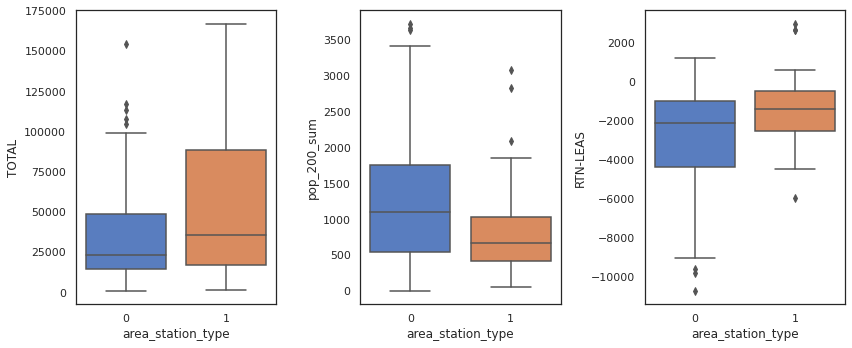

In [175]:
sns.set(style="white", palette="muted", color_codes=True)
fig, axes = plt.subplots(nrows=1,ncols=3)
fig.set_size_inches(12, 5)

sns.boxplot(x="area_station_type", y="TOTAL", data=gdf_station_cover, ax=axes[0])
sns.boxplot(x="area_station_type", y="pop_200_sum", data=gdf_station_cover, ax=axes[1])
sns.boxplot(x="area_station_type", y="RTN-LEAS", data=gdf_station_cover, ax=axes[2])


plt.tight_layout()
plt.show()

위의 boxplot을 가지고 알 수 있는 점은 다음과 같다.

1. 전체 수요에 있어 상업지역 주변 정류장들이 확실히 주거지역 주변 정류장들보다는 많은 이용량을 가짐을 알 수 있다.
2. 상업지역 주변 정류장들의 주변 인구 대비 이용량이 주거지역보다 높다.
3. 주거지역 주변 정류장이 상업지역 주변 정류장보다 반출량이 훨씬 많음을 알 수 있다. 즉, 주거 지역에서 이외 지역으로 나갈때 많이 사용하는 반면 상업지역에서는 그런 경향이 덜하다.

## 2.3 접근성의 관점
* 2.3.1 거치대 기반 고도
* 2.3.2 거치대 근처 교통 시설
    * 버스정류장
    * 지하철역
* 2.3.3 거치대 근처 공공시설
    * 교육시설
    * 문화시설
    * 체육시설
* 2.3.4 고양시 도로 파악
    * 시군구 도로

### 2.3.1 거치대 기반 고도 분포

정류장의 고도 분포를 확인하고, 상한 하한을 설정한다.

<AxesSubplot:xlabel='altitude'>

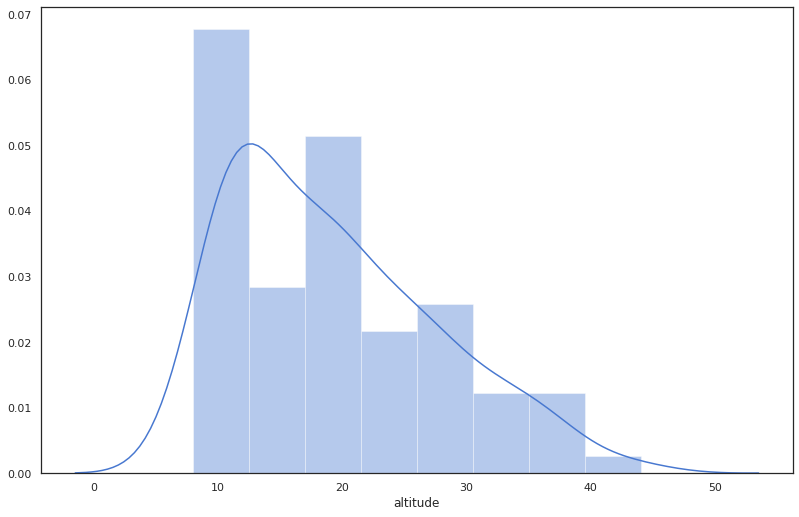

In [176]:
sns.distplot(station_df["altitude"])

In [177]:
bike_station_mean_altitude = np.mean(station_df["altitude"])
print("현재 정류장의 평균 고도 : ", bike_station_mean_altitude)

bike_station_std_altitude = np.std(station_df["altitude"])
print("현재 정류장의 표준편차 : ", bike_station_std_altitude)

현재 정류장의 평균 고도 :  19.265243902439025
현재 정류장의 표준편차 :  8.258112009709112


굉장히 skew한 분포임을 알 수 있다.

10~20m에 많은 정류장이 분포하고 있음을 알 수 있다.

In [178]:
# 정류장 고도 기반 total 수요 보기
gdf_station_altitude = gdf_station[['altitude', 'TOTAL']]
gdf_station_altitude.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
altitude,155.0,19.145161,8.235765,8.0,12.0,17.5,24.5,44.0
TOTAL,155.0,37981.167742,34597.936372,678.0,14616.5,25213.0,52878.5,166852.0


In [179]:
# 고도에 따른 수요 plot
bound = 25
gdf_station_altitude['altitude_bounds'] = pd.cut(gdf_station['altitude'], bins=[8, bound, 44], labels=['low', 'high'])
gdf_station_altitude.head()

,altitude,TOTAL,altitude_bounds
0,14.0,17573.0,low
1,18.0,9656.0,low
2,35.0,22732.0,high
3,19.0,5502.0,low
4,18.0,6801.0,low


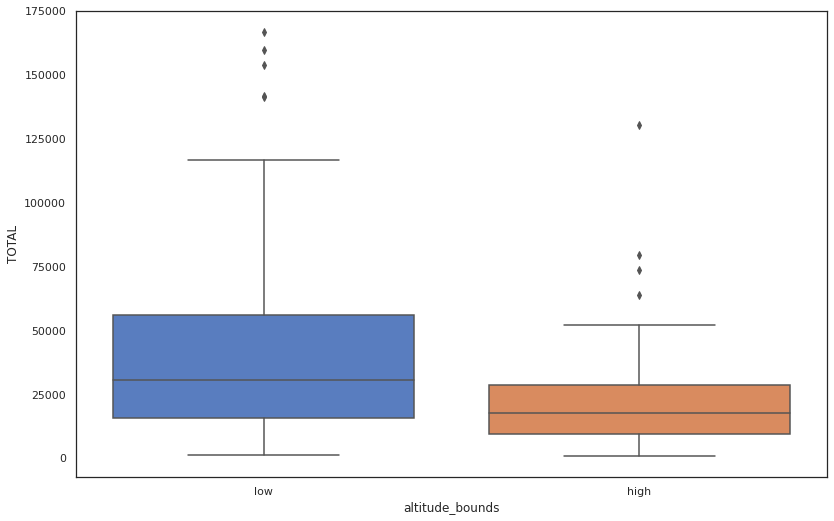

In [180]:
# 1분위수에 해당하는 25m를 기준으로 group을 나누고 boxplot을 그려보았다.
sns.boxplot(x="altitude_bounds", 
            y="TOTAL", 
            data=gdf_station_altitude)
plt.show()

In [181]:
print("LOW  평균 수요 : " , gdf_station_altitude[gdf_station_altitude['altitude_bounds'] == 'low']['TOTAL'].mean())
print("HIGH 평균 수요 : " , gdf_station_altitude[gdf_station_altitude['altitude_bounds'] == 'high']['TOTAL'].mean())
print("LOW  갯수 : " , gdf_station_altitude[gdf_station_altitude['altitude_bounds'] == 'low']['TOTAL'].count())
print("HIGH 갯수 : " , gdf_station_altitude[gdf_station_altitude['altitude_bounds'] == 'high']['TOTAL'].count())

LOW  평균 수요 :  42159.13675213675
HIGH 평균 수요 :  26445.666666666668
LOW  갯수 :  117
HIGH 갯수 :  36


1분위 수에 해당하는 25m를 기준으로 boxplot을 그려보았을 때, 두 집단의 평균차이가 유의미하게 남을 확인할 수 있다.

이를 기반으로 접근성이 용이한 기준을 약 25m로 선정할 것이다.

### 2.3.2 거치대 근처 교통시설
자전거 거치대 주변에 있는 대중교통과의 연관성을 파악한다.

2.3.2.1 근처 버스정류장 수
2.3.2.2 근처 버스정류장 승하차 평균
2.3.2.3 근처 지하철 수
2.3.2.4 근처 지하철 승하차 평균

In [182]:
import copy
import time
from haversine import haversine

def countCloseLandmarks(df1, df2, boundary, prefix):
    global check
    """
    <input>
    df1 : 주변 정보를 셀 위치 정보(자전거 정류장)
    df2 : 주변 위치 정보(버스정류장, 지하철역))
    boundary : 
    prefix : 생성될 변수명 앞에 붙을 접두어
    """
    # 1. df2의 lat, lon을 str로 변환한다.
    # 2. 이걸 기반으로 lon_lat 변수를 만든다.
    # 3. 거리를 계산한 np.array를 반환한다.
    # 4. 그 np.array에서 조건을 걸고 넘는 것의 개수를 반환하여 ret_df에 추가한다.
    ret_df = copy.deepcopy(df1)
    count_df = copy.deepcopy(df2)
    
    count_df["LON"] = count_df["LON"].apply(lambda x: str(x))
    count_df["LAT"] = count_df["LAT"].apply(lambda x: str(x))
    count_df["LAT_LON"] = count_df["LAT"] + ' ' + count_df["LON"]    
    count_loc_list = count_df["LAT_LON"].to_numpy()
    
    start = time.time()
    for i in range(ret_df.shape[0]):
        if ret_df.shape[0] > 1000 and i % 1000 == 0:
            print("진행중 {} / {} ".format(i , ret_df.shape[0]))
            print("진행 시간", time.time() - start)
        tar_loc = (ret_df.loc[i, "LAT"], ret_df.loc[i, "LON"])
        f = lambda x: haversine(tar_loc, (float(x.split(' ')[0]), float(x.split(' ')[1])), unit = 'km')
        result = np.fromiter((f(count_loc) for count_loc in count_loc_list), np.float, count=len(count_loc_list))
        check = result
        cnt_loc = sum(result <= boundary)
        ret_df.loc[i, f'{prefix}_cnt_{int(boundary*1000)}m'] = cnt_loc
    
    
    return ret_df

In [183]:
import copy

def calculateCloseLandmarkFeatures(df1, df2, boundary, prefix, feature, method=sum):
    """
    <describe>
    feature에 있는 nan를 지운 상태에서 승하차 인원 수를 더한다.
    <input>
    df1 : 주변 정보를 셀 위치 정보(자전거 정류장)
    df2 : 주변 위치 정보(버스정류장, 지하철역))
    boundary : 
    prefix : 생성될 변수명 앞에 붙을 접두어
    feature : 연산을 수행할 feature (승하차)
    method : sum, np.mean
    """
    # 1. df2의 lat, lon을 str로 변환한다.
    # 2. 이걸 기반으로 lon_lat 변수를 만든다.
    # 3. 거리를 계산한 np.array를 반환한다.
    # 4. 그 np.array에서 조건을 걸고 넘는 것의 데이터를 검색하여 연산을 진행한다.
    ret_df = copy.deepcopy(df1)
    count_df = copy.deepcopy(df2)
    count_df = count_df[count_df[feature].notnull()]
    
    count_df["LON"] = count_df["LON"].apply(lambda x: str(x))
    count_df["LAT"] = count_df["LAT"].apply(lambda x: str(x))
    count_df["LAT_LON"] = count_df["LAT"] + ' ' + count_df["LON"]    
    count_loc_list = count_df["LAT_LON"].to_numpy()

    start = time.time()
    for i in range(ret_df.shape[0]):
        if ret_df.shape[0] > 1000 and i % 1000 == 0:
            print("진행중 {} / {} ".format(i , ret_df.shape[0]))
            print("진행 시간", time.time() - start)
        tar_loc = (ret_df.loc[i, "LAT"], ret_df.loc[i, "LON"])
        f = lambda x: haversine(tar_loc, (float(x.split(' ')[0]), float(x.split(' ')[1])), unit = 'km')
        result = np.fromiter((f(count_loc) for count_loc in count_loc_list), np.float, count=len(count_loc_list))
        cal_result = method(count_df.loc[(result <= boundary), feature])
        ret_df.loc[i, f'{prefix}_{feature}_{method.__name__}_{int(boundary*1000)}m'] = cal_result
    
    
    return ret_df

#### 2.3.2.1 근처 버스정류장 수

In [184]:
station_eda_df = copy.deepcopy(station_df)
station_eda_df = countCloseLandmarks(station_eda_df, busstop_df, 0.2, "busstop")
station_eda_df = countCloseLandmarks(station_eda_df, busstop_df, 0.3, "busstop")
station_eda_df = countCloseLandmarks(station_eda_df, busstop_df, 0.5, "busstop")
station_eda_df.head()

,STATION_ID,STATION_NM,HOLDER_CAPACITY,LAT,LON,geometry,altitude,busstop_cnt_200m,busstop_cnt_300m,busstop_cnt_500m
0,101,어울림마을 701동 앞,20,37.654775,126.834584,POINT (126.83458 37.65477),14.0,5.0,21.0,38.0
1,103,대림e-편한세상106동,20,37.660442,126.840377,POINT (126.84038 37.66044),18.0,3.0,7.0,25.0
2,104,탄현마을8단지,25,37.698523,126.766042,POINT (126.76604 37.69852),35.0,6.0,15.0,25.0
3,105,KT 덕양지사 앞,20,37.655244,126.839261,POINT (126.83926 37.65524),19.0,5.0,12.0,34.0
4,106,원당역 앞 공영주차장,30,37.653410,126.842530,POINT (126.84253 37.65341),18.0,6.0,8.0,15.0


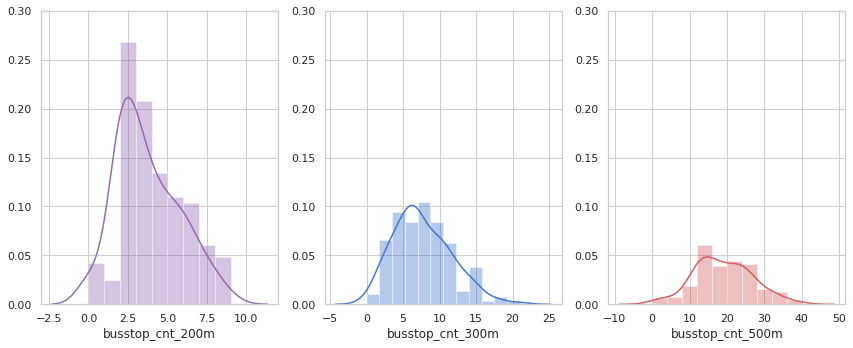

In [185]:
sns.set(style="whitegrid", palette="muted", color_codes=True)
fig, axes = plt.subplots(nrows=1,ncols=3)
fig.set_size_inches(12, 5)

x200 = station_eda_df["busstop_cnt_200m"]
x300 = station_eda_df["busstop_cnt_300m"]
x500 = station_eda_df["busstop_cnt_500m"]
sns.distplot(x200, color="m", ax=axes[0])
sns.distplot(x300, color="b", ax=axes[1])
sns.distplot(x500, color="r", ax=axes[2])

axes[0].set_yticks([0, 0.05, 0.1, 0.15, 0.2, 0.25, 0.3])
axes[1].set_yticks([0, 0.05, 0.1, 0.15, 0.2, 0.25, 0.3])
axes[2].set_yticks([0, 0.05, 0.1, 0.15, 0.2, 0.25, 0.3])

# plt.setp(axes, yticks=[])
plt.tight_layout()
plt.show()

200, 300, 500m 단위로 정류장 수를 시각화해보았을 때, 200, 300은 약간의 왜도를 가지는 분포가 생성되었으며, 500m를 보면 정규분포에 근사한 것을 확인할 수 있다.

200m기준으로 약 2~5개의 정류장이 분포한 위치가 사용량이 많다.

#### 2.3.2.2 근처 버스정류장 승하차인원

In [186]:
station_eda_df = copy.deepcopy(station_df)
station_eda_df = calculateCloseLandmarkFeatures(station_eda_df, busstop_df, 0.2, "busstop", "GETON_CNT", sum)
station_eda_df = calculateCloseLandmarkFeatures(station_eda_df, busstop_df, 0.3, "busstop", "GETON_CNT", sum)
station_eda_df = calculateCloseLandmarkFeatures(station_eda_df, busstop_df, 0.5, "busstop", "GETON_CNT", sum)
station_eda_df = calculateCloseLandmarkFeatures(station_eda_df, busstop_df, 0.2, "busstop", "GETON_CNT", np.mean)
station_eda_df = calculateCloseLandmarkFeatures(station_eda_df, busstop_df, 0.3, "busstop", "GETON_CNT", np.mean)
station_eda_df = calculateCloseLandmarkFeatures(station_eda_df, busstop_df, 0.5, "busstop", "GETON_CNT", np.mean)
station_eda_df.head()

,STATION_ID,STATION_NM,HOLDER_CAPACITY,LAT,LON,geometry,altitude,busstop_GETON_CNT_sum_200m,busstop_GETON_CNT_sum_300m,busstop_GETON_CNT_sum_500m,busstop_GETON_CNT_mean_200m,busstop_GETON_CNT_mean_300m,busstop_GETON_CNT_mean_500m
0,101,어울림마을 701동 앞,20,37.654775,126.834584,POINT (126.83458 37.65477),14.0,22817.0,142127.0,228849.0,4563.400000,7895.944444,6538.542857
1,103,대림e-편한세상106동,20,37.660442,126.840377,POINT (126.84038 37.66044),18.0,12482.0,37794.0,81961.0,4160.666667,5399.142857,3278.440000
2,104,탄현마을8단지,25,37.698523,126.766042,POINT (126.76604 37.69852),35.0,38767.0,53381.0,78852.0,6461.166667,3558.733333,3428.347826
3,105,KT 덕양지사 앞,20,37.655244,126.839261,POINT (126.83926 37.65524),19.0,57388.0,136789.0,422520.0,11477.600000,11399.083333,13629.677419
4,106,원당역 앞 공영주차장,30,37.653410,126.842530,POINT (126.84253 37.65341),18.0,241438.0,257783.0,308135.0,40239.666667,32222.875000,20542.333333


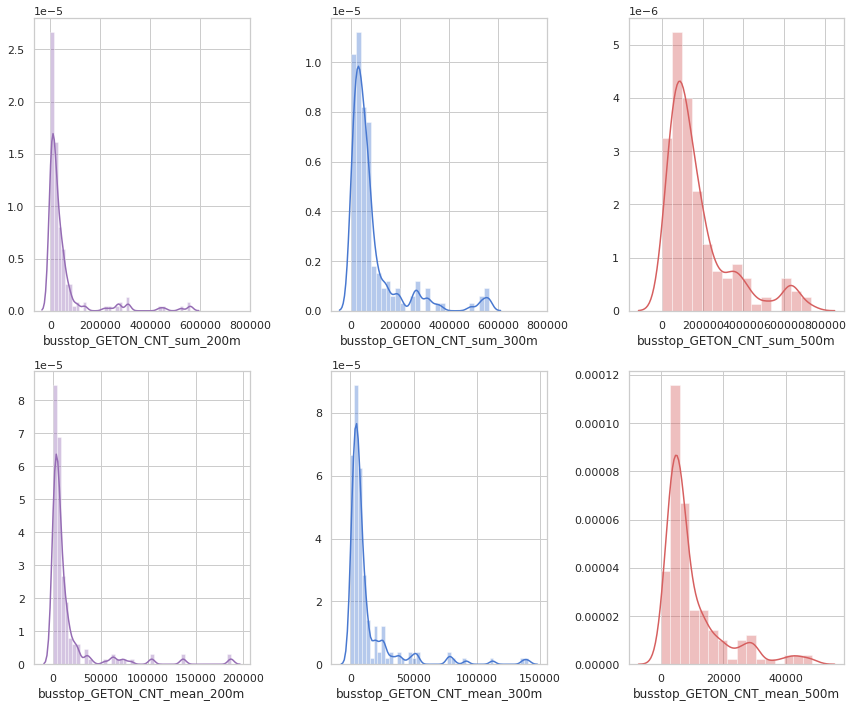

In [187]:
sns.set(style="whitegrid", palette="muted", color_codes=True)
fig, axes = plt.subplots(nrows=2,ncols=3)
fig.set_size_inches(12, 10)

x200 = station_eda_df["busstop_GETON_CNT_sum_200m"]
x300 = station_eda_df["busstop_GETON_CNT_sum_300m"]
x500 = station_eda_df["busstop_GETON_CNT_sum_500m"]
a = sns.distplot(x200, color="m", ax=axes[0,0])
b = sns.distplot(x300, color="b", ax=axes[0,1])
c = sns.distplot(x500, color="r", ax=axes[0,2])

axes[0,0].set_xticks([0, 200000, 400000, 600000, 800000])
axes[0,1].set_xticks([0, 200000, 400000, 600000, 800000])
axes[0,2].set_xticks([0, 200000, 400000, 600000, 800000])


x200 = station_eda_df["busstop_GETON_CNT_mean_200m"]
x300 = station_eda_df["busstop_GETON_CNT_mean_300m"]
x500 = station_eda_df["busstop_GETON_CNT_mean_500m"]
a = sns.distplot(x200, color="m", ax=axes[1,0])
b = sns.distplot(x300, color="b", ax=axes[1,1])
c = sns.distplot(x500, color="r", ax=axes[1,2])

# a.set_xticklabels(rotation=30)

# axes[0].set_yticks([0, 0.05, 0.1, 0.15, 0.2, 0.25, 0.3])
# axes[1].set_yticks([0, 0.05, 0.1, 0.15, 0.2, 0.25, 0.3])
# axes[2].set_yticks([0, 0.05, 0.1, 0.15, 0.2, 0.25, 0.3])

# plt.setp(axes, yticks=[])
plt.tight_layout()
plt.show()

굉장히 왜도가 높은 분포가 형성되었다.

이는 대부분의 자전거 정류장이 사용량이 많지 않은 정류장을 대거 포함하고 있다는 사실을 대변한다.

#### 2.3.2.3 근처 지하철역 수

In [188]:
# 지하철 관련
station_eda_df = copy.deepcopy(station_df)
station_eda_df = countCloseLandmarks(station_eda_df, subway_space_df, 0.5, "subway")
station_eda_df = countCloseLandmarks(station_eda_df, subway_space_df, 1.0, "subway")
station_eda_df = countCloseLandmarks(station_eda_df, subway_space_df, 1.5, "subway")
station_eda_df.head()

,STATION_ID,STATION_NM,HOLDER_CAPACITY,LAT,LON,geometry,altitude,subway_cnt_500m,subway_cnt_1000m,subway_cnt_1500m
0,101,어울림마을 701동 앞,20,37.654775,126.834584,POINT (126.83458 37.65477),14.0,0.0,1.0,1.0
1,103,대림e-편한세상106동,20,37.660442,126.840377,POINT (126.84038 37.66044),18.0,0.0,1.0,1.0
2,104,탄현마을8단지,25,37.698523,126.766042,POINT (126.76604 37.69852),35.0,0.0,1.0,1.0
3,105,KT 덕양지사 앞,20,37.655244,126.839261,POINT (126.83926 37.65524),19.0,1.0,1.0,1.0
4,106,원당역 앞 공영주차장,30,37.653410,126.842530,POINT (126.84253 37.65341),18.0,1.0,1.0,1.0


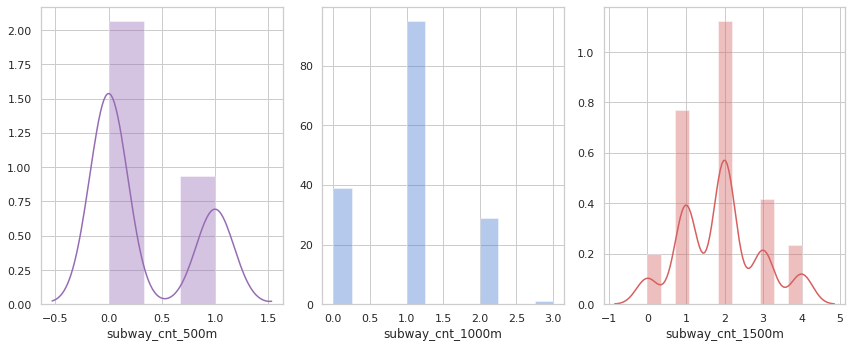

In [189]:
sns.set(style="whitegrid", palette="muted", color_codes=True)
fig, axes = plt.subplots(nrows=1,ncols=3)
fig.set_size_inches(12, 5)

x200 = station_eda_df["subway_cnt_500m"]
x300 = station_eda_df["subway_cnt_1000m"]
x500 = station_eda_df["subway_cnt_1500m"]
sns.distplot(x200, color="m", ax=axes[0])
sns.distplot(x300, color="b", kde=False, ax=axes[1])
sns.distplot(x500, color="r", ax=axes[2])

# axes[0].set_yticks([0, 0.05, 0.1, 0.15, 0.2, 0.25, 0.3])
# axes[1].set_yticks([0, 0.05, 0.1, 0.15, 0.2, 0.25, 0.3])
# axes[2].set_yticks([0, 0.05, 0.1, 0.15, 0.2, 0.25, 0.3])

# plt.setp(axes, yticks=[])
plt.tight_layout()
plt.show()

버스 정류장과 다르게, 자전거 정류장 주변에 지하철 역은 많이 분포하지 않는 것으로 보인다.

#### 2.3.2.4 근처 지하철역 승하차인원

In [190]:
station_eda_df = copy.deepcopy(station_df)
station_eda_df = calculateCloseLandmarkFeatures(station_eda_df, subway_space_df, 0.5, "subway", "IN", sum)
station_eda_df = calculateCloseLandmarkFeatures(station_eda_df, subway_space_df, 1.0, "subway", "IN", sum)
station_eda_df = calculateCloseLandmarkFeatures(station_eda_df, subway_space_df, 1.5, "subway", "IN", sum)
station_eda_df = calculateCloseLandmarkFeatures(station_eda_df, subway_space_df, 0.5, "subway", "IN", np.mean)
station_eda_df = calculateCloseLandmarkFeatures(station_eda_df, subway_space_df, 1.0, "subway", "IN", np.mean)
station_eda_df = calculateCloseLandmarkFeatures(station_eda_df, subway_space_df, 1.5, "subway", "IN", np.mean)
station_eda_df.head()

,STATION_ID,STATION_NM,HOLDER_CAPACITY,LAT,LON,geometry,altitude,subway_IN_sum_500m,subway_IN_sum_1000m,subway_IN_sum_1500m,subway_IN_mean_500m,subway_IN_mean_1000m,subway_IN_mean_1500m
0,101,어울림마을 701동 앞,20,37.654775,126.834584,POINT (126.83458 37.65477),14.0,0.0,4393260.0,4393260.0,NaN,4393260.0,4393260.0
1,103,대림e-편한세상106동,20,37.660442,126.840377,POINT (126.84038 37.66044),18.0,0.0,4393260.0,4393260.0,NaN,4393260.0,4393260.0
2,104,탄현마을8단지,25,37.698523,126.766042,POINT (126.76604 37.69852),35.0,0.0,2729679.0,2729679.0,NaN,2729679.0,2729679.0
3,105,KT 덕양지사 앞,20,37.655244,126.839261,POINT (126.83926 37.65524),19.0,4393260.0,4393260.0,4393260.0,4393260.0,4393260.0,4393260.0
4,106,원당역 앞 공영주차장,30,37.653410,126.842530,POINT (126.84253 37.65341),18.0,4393260.0,4393260.0,4393260.0,4393260.0,4393260.0,4393260.0


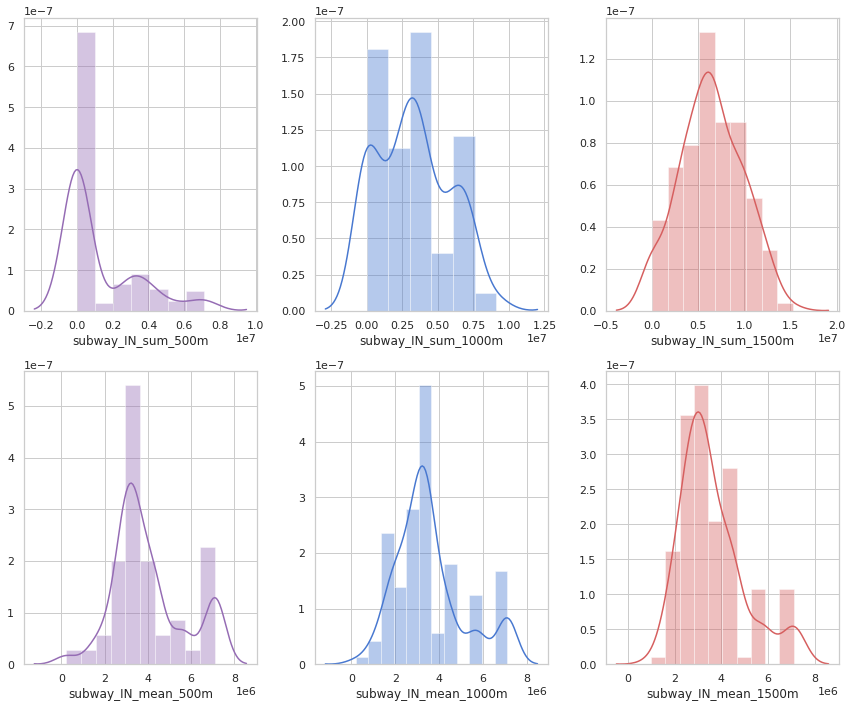

In [191]:
# 지하철역 승차인원 시각화
sns.set(style="whitegrid", palette="muted", color_codes=True)
fig, axes = plt.subplots(nrows=2,ncols=3)
fig.set_size_inches(12, 10)

x200 = station_eda_df["subway_IN_sum_500m"]
x300 = station_eda_df["subway_IN_sum_1000m"]
x500 = station_eda_df["subway_IN_sum_1500m"]
sns.distplot(x200, color="m", ax=axes[0,0])
sns.distplot(x300, color="b", ax=axes[0,1])
sns.distplot(x500, color="r", ax=axes[0,2])


x200 = station_eda_df["subway_IN_mean_500m"]
x300 = station_eda_df["subway_IN_mean_1000m"]
x500 = station_eda_df["subway_IN_mean_1500m"]
sns.distplot(x200, color="m", ax=axes[1,0])
sns.distplot(x300, color="b", ax=axes[1,1])
sns.distplot(x500, color="r", ax=axes[1,2])

plt.tight_layout()
plt.show()

반경을 넓힐 수록 정규분포에 근사함을 확인할 수 있었다.

다만 반경을 작게 했을 때, 승차 인원이 작은 부분에 분포가 몰렸다.

이는 승차인원이 많은 큰 지하철 역은 보다 멀리 자전거 정류장이 위치해 있다는 사실을 반증한다.

In [192]:
station_eda_df = copy.deepcopy(station_df)
station_eda_df = calculateCloseLandmarkFeatures(station_eda_df, subway_space_df, 0.5, "subway", "OUT", sum)
station_eda_df = calculateCloseLandmarkFeatures(station_eda_df, subway_space_df, 1.0, "subway", "OUT", sum)
station_eda_df = calculateCloseLandmarkFeatures(station_eda_df, subway_space_df, 1.5, "subway", "OUT", sum)
station_eda_df = calculateCloseLandmarkFeatures(station_eda_df, subway_space_df, 0.5, "subway", "OUT", np.mean)
station_eda_df = calculateCloseLandmarkFeatures(station_eda_df, subway_space_df, 1.0, "subway", "OUT", np.mean)
station_eda_df = calculateCloseLandmarkFeatures(station_eda_df, subway_space_df, 1.5, "subway", "OUT", np.mean)
station_eda_df.head()

,STATION_ID,STATION_NM,HOLDER_CAPACITY,LAT,LON,geometry,altitude,subway_OUT_sum_500m,subway_OUT_sum_1000m,subway_OUT_sum_1500m,subway_OUT_mean_500m,subway_OUT_mean_1000m,subway_OUT_mean_1500m
0,101,어울림마을 701동 앞,20,37.654775,126.834584,POINT (126.83458 37.65477),14.0,0.0,4214589.0,4214589.0,NaN,4214589.0,4214589.0
1,103,대림e-편한세상106동,20,37.660442,126.840377,POINT (126.84038 37.66044),18.0,0.0,4214589.0,4214589.0,NaN,4214589.0,4214589.0
2,104,탄현마을8단지,25,37.698523,126.766042,POINT (126.76604 37.69852),35.0,0.0,2626648.0,2626648.0,NaN,2626648.0,2626648.0
3,105,KT 덕양지사 앞,20,37.655244,126.839261,POINT (126.83926 37.65524),19.0,4214589.0,4214589.0,4214589.0,4214589.0,4214589.0,4214589.0
4,106,원당역 앞 공영주차장,30,37.653410,126.842530,POINT (126.84253 37.65341),18.0,4214589.0,4214589.0,4214589.0,4214589.0,4214589.0,4214589.0


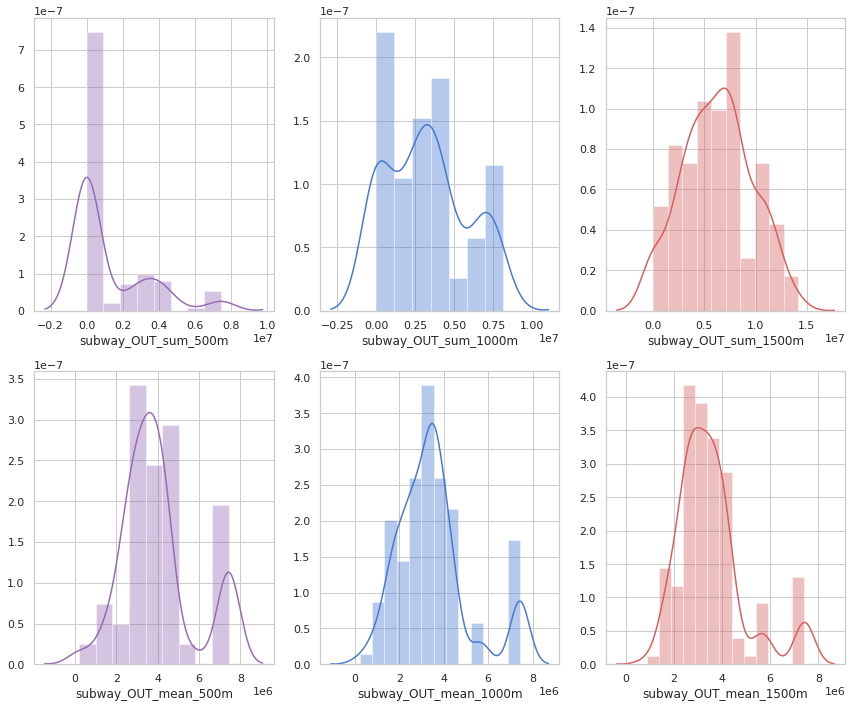

In [193]:
# 지하철역 하차인원 시각화
sns.set(style="whitegrid", palette="muted", color_codes=True)
fig, axes = plt.subplots(nrows=2,ncols=3)
fig.set_size_inches(12, 10)

x200 = station_eda_df["subway_OUT_sum_500m"]
x300 = station_eda_df["subway_OUT_sum_1000m"]
x500 = station_eda_df["subway_OUT_sum_1500m"]
sns.distplot(x200, color="m", ax=axes[0,0])
sns.distplot(x300, color="b", ax=axes[0,1])
sns.distplot(x500, color="r", ax=axes[0,2])


x200 = station_eda_df["subway_OUT_mean_500m"]
x300 = station_eda_df["subway_OUT_mean_1000m"]
x500 = station_eda_df["subway_OUT_mean_1500m"]
sns.distplot(x200, color="m", ax=axes[1,0])
sns.distplot(x300, color="b", ax=axes[1,1])
sns.distplot(x500, color="r", ax=axes[1,2])

plt.tight_layout()
plt.show()

하차 인원도 승차 인원과 같은 양상을 보인다.

In [194]:
station_eda_df = copy.deepcopy(station_df)
station_eda_df = calculateCloseLandmarkFeatures(station_eda_df, subway_space_df, 0.5, "subway", "NET_TOTAL", sum)
station_eda_df = calculateCloseLandmarkFeatures(station_eda_df, subway_space_df, 1.0, "subway", "NET_TOTAL", sum)
station_eda_df = calculateCloseLandmarkFeatures(station_eda_df, subway_space_df, 1.5, "subway", "NET_TOTAL", sum)
station_eda_df = calculateCloseLandmarkFeatures(station_eda_df, subway_space_df, 0.5, "subway", "NET_TOTAL", np.mean)
station_eda_df = calculateCloseLandmarkFeatures(station_eda_df, subway_space_df, 1.0, "subway", "NET_TOTAL", np.mean)
station_eda_df = calculateCloseLandmarkFeatures(station_eda_df, subway_space_df, 1.5, "subway", "NET_TOTAL", np.mean)
station_eda_df.head()

,STATION_ID,STATION_NM,HOLDER_CAPACITY,LAT,LON,geometry,altitude,subway_NET_TOTAL_sum_500m,subway_NET_TOTAL_sum_1000m,subway_NET_TOTAL_sum_1500m,subway_NET_TOTAL_mean_500m,subway_NET_TOTAL_mean_1000m,subway_NET_TOTAL_mean_1500m
0,101,어울림마을 701동 앞,20,37.654775,126.834584,POINT (126.83458 37.65477),14.0,0.0,178671.0,178671.0,NaN,178671.0,178671.0
1,103,대림e-편한세상106동,20,37.660442,126.840377,POINT (126.84038 37.66044),18.0,0.0,178671.0,178671.0,NaN,178671.0,178671.0
2,104,탄현마을8단지,25,37.698523,126.766042,POINT (126.76604 37.69852),35.0,0.0,103031.0,103031.0,NaN,103031.0,103031.0
3,105,KT 덕양지사 앞,20,37.655244,126.839261,POINT (126.83926 37.65524),19.0,178671.0,178671.0,178671.0,178671.0,178671.0,178671.0
4,106,원당역 앞 공영주차장,30,37.653410,126.842530,POINT (126.84253 37.65341),18.0,178671.0,178671.0,178671.0,178671.0,178671.0,178671.0


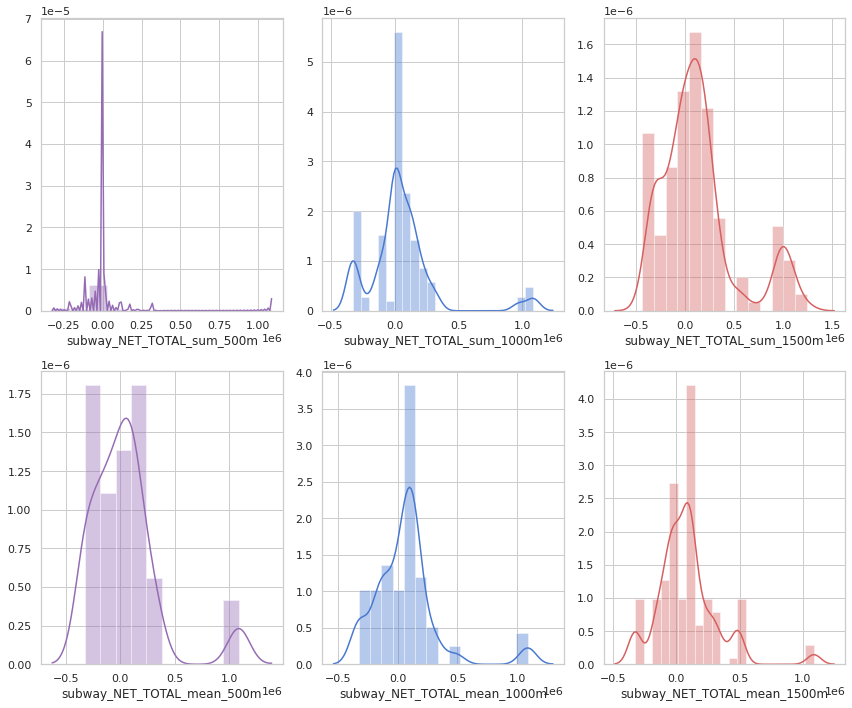

In [195]:
# 상대 수요
sns.set(style="whitegrid", palette="muted", color_codes=True)
fig, axes = plt.subplots(nrows=2,ncols=3)
fig.set_size_inches(12, 10)

x200 = station_eda_df["subway_NET_TOTAL_sum_500m"]
x300 = station_eda_df["subway_NET_TOTAL_sum_1000m"]
x500 = station_eda_df["subway_NET_TOTAL_sum_1500m"]
sns.distplot(x200, color="m", ax=axes[0,0])
sns.distplot(x300, color="b", ax=axes[0,1])
sns.distplot(x500, color="r", ax=axes[0,2])


x200 = station_eda_df["subway_NET_TOTAL_mean_500m"]
x300 = station_eda_df["subway_NET_TOTAL_mean_1000m"]
x500 = station_eda_df["subway_NET_TOTAL_mean_1500m"]
sns.distplot(x200, color="m", ax=axes[1,0])
sns.distplot(x300, color="b", ax=axes[1,1])
sns.distplot(x500, color="r", ax=axes[1,2])

plt.tight_layout()
plt.show()

총 유입량에 대한 분포를 그려보았을 때, 대부분 0 근처에 높은 값이 산출되었다.

이는 대부분의 지하철에서 순 사용량이 비슷하다는 것을 말한다.

하지만 양 극단에서는 유립량이 +, -가 발생하는 것으로 보아, 이러한 지하철 역의 특성을 반영해주어야 하는 필요성을 알 수 있다.

지하철 역에 대한 분포를 보았을 때, 버스 정류장에 비해 접근성이 비교적 떨어진다는 결론을 얻을 수 있었다.

하지만, 이러한 역의 존재는 자전거 정류장에 분명한 영향력을 줄 수 있으므로

유입량이 많은 역, 적은 역과 같은 특성을 모델 훈련에 있어 사용해야 한다는 결론을 얻었다.

### 2.3.3 거치대 근처 공공시설

* 2.3.3.1 교육시설
    * city_plan_public_gdf(공공시설)
    * 초등학교, 중학교, 고등학교, 특수학교, 각종학교, 대학 geometry 정보의 centroid를 사용한다.
* 2.3.3.2 문화시설
    * concerthall_space_df (행사장)
    * museum_space_df (박물관)
* 2.3.3.3 체육시설
    * sport_complex_info_df(체육시설)

#### 2.3.3.1 교육시설
* city_plan_public_gdf(공공시설)
* 초등학교, 중학교, 고등학교, 특수학교, 각종학교, 대학 geometry 정보의 centroid를 사용한다.

In [196]:
candidate = ['초등학교', '중학교', '고등학교', '특수학교', '각종학교', '대학']
str_expr = f"TYPE in {candidate}"
school_gdf = city_plan_public_gdf.query(str_expr)     # 조건 부합 데이터 추출
school_gdf.reset_index(drop=True, inplace=True)
print(school_gdf.shape)
school_gdf.head()

(191, 4)


,TYPE,AREA,LENGTH,geometry
0,초등학교,13070,461,"MULTIPOLYGON (((126.90542 37.71515, 126.90619 ..."
1,초등학교,12000,444,"MULTIPOLYGON (((126.81611 37.68054, 126.81659 ..."
2,중학교,9492,396,"MULTIPOLYGON (((126.81706 37.68020, 126.81711 ..."
3,고등학교,13928,472,"MULTIPOLYGON (((126.84218 37.66356, 126.84266 ..."
4,초등학교,14164,717,"MULTIPOLYGON (((126.74715 37.69282, 126.74726 ..."


In [197]:
school_gdf["CENTROID"] = school_gdf["geometry"].apply(lambda x: x.centroid)
school_gdf["LON"] = school_gdf["CENTROID"].apply(lambda x: x.x)
school_gdf["LAT"] = school_gdf["CENTROID"].apply(lambda x: x.y)

print(school_gdf.shape)
school_gdf.head()

(191, 7)


,TYPE,AREA,LENGTH,geometry,CENTROID,LON,LAT
0,초등학교,13070,461,"MULTIPOLYGON (((126.90542 37.71515, 126.90619 ...",POINT (126.90625 37.71512),126.906247,37.715121
1,초등학교,12000,444,"MULTIPOLYGON (((126.81611 37.68054, 126.81659 ...",POINT (126.81696 37.68078),126.816963,37.680778
2,중학교,9492,396,"MULTIPOLYGON (((126.81706 37.68020, 126.81711 ...",POINT (126.81793 37.68017),126.817932,37.680168
3,고등학교,13928,472,"MULTIPOLYGON (((126.84218 37.66356, 126.84266 ...",POINT (126.84216 37.66281),126.842159,37.662812
4,초등학교,14164,717,"MULTIPOLYGON (((126.74715 37.69282, 126.74726 ...",POINT (126.74827 37.69268),126.748267,37.692677


In [198]:
# 교육시설 관련
station_eda_df = copy.deepcopy(station_df)
station_eda_df = countCloseLandmarks(station_eda_df, school_gdf, 0.5, "school")
station_eda_df = countCloseLandmarks(station_eda_df, school_gdf, 1.0, "school")
station_eda_df = countCloseLandmarks(station_eda_df, school_gdf, 1.5, "school")
station_eda_df.head()

,STATION_ID,STATION_NM,HOLDER_CAPACITY,LAT,LON,geometry,altitude,school_cnt_500m,school_cnt_1000m,school_cnt_1500m
0,101,어울림마을 701동 앞,20,37.654775,126.834584,POINT (126.83458 37.65477),14.0,1.0,3.0,9.0
1,103,대림e-편한세상106동,20,37.660442,126.840377,POINT (126.84038 37.66044),18.0,4.0,4.0,5.0
2,104,탄현마을8단지,25,37.698523,126.766042,POINT (126.76604 37.69852),35.0,6.0,8.0,17.0
3,105,KT 덕양지사 앞,20,37.655244,126.839261,POINT (126.83926 37.65524),19.0,1.0,5.0,8.0
4,106,원당역 앞 공영주차장,30,37.653410,126.842530,POINT (126.84253 37.65341),18.0,1.0,2.0,8.0


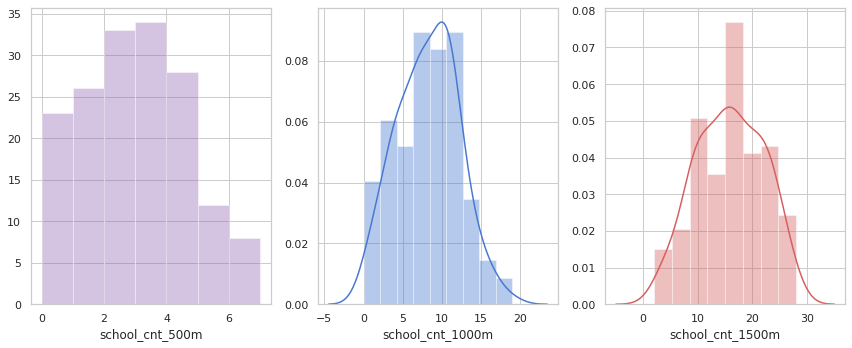

In [199]:
# 거치대 주변 교육시설 시각화
sns.set(style="whitegrid", palette="muted", color_codes=True)
fig, axes = plt.subplots(nrows=1,ncols=3)
fig.set_size_inches(12, 5)

x200 = station_eda_df["school_cnt_500m"]
x300 = station_eda_df["school_cnt_1000m"]
x500 = station_eda_df["school_cnt_1500m"]
sns.distplot(x200, color="m", kde=False, ax=axes[0])
sns.distplot(x300, color="b", ax=axes[1])
sns.distplot(x500, color="r", ax=axes[2])

# axes[0].set_yticks([0, 0.05, 0.1, 0.15, 0.2, 0.25, 0.3])
# axes[1].set_yticks([0, 0.05, 0.1, 0.15, 0.2, 0.25, 0.3])
# axes[2].set_yticks([0, 0.05, 0.1, 0.15, 0.2, 0.25, 0.3])

# plt.setp(axes, yticks=[])
plt.tight_layout()
plt.show()

학교 같은 경우에는 정류장 주변 개수가 200m 기준 적어도 1개정도 이상을 가지고 있다.

이는 매우 유의미한 결과이다.

#### 2.3.3.2 문화시설
* concerthall_space_df (행사장)
* museum_space_df (박물관)

In [200]:
concerthall_space_df_temp = concerthall_space_df[["NAME", "LAT", "LON"]]
museum_space_df_temp = museum_space_df[["NAME", "LAT", "LON"]]
culture_facility_df = concerthall_space_df_temp.append(museum_space_df_temp)
culture_facility_df.reset_index(drop=True, inplace=True)
culture_facility_df.head()

,NAME,LAT,LON
0,활주로7080 공연장,37.663502,126.767487
1,행주아트홀,37.602563,126.822885
2,올리브,37.663102,126.767880
3,3 NEW THEATRE,37.690864,126.725248
4,터 시어터,37.659433,126.782173


In [201]:
# 문화시설 관련
station_eda_df = copy.deepcopy(station_df)
station_eda_df = countCloseLandmarks(station_eda_df, culture_facility_df, 0.5, "cul_fac")
station_eda_df = countCloseLandmarks(station_eda_df, culture_facility_df, 1.0, "cul_fac")
station_eda_df = countCloseLandmarks(station_eda_df, culture_facility_df, 1.5, "cul_fac")
station_eda_df.head()

,STATION_ID,STATION_NM,HOLDER_CAPACITY,LAT,LON,geometry,altitude,cul_fac_cnt_500m,cul_fac_cnt_1000m,cul_fac_cnt_1500m
0,101,어울림마을 701동 앞,20,37.654775,126.834584,POINT (126.83458 37.65477),14.0,2.0,5.0,6.0
1,103,대림e-편한세상106동,20,37.660442,126.840377,POINT (126.84038 37.66044),18.0,0.0,2.0,5.0
2,104,탄현마을8단지,25,37.698523,126.766042,POINT (126.76604 37.69852),35.0,0.0,0.0,0.0
3,105,KT 덕양지사 앞,20,37.655244,126.839261,POINT (126.83926 37.65524),19.0,0.0,5.0,6.0
4,106,원당역 앞 공영주차장,30,37.653410,126.842530,POINT (126.84253 37.65341),18.0,0.0,5.0,5.0


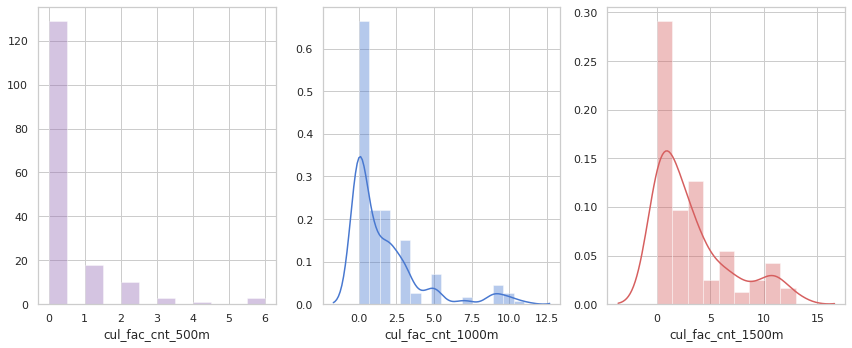

In [202]:
# 거치대 주변 문화시설 시각화
import seaborn as sns, numpy as np

sns.set(style="whitegrid", palette="muted", color_codes=True)
fig, axes = plt.subplots(nrows=1,ncols=3)
fig.set_size_inches(12, 5)

x200 = station_eda_df["cul_fac_cnt_500m"]
x300 = station_eda_df["cul_fac_cnt_1000m"]
x500 = station_eda_df["cul_fac_cnt_1500m"]
sns.distplot(x200, color="m", kde=False, ax=axes[0])
sns.distplot(x300, color="b", ax=axes[1])
sns.distplot(x500, color="r", ax=axes[2])

# axes[0].set_yticks([0, 0.05, 0.1, 0.15, 0.2, 0.25, 0.3])
# axes[1].set_yticks([0, 0.05, 0.1, 0.15, 0.2, 0.25, 0.3])
# axes[2].set_yticks([0, 0.05, 0.1, 0.15, 0.2, 0.25, 0.3])

# plt.setp(axes, yticks=[])
plt.tight_layout()
plt.show()

문화시설의 개수를 500, 1000, 1500m 기준으로 보았을 때, 대부분이 0개를 가지고 있는 것을 알 수 있다.

#### 2.3.3.3 체육시설
* sport_complex_info_df(체육시설)

In [203]:
# 체육시설 관련
station_eda_df = copy.deepcopy(station_df)
station_eda_df = countCloseLandmarks(station_eda_df, sport_complex_info_df, 0.5, "sports")
station_eda_df = countCloseLandmarks(station_eda_df, sport_complex_info_df, 1.0, "sports")
station_eda_df = countCloseLandmarks(station_eda_df, sport_complex_info_df, 1.5, "sports")
station_eda_df.head()

,STATION_ID,STATION_NM,HOLDER_CAPACITY,LAT,LON,geometry,altitude,sports_cnt_500m,sports_cnt_1000m,sports_cnt_1500m
0,101,어울림마을 701동 앞,20,37.654775,126.834584,POINT (126.83458 37.65477),14.0,1.0,14.0,28.0
1,103,대림e-편한세상106동,20,37.660442,126.840377,POINT (126.84038 37.66044),18.0,7.0,13.0,26.0
2,104,탄현마을8단지,25,37.698523,126.766042,POINT (126.76604 37.69852),35.0,2.0,3.0,12.0
3,105,KT 덕양지사 앞,20,37.655244,126.839261,POINT (126.83926 37.65524),19.0,0.0,21.0,27.0
4,106,원당역 앞 공영주차장,30,37.653410,126.842530,POINT (126.84253 37.65341),18.0,0.0,18.0,26.0


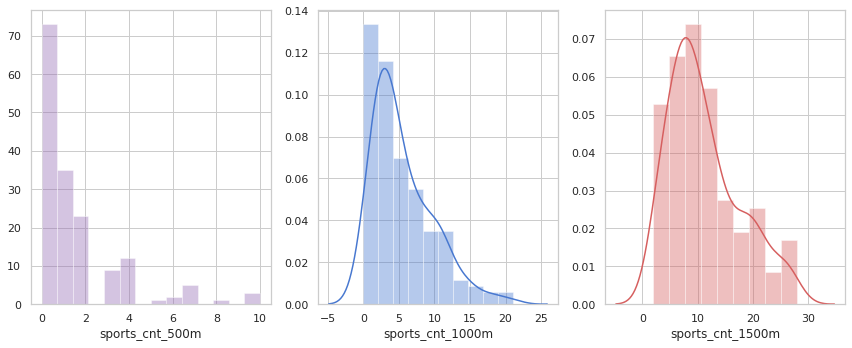

In [204]:
# 주변 체육시설 시각화
sns.set(style="whitegrid", palette="muted", color_codes=True)
fig, axes = plt.subplots(nrows=1,ncols=3)
fig.set_size_inches(12, 5)

x200 = station_eda_df["sports_cnt_500m"]
x300 = station_eda_df["sports_cnt_1000m"]
x500 = station_eda_df["sports_cnt_1500m"]
sns.distplot(x200, color="m", kde=False, ax=axes[0])
sns.distplot(x300, color="b", ax=axes[1])
sns.distplot(x500, color="r", ax=axes[2])

# axes[0].set_yticks([0, 0.05, 0.1, 0.15, 0.2, 0.25, 0.3])
# axes[1].set_yticks([0, 0.05, 0.1, 0.15, 0.2, 0.25, 0.3])
# axes[2].set_yticks([0, 0.05, 0.1, 0.15, 0.2, 0.25, 0.3])

# plt.setp(axes, yticks=[])
plt.tight_layout()
plt.show()

체육 시설 역시 500m 기준 70% 이상이 0이다.

결과적으로 대부분의 문화시설과 체육시설이 이를 기준으로 배치되지 않았음을 확인할 수 있었다.

오히려 학교와 같은 교육시설을 기반으로 많은 수의 정류장이 배치되었음을 확인했다.

### 2.3.4 고양시 도로 파악

도로를 구분하는 다양한 구분 코드를 기반으로 시각화하면서, 어떤 특징이 있는지 확인한다.

* 광역도로 구분 코드(WDR_RD_CD)	

|code	| meaning |
|:-:|:-:|
|	1	| 행자부도로 |
|	2	| 광역도로 |
|	3	| 시군구도로 |

* 도로구간종속구분코드(RDS_DPN_SE)	

|code	|meaning|
|:-:|:-:|
|0	|주도로|
|1	|1차 종속도로|
|2	|2차 종속도로|


* 도로위계구분코드(ROA_CLS_SE)

|code|	meaning|
|:-:|:-:|
|1	|고속도로|
|2	|대로|
|3	|로|
|4	|길|


In [205]:
# folium marker를 html로 변환하는 코드
table = """
<!DOCTYPE html>
<html>
<head>
<style>
table {{
    width:100%;
}}
table, th, td {{
    border: 1px solid black;
    border-collapse: collapse;
}}
th, td {{
    padding: 5px;
    text-align: left;
}}
table#t01 tr:nth-child(odd) {{
    background-color: #eee;
}}
table#t01 tr:nth-child(even) {{
   background-color:#fff;
}}
</style>
</head>
<body>

<table id="t01">
  <tr>
    <td>STATION ID</td>
    <td>{}</td>
  </tr>
  <tr>
    <td>Name</td>
    <td>{}</td>
  </tr>
  <tr>
    <td>Holder Capacity</td>
    <td>{}</td>
  </tr>
  <tr>
    <td>Altitude</td>
    <td>{}</td>
  </tr>
</table>
</body>
</html>
""".format

In [206]:
####################### 해당 환경에서 제대로 동작하지 않음 ##############################

import random as rd
import folium
from folium import IFrame
from folium.plugins import MarkerCluster, FeatureGroupSubGroup

point_num = 100

# 다 제작했으나 해당 환경에 구동하지 않음
# 광역도로 구분 코드(WDR_RD_CD)	road_code1_df
# 도로구간종속구분코드(RDS_DPN_SE)	road_code2_df
# 도로위계구분코드(ROA_CLS_SE)	road_code3_df

m = folium.Map(location=center, tiles="OpenStreetMap", zoom_start=12)

fg = folium.FeatureGroup(name='ALL') 
m.add_child(fg)

g0 = FeatureGroupSubGroup(fg, 'Bike station[star]') 
m.add_child(g0) 
g1 = FeatureGroupSubGroup(fg, 'Gwangyeok 1 - Hangjaboo[skyblue]') 
m.add_child(g1) 
g2 = FeatureGroupSubGroup(fg, 'Gwangyeok 2 - Gwangyeok[brue]') 
m.add_child(g2)
g3 = FeatureGroupSubGroup(fg, 'Gwangyeok 3 - SiGunGu[red]') 
m.add_child(g3)
g4 = FeatureGroupSubGroup(fg, 'Subjected Road 0 - Main[green]') 
m.add_child(g4)
g5 = FeatureGroupSubGroup(fg, 'Subjected Road 1 - 1st Subjected[springgreen]') 
m.add_child(g5) 
g6 = FeatureGroupSubGroup(fg, 'Subjected Road 1 - 2nd Subjected[violet]') 
m.add_child(g6) 
g7 = FeatureGroupSubGroup(fg, 'Road Level 1 - Highway[grey]') 
m.add_child(g7)
g8 = FeatureGroupSubGroup(fg, 'Road Level 2 - Dae Ro[pink]') 
m.add_child(g8)
g9 = FeatureGroupSubGroup(fg, 'Road Level 3 - Ro[lime]') 
m.add_child(g9)
g10 = FeatureGroupSubGroup(fg, 'Road Level 4 - Gil[yellow]') 
m.add_child(g10)

width, height = 310,200

# 버스정류장 위치
popups, locations = [], []
# marker_cluster = MarkerCluster().add_to(g0)
# for idx, row in station_df.iterrows():
#     folium.Marker(
#       location=[row['geometry'].y, row['geometry'].x],
#       popup=IFrame(table(row['STATION_ID'], row['STATION_NAME'], row['HOLDER_CAPACITY'], row['altitude']), width=width, height=height),
#       icon=folium.Icon(color='red',icon='star'),
#     ).add_to(marker_cluster)

for idx, row in station_df.iterrows():
    locations.append([row['geometry'].y, row['geometry'].x])
    num = row['STATION_ID']
    name = row['STATION_NM']
    holder = row["HOLDER_CAPACITY"]
    altitude = row["altitude"]
    iframe = IFrame(table(num, name, holder, altitude), width=width, height=height)
    popups.append(iframe)

g0.add_children(MarkerCluster(locations=locations, popups=popups))
m.add_children(g0)

# 광역도로
# folium.GeoJson(
#     address_road_gdf[address_road_gdf["WDR_RD_CD"] == "1"],
#     style_function=lambda feature: {
#         'fillOpacity': 0.1,
#         'weight': 3,
#         "color": "skyblue",
#         'lineColor': '#E2E2E2',
#         "opacity": 0.3,
#     }
#     ).add_to(g1)
# folium.GeoJson(
#     address_road_gdf[address_road_gdf["WDR_RD_CD"] == "2"],
#     style_function=lambda feature: {
#         'fillOpacity': 0.1,
#         'weight': 3,
#         "color": "brue",
#         'lineColor': '#E2E2E2',
#         "opacity": 0.3,
#     }
#     ).add_to(g2)
folium.GeoJson(
    address_road_gdf.loc[rd.sample(list(address_road_gdf[address_road_gdf["WDR_RD_CD"] == "3"].index), point_num)],
    style_function=lambda feature: {
        'fillOpacity': 0.1,
        'weight': 3,
        "color": "black",
        'lineColor': '#E2E2E2',
        "opacity": 0.3,
    }
    ).add_to(g3)

# # 종속구간
# folium.GeoJson(
#     address_road_gdf.loc[rd.sample(list(address_road_gdf[address_road_gdf["RDS_DPN_SE"] == "0"].index), point_num)],
#     style_function=lambda feature: {
#         'fillOpacity': 0.1,
#         'weight': 3,
#         "color": "green",
#         'lineColor': '#E2E2E2',
#         "opacity": 0.3,
#     }
#     ).add_to(g4)
# folium.GeoJson(
#     address_road_gdf[address_road_gdf["RDS_DPN_SE"] == "1"],
#     style_function=lambda feature: {
#         'fillOpacity': 0.1,
#         'weight': 3,
#         "color": "springgreen",
#         'lineColor': '#E2E2E2',
#         "opacity": 0.3,
#     }
#     ).add_to(g5)
# folium.GeoJson(
#     address_road_gdf[address_road_gdf["RDS_DPN_SE"] == "2"],
#     style_function=lambda feature: {
#         'fillOpacity': 0.1,
#         'weight': 3,
#         "color": "violet",
#         'lineColor': '#E2E2E2',
#         "opacity": 0.3,
#     }
#     ).add_to(g6)

# # 위계코드
# folium.GeoJson(
#     address_road_gdf[address_road_gdf["ROA_CLS_SE"] == "1"],
#     style_function=lambda feature: {
#         'fillOpacity': 0.1,
#         'weight': 3,
#         "color": "grey",
#         'lineColor': '#E2E2E2',
#         "opacity": 0.3,
#     }
#     ).add_to(g7)
# folium.GeoJson(
#     address_road_gdf[address_road_gdf["ROA_CLS_SE"] == "2"],
#     style_function=lambda feature: {
#         'fillOpacity': 0.1,
#         'weight': 3,
#         "color": "pink",
#         'lineColor': '#E2E2E2',
#         "opacity": 0.3,
#     }
#     ).add_to(g8)
# folium.GeoJson(
#     address_road_gdf[address_road_gdf["ROA_CLS_SE"] == "3"],
#     style_function=lambda feature: {
#         'fillOpacity': 0.1,
#         'weight': 3,
#         "color": "lime",
#         'lineColor': '#E2E2E2',
#         "opacity": 0.3,
#     }
#     ).add_to(g9)
# folium.GeoJson(
#     address_road_gdf[address_road_gdf["ROA_CLS_SE"] == "4"],
#     style_function=lambda feature: {
#         'fillOpacity': 0.1,
#         'weight': 3,
#         "color": "yellow",
#         'lineColor': '#E2E2E2',
#         "opacity": 0.3,
#     }
#     ).add_to(g10)



folium.GeoJson(
    administration_boundary_town_gdf,
    name='Administration Boundary Layer',
    style_function=lambda feature: {
        'fillOpacity': 0.2,
        'weight': 2,
        "color": "#1C1C1C",
        'lineColor': '#E2E2E2',
        "opacity": 0.4,
    }
    ).add_to(m)

folium.LayerControl(collapsed=False).add_to(m)
m


folium 렌더링의 오류가 있어 해당 데이터를 100개만 시각화해보았다.

모든 도로 구분 코드에 대해 분류하여 살펴본 결과, 시군구 도로(광역 코드 3번)는 자전거를 타기 용이한 모든 도로에 대해 표현됨을 확인했다.


## 2.4 Rebalancing의 관점

공공 자전거 공유 문제에서는 필연적으로 수요-공급 불균형 문제가 발생한다.
이러한 점을 추후에 해결하기 위해, 어떠한 특징을 갖는지 분석한다.


* 2.4.1 시간대별 이용량
    * 2.4.1.1 월별
    * 2.4.1.2 요일별
    * 2.4.1.3 시간별
* 2.4.2 거치대 별 반입/반출량
    * 2.4.2.1 거치대별 상대수요 분포
    * 2.4.2.2 특이 station
* 2.4.3 네트워크 분석

### 2.4.1 시간대별 이용량

운영이력 데이터로 부터 시간에 대한 이용량을 파악한다.

* 2.4.1.1 월별
* 2.4.1.2 요일별
* 2.4.1.3 시간별

#### 2.4.1.1 월별

In [207]:
demand_month_df = createDemandDf(route_df, unit='month')
demand_month_df

,STATION,YEAR,MONTH,LEAS_COUNTS,RTN_COUNTS
0,101,2017,1,80.0,109.0
1,101,2017,2,74.0,89.0
2,101,2017,3,201.0,204.0
3,101,2017,4,306.0,372.0
4,101,2017,5,437.0,500.0
...,...,...,...,...,...
5575,992,2019,8,57.0,29.0
5576,992,2019,9,64.0,42.0
5577,992,2019,10,36.0,30.0
5578,992,2019,11,31.0,31.0


In [208]:
demand_month = demand_month_df[['MONTH', 'LEAS_COUNTS', 'RTN_COUNTS']].groupby('MONTH').mean()
demand_month

,LEAS_COUNTS,RTN_COUNTS
MONTH,,
1,219.283871,190.165591
2,206.784946,180.625806
3,403.729032,357.331183
4,609.116129,542.821505
5,787.451613,699.806452
6,828.438710,734.567742
7,697.548387,607.107527
8,695.526882,601.793548
9,801.750538,694.744086


In [209]:
demand_month["month"] = demand_month.index
demand_month

,LEAS_COUNTS,RTN_COUNTS,month
MONTH,,,
1,219.283871,190.165591,1
2,206.784946,180.625806,2
3,403.729032,357.331183,3
4,609.116129,542.821505,4
5,787.451613,699.806452,5
6,828.438710,734.567742,6
7,697.548387,607.107527,7
8,695.526882,601.793548,8
9,801.750538,694.744086,9


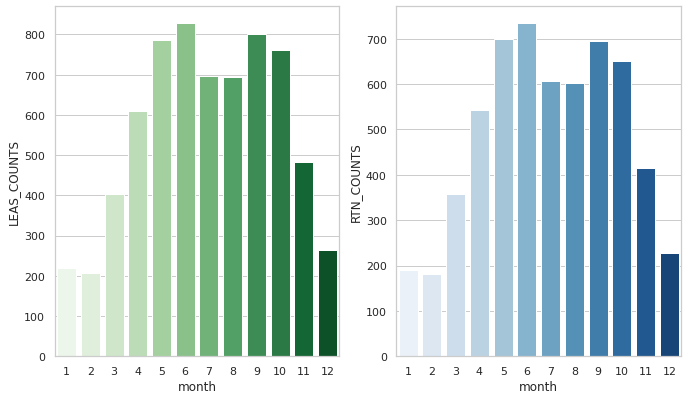

In [210]:
import seaborn as sns
f = plt.figure(figsize=(10, 6))
gs = f.add_gridspec(1, 2)

with sns.axes_style("whitegrid"):
    ax = f.add_subplot(gs[0, 0])
    sns.barplot(x="month", y="LEAS_COUNTS", data=demand_month, palette="Greens", ax=ax)

with sns.axes_style("whitegrid"):
    ax = f.add_subplot(gs[0, 1])
    sns.barplot(x="month", y="RTN_COUNTS", data=demand_month, palette="Blues", ax=ax)


#### 2.4.1.2 요일별

In [211]:
demand_day_df = createDemandDf(route_df, unit='day')
demand_day_df

,STATION,DAY,LEAS_COUNTS,RTN_COUNTS
0,101,0,1072,1275
1,101,1,1263,1376
2,101,2,1241,1313
3,101,3,1160,1356
4,101,4,1267,1430
...,...,...,...,...
1080,992,2,179,146
1081,992,3,163,145
1082,992,4,165,131
1083,992,5,65,59


In [212]:
demand_day = demand_day_df[['DAY', 'LEAS_COUNTS', 'RTN_COUNTS']].groupby('DAY').mean()
demand_day

,LEAS_COUNTS,RTN_COUNTS
DAY,,
0,2841.238710,2477.251613
1,2904.761290,2535.354839
2,2916.935484,2551.961290
3,2908.535484,2542.503226
4,3028.245161,2647.600000
5,2961.070968,2589.935484
6,2714.458065,2361.348387


In [213]:
demand_day["day"] = demand_day.index
demand_day

,LEAS_COUNTS,RTN_COUNTS,day
DAY,,,
0,2841.238710,2477.251613,0
1,2904.761290,2535.354839,1
2,2916.935484,2551.961290,2
3,2908.535484,2542.503226,3
4,3028.245161,2647.600000,4
5,2961.070968,2589.935484,5
6,2714.458065,2361.348387,6


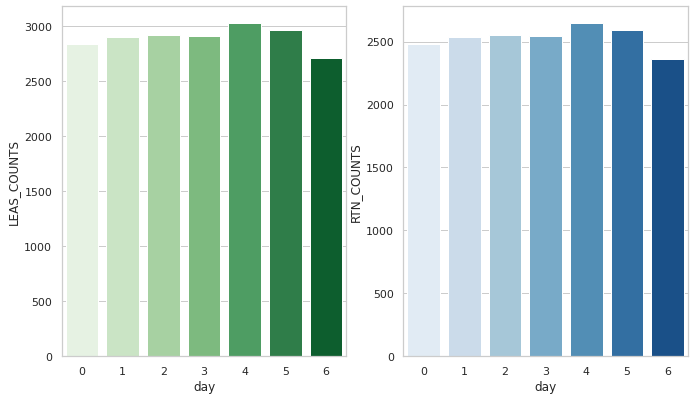

In [214]:
import seaborn as sns
f = plt.figure(figsize=(10, 6))
gs = f.add_gridspec(1, 2)

with sns.axes_style("whitegrid"):
    ax = f.add_subplot(gs[0, 0])
    sns.barplot(x="day", y="LEAS_COUNTS", data=demand_day, palette="Greens", ax=ax)

with sns.axes_style("whitegrid"):
    ax = f.add_subplot(gs[0, 1])
    sns.barplot(x="day", y="RTN_COUNTS", data=demand_day, palette="Blues", ax=ax)

#### 2.4.1.3 일별

In [215]:
demand_date_df = createDemandDf(route_df)
demand_date_df

,STATION,DATE,LEAS_COUNTS,RTN_COUNTS
0,101,2017-01-01,5.0,11.0
1,101,2017-01-02,6.0,6.0
2,101,2017-01-03,9.0,11.0
3,101,2017-01-04,5.0,7.0
4,101,2017-01-05,6.0,11.0
...,...,...,...,...
169720,992,2019-12-27,0.0,0.0
169721,992,2019-12-28,0.0,0.0
169722,992,2019-12-29,1.0,0.0
169723,992,2019-12-30,1.0,0.0


In [216]:
demand_date_df["DATE"] = demand_date_df["DATE"].apply(lambda x: int(x.day))
demand_date_df

,STATION,DATE,LEAS_COUNTS,RTN_COUNTS
0,101,1,5.0,11.0
1,101,2,6.0,6.0
2,101,3,9.0,11.0
3,101,4,5.0,7.0
4,101,5,6.0,11.0
...,...,...,...,...
169720,992,27,0.0,0.0
169721,992,28,0.0,0.0
169722,992,29,1.0,0.0
169723,992,30,1.0,0.0


In [217]:
demand_date = demand_date_df[['DATE', 'LEAS_COUNTS', 'RTN_COUNTS']].groupby('DATE').mean()
demand_date.head()

,LEAS_COUNTS,RTN_COUNTS
DATE,,
1,18.698387,16.396774
2,18.205018,15.894624
3,18.768280,16.423835
4,19.241039,16.786918
5,17.750717,15.541398


In [218]:
demand_date["date"] = demand_date.index
demand_date.head()

,LEAS_COUNTS,RTN_COUNTS,date
DATE,,,
1,18.698387,16.396774,1
2,18.205018,15.894624,2
3,18.768280,16.423835,3
4,19.241039,16.786918,4
5,17.750717,15.541398,5


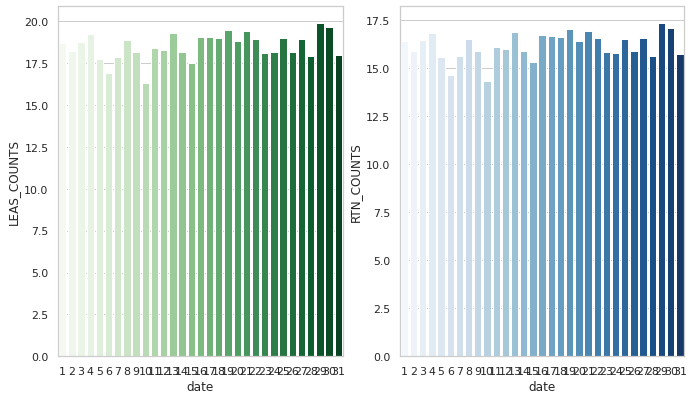

In [219]:
import seaborn as sns
f = plt.figure(figsize=(10, 6))
gs = f.add_gridspec(1, 2)

with sns.axes_style("whitegrid"):
    ax = f.add_subplot(gs[0, 0])
    sns.barplot(x="date", y="LEAS_COUNTS", data=demand_date, palette="Greens", ax=ax)

with sns.axes_style("whitegrid"):
    ax = f.add_subplot(gs[0, 1])
    sns.barplot(x="date", y="RTN_COUNTS", data=demand_date, palette="Blues", ax=ax)

#### 2.4.1.4 시간별

In [220]:
route_df['LEA_HOUR'] = route_df['LEAS_DATE'].apply(lambda x : x.hour)
route_df['RTN_HOUR'] = route_df['RTN_DATE'].apply(lambda x : x.hour)

In [221]:
lea_hour = route_df[['LEA_HOUR', 'LEAS_NO']].groupby('LEA_HOUR').count()
rtn_hour = route_df[['RTN_HOUR', 'LEAS_NO']].groupby('RTN_HOUR').count()

In [222]:
lea_hour["HOUR"] = lea_hour.index
rtn_hour["HOUR"] = rtn_hour.index
lea_hour.columns = ['LEAS_COUNTS', 'HOUR']
rtn_hour.columns = ['RTN_COUNTS', 'HOUR']

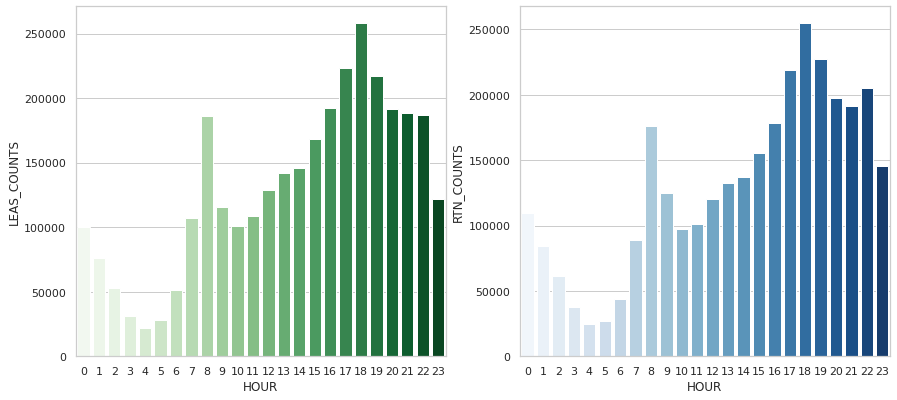

In [223]:
import seaborn as sns
f = plt.figure(figsize=(13, 6))
gs = f.add_gridspec(1, 2)

with sns.axes_style("whitegrid"):
    ax = f.add_subplot(gs[0, 0])
    sns.barplot(x="HOUR", y="LEAS_COUNTS", data=lea_hour, palette="Greens", ax=ax)

with sns.axes_style("whitegrid"):
    ax = f.add_subplot(gs[0, 1])
    sns.barplot(x="HOUR", y="RTN_COUNTS", data=rtn_hour, palette="Blues", ax=ax)

위의 네가지 결과를 보고 알 수 있는 점은 다음과 같다.

1. 일별, 요일별 변화는 크지 않다.
2. 하지만 월별 차이는 큰편이다.
3. 시간대 별로 차이를 보았을 때 오전 시간과 오후 시간의 차이가 분명하다.

시간대 별 차이는 조금더 확대해서 본다면 출근, 퇴근 시간과 연관지어 생각할 수 있다.
또한 이런 출퇴근은, 거주지역, 상업지역에 따라 변화할 수 있다.

### 2.4.2 거치대 별 반입/반출량

거치대별 가지는 특징을 파악해본다.

* 2.4.2.1 거치대별 상대수요 분포
* 2.4.2.2 특이 station

#### 2.4.2.1 거치대별 상대수요 분포

각각의 거치대 이용량의 일별 평균(상대수요)을 기반으로 거치대 별 반입/반출에 대해 영향력을 파악한다.

<AxesSubplot:xlabel='STATION_ID', ylabel='RTN-LEAS_MEAN'>

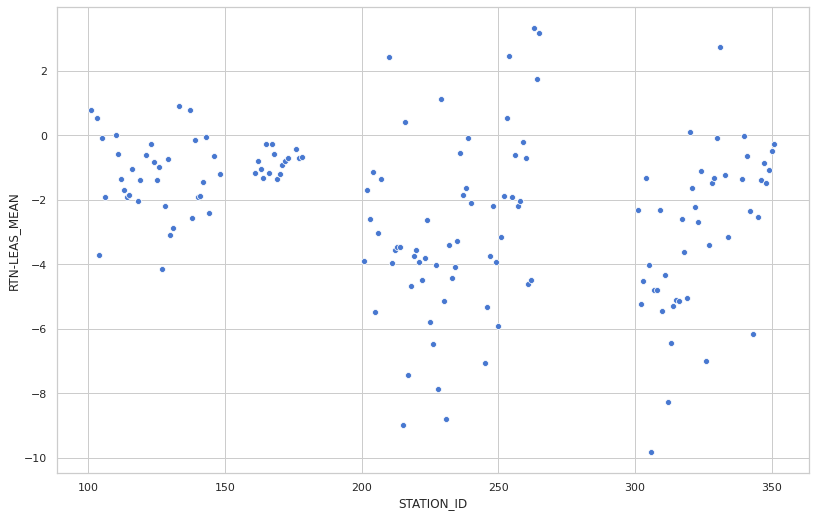

In [224]:
sns.scatterplot(x="STATION_ID", y="RTN-LEAS_MEAN", data=gdf_station[:-1])

대체적으로 거치대에서 반출이 많은 것을 파악할 수 있다.
전체 자전거양이 유지된다는 가정을 도입한다면, 이러한 분포에는 문제가 있다는 것을 파악할 수 있다.

In [225]:
print("상대 수요 평균 : ", gdf_station['RTN-LEAS_MEAN'][:-1].mean())

상대 수요 평균 :  -2.3401600541848846


#### 2.4.2.2 특이 station

앞서 분석을 진행하며, 대부분의 거치대에서 반출이 많다는 사실을 파악했다.
거치대 중 특이한 것이 있는지 분석하고, 이를 어떻게 활용할지 파악한다.

앞서 상대 수요 평균이  −2.3  이 나오는 것은 모든 거치대에서 반출이 평균적으로 -2.3개 정도 많다고 생각할 수 있다. 하지만 자전거의 총량이 변화하지 않는다는 가정을 도입한다면 이는 현실적으로 가능하지 않다. 따라서 0번 station의 의미를 파악해 본다.

In [226]:
print("LEAS_STATION 이 0번 스테이션인 경우")
route_df[route_df['LEAS_STATION'] == 0].shape

LEAS_STATION 이 0번 스테이션인 경우


(0, 33)

In [227]:
print("RTN_STATION 이 0번 스테이션인 경우")
route_df[route_df['RTN_STATION'] == 0].shape

RTN_STATION 이 0번 스테이션인 경우


(398234, 33)

0번 스테이션은 반출은 없고 반납만 존재하는 station이다.

In [228]:
station_num = 155
years = 365

print("0번 스테이션의 평균 : ", len(route_df[route_df['RTN_STATION'] == 0]) / station_num / (years * 3))

0번 스테이션의 평균 :  2.346348504934453


In [229]:
station_num = 155
years = 365

print("0번 스테이션의 평균 : ", len(route_df[route_df['RTN_STATION'] == 0]) / station_num / (years * 3))

0번 스테이션의 평균 :  2.346348504934453


이로 부터 알 수 있는 사실은 다음과 같다.

1. 0번 station은 반입만 있는 거치대이다.
2. 반입의 평균이 다른 거치대 상대 수요의 평균과 정확하게 일치한다.

이러한 점을 근거로 우리는 이 0번 거치대는 중앙에서 거치대의 Rebalancing을 해소하기 위한 운반이라고 가정하였다. 이러한 점을 가정한다면, 0번 거치대 이외의 모든 거치대의 상대수요는 평균적으로 2.3 더해져야 할 것이다.

In [230]:
bias = 2.3

In [231]:
import copy
gdf_station_temp_visualize = copy.deepcopy(gdf_station)
gdf_station_temp_visualize["RTN-LEAS_MEAN"] = gdf_station_temp_visualize["RTN-LEAS_MEAN"].apply(lambda x: x+bias)

<AxesSubplot:xlabel='STATION_ID', ylabel='RTN-LEAS_MEAN'>

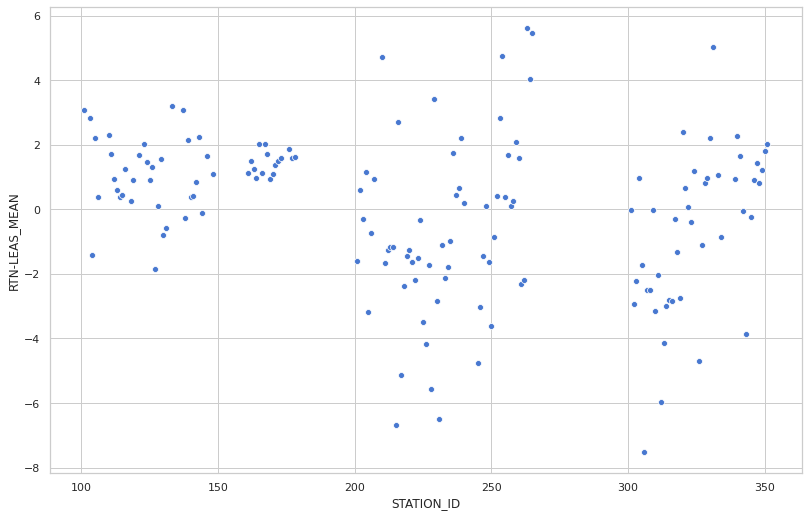

In [232]:
sns.scatterplot(x="STATION_ID", y="RTN-LEAS_MEAN", data=gdf_station_temp_visualize[:-1])

bias가 도입된 산점도는 위와 같다.

추후 이러한 가정을 도입하여 모델링을 진행할 것이다.

### 2.4.3 네트워크 분석

거치대간 상호작용을 네트워크 분석을 통해 파악한다.

In [233]:
# 자전거 정류장 간 network counting하는 함수
def createNetworkDf(route_df, unit='all', remove_stations=[0, 998, 999]):
  '''
  input // route_df = 01.운영이력.csv, unit = [all, month, day] // day = 0 => 월요일
  output // columns = LEAS_STATION, RTN_STATION, COUNTS // form : pd.DataFrame
  time // unit = 'all' ==> 0.2sec , unit = 'month' ==> 32sec , unit = 'day' ==> 30sec 
  '''
  possible_unit = ['all', 'month', 'day']
  if unit not in possible_unit:
    print("unit Error!")
    return

  stations = sorted(route_df['LEAS_STATION'].unique())
  for remove_station in remove_stations:
    if remove_station in stations:
      stations.remove(remove_station)
  stations_num = len(stations)

  if unit == 'all':
    numpy_route_network = np.zeros((stations_num * stations_num, 2))
    for i in range(stations_num):
      for j in range(stations_num):
        numpy_route_network[i*stations_num + j] = [stations[i], stations[j]]
    
    route_network_df = pd.DataFrame(numpy_route_network, columns=['LEAS_STATION', 'RTN_STATION'])
    
    temp_route_network_df = route_df[['LEAS_STATION', 'RTN_STATION', 'LEAS_NO']].groupby(['LEAS_STATION', 'RTN_STATION']).count()
    temp_route_network_df.reset_index(inplace=True)
    route_network_df = pd.merge(route_network_df, temp_route_network_df, how='left', on = ['LEAS_STATION', 'RTN_STATION'])
    route_network_df.fillna(0, inplace=True)

    return route_network_df

  elif unit == 'month':
    if 'MONTH' not in route_df.columns:
      route_df['MONTH'] = route_df['LEAS_DATE'].apply(lambda x : datetime.strptime(x, "%Y-%m-%d %H:%M:%S").month)
    numpy_route_network = np.zeros((12, stations_num * stations_num, 2))
    for month in range(12):
      for i in range(stations_num):
        for j in range(stations_num):
          numpy_route_network[month, i*stations_num + j] = [stations[i], stations[j]]

    route_network_df = pd.DataFrame(columns=['LEAS_STATION', 'RTN_STATION', 'MONTH'])
    for month in range(12):
      month_network_df = pd.DataFrame(numpy_route_network[month], columns=['LEAS_STATION', 'RTN_STATION'])
      month_network_df['MONTH'] = month + 1
      route_network_df = route_network_df.append(month_network_df)
    
    temp_route_network_df = route_df[['LEAS_STATION', 'RTN_STATION', 'MONTH', 'LEAS_NO']].groupby(['LEAS_STATION', 'RTN_STATION', 'MONTH']).count()
    temp_route_network_df.reset_index(inplace=True)
    route_network_df = pd.merge(route_network_df, temp_route_network_df, how='left', on = ['LEAS_STATION', 'RTN_STATION', 'MONTH'])
    route_network_df.fillna(0, inplace=True)
    return route_network_df
    
  elif unit == 'day':
    if 'DAY' not in route_df.columns:
      route_df['DAY'] = route_df['LEAS_DATE'].apply(lambda x : datetime.strptime(x, "%Y-%m-%d %H:%M:%S").weekday())
    numpy_route_network = np.zeros((7, stations_num * stations_num, 2))
    for day in range(7):
      for i in range(stations_num):
        for j in range(stations_num):
          numpy_route_network[day, i*stations_num + j] = [stations[i], stations[j]]

    route_network_df = pd.DataFrame(columns=['LEAS_STATION', 'RTN_STATION', 'DAY'])
    for day in range(7):
      day_network_df = pd.DataFrame(numpy_route_network[day], columns=['LEAS_STATION', 'RTN_STATION'])
      day_network_df['DAY'] = day
      route_network_df = route_network_df.append(day_network_df)

    temp_route_network_df = route_df[['LEAS_STATION', 'RTN_STATION', 'DAY', 'LEAS_NO']].groupby(['LEAS_STATION', 'RTN_STATION', 'DAY']).count()
    temp_route_network_df.reset_index(inplace=True)
    route_network_df = pd.merge(route_network_df, temp_route_network_df, how='left', on = ['LEAS_STATION', 'RTN_STATION', 'DAY'])
    route_network_df.fillna(0, inplace=True)
    return route_network_df

In [234]:
# 네트워크 분석에 필요한 데이터 프레임을 제작한다.
network_df = createNetworkDf(route_df, unit='all')
network_df['LEAS_STATION'] = network_df['LEAS_STATION'].apply(lambda x : int(x))
network_df['RTN_STATION'] = network_df['RTN_STATION'].apply(lambda x : int(x))

network_df = pd.merge(network_df, station_df[['STATION_ID', 'LAT', 'LON']], how='left', left_on=['LEAS_STATION'], right_on=['STATION_ID'])
network_df = pd.merge(network_df, station_df[['STATION_ID', 'LAT', 'LON']], how='left', left_on=['RTN_STATION'], right_on=['STATION_ID'])
network_df.columns = ['LEAS_STATION','RTN_STATION','COUNTS','STATION_ID_x','LEAS_LAT','LEAS_LONG','STATION_ID_y','RTN_LAT','RTN_LONG']
network_df = network_df[['LEAS_STATION','LEAS_LAT','LEAS_LONG','RTN_STATION','RTN_LAT','RTN_LONG','COUNTS']]
network_df['COUNTS'] = network_df['COUNTS'].apply(lambda x : int(x))
#network_df = network_df.loc[:1000]
network_df

,LEAS_STATION,LEAS_LAT,LEAS_LONG,RTN_STATION,RTN_LAT,RTN_LONG,COUNTS
0,101,37.654775,126.834584,101,37.654775,126.834584,1187
1,101,37.654775,126.834584,103,37.660442,126.840377,336
2,101,37.654775,126.834584,104,37.698523,126.766042,0
3,101,37.654775,126.834584,105,37.655244,126.839261,94
4,101,37.654775,126.834584,106,37.653410,126.842530,213
...,...,...,...,...,...,...,...
24020,992,37.637529,126.833760,348,37.699353,126.754793,0
24021,992,37.637529,126.833760,349,37.697838,126.752642,0
24022,992,37.637529,126.833760,350,37.697867,126.753089,0
24023,992,37.637529,126.833760,351,37.702259,126.767231,0


In [235]:
# 간선과 가중치를 정의한다.
import networkx as nx

edges = network_df[['LEAS_STATION', 'RTN_STATION']].values.tolist()
weights = [int(l) for l in network_df['COUNTS'].values.tolist()]

G = nx.Graph(directed=True)
G.add_edges_from(edges)

for idx, node in enumerate(G.edges(data=True)):
  G.edges[(node[0], node[1])]['weight'] = weights[idx] / network_df['COUNTS'].max()

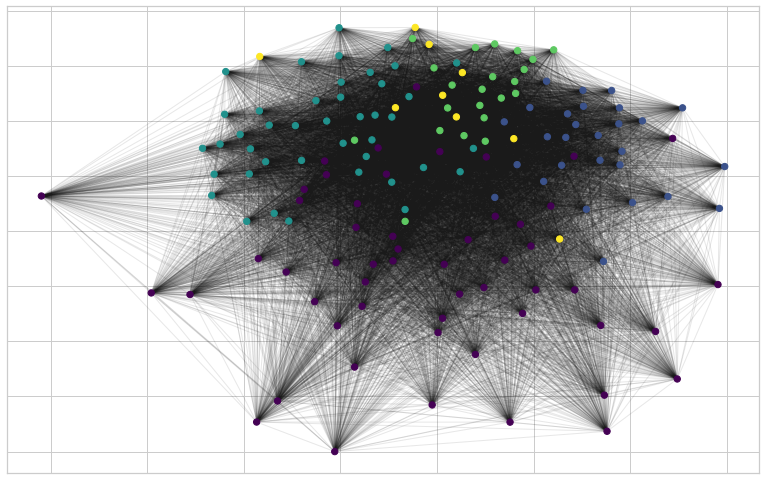

In [236]:
import community as community_louvain
import matplotlib.cm as cm
import matplotlib.pyplot as plt
import networkx as nx

# load the karate club graph
#G = nx.karate_club_graph()
# plt.figsize(20,20)

# 가장 좋은 클러스터(partition)으로 나눈다.
partition = community_louvain.best_partition(G)

# draw the graph
pos = nx.spring_layout(G)
# color the nodes according to their partition
cmap = cm.get_cmap('viridis', max(partition.values()) + 1)
nx.draw_networkx_nodes(G, pos, partition.keys(), node_size=40,
                       cmap=cmap, node_color=list(partition.values()))
nx.draw_networkx_edges(G, pos, alpha=0.1)
plt.show()

In [237]:
network_df.head()

,LEAS_STATION,LEAS_LAT,LEAS_LONG,RTN_STATION,RTN_LAT,RTN_LONG,COUNTS
0,101,37.654775,126.834584,101,37.654775,126.834584,1187
1,101,37.654775,126.834584,103,37.660442,126.840377,336
2,101,37.654775,126.834584,104,37.698523,126.766042,0
3,101,37.654775,126.834584,105,37.655244,126.839261,94
4,101,37.654775,126.834584,106,37.653410,126.842530,213


단지 시각화만 해서는 어떠한 특징을 반영해 주기 어렵다.

우리는 이 네트워크 결과를 기반으로 가장 특성을 잘 나누는 6개의 군집으로 나누었다.

이를 추가적인 변수로 사용할 것이다.

In [238]:
# 네트워크 분석을 통해 도출된 최적 군집 6개에 대한 데이터 프레임을 제작한다.
cluster = pd.DataFrame([list(partition.keys()), list(partition.values())]).T
cluster.columns = ['STATION_ID', 'CLUSTER']
cluster

,STATION_ID,CLUSTER
0,101,0
1,103,0
2,104,1
3,105,0
4,106,0
...,...,...
150,348,1
151,349,1
152,350,1
153,351,1


In [239]:
# 거치대 데이터에 해당 결과를 병합한다.
station_df = pd.merge(station_df, cluster, how='left', on='STATION_ID')

## 2.5 결론

1. 상업 지역과 주거 지역을 나누어서 반영해야 한다.
2. 새롭게 배치되는 거치대는 다양한 접근성을 고려해야 한다.
3. 현재 미배치된 곳이 많은 것으로 파악되고, 공공성을 확보하기 위해 배치 우선순위를 배정해야 한다.
4. 정류장 별로 반입/반출량이 상이한 것으로 파악되고, 이러한 불균형을 해소하는 장소를 선정해야 한다.
5. 0번 station의 반입 평균과 나머지 정류장의 반입출 평균이 같다. 이 점을 고려해야 한다.

# 3. 후보군 생성 알고리즘

EDA 결과를 기반으로 예상되는 후보군을 추출한다.

* 3.0 전체 프로세스
* 3.1 도로 근처 후보군 추출
* 3.2 미배치 지역 우선 배정
* 3.3 접근성을 고려한 후보군 선별
    * 3.3.1 버스정류장 수
    * 3.3.2 버스정류장 승하차 평균
    * 3.3.3 지하철 수
    * 3.3.4 지하철 승하차 평균
    * 3.3.5 학교 수
    * 3.3.6 문화 시설
    * 3.3.7 고도
* 3.4 결론

## 3.0 전체 프로세스

![Untitled Diagram (4)](https://user-images.githubusercontent.com/37871541/92612794-2f23b500-f2f5-11ea-9d76-1f3795a26fff.jpg)

1. 도로 근처의 후보군을 추출한다.
    * 자전거 거치대의 접근성을 고려하여 도로 주변에 이를 배치한다. 대다수의 사람들은 도로/인도를 기준으로 통행한다. 이러한 통행 동선을 고려하여 도로에서부터 후보군을 선택한다.
2. 미배치 지역 우선 배정
    * 가정 : 현재 거치대가 cover하는 구역은 반경 200m이다.
    * 이러한 가정을 기반으로, 배치가 된 구역에 추가적인 거치대를 배정하는 것은 비효율적이라 판단하였다. 따라서 이렇게 cover가 되지 않은 구역에 먼저 후보 거치대를 배정한다. 이 단계에서 추가적으로 1) 상업지역 또는 2) 주거지역 또는 3) 빌딩연면적이 일정 이상인 또는 3) 거주 인구가 일정 이상인 거치대 만을 추가적인 조건으로 후보군을 선정하여 후보군의 범위를 좁혔다. 상업지역 뿐만 아니라 빌딩 연면적이 일정 이상인 지역을 고려함으로써 상업 지역을 나타내는데 힘을 싣어주고자 했다. 주거지역 뿐만 아니라 거주 인구의 조건을 추가한 이유는 앞서 EDA의 결과로부터 주거 지역에 해당하는 부분만을 고려할 경우, 모든 주거 지역을 대변할 수 없다는 결론을 도출했기 때문이다.
3. 접근성을 고려한 후보군 선별
    * 선정된 후보군은 사용자의 편의성을 위해 접근성을 고려해야 한다.
    * 앞선 EDA의 결과로부터, 접근성이 좋지 않은 후보군을 제거한다.
    * 발생하는 각각의 후보군을 최종적으로 합집합 처리하여 예상 후보군을 만든다.
    

## 3.1 도로 근처 후보군 추출

사람들이 지나가는 도로를 시군구 도로로 제한하였다. 이는 EDA의 결과로 부터, 시군구 도로가 고양시의 주거지역, 상업지역 모두를 통과하는 Code라는 것을 확인했기 때문이다. 다른 조건을 기반으로 수행하지 않은 이유는, 시군구 도로가 고양시의 대부분의 도로의 특징을 모두 대변했기 때문이다. 가장 넓은 Coverage를 갖는 도로로부터 후보군을 추출함으로써 후보군의 일반화를 도모하고자 했다.

도로 주변 후보군을 고르는 간격은 300m를 기준으로 추출했다. 이 이유는 천천히 걸을 때 사람의 평균 속도를 시간당 3.5km라 가정했을 때, 5분 동안 갈 수 있는 거리이기 때문이다.

도로의 경계를 뽑기 위해서 도로의 폭을 고려했다. 제공된 데이터를 사용하고자 하였으나, 데이터의 문제가 있다는 것을 확인하고 기본적으로 1m를 기준으로 확장하여 판단하였다. 후에 도로 근처에 이를 옮김으로써 해결한다.

In [240]:
# WDR_RD_CD == 3 일때 모든 정류장 분포 (시군구 도로)
sigungu_road_gdf = address_road_gdf[address_road_gdf["WDR_RD_CD"] == "3"]
sigungu_road_gdf = sigungu_road_gdf.reset_index(drop=True)
sigungu_road_gdf.head()

,RDS_MAN_NO,RN,WDR_RD_CD,ROA_CLS_SE,RDS_DPN_SE,ROAD_BT,ROAD_LT,geometry
0,935,고양대로,3,2,1,2.0,198.820,"MULTILINESTRING ((126.85633 37.64793, 126.8563..."
1,1906,고양대로,3,2,2,3.0,91.000,"MULTILINESTRING ((126.84622 37.65368, 126.8462..."
2,1827,고양대로,3,2,1,6.0,256.120,"MULTILINESTRING ((126.81868 37.66404, 126.8186..."
3,637,고양대로,3,2,1,8.0,75.358,"MULTILINESTRING ((126.83772 37.65425, 126.8377..."
4,4344,고양대로,3,2,1,3.0,925.271,"MULTILINESTRING ((126.87332 37.64797, 126.8735..."


In [241]:
# 도로 geometry 변환
sigungu_road_gdf = sigungu_road_gdf.set_crs(default_crs)
print("기본 crs :", sigungu_road_gdf.crs)

sigungu_road_meter_gdf = sigungu_road_gdf.to_crs(meter_crs)
print("변환된 crs : ", sigungu_road_meter_gdf.crs)

기본 crs : epsg:4326
변환된 crs :  epsg:5179


In [242]:
# 도로 -> Polygon화 -> boundary에서 300m 기반으로 점을 추출하는 함수

from shapely.geometry import Point
import math

def calcDis(pt1, pt2):
    return Point(pt1).distance(Point(pt2))
  #return np.sqrt((pt1[0]-pt2[0])**2 + (pt1[1]-pt2[1])**2)

def findInternal(pt1, pt2 ,dis):
  if calcDis(pt1, pt2) < dis:
    return (False, calcDis(pt1, pt2) - (dis - 300))
  y = pt2[1] - pt1[1]
  x = pt2[0] - pt1[0]
  theta = math.atan2(y, x)
  ny = pt1[1] + dis * math.sin(theta)
  nx = pt1[0] + dis * math.cos(theta)
  return (True, nx, ny)

def findCandidate(coords, dis=300):
  ret_coords = []
  #coords.append(coords[0])
  coords_num = len(coords)
  depot = dis
  for i in range(coords_num - 2):
    now = dis - depot
    maxDis = calcDis(coords[i], coords[i + 1])
    while True:
      ret_val = findInternal(coords[i], coords[i + 1], now)
      if ret_val[0] == False:
        depot = ret_val[1]
        #print(i, depot)
        break
      ret_coords.append((ret_val[1], ret_val[2]))
      now += dis
      depot = 0
     # print(i)
  return ret_coords

In [243]:
# 도로 -> 점 추출

buffer_size = 1
basic_type = type((sigungu_road_meter_gdf.loc[0, "geometry"]).buffer(buffer_size).boundary)
#candidate_gdf = gpd.GeoDataFrame(columns=["geometry"], crs=meter_crs)

num = len(sigungu_road_meter_gdf)
candidate_gdf = np.zeros((1, 2))

for idx, row in sigungu_road_meter_gdf.iterrows():
  if idx % 1000 == 0:
    print("진행률 : {} / {} ".format(idx, num ) )
  road_data_meter = row["geometry"]
  roadmap = road_data_meter.buffer(buffer_size).boundary
  if type(roadmap) == basic_type:
    coords = list(roadmap.coords)
    temp = findCandidate(coords)

    coords_list = np.array(temp)
    candidate_gdf = np.concatenate((candidate_gdf, coords_list), axis=0)

  else:
    coords_num = len(roadmap)
    for coords in roadmap:
      coords = list(coords.coords)
      temp = findCandidate(coords)

      coords_list = np.array(temp)
      candidate_gdf = np.concatenate((candidate_gdf, coords_list), axis=0)
        
candidate_gdf = list(map(Point, list(candidate_gdf[1:])))
candidate_gdf = {'geometry': candidate_gdf}
candidate_gdf = gpd.GeoDataFrame(candidate_gdf, crs=meter_crs)
candidate_gdf.head()

진행률 : 0 / 4265 
진행률 : 1000 / 4265 
진행률 : 2000 / 4265 
진행률 : 3000 / 4265 
진행률 : 4000 / 4265 


,geometry
0,POINT (943222.819 1961159.094)
1,POINT (943253.788 1961196.992)
2,POINT (942330.440 1961798.769)
3,POINT (939905.887 1962927.464)
4,POINT (939759.629 1962869.983)


In [244]:
# 결과 확인
print(candidate_gdf.shape)
candidate_gdf.head()

(11905, 1)


,geometry
0,POINT (943222.819 1961159.094)
1,POINT (943253.788 1961196.992)
2,POINT (942330.440 1961798.769)
3,POINT (939905.887 1962927.464)
4,POINT (939759.629 1962869.983)


<AxesSubplot:>

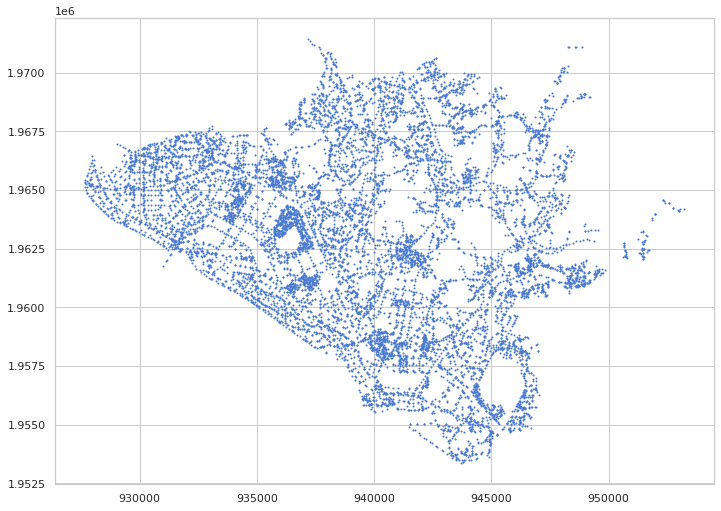

In [245]:
# 후보군 plot
candidate_gdf.plot(markersize=1)

In [246]:
# 위경도 좌표계로 변환하기
candidate_gdf = candidate_gdf.to_crs(default_crs)
candidate_gdf

,geometry
0,POINT (126.85638 37.64816)
1,POINT (126.85673 37.64851)
2,POINT (126.84622 37.65387)
3,POINT (126.81864 37.66389)
4,POINT (126.81698 37.66336)
...,...
11900,POINT (126.71408 37.69708)
11901,POINT (126.71403 37.69968)
11902,POINT (126.71436 37.69758)
11903,POINT (126.71758 37.70063)


In [247]:
# 후보군 folium plot
# 노트북 특성상 모든점이 플랏이 안됨으로 11905개중 랜덤으로 5500개만 선택항여 plot
from folium import IFrame
from folium.plugins import MarkerCluster
import folium
import random as rd

point_num = 5500

m = folium.Map(location=center, tiles="OpenStreetMap", zoom_start=12)

width, height = 310,150
popups, locations = [], []

current_df = candidate_gdf.loc[rd.sample(list(candidate_gdf.index), point_num)]

for idx, row in current_df.iterrows():
    locations.append([row['geometry'].y, row['geometry'].x])

h = folium.FeatureGroup(name='candidate')
h.add_children(MarkerCluster(locations=locations))
m.add_children(h)

## 3.2 미배치 지역 우선 배정

공공성을 고려하여 현재 배치되지 않은 지역을 기반으로 후보군을 추출하였다. 

1. 후보군에 미배치지역 주거인구와 상업지역여부를 merge한다.
2. 후보군 중 상업지역에 포함되는 것들을 따로 선별해둔다.
3. 이 중 미배치 지역에 속하지 않는 후보군(미배치 지역 주거인구 = 0)을 제거한다.
4. 미배치 지역 중 너무 적은 인구가 거주할 경우(미배치 지역 주거인구 = 200) 제거한다.
5. 4번까지 완료된 후보군에 2번에서 따로 선별해둔 상업지역 내 후보군들을 붙여준다.
6. 3번에서 제작된 후보군에 200m안 거주 건물 수의 평균을 더해준다.
7. 주거 지역 (house_count_mean), 빌딩 연면적, 거주인구 일정 이상의 필터를 적용한다.
8. 7번의 필터를 적용한 df와 6번까지 제작한 후보군을 합친다.

In [248]:
# 미배치 지역 우선 선정 함수
def join2gid(gdf1, gdf2, target_col, col_name):
    """
    input : (candidate_gdf, population_dist_gdfM_not_zero_coverage, "val", "GID_POP")
    output : ret_df

    describe : gdf1의 좌표가 gdf2의 어느 구역에 들어가는지 파악하여 해당 row의 target_col의 값을 받아온다.
    """
    
    ret_df = copy.deepcopy(gdf1)
    start = time.time()
    num = len(ret_df)
    ret_df[col_name] = 0
    
    for idx, row in ret_df.iterrows():
        if idx % 1000 == 0:
            print("진행률 : {} / {}".format(idx, num))
            print("진행시간 : {}".format(time.time() - start))
        temp = gdf2[gpd.GeoSeries.contains(gdf2['geometry'], row.loc['geometry'])][target_col]
        if len(temp) > 0:
            ret_df[col_name][idx] += float(temp)
        
    return ret_df

In [249]:
# 사용하기 전 변수 세팅
candidate_gdf = candidate_gdf.to_crs(meter_crs)
args = [candidate_gdf, population_dist_gdfM_not_zero_coverage, "val", "GID_POP"]

# 함수 실행
candidate_gdf = join2gid(*args)
candidate_gdf.head()

진행률 : 0 / 11905
진행시간 : 0.00128936767578125
진행률 : 1000 / 11905
진행시간 : 22.64732551574707
진행률 : 2000 / 11905
진행시간 : 43.15810680389404
진행률 : 3000 / 11905
진행시간 : 63.97249913215637
진행률 : 4000 / 11905
진행시간 : 85.88493299484253
진행률 : 5000 / 11905
진행시간 : 107.59511351585388
진행률 : 6000 / 11905
진행시간 : 129.00668787956238
진행률 : 7000 / 11905
진행시간 : 152.45982933044434
진행률 : 8000 / 11905
진행시간 : 173.10594248771667
진행률 : 9000 / 11905
진행시간 : 193.72355222702026
진행률 : 10000 / 11905
진행시간 : 215.76181435585022
진행률 : 11000 / 11905
진행시간 : 236.44534063339233


,geometry,GID_POP
0,POINT (943222.819 1961159.094),0
1,POINT (943253.788 1961196.992),0
2,POINT (942330.440 1961798.769),39
3,POINT (939905.887 1962927.464),0
4,POINT (939759.629 1962869.983),0


In [250]:
# 상업지역에 포함되는 100m*100m 지역 뽑아내기
house_commerical_area = house_counts_gdf[house_counts_gdf["commerical_area"] > 0]
house_commerical_area.head()

,gid,b_area,geometry,pop,HOUSE_COUNTS,not_commerical_area_percentage,not_residential_area_percentage,commerical_area,residential_area,areatype
1235,다사334629,13138.26,"MULTIPOLYGON (((933400.000 1962900.000, 933400...",1008.0,0,93.0,100.0,1,0,1
1236,다사334630,16990.90,"MULTIPOLYGON (((933400.000 1963000.000, 933400...",1085.0,0,81.0,100.0,1,0,1
1258,다사335629,33267.74,"MULTIPOLYGON (((933500.000 1962900.000, 933500...",559.0,0,5.0,98.0,1,2,3
1259,다사335630,32900.09,"MULTIPOLYGON (((933500.000 1963000.000, 933500...",548.0,0,0.0,100.0,1,0,1
1281,다사336628,22278.88,"MULTIPOLYGON (((933600.000 1962800.000, 933600...",1102.0,2,36.0,0.0,1,2,3


In [251]:
# 후보군 중에서 상업지역에 들어가는 후보군 파악한다
# 사용하기 전 변수 세팅
args = [candidate_gdf, house_commerical_area, "commerical_area", "commerical_area"]

# 함수 실행
candidate_gdf_commerical = join2gid(*args)
candidate_gdf_commerical.head()

진행률 : 0 / 11905
진행시간 : 0.0016634464263916016
진행률 : 1000 / 11905
진행시간 : 4.003972053527832
진행률 : 2000 / 11905
진행시간 : 7.296008825302124
진행률 : 3000 / 11905
진행시간 : 10.42126989364624
진행률 : 4000 / 11905
진행시간 : 13.699427366256714
진행률 : 5000 / 11905
진행시간 : 16.862809419631958
진행률 : 6000 / 11905
진행시간 : 20.24088478088379
진행률 : 7000 / 11905
진행시간 : 23.46679973602295
진행률 : 8000 / 11905
진행시간 : 26.808849573135376
진행률 : 9000 / 11905
진행시간 : 30.066189527511597
진행률 : 10000 / 11905
진행시간 : 33.35122203826904
진행률 : 11000 / 11905
진행시간 : 36.53809928894043


,geometry,GID_POP,commerical_area
0,POINT (943222.819 1961159.094),0,0
1,POINT (943253.788 1961196.992),0,0
2,POINT (942330.440 1961798.769),39,0
3,POINT (939905.887 1962927.464),0,0
4,POINT (939759.629 1962869.983),0,0


In [252]:
# 후보군 중에서 상업지역에 들어가는 후보군 선별한다.(n=203)
candidate_gdf_commerical_temp = candidate_gdf_commerical[candidate_gdf_commerical["commerical_area"] > 0]
candidate_gdf_commerical_temp.reset_index(drop=True, inplace = True)
del candidate_gdf_commerical_temp["commerical_area"]
candidate_gdf_commerical_temp

,geometry,GID_POP
0,POINT (946970.769 1960997.431),0
1,POINT (947011.327 1961004.092),0
2,POINT (946880.117 1960937.566),0
3,POINT (941076.571 1957303.022),0
4,POINT (941259.005 1959626.364),0
...,...,...
198,POINT (934925.525 1966072.867),0
199,POINT (934460.397 1966763.850),0
200,POINT (934403.172 1967038.038),0
201,POINT (934405.262 1967068.114),0


In [253]:
# 미배치 지역 중 너무 적은 인구가 거주할 경우(미배치 지역 주거인구 = 200) 제거한다.
gid_pop = 200

candidate_not_cover_df = candidate_gdf[candidate_gdf['GID_POP'] > gid_pop]

candidate_not_cover_df

,geometry,GID_POP
129,POINT (946104.796 1955241.324),257
132,POINT (946197.776 1955328.560),510
134,POINT (946190.839 1955334.146),510
135,POINT (946262.380 1955315.915),332
136,POINT (946335.096 1955349.165),414
...,...,...
11874,POINT (933655.298 1963823.567),215
11878,POINT (933807.019 1963843.906),260
11880,POINT (933835.820 1963893.474),260
11881,POINT (933867.063 1963888.527),260


In [254]:
# 앞서 필터링한 미배치 지역 후보군에 상업지역에 들어가는 후보군 붙여준다
candidate_gdf_with_commerical_area = pd.concat([candidate_not_cover_df, candidate_gdf_commerical_temp], join="outer", axis= 0)
candidate_gdf_with_commerical_area

,geometry,GID_POP
129,POINT (946104.796 1955241.324),257
132,POINT (946197.776 1955328.560),510
134,POINT (946190.839 1955334.146),510
135,POINT (946262.380 1955315.915),332
136,POINT (946335.096 1955349.165),414
...,...,...
198,POINT (934925.525 1966072.867),0
199,POINT (934460.397 1966763.850),0
200,POINT (934403.172 1967038.038),0
201,POINT (934405.262 1967068.114),0


In [255]:
# 현재까지 제작된 후보군에 200m안 거주 건물 수의 평균을 더해준다.
# 사용하기 전 변수 세팅
candidate_gdf = candidate_gdf.to_crs(meter_crs)
args = [candidate_gdf, house_counts_cover_gdf, 200, gpd.GeoSeries.within, np.sum]
# 함수 실행
candidate_gdf = join_info2station(*args)
candidate_gdf.head() # 결과 확인

진행중 0 / 11905
진행 시간 8.106231689453125e-05
진행중 1000 / 11905
진행 시간 31.01044487953186
진행중 2000 / 11905
진행 시간 62.63791561126709
진행중 3000 / 11905
진행 시간 95.28005337715149
진행중 4000 / 11905
진행 시간 126.00507521629333
진행중 5000 / 11905
진행 시간 157.18030214309692
진행중 6000 / 11905
진행 시간 188.26314425468445
진행중 7000 / 11905
진행 시간 220.41934537887573
진행중 8000 / 11905
진행 시간 251.60401225090027
진행중 9000 / 11905
진행 시간 282.6084313392639
진행중 10000 / 11905
진행 시간 313.6835906505585
진행중 11000 / 11905
진행 시간 346.5326178073883


,geometry,GID_POP,pop_200_sum,b_area_200_sum,HOUSE_COUNTS_200_mean
0,POINT (943222.819 1961159.094),0,0.0,0.00,NaN
1,POINT (943253.788 1961196.992),0,7.0,82.08,1.0
2,POINT (942330.440 1961798.769),39,66.0,324.80,8.5
3,POINT (939905.887 1962927.464),0,0.0,0.00,NaN
4,POINT (939759.629 1962869.983),0,0.0,0.00,NaN


In [256]:
# 평균 계산이 되지 않은 경우 nan으로 생성된다. 이를 0으로 변경하자.
candidate_gdf.fillna(0, inplace=True)
candidate_gdf.head()

,geometry,GID_POP,pop_200_sum,b_area_200_sum,HOUSE_COUNTS_200_mean
0,POINT (943222.819 1961159.094),0,0.0,0.00,0.0
1,POINT (943253.788 1961196.992),0,7.0,82.08,1.0
2,POINT (942330.440 1961798.769),39,66.0,324.80,8.5
3,POINT (939905.887 1962927.464),0,0.0,0.00,0.0
4,POINT (939759.629 1962869.983),0,0.0,0.00,0.0


In [257]:
# 주거 지역 (house_count_mean), 빌딩 연면적, 거주인구 일정 이상의 필터를 적용한다.
pop_count = 1000
b_area_count = 20000
house_count = 10

candidate_pop_gdf = candidate_gdf[
    (candidate_gdf['pop_200_sum'] > pop_count) |
    (candidate_gdf['b_area_200_sum'] > b_area_count) &
    (candidate_gdf['HOUSE_COUNTS_200_mean'] > house_count)
]

candidate_pop_gdf.head()

,geometry,GID_POP,pop_200_sum,b_area_200_sum,HOUSE_COUNTS_200_mean
5,POINT (941586.211 1961866.006),0,1444.0,25265.87,11.4
34,POINT (941278.856 1961943.205),0,1305.0,14069.57,1.8
35,POINT (941564.611 1961852.041),0,1279.0,24644.92,11.0
77,POINT (941891.504 1961751.198),0,1054.0,9885.25,11.0
79,POINT (941317.882 1961927.044),0,1158.0,12367.31,4.8


In [258]:
filter_list = [
    candidate_gdf_with_commerical_area,
    candidate_pop_gdf,
]

In [259]:
filter_index = []
for df in filter_list:
    filter_index += list(df.index)
filter_index = list(set(filter_index))
len(filter_index)

2295

In [260]:
candidate_gdf = candidate_gdf.loc[filter_index]
candidate_gdf.reset_index(drop=True, inplace = True)
candidate_gdf.head()

,geometry,GID_POP,pop_200_sum,b_area_200_sum,HOUSE_COUNTS_200_mean
0,POINT (943222.819 1961159.094),0,0.0,0.00,0.0
1,POINT (943253.788 1961196.992),0,7.0,82.08,1.0
2,POINT (942330.440 1961798.769),39,66.0,324.80,8.5
3,POINT (939905.887 1962927.464),0,0.0,0.00,0.0
4,POINT (939759.629 1962869.983),0,0.0,0.00,0.0


## 3.3 접근성을 고려한 후보군 선별

접근성은 아래와 같이 총 7개의 filter를 적용했다.

* 3.3.1 버스정류장 수
* 3.3.2 버스정류장 승하차 평균
* 3.3.3 지하철 수
* 3.3.4 지하철 승하차 평균
* 3.3.5 학교 수
* 3.3.6 문화 시설
* 3.3.7 고도

###  3.3.1 버스정류장 수

In [261]:
candidate_gdf = candidate_gdf.to_crs(default_crs)
candidate_gdf['LAT'] = candidate_gdf['geometry'].apply(lambda x : x.coords[0][1])
candidate_gdf['LON'] = candidate_gdf['geometry'].apply(lambda x : x.coords[0][0])
candidate_gdf.head()

,geometry,GID_POP,pop_200_sum,b_area_200_sum,HOUSE_COUNTS_200_mean,LAT,LON
0,POINT (126.85638 37.64816),0,0.0,0.00,0.0,37.648165,126.856382
1,POINT (126.85673 37.64851),0,7.0,82.08,1.0,37.648508,126.856730
2,POINT (126.84622 37.65387),39,66.0,324.80,8.5,37.653874,126.846216
3,POINT (126.81864 37.66389),0,0.0,0.00,0.0,37.663891,126.818638
4,POINT (126.81698 37.66336),0,0.0,0.00,0.0,37.663364,126.816985


In [262]:
candidate_gdf = countCloseLandmarks(candidate_gdf, busstop_df, 0.3, "busstop")
candidate_gdf.head()

진행중 0 / 2295 
진행 시간 0.00033664703369140625
진행중 1000 / 2295 
진행 시간 16.99460482597351
진행중 2000 / 2295 
진행 시간 33.78245496749878


,geometry,GID_POP,pop_200_sum,b_area_200_sum,HOUSE_COUNTS_200_mean,LAT,LON,busstop_cnt_300m
0,POINT (126.85638 37.64816),0,0.0,0.00,0.0,37.648165,126.856382,4.0
1,POINT (126.85673 37.64851),0,7.0,82.08,1.0,37.648508,126.856730,3.0
2,POINT (126.84622 37.65387),39,66.0,324.80,8.5,37.653874,126.846216,3.0
3,POINT (126.81864 37.66389),0,0.0,0.00,0.0,37.663891,126.818638,3.0
4,POINT (126.81698 37.66336),0,0.0,0.00,0.0,37.663364,126.816985,3.0


<AxesSubplot:xlabel='busstop_cnt_300m'>

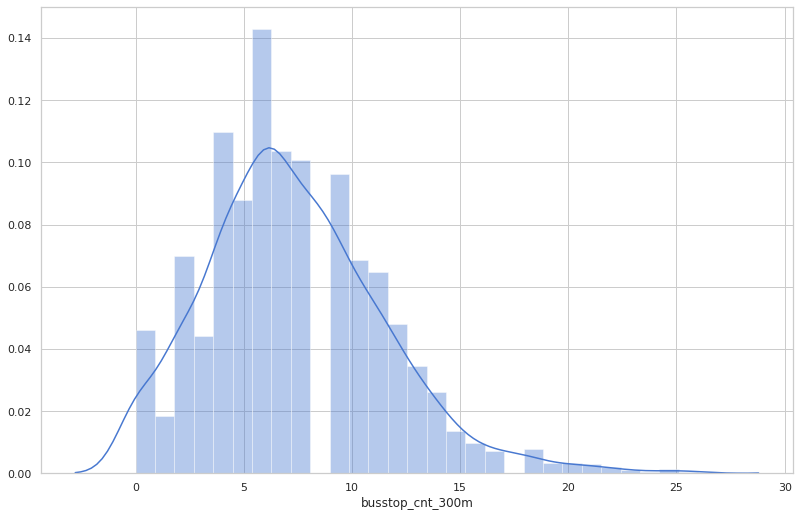

In [263]:
sns.distplot(candidate_gdf['busstop_cnt_300m'])

300m 기준으로 분포한 버스정류장의 개수를 그려보았다.

이 때, 5개가 가장 맡은 값을 보이고 있다. 이점을 기반으로 주변 정류장의 개수가 5개 이상인 후보군을 선택하였다.

In [264]:
bus_count = 5
candidate_bus_count_gdf = candidate_gdf[candidate_gdf['busstop_cnt_300m'] > bus_count]

### 3.3.2 버스정류장 승하차 평균

In [265]:
candidate_gdf = calculateCloseLandmarkFeatures(candidate_gdf, busstop_df, 0.3, "busstop", "GETON_CNT", np.mean)
candidate_gdf.head()

진행중 0 / 2295 
진행 시간 0.00011801719665527344
진행중 1000 / 2295 
진행 시간 11.622398376464844
진행중 2000 / 2295 
진행 시간 23.289047479629517


,geometry,GID_POP,pop_200_sum,b_area_200_sum,HOUSE_COUNTS_200_mean,LAT,LON,busstop_cnt_300m,busstop_GETON_CNT_mean_300m
0,POINT (126.85638 37.64816),0,0.0,0.00,0.0,37.648165,126.856382,4.0,270.250000
1,POINT (126.85673 37.64851),0,7.0,82.08,1.0,37.648508,126.856730,3.0,357.333333
2,POINT (126.84622 37.65387),39,66.0,324.80,8.5,37.653874,126.846216,3.0,77277.333333
3,POINT (126.81864 37.66389),0,0.0,0.00,0.0,37.663891,126.818638,3.0,43.000000
4,POINT (126.81698 37.66336),0,0.0,0.00,0.0,37.663364,126.816985,3.0,43.000000


In [266]:
candidate_gdf.fillna(0, inplace=True)
candidate_gdf.head()

,geometry,GID_POP,pop_200_sum,b_area_200_sum,HOUSE_COUNTS_200_mean,LAT,LON,busstop_cnt_300m,busstop_GETON_CNT_mean_300m
0,POINT (126.85638 37.64816),0,0.0,0.00,0.0,37.648165,126.856382,4.0,270.250000
1,POINT (126.85673 37.64851),0,7.0,82.08,1.0,37.648508,126.856730,3.0,357.333333
2,POINT (126.84622 37.65387),39,66.0,324.80,8.5,37.653874,126.846216,3.0,77277.333333
3,POINT (126.81864 37.66389),0,0.0,0.00,0.0,37.663891,126.818638,3.0,43.000000
4,POINT (126.81698 37.66336),0,0.0,0.00,0.0,37.663364,126.816985,3.0,43.000000


<AxesSubplot:xlabel='busstop_GETON_CNT_mean_300m'>

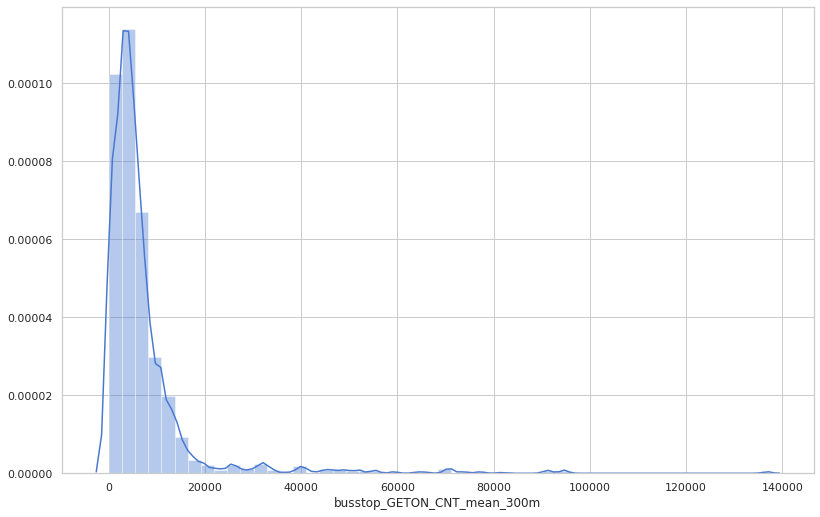

In [267]:
sns.distplot(candidate_gdf['busstop_GETON_CNT_mean_300m'])

300m 기준으로 버스 정류장 승하차 인원을 살펴보았을 때, 위와 같은 분포를 보인다.

우리는 승하차 인원이 많은 정류장을 기반으로 후보군을 뽑기 위해 5000명 이상의 승하차 인원을 보이는 후보군을 filter로 적용했다.

In [268]:
bus_mean = 5000
candidate_bus_mean_gdf = candidate_gdf[candidate_gdf['busstop_GETON_CNT_mean_300m'] > bus_mean]
candidate_bus_mean_gdf.head()

,geometry,GID_POP,pop_200_sum,b_area_200_sum,HOUSE_COUNTS_200_mean,LAT,LON,busstop_cnt_300m,busstop_GETON_CNT_mean_300m
2,POINT (126.84622 37.65387),39,66.0,324.80,8.500000,37.653874,126.846216,3.0,77277.333333
5,POINT (126.83777 37.65443),0,1444.0,25265.87,11.400000,37.654433,126.837774,17.0,10091.071429
6,POINT (126.87357 37.64843),0,315.0,10427.90,0.000000,37.648432,126.873569,10.0,9873.200000
7,POINT (126.87381 37.65099),0,654.0,44656.10,6.333333,37.650991,126.873812,8.0,12835.750000
8,POINT (126.87164 37.65179),0,23.0,0.00,1.000000,37.651786,126.871636,7.0,10060.428571


### 3.3.3 지하철 수

In [269]:
candidate_gdf = countCloseLandmarks(candidate_gdf, subway_space_df, 1.0, "subway")
candidate_gdf

진행중 0 / 2295 
진행 시간 8.344650268554688e-05
진행중 1000 / 2295 
진행 시간 0.7457067966461182
진행중 2000 / 2295 
진행 시간 1.4489400386810303


,geometry,GID_POP,pop_200_sum,b_area_200_sum,HOUSE_COUNTS_200_mean,LAT,LON,busstop_cnt_300m,busstop_GETON_CNT_mean_300m,subway_cnt_1000m
0,POINT (126.85638 37.64816),0,0.0,0.00,0.000000,37.648165,126.856382,4.0,270.250000,0.0
1,POINT (126.85673 37.64851),0,7.0,82.08,1.000000,37.648508,126.856730,3.0,357.333333,0.0
2,POINT (126.84622 37.65387),39,66.0,324.80,8.500000,37.653874,126.846216,3.0,77277.333333,1.0
3,POINT (126.81864 37.66389),0,0.0,0.00,0.000000,37.663891,126.818638,3.0,43.000000,0.0
4,POINT (126.81698 37.66336),0,0.0,0.00,0.000000,37.663364,126.816985,3.0,43.000000,0.0
...,...,...,...,...,...,...,...,...,...,...
2290,POINT (126.77126 37.66792),0,1309.0,6517.39,15.000000,37.667918,126.771265,5.0,4988.600000,2.0
2291,POINT (126.77290 37.67029),0,1126.0,8833.66,12.000000,37.670289,126.772900,3.0,8422.000000,0.0
2292,POINT (126.77142 37.66771),0,1544.0,6900.47,17.285714,37.667711,126.771419,5.0,4988.600000,2.0
2293,POINT (126.77107 37.66677),0,1169.0,3926.61,18.000000,37.666768,126.771074,6.0,5087.666667,2.0


<AxesSubplot:xlabel='subway_cnt_1000m'>

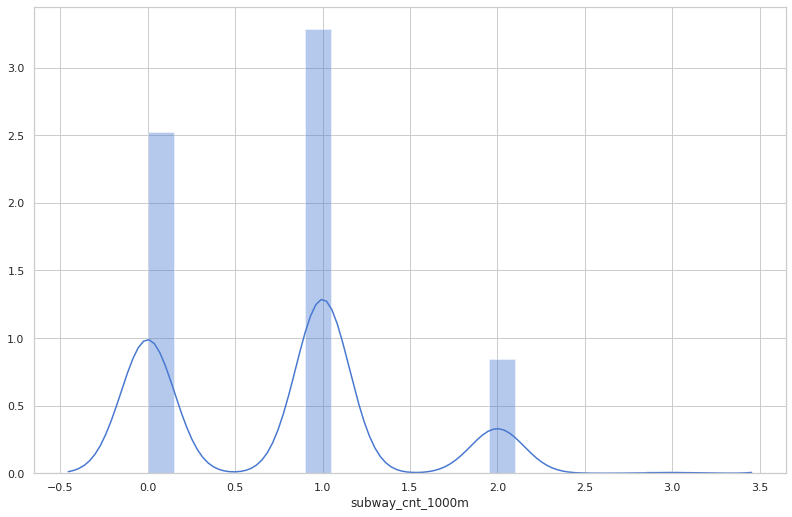

In [270]:
sns.distplot(candidate_gdf['subway_cnt_1000m'])

반경 1km 기준 지하철역 개수의 분포는 위와 같다.

우리는 주변에 지하철 역의 유무에 따른 filter를 적용하였다.

In [271]:
subway_cnt = 0
candidate_subway_count_gdf = candidate_gdf[candidate_gdf['subway_cnt_1000m'] > subway_cnt]
candidate_subway_count_gdf.head()

,geometry,GID_POP,pop_200_sum,b_area_200_sum,HOUSE_COUNTS_200_mean,LAT,LON,busstop_cnt_300m,busstop_GETON_CNT_mean_300m,subway_cnt_1000m
2,POINT (126.84622 37.65387),39,66.0,324.80,8.500000,37.653874,126.846216,3.0,77277.333333,1.0
5,POINT (126.83777 37.65443),0,1444.0,25265.87,11.400000,37.654433,126.837774,17.0,10091.071429,1.0
6,POINT (126.87357 37.64843),0,315.0,10427.90,0.000000,37.648432,126.873569,10.0,9873.200000,1.0
7,POINT (126.87381 37.65099),0,654.0,44656.10,6.333333,37.650991,126.873812,8.0,12835.750000,1.0
8,POINT (126.87164 37.65179),0,23.0,0.00,1.000000,37.651786,126.871636,7.0,10060.428571,1.0


### 3.3.4 지하철 승하차 평균

In [272]:
candidate_gdf = calculateCloseLandmarkFeatures(candidate_gdf, subway_space_df, 1.0, "subway", "IN", sum)
candidate_gdf = calculateCloseLandmarkFeatures(candidate_gdf, subway_space_df, 1.0, "subway", "OUT", sum)
candidate_gdf.head()

진행중 0 / 2295 
진행 시간 8.487701416015625e-05
진행중 1000 / 2295 
진행 시간 0.8387002944946289
진행중 2000 / 2295 
진행 시간 1.642845630645752
진행중 0 / 2295 
진행 시간 9.417533874511719e-05
진행중 1000 / 2295 
진행 시간 0.8159756660461426
진행중 2000 / 2295 
진행 시간 1.6353483200073242


,geometry,GID_POP,pop_200_sum,b_area_200_sum,HOUSE_COUNTS_200_mean,LAT,LON,busstop_cnt_300m,busstop_GETON_CNT_mean_300m,subway_cnt_1000m,subway_IN_sum_1000m,subway_OUT_sum_1000m
0,POINT (126.85638 37.64816),0,0.0,0.00,0.0,37.648165,126.856382,4.0,270.250000,0.0,0.0,0.0
1,POINT (126.85673 37.64851),0,7.0,82.08,1.0,37.648508,126.856730,3.0,357.333333,0.0,0.0,0.0
2,POINT (126.84622 37.65387),39,66.0,324.80,8.5,37.653874,126.846216,3.0,77277.333333,1.0,4393260.0,4214589.0
3,POINT (126.81864 37.66389),0,0.0,0.00,0.0,37.663891,126.818638,3.0,43.000000,0.0,0.0,0.0
4,POINT (126.81698 37.66336),0,0.0,0.00,0.0,37.663364,126.816985,3.0,43.000000,0.0,0.0,0.0


In [273]:
candidate_gdf['subway_IN+OUT_sum_1000m'] = candidate_gdf['subway_IN_sum_1000m'] + candidate_gdf['subway_OUT_sum_1000m']
candidate_gdf.head()

,geometry,GID_POP,pop_200_sum,b_area_200_sum,HOUSE_COUNTS_200_mean,LAT,LON,busstop_cnt_300m,busstop_GETON_CNT_mean_300m,subway_cnt_1000m,subway_IN_sum_1000m,subway_OUT_sum_1000m,subway_IN+OUT_sum_1000m
0,POINT (126.85638 37.64816),0,0.0,0.00,0.0,37.648165,126.856382,4.0,270.250000,0.0,0.0,0.0,0.0
1,POINT (126.85673 37.64851),0,7.0,82.08,1.0,37.648508,126.856730,3.0,357.333333,0.0,0.0,0.0,0.0
2,POINT (126.84622 37.65387),39,66.0,324.80,8.5,37.653874,126.846216,3.0,77277.333333,1.0,4393260.0,4214589.0,8607849.0
3,POINT (126.81864 37.66389),0,0.0,0.00,0.0,37.663891,126.818638,3.0,43.000000,0.0,0.0,0.0,0.0
4,POINT (126.81698 37.66336),0,0.0,0.00,0.0,37.663364,126.816985,3.0,43.000000,0.0,0.0,0.0,0.0


<AxesSubplot:xlabel='subway_IN+OUT_sum_1000m'>

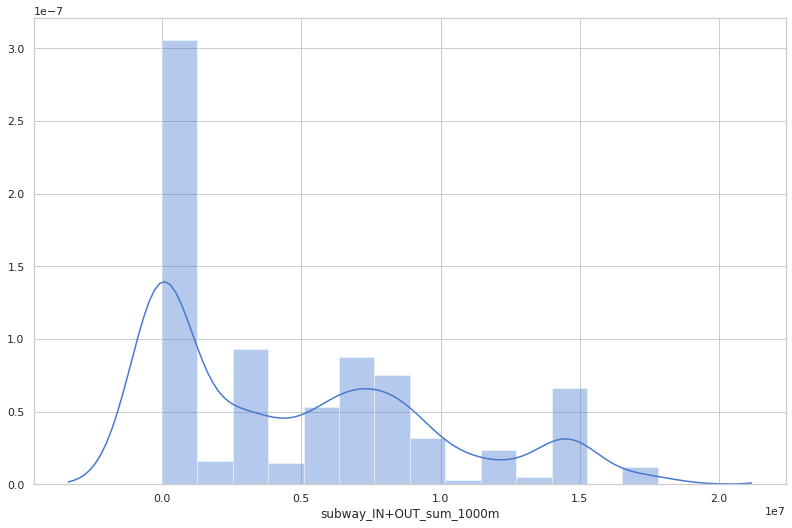

In [274]:
sns.distplot(candidate_gdf['subway_IN+OUT_sum_1000m'])

주변 1km내 지하철역의 승하차 인원의 합의 분포는 위와 같다.

지하철 역이 있는 경우가 드물기 때문에, 우리는 주변에 지하철역이 존재하기만 한다면 이 승하차인원을 사용하도록 하는 filter를 적용했다.

In [275]:
subway_mean = 0
candidate_subway_mean_gdf = candidate_gdf[candidate_gdf['subway_IN+OUT_sum_1000m'] > subway_mean]
candidate_subway_mean_gdf.head()

,geometry,GID_POP,pop_200_sum,b_area_200_sum,HOUSE_COUNTS_200_mean,LAT,LON,busstop_cnt_300m,busstop_GETON_CNT_mean_300m,subway_cnt_1000m,subway_IN_sum_1000m,subway_OUT_sum_1000m,subway_IN+OUT_sum_1000m
2,POINT (126.84622 37.65387),39,66.0,324.80,8.500000,37.653874,126.846216,3.0,77277.333333,1.0,4393260.0,4214589.0,8607849.0
5,POINT (126.83777 37.65443),0,1444.0,25265.87,11.400000,37.654433,126.837774,17.0,10091.071429,1.0,4393260.0,4214589.0,8607849.0
6,POINT (126.87357 37.64843),0,315.0,10427.90,0.000000,37.648432,126.873569,10.0,9873.200000,1.0,3036522.0,2720898.0,5757420.0
7,POINT (126.87381 37.65099),0,654.0,44656.10,6.333333,37.650991,126.873812,8.0,12835.750000,1.0,3036522.0,2720898.0,5757420.0
8,POINT (126.87164 37.65179),0,23.0,0.00,1.000000,37.651786,126.871636,7.0,10060.428571,1.0,3036522.0,2720898.0,5757420.0


### 3.3.5 학교 수

In [276]:
candidate_gdf = countCloseLandmarks(candidate_gdf, school_gdf, 1.0, "school")
candidate_gdf.head()

진행중 0 / 2295 
진행 시간 8.845329284667969e-05
진행중 1000 / 2295 
진행 시간 2.12066650390625
진행중 2000 / 2295 
진행 시간 4.376356840133667


,geometry,GID_POP,pop_200_sum,b_area_200_sum,HOUSE_COUNTS_200_mean,LAT,LON,busstop_cnt_300m,busstop_GETON_CNT_mean_300m,subway_cnt_1000m,subway_IN_sum_1000m,subway_OUT_sum_1000m,subway_IN+OUT_sum_1000m,school_cnt_1000m
0,POINT (126.85638 37.64816),0,0.0,0.00,0.0,37.648165,126.856382,4.0,270.250000,0.0,0.0,0.0,0.0,0.0
1,POINT (126.85673 37.64851),0,7.0,82.08,1.0,37.648508,126.856730,3.0,357.333333,0.0,0.0,0.0,0.0,0.0
2,POINT (126.84622 37.65387),39,66.0,324.80,8.5,37.653874,126.846216,3.0,77277.333333,1.0,4393260.0,4214589.0,8607849.0,1.0
3,POINT (126.81864 37.66389),0,0.0,0.00,0.0,37.663891,126.818638,3.0,43.000000,0.0,0.0,0.0,0.0,1.0
4,POINT (126.81698 37.66336),0,0.0,0.00,0.0,37.663364,126.816985,3.0,43.000000,0.0,0.0,0.0,0.0,1.0


<AxesSubplot:xlabel='school_cnt_1000m'>

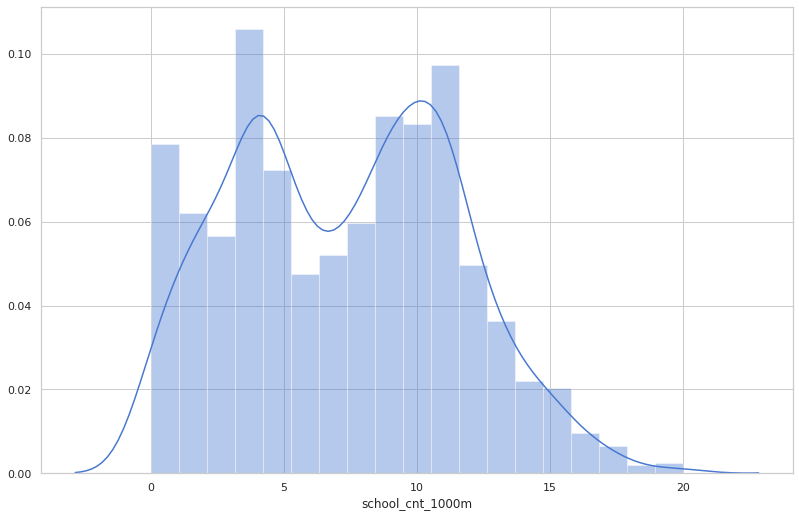

In [277]:
sns.distplot(candidate_gdf['school_cnt_1000m'])

주변 1km내 학교의 개수의 분포는 위와 같다.

우리는 학교가 많은 경우의 후보군을 추출하고 싶었기에 5개 이상의 학교를 가지는 후보군을 추출하는 filter를 적용하였다.

In [278]:
school_count = 5
candidate_school_count_gdf = candidate_gdf[candidate_gdf['school_cnt_1000m'] > school_count]
candidate_school_count_gdf.head()

,geometry,GID_POP,pop_200_sum,b_area_200_sum,HOUSE_COUNTS_200_mean,LAT,LON,busstop_cnt_300m,busstop_GETON_CNT_mean_300m,subway_cnt_1000m,subway_IN_sum_1000m,subway_OUT_sum_1000m,subway_IN+OUT_sum_1000m,school_cnt_1000m
7,POINT (126.87381 37.65099),0,654.0,44656.10,6.333333,37.650991,126.873812,8.0,12835.750000,1.0,3036522.0,2720898.0,5757420.0,6.0
11,POINT (126.87359 37.65046),0,412.0,43665.57,0.000000,37.650457,126.873587,9.0,11417.333333,1.0,3036522.0,2720898.0,5757420.0,6.0
47,POINT (126.87535 37.64700),0,0.0,0.00,0.000000,37.647005,126.875350,8.0,991.250000,1.0,3036522.0,2720898.0,5757420.0,6.0
70,POINT (126.77195 37.66571),206,1270.0,5772.76,16.714286,37.665709,126.771947,6.0,31317.333333,1.0,3316374.0,3527251.0,6843625.0,9.0
71,POINT (126.77183 37.66530),206,725.0,4997.33,11.600000,37.665304,126.771829,6.0,31317.333333,1.0,3316374.0,3527251.0,6843625.0,9.0


### 3.3.6 문화시설 수

In [279]:
candidate_gdf = countCloseLandmarks(candidate_gdf, sport_complex_info_df, 1.0, "sports")
candidate_gdf.head()

진행중 0 / 2295 
진행 시간 0.0002713203430175781
진행중 1000 / 2295 
진행 시간 2.086265802383423
진행중 2000 / 2295 
진행 시간 4.0695741176605225


,geometry,GID_POP,pop_200_sum,b_area_200_sum,HOUSE_COUNTS_200_mean,LAT,LON,busstop_cnt_300m,busstop_GETON_CNT_mean_300m,subway_cnt_1000m,subway_IN_sum_1000m,subway_OUT_sum_1000m,subway_IN+OUT_sum_1000m,school_cnt_1000m,sports_cnt_1000m
0,POINT (126.85638 37.64816),0,0.0,0.00,0.0,37.648165,126.856382,4.0,270.250000,0.0,0.0,0.0,0.0,0.0,3.0
1,POINT (126.85673 37.64851),0,7.0,82.08,1.0,37.648508,126.856730,3.0,357.333333,0.0,0.0,0.0,0.0,0.0,3.0
2,POINT (126.84622 37.65387),39,66.0,324.80,8.5,37.653874,126.846216,3.0,77277.333333,1.0,4393260.0,4214589.0,8607849.0,1.0,10.0
3,POINT (126.81864 37.66389),0,0.0,0.00,0.0,37.663891,126.818638,3.0,43.000000,0.0,0.0,0.0,0.0,1.0,1.0
4,POINT (126.81698 37.66336),0,0.0,0.00,0.0,37.663364,126.816985,3.0,43.000000,0.0,0.0,0.0,0.0,1.0,1.0


<AxesSubplot:xlabel='sports_cnt_1000m'>

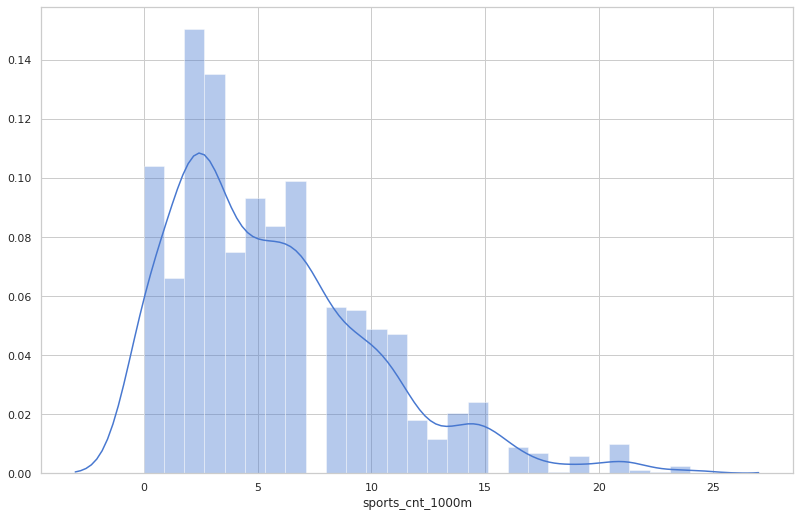

In [280]:
sns.distplot(candidate_gdf['sports_cnt_1000m'])

주변 1km 체육 시설의 분포는 위와 같다.

우리는 체육시설을 대표하는 후보군을 선정하고 싶었기 때문에 5개 이상의 체육시설을 가지는 후보군을 추출하였다.

In [281]:
sport_count = 5
candidate_sport_count_gdf = candidate_gdf[candidate_gdf['sports_cnt_1000m'] > sport_count]
candidate_sport_count_gdf.head()

,geometry,GID_POP,pop_200_sum,b_area_200_sum,HOUSE_COUNTS_200_mean,LAT,LON,busstop_cnt_300m,busstop_GETON_CNT_mean_300m,subway_cnt_1000m,subway_IN_sum_1000m,subway_OUT_sum_1000m,subway_IN+OUT_sum_1000m,school_cnt_1000m,sports_cnt_1000m
2,POINT (126.84622 37.65387),39,66.0,324.80,8.50,37.653874,126.846216,3.0,77277.333333,1.0,4393260.0,4214589.0,8607849.0,1.0,10.0
5,POINT (126.83777 37.65443),0,1444.0,25265.87,11.40,37.654433,126.837774,17.0,10091.071429,1.0,4393260.0,4214589.0,8607849.0,3.0,15.0
12,POINT (126.88588 37.64211),6,163.0,1569.64,4.25,37.642108,126.885885,8.0,489.166667,0.0,0.0,0.0,0.0,4.0,9.0
13,POINT (126.88574 37.63970),0,0.0,0.00,0.00,37.639699,126.885743,2.0,254.500000,0.0,0.0,0.0,0.0,2.0,8.0
14,POINT (126.88353 37.63770),0,0.0,0.00,0.00,37.637701,126.883531,2.0,306.000000,0.0,0.0,0.0,0.0,2.0,7.0


### 3.3.7 고도

In [282]:
candidate_gdf = candidate_gdf.to_crs(default_crs)
candidate_gdf = join_height2station(candidate_gdf, height_gdf)
candidate_gdf.head()

진행중 : 0 / 2295
진행시간 :  0.00016498565673828125
진행중 : 1 / 2295
진행시간 :  0.16474080085754395
진행중 : 2 / 2295
진행시간 :  0.359036922454834
진행중 : 3 / 2295
진행시간 :  0.529444694519043
진행중 : 4 / 2295
진행시간 :  0.7011573314666748
진행중 : 5 / 2295
진행시간 :  0.848567008972168
진행중 : 6 / 2295
진행시간 :  1.0094332695007324
진행중 : 7 / 2295
진행시간 :  1.1562891006469727
진행중 : 16 / 2295
진행시간 :  2.4191622734069824
진행중 : 17 / 2295
진행시간 :  2.5538158416748047
진행중 : 18 / 2295
진행시간 :  2.715852975845337
진행중 : 19 / 2295
진행시간 :  2.867481231689453
진행중 : 20 / 2295
진행시간 :  3.0196316242218018
진행중 : 21 / 2295
진행시간 :  3.18342924118042
진행중 : 22 / 2295
진행시간 :  3.3572638034820557
진행중 : 23 / 2295
진행시간 :  3.4953103065490723
진행중 : 1000 / 2295
진행시간 :  141.88307404518127
진행중 : 1001 / 2295
진행시간 :  142.01687049865723
진행중 : 1002 / 2295
진행시간 :  142.15983724594116
진행중 : 1003 / 2295
진행시간 :  142.30831146240234
진행중 : 1004 / 2295
진행시간 :  142.44110321998596
진행중 : 1005 / 2295
진행시간 :  142.62183332443237
진행중 : 1006 / 2295
진행시간 :  142.78915882110596
진행중 : 1

,geometry,GID_POP,pop_200_sum,b_area_200_sum,HOUSE_COUNTS_200_mean,LAT,LON,busstop_cnt_300m,busstop_GETON_CNT_mean_300m,subway_cnt_1000m,subway_IN_sum_1000m,subway_OUT_sum_1000m,subway_IN+OUT_sum_1000m,school_cnt_1000m,sports_cnt_1000m,altitude
0,POINT (126.85638 37.64816),0,0.0,0.00,0.0,37.648165,126.856382,4.0,270.250000,0.0,0.0,0.0,0.0,0.0,3.0,34.0
1,POINT (126.85673 37.64851),0,7.0,82.08,1.0,37.648508,126.856730,3.0,357.333333,0.0,0.0,0.0,0.0,0.0,3.0,34.0
2,POINT (126.84622 37.65387),39,66.0,324.80,8.5,37.653874,126.846216,3.0,77277.333333,1.0,4393260.0,4214589.0,8607849.0,1.0,10.0,27.0
3,POINT (126.81864 37.66389),0,0.0,0.00,0.0,37.663891,126.818638,3.0,43.000000,0.0,0.0,0.0,0.0,1.0,1.0,31.0
4,POINT (126.81698 37.66336),0,0.0,0.00,0.0,37.663364,126.816985,3.0,43.000000,0.0,0.0,0.0,0.0,1.0,1.0,34.5


<AxesSubplot:xlabel='altitude'>

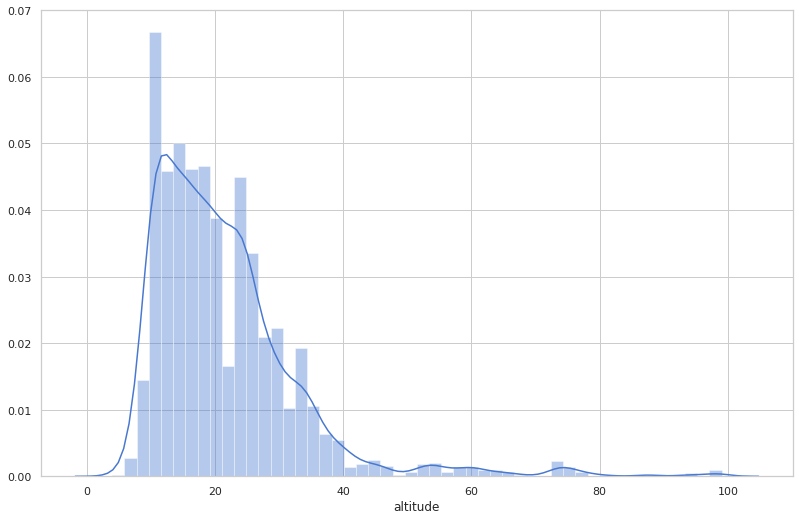

In [283]:
sns.distplot(candidate_gdf['altitude'])

고도에 따른 분포는 위와 같다.

20m 근처에 가장 많은 후보군이 위치하고, 낮은 지역에서 많은 수요가 발생함을 EDA로 부터 확인했다.

이 근거를 바탕으로 22m 보다 작은 후보군을 추출하였다.

In [284]:
min_height = 15
max_height = 30

candidate_altitude_gdf = candidate_gdf[candidate_gdf['altitude'] < max_height]
candidate_altitude_gdf = candidate_altitude_gdf[candidate_altitude_gdf['altitude'] > min_height]

candidate_altitude_gdf

,geometry,GID_POP,pop_200_sum,b_area_200_sum,HOUSE_COUNTS_200_mean,LAT,LON,busstop_cnt_300m,busstop_GETON_CNT_mean_300m,subway_cnt_1000m,subway_IN_sum_1000m,subway_OUT_sum_1000m,subway_IN+OUT_sum_1000m,school_cnt_1000m,sports_cnt_1000m,altitude
2,POINT (126.84622 37.65387),39,66.0,324.80,8.500000,37.653874,126.846216,3.0,77277.333333,1.0,4393260.0,4214589.0,8607849.0,1.0,10.0,27.0
6,POINT (126.87357 37.64843),0,315.0,10427.90,0.000000,37.648432,126.873569,10.0,9873.200000,1.0,3036522.0,2720898.0,5757420.0,5.0,2.0,18.0
7,POINT (126.87381 37.65099),0,654.0,44656.10,6.333333,37.650991,126.873812,8.0,12835.750000,1.0,3036522.0,2720898.0,5757420.0,6.0,1.0,23.0
8,POINT (126.87164 37.65179),0,23.0,0.00,1.000000,37.651786,126.871636,7.0,10060.428571,1.0,3036522.0,2720898.0,5757420.0,5.0,1.0,29.0
10,POINT (126.87176 37.65129),0,0.0,0.00,0.000000,37.651289,126.871759,7.0,10060.428571,1.0,3036522.0,2720898.0,5757420.0,5.0,1.0,22.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2269,POINT (126.84442 37.69638),274,356.0,1940.41,5.666667,37.696379,126.844422,6.0,3410.500000,0.0,0.0,0.0,0.0,1.0,0.0,29.0
2270,POINT (126.84440 37.69641),274,356.0,1940.41,5.666667,37.696410,126.844405,6.0,3410.500000,0.0,0.0,0.0,0.0,1.0,0.0,29.0
2272,POINT (126.77478 37.66949),134,1086.0,3887.42,18.000000,37.669488,126.774777,5.0,4374.200000,0.0,0.0,0.0,0.0,10.0,3.0,18.0
2275,POINT (126.77399 37.66865),158,1066.0,2792.89,19.000000,37.668652,126.773986,6.0,4072.500000,0.0,0.0,0.0,0.0,10.0,3.0,17.0


In [285]:
# 위에서 추출한 모든 필터를 합친다.
filter_list = [
    candidate_bus_count_gdf,
    candidate_bus_mean_gdf,
    candidate_subway_count_gdf,
    candidate_subway_mean_gdf,
    candidate_school_count_gdf,
    candidate_sport_count_gdf,
    candidate_altitude_gdf
]

In [286]:
filter_index = []
for df in filter_list:
    filter_index += list(df.index)
filter_index = list(set(filter_index))
len(filter_index)

2184

In [287]:
candidate_after_filter_gdf = candidate_gdf.loc[filter_index]
candidate_after_filter_gdf

,geometry,GID_POP,pop_200_sum,b_area_200_sum,HOUSE_COUNTS_200_mean,LAT,LON,busstop_cnt_300m,busstop_GETON_CNT_mean_300m,subway_cnt_1000m,subway_IN_sum_1000m,subway_OUT_sum_1000m,subway_IN+OUT_sum_1000m,school_cnt_1000m,sports_cnt_1000m,altitude
2,POINT (126.84622 37.65387),39,66.0,324.80,8.500000,37.653874,126.846216,3.0,77277.333333,1.0,4393260.0,4214589.0,8607849.0,1.0,10.0,27.0
5,POINT (126.83777 37.65443),0,1444.0,25265.87,11.400000,37.654433,126.837774,17.0,10091.071429,1.0,4393260.0,4214589.0,8607849.0,3.0,15.0,15.0
6,POINT (126.87357 37.64843),0,315.0,10427.90,0.000000,37.648432,126.873569,10.0,9873.200000,1.0,3036522.0,2720898.0,5757420.0,5.0,2.0,18.0
7,POINT (126.87381 37.65099),0,654.0,44656.10,6.333333,37.650991,126.873812,8.0,12835.750000,1.0,3036522.0,2720898.0,5757420.0,6.0,1.0,23.0
8,POINT (126.87164 37.65179),0,23.0,0.00,1.000000,37.651786,126.871636,7.0,10060.428571,1.0,3036522.0,2720898.0,5757420.0,5.0,1.0,29.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2290,POINT (126.77126 37.66792),0,1309.0,6517.39,15.000000,37.667918,126.771265,5.0,4988.600000,2.0,6876721.0,7201370.0,14078091.0,10.0,5.0,13.0
2291,POINT (126.77290 37.67029),0,1126.0,8833.66,12.000000,37.670289,126.772900,3.0,8422.000000,0.0,0.0,0.0,0.0,9.0,3.0,14.5
2292,POINT (126.77142 37.66771),0,1544.0,6900.47,17.285714,37.667711,126.771419,5.0,4988.600000,2.0,6876721.0,7201370.0,14078091.0,9.0,5.0,13.0
2293,POINT (126.77107 37.66677),0,1169.0,3926.61,18.000000,37.666768,126.771074,6.0,5087.666667,2.0,6876721.0,7201370.0,14078091.0,9.0,5.0,12.0


## 3.4 결론

우리는 굉장히 추상적인 후보군 추출을 앞선 EDA의 결과를 종합하여 상당히 가능성이 높은 후보군을 다수 추출하였다. 해당 후보군을 추출하는데 고려한 점은 다음과 같다.

1. 미배치 지역
2. 상업지역
3. 거주지역
4. 빌딩 연면적
5. 주거 인구
6. 주변 버스 정류장 개수
7. 주변 버스 정류장 승하차 인원
8. 주변 지하철 역 개수
9. 주변 지하철 역 승하차 인원
10. 주변 교육시설 개수
11. 주변 체육시설 개수
12. 고도

# 4. 수요 예측 모형

제안된 후보군의 수요를 예측하기 위한 모델을 제작한다.

* 4.1 수요 정의
* 4.2 Modeling
    * 4.2.1 사용하는 변수
    * 4.2.2 모형 선택
    * 4.2.3 결과
* 4.3 후보군 수요 예측
    * 4.3.1 사용하는 변수
    * 4.3.2 수요 예측

## 4.1 수요 정의

자전거 공유 서비스를 사용하는데 있어서 수요는 다양한 측면에서 바라볼 수 있다. 

이 때, 우리는 이 수요라는 것을 총 두가지 관점에서 바라보았다. 

첫번째, 거치대 반입량, 반출량의 절대적인 량을 사용하였다. 이 지표는 하나의 거치대에서 방문하는 사용자의 총량을 대변한다. 


두번째, 거치대 반입량, 반출량의 차이를 사용하였다. 이 지표는 하나의 거치대에서 유입, 유출되는 자전거의 변화량을 의미한다.

이 때, 우리는 이러한 두가지 지표의 시간 단위를 일로 설정하였다. 

결과적으로 사용하는 수요의 개념은 다음과 같다.

- 용어 정의
    - 총 자전거 이용량 (반입량+반출량)의 일별 평균 : 절대 수요
        * $(return+lease)/totalDay$

    - 총 자전거 변화량 (반입량-반출량)의 일별 평균 : 상대 수요
         * $(return-lease)/totalDay$

## 4.2 Modeling
* 4.2.1 사용하는 변수
* 4.2.2 모형 선택
* 4.2.3 결과

### 4.2.1 사용하는 변수

EDA결과를 기반으로 다양한 변수를 생성하여 사용하였다.

1. 버스 정류장 개수
   * 'busstop_cnt_200m'
   * 'busstop_cnt_300m'
   * 'busstop_cnt_500m'
2. 버스 정류장 승하차 합계/평균
   * 'busstop_GETON_CNT_sum_200m'
   * 'busstop_GETON_CNT_sum_300m'
   * 'busstop_GETON_CNT_sum_500m'
   * 'busstop_GETON_CNT_mean_200m'
   * 'busstop_GETON_CNT_mean_300m'
   * 'busstop_GETON_CNT_mean_500m'
3. 지하철 역 개수
   * 'subway_cnt_500m'
   * 'subway_cnt_1000m'
   * 'subway_cnt_1500m'
4. 지하철역 승하차 합계/평균
   * 'subway_IN_sum_500m'
   * 'subway_IN_sum_1000m'
   * 'subway_IN_sum_1500m'
   * 'subway_IN_mean_500m'
   * 'subway_IN_mean_1000m'
   * 'subway_IN_mean_1500m'
   * 'subway_OUT_sum_500m'
   * 'subway_OUT_sum_1000m'
   * 'subway_OUT_sum_1500m'
   * 'subway_OUT_mean_500m'
   * 'subway_OUT_mean_1000m'
   * 'subway_OUT_mean_1500m'
   * 'subway_NET_TOTAL_sum_500m'
   * 'subway_NET_TOTAL_sum_1000m'
   * 'subway_NET_TOTAL_sum_1500m'
   * 'subway_NET_TOTAL_mean_500m'
   * 'subway_NET_TOTAL_mean_1000m'
   * 'subway_NET_TOTAL_mean_1500m'
5. 교육시설 개수
   * 'school_cnt_500m'
   * 'school_cnt_1000m'
   * 'school_cnt_1500m'
6. 체육시설 개수
   * 'sports_cnt_500m'
   * 'sports_cnt_1000m'
   * 'sports_cnt_1500m'
7. 고도
   * 'altitude'
8. 거주 인구
   * 'GID_POP'
9. 200m 내 인구 합계
   * 'pop_200_sum'
10. 200m 내 건물 연면적 합계
    * 'b_area_200_sum'
11. 200m내 주거 건물 수 평균
    * 'HOUSE_COUNTS_200_mean'
12. 상업/거주 지역 구분
    * 'areatype'
13. 네트워크 분석을 통한 군집
     * 'CLUSTER'

In [288]:
train_df = station_df[['STATION_ID', 'geometry', 'LAT', 'LON']]
train_df.head()

,STATION_ID,geometry,LAT,LON
0,101,POINT (126.83458 37.65477),37.654775,126.834584
1,103,POINT (126.84038 37.66044),37.660442,126.840377
2,104,POINT (126.76604 37.69852),37.698523,126.766042
3,105,POINT (126.83926 37.65524),37.655244,126.839261
4,106,POINT (126.84253 37.65341),37.653410,126.842530


In [289]:
# 거치대 df에 사용할 수 있는 모든 변수를 추가한다.
def createVariableInTrain(train_df):
    col_name = ['busstop_cnt_200m', 'busstop_cnt_300m', 'busstop_cnt_500m']
    param = [0.2, 0.3, 0.5]
    for i in range(len(col_name)):
        print("{} 작업중".format(col_name[i]))
        if col_name[i] not in list(train_df.columns):
            train_df = countCloseLandmarks(train_df, busstop_df, param[i], "busstop")

    col_name = ['busstop_GETON_CNT_sum_200m', 'busstop_GETON_CNT_sum_300m', 'busstop_GETON_CNT_sum_500m']
    param = [0.2, 0.3, 0.5]
    for i in range(len(col_name)):
        print("{} 작업중".format(col_name[i]))
        if col_name[i] not in list(train_df.columns):
            train_df = calculateCloseLandmarkFeatures(train_df, busstop_df, param[i], "busstop", "GETON_CNT", sum)
            
    col_name = ['busstop_GETON_CNT_mean_200m', 'busstop_GETON_CNT_mean_300m', 'busstop_GETON_CNT_mean_500m']
    param = [0.2, 0.3, 0.5]
    for i in range(len(col_name)):
        print("{} 작업중".format(col_name[i]))
        if col_name[i] not in list(train_df.columns):
            train_df = calculateCloseLandmarkFeatures(train_df, busstop_df, param[i], "busstop", "GETON_CNT", np.mean)
            
    col_name = ['subway_cnt_500m', 'subway_cnt_1000m', 'subway_cnt_1500m']
    param = [0.5, 1.0, 1.5]
    for i in range(len(col_name)):
        print("{} 작업중".format(col_name[i]))
        if col_name[i] not in list(train_df.columns):
            train_df = countCloseLandmarks(train_df, subway_space_df, param[i], "subway")
    
    col_name = ['subway_IN_sum_500m', 'subway_IN_sum_1000m', 'subway_IN_sum_1500m']
    param = [0.5, 1.0, 1.5]
    for i in range(len(col_name)):
        print("{} 작업중".format(col_name[i]))
        if col_name[i] not in list(train_df.columns):
            train_df = calculateCloseLandmarkFeatures(train_df, subway_space_df, param[i], "subway", "IN", sum)
    
    col_name = ['subway_IN_mean_500m', 'subway_IN_mean_1000m', 'subway_IN_mean_1500m']
    param = [0.5, 1.0, 1.5]
    for i in range(len(col_name)):
        print("{} 작업중".format(col_name[i]))
        if col_name[i] not in list(train_df.columns):
            train_df = calculateCloseLandmarkFeatures(train_df, subway_space_df, param[i], "subway", "IN", np.mean)
    
    col_name = ['subway_OUT_sum_500m', 'subway_OUT_sum_1000m', 'subway_OUT_sum_1500m']
    param = [0.5, 1.0, 1.5]
    for i in range(len(col_name)):
        print("{} 작업중".format(col_name[i]))
        if col_name[i] not in list(train_df.columns):
            train_df = calculateCloseLandmarkFeatures(train_df, subway_space_df, param[i], "subway", "OUT", sum)
    
    col_name = ['subway_OUT_mean_500m', 'subway_OUT_mean_1000m', 'subway_OUT_mean_1500m']
    param = [0.5, 1.0, 1.5]
    for i in range(len(col_name)):
        print("{} 작업중".format(col_name[i]))
        if col_name[i] not in list(train_df.columns):
            train_df = calculateCloseLandmarkFeatures(train_df, subway_space_df, param[i], "subway", "OUT", np.mean)
            
    col_name = ['subway_NET_TOTAL_sum_500m', 'subway_NET_TOTAL_sum_1000m', 'subway_NET_TOTAL_sum_1500m']
    param = [0.5, 1.0, 1.5]
    for i in range(len(col_name)):
        print("{} 작업중".format(col_name[i]))
        if col_name[i] not in list(train_df.columns):
            train_df = calculateCloseLandmarkFeatures(train_df, subway_space_df, param[i], "subway", "NET_TOTAL", sum)
    
    col_name = ['subway_NET_TOTAL_mean_500m', 'subway_NET_TOTAL_mean_1000m', 'subway_NET_TOTAL_mean_1500m']
    param = [0.5, 1.0, 1.5]
    for i in range(len(col_name)):
        print("{} 작업중".format(col_name[i]))
        if col_name[i] not in list(train_df.columns):
            train_df = calculateCloseLandmarkFeatures(train_df, subway_space_df, param[i], "subway", "NET_TOTAL", np.mean)
            
    col_name = ['school_cnt_500m', 'school_cnt_1000m', 'school_cnt_1500m']
    param = [0.5, 1.0, 1.5]
    for i in range(len(col_name)):
        print("{} 작업중".format(col_name[i]))
        if col_name[i] not in list(train_df.columns):
            train_df = countCloseLandmarks(train_df, school_gdf, param[i], "school")
            
    col_name = ['sports_cnt_500m', 'sports_cnt_1000m', 'sports_cnt_1500m']
    param = [0.5, 1.0, 1.5]
    for i in range(len(col_name)):
        print("{} 작업중".format(col_name[i]))
        if col_name[i] not in list(train_df.columns):
            train_df = countCloseLandmarks(train_df, sport_complex_info_df, param[i], "sports")
    
    col_name = 'altitude'
    print("{} 작업중".format(col_name))
    if col_name not in list(train_df.columns):
        train_df = join_height2station(train_df, height_gdf)
    
    train_df = train_df.to_crs(meter_crs)
    
    col_name = 'GID_POP'
    print("{} 작업중".format(col_name))
    if col_name not in list(train_df.columns):
        # 사용하기 전 변수 세팅
        args = [train_df, population_dist_gdfM_not_zero_coverage, "val", "GID_POP"]
        # 함수 실행
        train_df = join2gid(*args)
     
    col_name = 'pop_200_sum'
    print("{} 작업중".format(col_name))
    if col_name not in list(train_df.columns):
        # 사용하기 전 변수 세팅
        args = [train_df, house_counts_cover_gdf, 200, gpd.GeoSeries.within, np.sum]
        # 함수 실행
        train_df = join_info2station(*args)
        
    col_name = 'areatype'
    print("{} 작업중".format(col_name))
    if col_name not in list(train_df.columns):
        # 사용하기 전 변수 세팅
        args = [train_df, house_counts_gdf, "areatype", "areatype"]
        # 함수 실행
        train_df = join2gid(*args)
        
    train_df.fillna(0, inplace=True)
    
    col_name = 'CLUSTER'
    print("{} 작업중".format(col_name))
    if col_name not in list(train_df.columns):
        cluster = pd.DataFrame([list(partition.keys()), list(partition.values())]).T
        cluster.columns = ['STATION_ID', 'CLUSTER']
        train_df = pd.merge(train_df, cluster, how='left', on='STATION_ID')
        
    train_df.dropna(inplace=True)
    train_df = train_df.to_crs(default_crs)
    
    return train_df

In [290]:
train_df = createVariableInTrain(train_df)
train_df

busstop_cnt_200m 작업중
busstop_cnt_300m 작업중
busstop_cnt_500m 작업중
busstop_GETON_CNT_sum_200m 작업중
busstop_GETON_CNT_sum_300m 작업중
busstop_GETON_CNT_sum_500m 작업중
busstop_GETON_CNT_mean_200m 작업중
busstop_GETON_CNT_mean_300m 작업중
busstop_GETON_CNT_mean_500m 작업중
subway_cnt_500m 작업중
subway_cnt_1000m 작업중
subway_cnt_1500m 작업중
subway_IN_sum_500m 작업중
subway_IN_sum_1000m 작업중
subway_IN_sum_1500m 작업중
subway_IN_mean_500m 작업중
subway_IN_mean_1000m 작업중
subway_IN_mean_1500m 작업중
subway_OUT_sum_500m 작업중
subway_OUT_sum_1000m 작업중
subway_OUT_sum_1500m 작업중
subway_OUT_mean_500m 작업중
subway_OUT_mean_1000m 작업중
subway_OUT_mean_1500m 작업중
subway_NET_TOTAL_sum_500m 작업중
subway_NET_TOTAL_sum_1000m 작업중
subway_NET_TOTAL_sum_1500m 작업중
subway_NET_TOTAL_mean_500m 작업중
subway_NET_TOTAL_mean_1000m 작업중
subway_NET_TOTAL_mean_1500m 작업중
school_cnt_500m 작업중
school_cnt_1000m 작업중
school_cnt_1500m 작업중
sports_cnt_500m 작업중
sports_cnt_1000m 작업중
sports_cnt_1500m 작업중
altitude 작업중
진행중 : 0 / 164
진행시간 :  5.125999450683594e-05
진행중 : 1 / 164
진행시간 :  

,STATION_ID,geometry,LAT,LON,busstop_cnt_200m,busstop_cnt_300m,busstop_cnt_500m,busstop_GETON_CNT_sum_200m,busstop_GETON_CNT_sum_300m,busstop_GETON_CNT_sum_500m,...,sports_cnt_500m,sports_cnt_1000m,sports_cnt_1500m,altitude,GID_POP,pop_200_sum,b_area_200_sum,HOUSE_COUNTS_200_mean,areatype,CLUSTER
0,101,POINT (126.83458 37.65477),37.654775,126.834584,5.0,21.0,38.0,22817.0,142127.0,228849.0,...,1.0,14.0,28.0,14.0,0,649.0,7714.92,2.000000,2,0.0
1,103,POINT (126.84038 37.66044),37.660442,126.840377,3.0,7.0,25.0,12482.0,37794.0,81961.0,...,7.0,13.0,26.0,18.0,0,2317.0,33074.09,4.000000,2,0.0
2,104,POINT (126.76604 37.69852),37.698523,126.766042,6.0,15.0,25.0,38767.0,53381.0,78852.0,...,2.0,3.0,12.0,35.0,0,1508.0,23176.40,2.000000,2,1.0
3,105,POINT (126.83926 37.65524),37.655244,126.839261,5.0,12.0,34.0,57388.0,136789.0,422520.0,...,0.0,21.0,27.0,19.0,0,894.0,7127.04,14.333333,2,0.0
4,106,POINT (126.84253 37.65341),37.653410,126.842530,6.0,8.0,15.0,241438.0,257783.0,308135.0,...,0.0,18.0,26.0,18.0,0,719.0,1352.44,8.666667,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
157,348,POINT (126.75479 37.69935),37.699353,126.754793,3.0,6.0,22.0,5287.0,27430.0,50123.0,...,3.0,4.0,7.0,32.0,0,678.0,30425.13,1.000000,1,1.0
158,349,POINT (126.75264 37.69784),37.697838,126.752642,3.0,13.0,16.0,19920.0,31528.0,31836.0,...,4.0,4.0,7.0,22.0,0,1760.0,57172.45,1.750000,3,1.0
159,350,POINT (126.75309 37.69787),37.697867,126.753089,3.0,12.0,16.0,19920.0,29430.0,31836.0,...,4.0,4.0,7.0,26.0,0,550.0,23127.25,1.000000,3,1.0
160,351,POINT (126.76723 37.70226),37.702259,126.767231,2.0,5.0,13.0,13995.0,25007.0,63520.0,...,2.0,2.0,7.0,38.0,0,464.0,2628.42,2.000000,2,1.0


In [291]:
# 수요로 사용할 수 있는 변수 가져오기
station_demand_df.columns = ['STATION_ID', 
                              'LEAS_COUNTS', 
                              'RTN_COUNTS',
                              'TOTAL',
                              'RTN-LEAS',
                              'LEAS_MEAN',
                              'RTN_MEAN',
                              'TOTAL_MEAN',
                              'RTN-LEAS_MEAN',
                             ]
station_demand_df

,STATION_ID,LEAS_COUNTS,RTN_COUNTS,TOTAL,RTN-LEAS,LEAS_MEAN,RTN_MEAN,TOTAL_MEAN,RTN-LEAS_MEAN
0,101,8366.0,9207.0,17573.0,841.0,7.640183,8.408219,16.048402,0.768037
1,103,4535.0,5121.0,9656.0,586.0,4.141553,4.676712,8.818265,0.536563
2,104,13402.0,9330.0,22732.0,-4072.0,12.239269,8.520548,20.759817,-3.723404
3,105,2806.0,2696.0,5502.0,-110.0,2.562557,2.462100,5.024658,-0.096419
4,106,4444.0,2357.0,6801.0,-2087.0,4.058447,2.152511,6.210959,-1.908425
...,...,...,...,...,...,...,...,...,...
150,348,4551.0,2925.0,7476.0,-1626.0,4.156164,2.673675,6.827397,-1.486685
151,349,7532.0,6336.0,13868.0,-1196.0,6.878539,5.786301,12.664840,-1.093236
152,350,4190.0,3662.0,7852.0,-528.0,3.829982,3.344292,7.170776,-0.482192
153,351,473.0,406.0,879.0,-67.0,4.730000,4.060000,8.790000,-0.258065


In [292]:
station_demand_df.fillna(0, inplace=True)

In [293]:
# train df에 이 이용량 수요 데이터를 추가해준다.
train_df = pd.merge(train_df, station_demand_df, how='left', on='STATION_ID')
train_df.dropna(inplace=True)
train_df.head()

,STATION_ID,geometry,LAT,LON,busstop_cnt_200m,busstop_cnt_300m,busstop_cnt_500m,busstop_GETON_CNT_sum_200m,busstop_GETON_CNT_sum_300m,busstop_GETON_CNT_sum_500m,...,areatype,CLUSTER,LEAS_COUNTS,RTN_COUNTS,TOTAL,RTN-LEAS,LEAS_MEAN,RTN_MEAN,TOTAL_MEAN,RTN-LEAS_MEAN
0,101,POINT (126.83458 37.65477),37.654775,126.834584,5.0,21.0,38.0,22817.0,142127.0,228849.0,...,2,0.0,8366.0,9207.0,17573.0,841.0,7.640183,8.408219,16.048402,0.768037
1,103,POINT (126.84038 37.66044),37.660442,126.840377,3.0,7.0,25.0,12482.0,37794.0,81961.0,...,2,0.0,4535.0,5121.0,9656.0,586.0,4.141553,4.676712,8.818265,0.536563
2,104,POINT (126.76604 37.69852),37.698523,126.766042,6.0,15.0,25.0,38767.0,53381.0,78852.0,...,2,1.0,13402.0,9330.0,22732.0,-4072.0,12.239269,8.520548,20.759817,-3.723404
3,105,POINT (126.83926 37.65524),37.655244,126.839261,5.0,12.0,34.0,57388.0,136789.0,422520.0,...,2,0.0,2806.0,2696.0,5502.0,-110.0,2.562557,2.462100,5.024658,-0.096419
4,106,POINT (126.84253 37.65341),37.653410,126.842530,6.0,8.0,15.0,241438.0,257783.0,308135.0,...,0,0.0,4444.0,2357.0,6801.0,-2087.0,4.058447,2.152511,6.210959,-1.908425


In [294]:
# train 데이터 info
# 훈련에 앞서 실수형 데이터 아닌 변수가 있는지 확인
train_df.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 155 entries, 0 to 154
Data columns (total 55 columns):
 #   Column                       Non-Null Count  Dtype   
---  ------                       --------------  -----   
 0   STATION_ID                   155 non-null    int64   
 1   geometry                     155 non-null    geometry
 2   LAT                          155 non-null    float64 
 3   LON                          155 non-null    float64 
 4   busstop_cnt_200m             155 non-null    float64 
 5   busstop_cnt_300m             155 non-null    float64 
 6   busstop_cnt_500m             155 non-null    float64 
 7   busstop_GETON_CNT_sum_200m   155 non-null    float64 
 8   busstop_GETON_CNT_sum_300m   155 non-null    float64 
 9   busstop_GETON_CNT_sum_500m   155 non-null    float64 
 10  busstop_GETON_CNT_mean_200m  155 non-null    float64 
 11  busstop_GETON_CNT_mean_300m  155 non-null    float64 
 12  busstop_GETON_CNT_mean_500m  155 non-null    float64 
 1

In [295]:
# 훈련에 필요한 컬럼을 찾는다.
remove_list = ['STATION_ID','geometry','LAT','LON',
               'LEAS_COUNTS', 'RTN_COUNTS', 'TOTAL', 'RTN-LEAS', 'LEAS_MEAN', 'RTN_MEAN', 'TOTAL_MEAN', 'RTN-LEAS_MEAN']
data_columns = list(train_df.columns)
for rmv in remove_list:
    data_columns.remove(rmv)
data_columns

['busstop_cnt_200m',
 'busstop_cnt_300m',
 'busstop_cnt_500m',
 'busstop_GETON_CNT_sum_200m',
 'busstop_GETON_CNT_sum_300m',
 'busstop_GETON_CNT_sum_500m',
 'busstop_GETON_CNT_mean_200m',
 'busstop_GETON_CNT_mean_300m',
 'busstop_GETON_CNT_mean_500m',
 'subway_cnt_500m',
 'subway_cnt_1000m',
 'subway_cnt_1500m',
 'subway_IN_sum_500m',
 'subway_IN_sum_1000m',
 'subway_IN_sum_1500m',
 'subway_IN_mean_500m',
 'subway_IN_mean_1000m',
 'subway_IN_mean_1500m',
 'subway_OUT_sum_500m',
 'subway_OUT_sum_1000m',
 'subway_OUT_sum_1500m',
 'subway_OUT_mean_500m',
 'subway_OUT_mean_1000m',
 'subway_OUT_mean_1500m',
 'subway_NET_TOTAL_sum_500m',
 'subway_NET_TOTAL_sum_1000m',
 'subway_NET_TOTAL_sum_1500m',
 'subway_NET_TOTAL_mean_500m',
 'subway_NET_TOTAL_mean_1000m',
 'subway_NET_TOTAL_mean_1500m',
 'school_cnt_500m',
 'school_cnt_1000m',
 'school_cnt_1500m',
 'sports_cnt_500m',
 'sports_cnt_1000m',
 'sports_cnt_1500m',
 'altitude',
 'GID_POP',
 'pop_200_sum',
 'b_area_200_sum',
 'HOUSE_COUNTS_200_

### 4.2.2 모형 선택

extratree, lightgbm, xgboost로 를 테스트 해보았고, 그중 가장 좋은 성능을 보인 extratree를 사용하였다. 훈련 시간 관계로 extratree만 훈련하도록 하였다.

In [296]:
# 0번 스테이션의 평균값을 더해준다.
train_df["RTN-LEAS_MEAN"] += bias

In [297]:
model_out = dict()

In [298]:
import xgboost
import lightgbm

MLA = [
    ensemble.ExtraTreesRegressor()
    #lightgbm.LGBMRegressor(),
    #xgboost.XGBRegressor()
]
MLA

[ExtraTreesRegressor()]

In [299]:
Targets = ['TOTAL_MEAN', 'RTN-LEAS_MEAN']

for Target in Targets:
    data = copy.deepcopy(train_df)
    alg = copy.deepcopy(MLA[0])
    alg.fit(data[data_columns], data[Target])
    model_out[Target] = copy.deepcopy(alg)
    pred = alg.predict(data[data_columns])
    print('-------------------------')
    print(Target , 'loss', ((pred - data[Target].values)**2).sum())
    print('-------------------------')

-------------------------
TOTAL_MEAN loss 1.529981920610311e-25
-------------------------
-------------------------
RTN-LEAS_MEAN loss 1.681883035182285e-27
-------------------------


### 4.2.3 결과

현재 설치된 거치대를 기준으로 절대수요, 상대수요를 예측한 결과 높은 성능의 모델이 도출되었다. 데이터 개수가 많이 부족하지만, 상대적으로 가벼운 모델인 decision tree 기반 모델을 사용하여 최대한 일반화 성능을 높히는 방향으로 모델링을 진행하였다.

## 4.3 후보군 수요 예측

이제 만들어진 후보군을 기반으로 훈련한 모델에 입력함으로써 절대수요와 상대수요를 예측한다.

* 4.3.1 후보군 Network 군집 배정을 위한 설정
* 4.3.2 사용하는 변수
* 4.3.3 수요 예측

### 4.3.1 후보군 Network 군집 배정을 위한 설정

앞서 진행한 EDA에서 네트워크 분석을 통해 거치대를 총 6개의 군집으로 나누었다.
우리가 제작한 후보군을 해당 군집에 적용한다. 이 때, KNN 알고리즘을 사용하여 유클리드 거리 기반으로 가까운 군집 번호를 부여한다.

4.3.2에서 이 클러스터를 배정해 주기 위해, 기존 거치대의 정보를 KNN 알고리즘에 설정한다.

<img width="544" alt="KakaoTalk_Photo_2020-09-11-13-51-00" src="https://user-images.githubusercontent.com/37871541/92862591-e0316900-f435-11ea-9825-617650179747.png">


In [300]:
train_knn = station_df.dropna()[['geometry', 'CLUSTER']]
train_knn = train_knn.to_crs(meter_crs)
train_knn

,geometry,CLUSTER
0,POINT (941305.151 1961905.875),0.0
1,POINT (941820.497 1962531.001),0.0
2,POINT (935297.065 1966804.805),1.0
3,POINT (941718.000 1961955.000),0.0
4,POINT (942004.997 1961749.495),0.0
...,...,...
157,POINT (934306.141 1966904.704),1.0
158,POINT (934115.175 1966738.127),1.0
159,POINT (934154.608 1966741.031),1.0
160,POINT (935405.196 1967218.501),1.0


In [301]:
# KNN을 훈련하기 위한 훈련 데이터를 제작한다.
training_x1 = np.array(train_knn['geometry'].apply(lambda x : x.coords[0][0])).reshape(-1, 1)
training_x2 = np.array(train_knn['geometry'].apply(lambda x : x.coords[0][1])).reshape(-1, 1)
training_x = np.concatenate((training_x1, training_x2), axis=1)
training_x

array([[ 941305.15096789, 1961905.87525773],
       [ 941820.49651714, 1962531.00097377],
       [ 935297.06460641, 1966804.80547362],
       [ 941717.99971166, 1961954.99993088],
       [ 942004.9965987 , 1961749.49534182],
       [ 941289.63388029, 1961151.21871243],
       [ 941200.99797413, 1960589.99808576],
       [ 941183.01952   , 1960373.05657766],
       [ 941363.5114863 , 1960008.22035161],
       [ 941021.06379396, 1959901.08402653],
       [ 940856.25126122, 1959456.61582133],
       [ 941002.99819314, 1959643.00458177],
       [ 941087.73802464, 1959694.59994462],
       [ 941142.99642945, 1959691.50408429],
       [ 940921.61667494, 1959285.62588676],
       [ 939784.73339726, 1958671.89819265],
       [ 940284.79647701, 1958888.00475447],
       [ 940677.89261059, 1958909.75532989],
       [ 941128.30297653, 1958930.49550644],
       [ 941631.00288861, 1958759.49839863],
       [ 941815.09011657, 1958495.13815889],
       [ 941508.35511888, 1958336.82729608],
       [ 9

In [302]:
# 훈련 데이터의 군집 번호를 뽑아낸다.
training_y = np.array(train_knn['CLUSTER'].apply(lambda x : int(x)))
training_y

array([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 3, 0, 1, 0, 0, 0, 0, 2,
       2, 1, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 1, 0, 0, 4, 1, 0, 3, 0, 0, 0,
       2, 1, 0, 2, 0, 0, 0, 3, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 4, 0,
       2, 0, 0, 1, 0, 3, 0, 0, 0, 4, 2, 4, 2, 3, 2, 3, 2, 3, 2, 1, 2, 2,
       2, 2, 2, 2, 1, 2, 2, 3, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2,
       2, 2, 4, 2, 4, 2, 4, 4, 3, 3, 4, 0, 3, 2, 2, 2, 3, 1, 3, 3, 3, 3,
       0, 1, 1, 3, 3, 3, 3, 3, 3, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1])

In [303]:
# 위의 두 데이터를 기반으로 KNN 모델을 제작해 둔다.
# 이제 특정 후보군이 들어왔을 때, 가장 가까운 점 3개를 기반으로 네트워크 군집을 배정한다.
from sklearn.neighbors import KNeighborsClassifier

KNN = KNeighborsClassifier(n_neighbors = 3)
KNN.fit(training_x, training_y)

KNeighborsClassifier(n_neighbors=3)

### 4.3.2 사용하는 변수

수요 예측 모델을 훈련했을 때 사용한 모든 변수를 후보군에 붙인다.

In [304]:
candidate_after_filter_gdf.reset_index(drop=True, inplace=True)
test_df = copy.deepcopy(candidate_after_filter_gdf)
test_df

,geometry,GID_POP,pop_200_sum,b_area_200_sum,HOUSE_COUNTS_200_mean,LAT,LON,busstop_cnt_300m,busstop_GETON_CNT_mean_300m,subway_cnt_1000m,subway_IN_sum_1000m,subway_OUT_sum_1000m,subway_IN+OUT_sum_1000m,school_cnt_1000m,sports_cnt_1000m,altitude
0,POINT (126.84622 37.65387),39,66.0,324.80,8.500000,37.653874,126.846216,3.0,77277.333333,1.0,4393260.0,4214589.0,8607849.0,1.0,10.0,27.0
1,POINT (126.83777 37.65443),0,1444.0,25265.87,11.400000,37.654433,126.837774,17.0,10091.071429,1.0,4393260.0,4214589.0,8607849.0,3.0,15.0,15.0
2,POINT (126.87357 37.64843),0,315.0,10427.90,0.000000,37.648432,126.873569,10.0,9873.200000,1.0,3036522.0,2720898.0,5757420.0,5.0,2.0,18.0
3,POINT (126.87381 37.65099),0,654.0,44656.10,6.333333,37.650991,126.873812,8.0,12835.750000,1.0,3036522.0,2720898.0,5757420.0,6.0,1.0,23.0
4,POINT (126.87164 37.65179),0,23.0,0.00,1.000000,37.651786,126.871636,7.0,10060.428571,1.0,3036522.0,2720898.0,5757420.0,5.0,1.0,29.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2179,POINT (126.77126 37.66792),0,1309.0,6517.39,15.000000,37.667918,126.771265,5.0,4988.600000,2.0,6876721.0,7201370.0,14078091.0,10.0,5.0,13.0
2180,POINT (126.77290 37.67029),0,1126.0,8833.66,12.000000,37.670289,126.772900,3.0,8422.000000,0.0,0.0,0.0,0.0,9.0,3.0,14.5
2181,POINT (126.77142 37.66771),0,1544.0,6900.47,17.285714,37.667711,126.771419,5.0,4988.600000,2.0,6876721.0,7201370.0,14078091.0,9.0,5.0,13.0
2182,POINT (126.77107 37.66677),0,1169.0,3926.61,18.000000,37.666768,126.771074,6.0,5087.666667,2.0,6876721.0,7201370.0,14078091.0,9.0,5.0,12.0


In [305]:
def createVariableInTest(test_df):
    col_name = ['busstop_cnt_200m', 'busstop_cnt_300m', 'busstop_cnt_500m']
    param = [0.2, 0.3, 0.5]
    for i in range(len(col_name)):
        print("{} 작업중".format(col_name[i]))
        if col_name[i] not in list(test_df.columns):
            test_df = countCloseLandmarks(test_df, busstop_df, param[i], "busstop")

    col_name = ['busstop_GETON_CNT_sum_200m', 'busstop_GETON_CNT_sum_300m', 'busstop_GETON_CNT_sum_500m']
    param = [0.2, 0.3, 0.5]
    for i in range(len(col_name)):
        print("{} 작업중".format(col_name[i]))
        if col_name[i] not in list(test_df.columns):
            test_df = calculateCloseLandmarkFeatures(test_df, busstop_df, param[i], "busstop", "GETON_CNT", sum)
            
    col_name = ['busstop_GETON_CNT_mean_200m', 'busstop_GETON_CNT_mean_300m', 'busstop_GETON_CNT_mean_500m']
    param = [0.2, 0.3, 0.5]
    for i in range(len(col_name)):
        print("{} 작업중".format(col_name[i]))
        if col_name[i] not in list(test_df.columns):
            test_df = calculateCloseLandmarkFeatures(test_df, busstop_df, param[i], "busstop", "GETON_CNT", np.mean)
            
    col_name = ['subway_cnt_500m', 'subway_cnt_1000m', 'subway_cnt_1500m']
    param = [0.5, 1.0, 1.5]
    for i in range(len(col_name)):
        print("{} 작업중".format(col_name[i]))
        if col_name[i] not in list(test_df.columns):
            test_df = countCloseLandmarks(test_df, subway_space_df, param[i], "subway")
    
    col_name = ['subway_IN_sum_500m', 'subway_IN_sum_1000m', 'subway_IN_sum_1500m']
    param = [0.5, 1.0, 1.5]
    for i in range(len(col_name)):
        print("{} 작업중".format(col_name[i]))
        if col_name[i] not in list(test_df.columns):
            test_df = calculateCloseLandmarkFeatures(test_df, subway_space_df, param[i], "subway", "IN", sum)
    
    col_name = ['subway_IN_mean_500m', 'subway_IN_mean_1000m', 'subway_IN_mean_1500m']
    param = [0.5, 1.0, 1.5]
    for i in range(len(col_name)):
        print("{} 작업중".format(col_name[i]))
        if col_name[i] not in list(test_df.columns):
            test_df = calculateCloseLandmarkFeatures(test_df, subway_space_df, param[i], "subway", "IN", np.mean)
    
    col_name = ['subway_OUT_sum_500m', 'subway_OUT_sum_1000m', 'subway_OUT_sum_1500m']
    param = [0.5, 1.0, 1.5]
    for i in range(len(col_name)):
        print("{} 작업중".format(col_name[i]))
        if col_name[i] not in list(test_df.columns):
            test_df = calculateCloseLandmarkFeatures(test_df, subway_space_df, param[i], "subway", "OUT", sum)
    
    col_name = ['subway_OUT_mean_500m', 'subway_OUT_mean_1000m', 'subway_OUT_mean_1500m']
    param = [0.5, 1.0, 1.5]
    for i in range(len(col_name)):
        print("{} 작업중".format(col_name[i]))
        if col_name[i] not in list(test_df.columns):
            test_df = calculateCloseLandmarkFeatures(test_df, subway_space_df, param[i], "subway", "OUT", np.mean)
            
    col_name = ['subway_NET_TOTAL_sum_500m', 'subway_NET_TOTAL_sum_1000m', 'subway_NET_TOTAL_sum_1500m']
    param = [0.5, 1.0, 1.5]
    for i in range(len(col_name)):
        print("{} 작업중".format(col_name[i]))
        if col_name[i] not in list(test_df.columns):
            test_df = calculateCloseLandmarkFeatures(test_df, subway_space_df, param[i], "subway", "NET_TOTAL", sum)
    
    col_name = ['subway_NET_TOTAL_mean_500m', 'subway_NET_TOTAL_mean_1000m', 'subway_NET_TOTAL_mean_1500m']
    param = [0.5, 1.0, 1.5]
    for i in range(len(col_name)):
        print("{} 작업중".format(col_name[i]))
        if col_name[i] not in list(test_df.columns):
            test_df = calculateCloseLandmarkFeatures(test_df, subway_space_df, param[i], "subway", "NET_TOTAL", np.mean)
            
    col_name = ['school_cnt_500m', 'school_cnt_1000m', 'school_cnt_1500m']
    param = [0.5, 1.0, 1.5]
    for i in range(len(col_name)):
        print("{} 작업중".format(col_name[i]))
        if col_name[i] not in list(test_df.columns):
            test_df = countCloseLandmarks(test_df, school_gdf, param[i], "school")
            
    col_name = ['sports_cnt_500m', 'sports_cnt_1000m', 'sports_cnt_1500m']
    param = [0.5, 1.0, 1.5]
    for i in range(len(col_name)):
        print("{} 작업중".format(col_name[i]))
        if col_name[i] not in list(test_df.columns):
            test_df = countCloseLandmarks(test_df, sport_complex_info_df, param[i], "sports")
    
    col_name = 'altitude'
    print("{} 작업중".format(col_name))
    if col_name not in list(test_df.columns):
        test_df = join_height2station(test_df, height_gdf)
    
    test_df = test_df.to_crs(meter_crs)
    
    col_name = 'GID_POP'
    print("{} 작업중".format(col_name))
    if col_name not in list(test_df.columns):
        # 사용하기 전 변수 세팅
        args = [test_df, population_dist_gdfM_not_zero_coverage, "val", "GID_POP"]
        # 함수 실행
        test_df = join2gid(*args)
     
    col_name = 'pop_200_sum'
    print("{} 작업중".format(col_name))
    if col_name not in list(test_df.columns):
        # 사용하기 전 변수 세팅
        args = [test_df, house_counts_cover_gdf, 200, gpd.GeoSeries.within, np.sum]
        # 함수 실행
        test_df = join_info2station(*args)
        
    col_name = 'areatype'
    print("{} 작업중".format(col_name))
    if col_name not in list(test_df.columns):
        # 사용하기 전 변수 세팅
        args = [test_df, house_counts_gdf, "areatype", "areatype"]
        # 함수 실행
        test_df = join2gid(*args)
        
    col_name = 'CLUSTER'
    print("{} 작업중".format(col_name))
    if col_name not in list(test_df.columns):
        test_x1 = np.array(test_df['geometry'].apply(lambda x : x.coords[0][0])).reshape(-1, 1)
        test_x2 = np.array(test_df['geometry'].apply(lambda x : x.coords[0][1])).reshape(-1, 1)
        test_x = np.concatenate((test_x1, test_x2), axis=1)
        test_df['CLUSTER'] = KNN.predict(test_x)
        
    test_df.fillna(0, inplace=True)
        
    test_df = test_df.to_crs(default_crs)
    
    return test_df

In [306]:
test_df = createVariableInTest(test_df)
test_df

busstop_cnt_200m 작업중
진행중 0 / 2184 
진행 시간 0.00010251998901367188
진행중 1000 / 2184 
진행 시간 17.193369150161743
진행중 2000 / 2184 
진행 시간 34.442925691604614
busstop_cnt_300m 작업중
busstop_cnt_500m 작업중
진행중 0 / 2184 
진행 시간 8.153915405273438e-05
진행중 1000 / 2184 
진행 시간 17.244961261749268
진행중 2000 / 2184 
진행 시간 36.274842500686646
busstop_GETON_CNT_sum_200m 작업중
진행중 0 / 2184 
진행 시간 8.153915405273438e-05
진행중 1000 / 2184 
진행 시간 10.65661072731018
진행중 2000 / 2184 
진행 시간 21.31737732887268
busstop_GETON_CNT_sum_300m 작업중
진행중 0 / 2184 
진행 시간 6.723403930664062e-05
진행중 1000 / 2184 
진행 시간 10.450977325439453
진행중 2000 / 2184 
진행 시간 21.075753450393677
busstop_GETON_CNT_sum_500m 작업중
진행중 0 / 2184 
진행 시간 6.651878356933594e-05
진행중 1000 / 2184 
진행 시간 10.60423994064331
진행중 2000 / 2184 
진행 시간 21.183788537979126
busstop_GETON_CNT_mean_200m 작업중
진행중 0 / 2184 
진행 시간 6.914138793945312e-05
진행중 1000 / 2184 
진행 시간 10.650232315063477
진행중 2000 / 2184 
진행 시간 21.515976428985596
busstop_GETON_CNT_mean_300m 작업중
busstop_GETON_CNT_mean_500

,geometry,GID_POP,pop_200_sum,b_area_200_sum,HOUSE_COUNTS_200_mean,LAT,LON,busstop_cnt_300m,busstop_GETON_CNT_mean_300m,subway_cnt_1000m,...,subway_NET_TOTAL_sum_1500m,subway_NET_TOTAL_mean_500m,subway_NET_TOTAL_mean_1000m,subway_NET_TOTAL_mean_1500m,school_cnt_500m,school_cnt_1500m,sports_cnt_500m,sports_cnt_1500m,areatype,CLUSTER
0,POINT (126.84622 37.65387),39,66.0,324.80,8.500000,37.653874,126.846216,3.0,77277.333333,1.0,...,178671.0,178671.0,178671.0,178671.000000,1.0,7.0,0.0,25.0,0,0
1,POINT (126.83777 37.65443),0,1444.0,25265.87,11.400000,37.654433,126.837774,17.0,10091.071429,1.0,...,178671.0,178671.0,178671.0,178671.000000,1.0,8.0,0.0,27.0,2,0
2,POINT (126.87357 37.64843),0,315.0,10427.90,0.000000,37.648432,126.873569,10.0,9873.200000,1.0,...,315624.0,315624.0,315624.0,315624.000000,2.0,9.0,0.0,8.0,0,0
3,POINT (126.87381 37.65099),0,654.0,44656.10,6.333333,37.650991,126.873812,8.0,12835.750000,1.0,...,315624.0,315624.0,315624.0,315624.000000,2.0,9.0,0.0,8.0,0,0
4,POINT (126.87164 37.65179),0,23.0,0.00,1.000000,37.651786,126.871636,7.0,10060.428571,1.0,...,315624.0,315624.0,315624.0,315624.000000,3.0,8.0,0.0,3.0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2179,POINT (126.77126 37.66792),0,1309.0,6517.39,15.000000,37.667918,126.771265,5.0,4988.600000,2.0,...,-205087.0,0.0,-162324.5,-68362.333333,2.0,22.0,0.0,7.0,2,0
2180,POINT (126.77290 37.67029),0,1126.0,8833.66,12.000000,37.670289,126.772900,3.0,8422.000000,0.0,...,-151779.0,0.0,0.0,-37944.750000,4.0,24.0,0.0,7.0,2,0
2181,POINT (126.77142 37.66771),0,1544.0,6900.47,17.285714,37.667711,126.771419,5.0,4988.600000,2.0,...,-205087.0,0.0,-162324.5,-68362.333333,2.0,22.0,0.0,7.0,2,0
2182,POINT (126.77107 37.66677),0,1169.0,3926.61,18.000000,37.666768,126.771074,6.0,5087.666667,2.0,...,-205087.0,0.0,-162324.5,-68362.333333,2.0,22.0,0.0,7.0,2,0


In [307]:
test_data = test_df[data_columns]
test_data

,busstop_cnt_200m,busstop_cnt_300m,busstop_cnt_500m,busstop_GETON_CNT_sum_200m,busstop_GETON_CNT_sum_300m,busstop_GETON_CNT_sum_500m,busstop_GETON_CNT_mean_200m,busstop_GETON_CNT_mean_300m,busstop_GETON_CNT_mean_500m,subway_cnt_500m,...,sports_cnt_500m,sports_cnt_1000m,sports_cnt_1500m,altitude,GID_POP,pop_200_sum,b_area_200_sum,HOUSE_COUNTS_200_mean,areatype,CLUSTER
0,0.0,3.0,6.0,0.0,231832.0,241438.0,0.000000,77277.333333,40239.666667,1.0,...,0.0,10.0,25.0,27.0,39,66.0,324.80,8.500000,0,0
1,7.0,17.0,34.0,76684.0,141275.0,214244.0,10954.857143,10091.071429,6911.096774,1.0,...,0.0,15.0,27.0,15.0,0,1444.0,25265.87,11.400000,2,0
2,6.0,10.0,23.0,65945.0,98732.0,111176.0,10990.833333,9873.200000,4833.739130,1.0,...,0.0,2.0,8.0,18.0,0,315.0,10427.90,0.000000,0,0
3,7.0,8.0,18.0,88129.0,102686.0,104677.0,12589.857143,12835.750000,5815.388889,1.0,...,0.0,1.0,8.0,23.0,0,654.0,44656.10,6.333333,0,0
4,3.0,7.0,13.0,4449.0,70423.0,119724.0,1483.000000,10060.428571,9977.000000,1.0,...,0.0,1.0,3.0,29.0,0,23.0,0.00,1.000000,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2179,2.0,5.0,13.0,18056.0,24943.0,268356.0,9028.000000,4988.600000,20642.769231,0.0,...,0.0,5.0,7.0,13.0,0,1309.0,6517.39,15.000000,2,0
2180,0.0,3.0,12.0,0.0,25266.0,70038.0,0.000000,8422.000000,5836.500000,0.0,...,0.0,3.0,7.0,14.5,0,1126.0,8833.66,12.000000,2,0
2181,2.0,5.0,13.0,18056.0,24943.0,268356.0,9028.000000,4988.600000,20642.769231,0.0,...,0.0,5.0,7.0,13.0,0,1544.0,6900.47,17.285714,2,0
2182,1.0,6.0,11.0,2022.0,30526.0,257206.0,2022.000000,5087.666667,23382.363636,0.0,...,0.0,5.0,7.0,12.0,0,1169.0,3926.61,18.000000,2,0


### 4.3.3 수요 예측

후보군을 기반으로 예상되는 절대 수요와 상대 수요를 구한다.

In [308]:
for key in model_out.keys():
    alg = model_out[key]
    pred = alg.predict(test_data)
    test_df[key] = pred
test_df[['geometry', 'TOTAL_MEAN', 'RTN-LEAS_MEAN']]

,geometry,TOTAL_MEAN,RTN-LEAS_MEAN
0,POINT (126.84622 37.65387),22.927687,0.515750
1,POINT (126.83777 37.65443),12.304899,1.738598
2,POINT (126.87357 37.64843),15.121984,1.477812
3,POINT (126.87381 37.65099),16.878488,1.214182
4,POINT (126.87164 37.65179),13.237693,1.186739
...,...,...,...
2179,POINT (126.77126 37.66792),11.004694,-3.161748
2180,POINT (126.77290 37.67029),14.395891,-2.118115
2181,POINT (126.77142 37.66771),12.528612,-3.181435
2182,POINT (126.77107 37.66677),15.890466,-2.835367


# 5. 최적 후보군 선정 알고리즘

예측된 절대 수요와 상대 수요를 기반으로 수요 증대와 Rebalancing을 고려한 최적 후보군을 선정한다.

* 5.0 전체 프로세스
* 5.1 지역별 요구 거치대 비율
* 5.2 Rebalancing을 고려한 최적 후보군 선정
    * 5.2.1 절대 수요 기반 클러스터링
    * 5.2.2 상대 수요 기반 Rebalancing
    * 5.2.3 pseudo-algorithm
    * 5.2.4 Metric 정의
* 5.3 결과

## 5.0 전체 프로세스

![optimize_candidate_extraction (2)](https://user-images.githubusercontent.com/37871541/92635392-baf70a80-f310-11ea-9757-86ed667999fe.jpg)


해당 알고리즘을 구현하는 데 있어 고민한 점은 크게 4가지이다.

가정 : 자전거의 이동 범위는 지역을 크게 벗어나지 않는다.

1. 지역별로 상이한 거치대 배치 비율을 만들어야 한다.
2. 제작한 거치대 배치 비율을 기반으로 지역별 필요 거치대 개수를 구한다.
3. 해당 지역에 존재하는 거치대 후보에서, 절대 수요를 가장 잘 대표하는 후보군 대표를 선정한다.
4. 이렇게 발생한 후보군 대표 중, 상대 수요의 총합이 가장 작은(불균형 문제를 최소로 하는) 것들을 최종 후보군으로 선정한다.

## 5.1 지역별 요구 거치대 비율

지역별 요구 거치대 비율을 구현하는 데 있어 고민한 점은 크게 2가지이다.

1. 공공성을 고려하여 거치대수가 부족한 지역(행정동)에 우선 배정한다.(station_count)
2. 수요가 밀집된 지역에 추가 배치하여 보완한다.(TOTAL_POP)

위의 두가지 요인을 모두 고려한 **지역별 요구 거치대 비율** 이라는 변수를 생성하였다.
위 변수를 제작한 수식은 다음과 같다.

$normalization({1\over{stationCount}} \times populationRatio)$

station_count가 크면, 거치대는 적게 설치해야 한다. 따라서 역수 처리 하였다.
population_ratio가 크면, 거치대는 더 설치해야 한다. 따라서 그대로 두었다.

두 지표를 곱한 후에 이를 정규화하여 해당 지역의 요구 거치대 비율로 사용하였다.


In [309]:
gdf_boundary_town.columns

Index(['GU_CD', 'GU_NM', 'DONG_CD', 'DONG_NM', 'geometry', 'STATION_COUNT',
       'STATION_RTN_COUNTS', 'STATION_LEAS_COUNTS', 'STATION_RTN-LEAS',
       'STATION_TOTAL', 'STATION_RTN_MEAN', 'STATION_LEAS_MEAN',
       'STATION_RTN-LEAS_MEAN', 'STATION_TOTAL_MEAN', 'TOTAL_POP',
       'TOTAL_HOUSEHOLDS', 'POP_PER_HOUSEHOLDS', 'M_POP', 'W_POP', 'MW_RATE',
       'STATION_PER_POP', 'RIDE_PER_POP'],
      dtype='object')

In [310]:
# 1. station_count가 작으면 값을 크게 -> 역수 예외처리 0일 때는 0.4로 준다. 
    # 너무 많은 값을 주면 영향력이 커진다.
# 2. total pop이 크면 우선 배정한다. -> 확률로 만들어 둔다.
# 3. 두개를 곱한다.
# 4. 정규화 한다.

total_population = sum(gdf_boundary_town["TOTAL_POP"])

gdf_boundary_town["PROB_STATION_COUNT"] = gdf_boundary_town["STATION_COUNT"].apply(lambda x: np.float(1/x) if x != 0 else 0.4)
gdf_boundary_town["PROB_TOTAL_POP"] = gdf_boundary_town["TOTAL_POP"].apply(lambda x: x/total_population)

gdf_boundary_town["LOCATE_PROB"] = gdf_boundary_town["PROB_STATION_COUNT"] * gdf_boundary_town["PROB_TOTAL_POP"]# * gdf_boundary_town["PROB_STATION_TOTAL_MEAN"]
total_prob = sum(gdf_boundary_town["LOCATE_PROB"])
gdf_boundary_town["LOCATE_PROB"] = gdf_boundary_town["LOCATE_PROB"].apply(lambda x: x/total_prob)
gdf_boundary_town["LOCATE_NUM"] = gdf_boundary_town["LOCATE_PROB"].apply(lambda x: round(x*140))

print("배치 요구 개수 : ", sum(gdf_boundary_town["LOCATE_NUM"]))
gdf_boundary_town[["DONG_NM", "LOCATE_PROB", "LOCATE_NUM","STATION_COUNT", ]]

배치 요구 개수 :  140


,DONG_NM,LOCATE_PROB,LOCATE_NUM,STATION_COUNT
0,주교동,0.052409,7,1.0
1,원신동,0.019919,3,4.0
2,흥도동,0.024718,3,6.0
3,성사1동,0.024474,3,3.0
4,성사2동,0.039033,5,1.0
5,효자동,0.006710,1,0.0
6,삼송동,0.024271,3,3.0
7,창릉동,0.022022,3,3.0
8,고양동,0.041490,6,0.0
9,관산동,0.048736,7,0.0


## 5.2 Rebalancing을 고려한 최적 후보군 선정

최종적으로 예측된 절대 수요와 상대 수요를 기반으로 수요 증대와 Rebalancing을 해결하는 장소를 찾는다.


* 5.2.1 데이터 셋 제작
* 5.2.2 절대 수요 기반 클러스터링
* 5.2.3 상대 수요 기반 Rebalancing
* 5.2.4 Metric 정의
* 5.2.5 pseudo-algorithm

### 5.2.1 데이터셋 제작

5.1에서 제작한 지역별 요구 거치대 비율을 기반으로 진행하기에 앞서, 이를 쉽게 반영하기 위한 데이터 프레임을 제작한다.

|variable|means|
|:-:|:-:|
|total| 최종 행정동에 배치될 거치대의 총 개수|
|exist| 행정동 내에 존재하는 거치대의 개수|
|need| 요구 거치대 비율을 기반으로 필요한 거치대의 개수|
| min_x | 해당 지역의 x 하한 |
| max_x | 해당 지역의 x 상한 |
| min_y | 해당 지역의 y 하한 |
| max_y | 해당 지역의 y 상한 |

x, y에 대한 정보는 추후 Metric을 구하는데 사용될 것이다.

In [311]:
import time
def join_Town2Candidate(gdf1, gdf2, target_col):
    """
    input : (candidate_gdf, gdf_boundary_town, "DONG_NM")
    output : ret_df

    describe : gdf1의 좌표가 gdf2의 행정동을 받아온다.
    """
    
    ret_df = copy.deepcopy(gdf1)
    start = time.time()
    num = len(ret_df)
    ret_df[target_col] = 0
    
    for idx, row in ret_df.iterrows():
        if idx % 1000 == 0:
            print("진행률 : {} / {}".format(idx, num))
            print("진행시간 : {}".format(time.time() - start))
        temp = gdf2[gpd.GeoSeries.contains(gdf2['geometry'], row.loc['geometry'])][target_col]
        if len(temp) > 0:
            ret_df[target_col][idx] = list(temp)[0]
    
    return ret_df

In [312]:
station_dong_df = train_df[['STATION_ID', 'geometry', 'RTN-LEAS_MEAN']]
station_dong_df

,STATION_ID,geometry,RTN-LEAS_MEAN
0,101,POINT (126.83458 37.65477),3.068037
1,103,POINT (126.84038 37.66044),2.836563
2,104,POINT (126.76604 37.69852),-1.423404
3,105,POINT (126.83926 37.65524),2.203581
4,106,POINT (126.84253 37.65341),0.391575
...,...,...,...
150,348,POINT (126.75479 37.69935),0.813315
151,349,POINT (126.75264 37.69784),1.206764
152,350,POINT (126.75309 37.69787),1.817808
153,351,POINT (126.76723 37.70226),2.041935


In [313]:
# 사용하기 전 변수 세팅
station_dong_df = station_dong_df.to_crs(meter_crs)
args = [station_dong_df, gdf_boundary_town, "DONG_NM"]

# 함수 실행
station_dong_df = join_Town2Candidate(*args)
station_dong_df.head()

진행률 : 0 / 155
진행시간 : 0.010408878326416016


,STATION_ID,geometry,RTN-LEAS_MEAN,DONG_NM
0,101,POINT (941305.151 1961905.875),3.068037,성사2동
1,103,POINT (941820.497 1962531.001),2.836563,성사1동
2,104,POINT (935297.065 1966804.805),-1.423404,탄현동
3,105,POINT (941718.000 1961955.000),2.203581,성사1동
4,106,POINT (942004.997 1961749.495),0.391575,성사1동


In [314]:
# 모든 동이름을 index로 사용한 df를 만든다.
dong_name = list(gdf_boundary_town['DONG_NM'].unique())
dong_df = gpd.GeoDataFrame(columns=['total', 'exist', 'need', 'min_x', 'max_x', 'min_y', 'max_y', 'geometry'], index=dong_name).set_crs(meter_crs)
dong_df.head()

,total,exist,need,min_x,max_x,min_y,max_y,geometry
주교동,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None
원신동,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None
흥도동,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None
성사1동,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None
성사2동,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None


In [315]:
# 각각의 geometry에서 상한 하한을 구해 넣어준다.
for idx, row in gdf_boundary_town.iterrows():
    x, y = row['geometry'][0].exterior.xy
    min_x = min(x)
    max_x = max(x)
    min_y = min(y)
    max_y = max(y)
    dong_df.loc[row['DONG_NM']] = [0, 0, 0, str(min_x), str(max_x), str(min_y), str(max_y), row['geometry']]
dong_df['min_x'] = dong_df['min_x'].apply(lambda x : float(x))
dong_df['max_x'] = dong_df['max_x'].apply(lambda x : float(x))
dong_df['min_y'] = dong_df['min_y'].apply(lambda x : float(x))
dong_df['max_y'] = dong_df['max_y'].apply(lambda x : float(x))
dong_df.head()

,total,exist,need,min_x,max_x,min_y,max_y,geometry
주교동,0,0,0,939200.470837,942543.525855,1.960730e+06,1.964461e+06,"MULTIPOLYGON (((941371.354 1964353.054, 941373..."
원신동,0,0,0,941206.340536,946706.440736,1.961278e+06,1.965853e+06,"MULTIPOLYGON (((942677.321 1965788.996, 942688..."
흥도동,0,0,0,941831.114068,945780.229852,1.956815e+06,1.962520e+06,"MULTIPOLYGON (((944966.339 1961093.460, 944919..."
성사1동,0,0,0,941120.868236,943163.667636,1.961282e+06,1.963598e+06,"MULTIPOLYGON (((942585.687 1963444.268, 942600..."
성사2동,0,0,0,940947.959874,942596.758455,1.960868e+06,1.962012e+06,"MULTIPOLYGON (((941344.035 1961920.305, 941365..."


In [316]:
# 해당 행정동 내에 현재 존재하는 거치대의 개수를 넣어준다.
dong_df['exist'] = station_dong_df[['DONG_NM', 'STATION_ID']].groupby(['DONG_NM']).count()
dong_df.fillna(0, inplace=True)
dong_df.head()

,total,exist,need,min_x,max_x,min_y,max_y,geometry
주교동,0,1.0,0,939200.470837,942543.525855,1.960730e+06,1.964461e+06,"MULTIPOLYGON (((941371.354 1964353.054, 941373..."
원신동,0,4.0,0,941206.340536,946706.440736,1.961278e+06,1.965853e+06,"MULTIPOLYGON (((942677.321 1965788.996, 942688..."
흥도동,0,6.0,0,941831.114068,945780.229852,1.956815e+06,1.962520e+06,"MULTIPOLYGON (((944966.339 1961093.460, 944919..."
성사1동,0,3.0,0,941120.868236,943163.667636,1.961282e+06,1.963598e+06,"MULTIPOLYGON (((942585.687 1963444.268, 942600..."
성사2동,0,1.0,0,940947.959874,942596.758455,1.960868e+06,1.962012e+06,"MULTIPOLYGON (((941344.035 1961920.305, 941365..."


In [317]:
# 지역별 요구 거치대 비율을 기반으로 필요한 개수를 추가한다.
dong_df["need"] = list(gdf_boundary_town["LOCATE_NUM"])
dong_df["total"] = dong_df["exist"] + dong_df["need"]
dong_df

,total,exist,need,min_x,max_x,min_y,max_y,geometry
주교동,8.0,1.0,7,939200.470837,942543.525855,1.960730e+06,1.964461e+06,"MULTIPOLYGON (((941371.354 1964353.054, 941373..."
원신동,7.0,4.0,3,941206.340536,946706.440736,1.961278e+06,1.965853e+06,"MULTIPOLYGON (((942677.321 1965788.996, 942688..."
흥도동,9.0,6.0,3,941831.114068,945780.229852,1.956815e+06,1.962520e+06,"MULTIPOLYGON (((944966.339 1961093.460, 944919..."
성사1동,6.0,3.0,3,941120.868236,943163.667636,1.961282e+06,1.963598e+06,"MULTIPOLYGON (((942585.687 1963444.268, 942600..."
성사2동,6.0,1.0,5,940947.959874,942596.758455,1.960868e+06,1.962012e+06,"MULTIPOLYGON (((941344.035 1961920.305, 941365..."
효자동,1.0,0.0,1,947186.377098,955407.274118,1.959028e+06,1.966089e+06,"MULTIPOLYGON (((952159.102 1965960.368, 952205..."
삼송동,6.0,3.0,3,944747.542914,950582.896301,1.960371e+06,1.964453e+06,"MULTIPOLYGON (((947645.831 1964157.433, 947645..."
창릉동,6.0,3.0,3,944386.854675,948151.233894,1.956861e+06,1.961522e+06,"MULTIPOLYGON (((947136.087 1961424.744, 947181..."
고양동,6.0,0.0,6,944718.503174,950053.752774,1.963496e+06,1.972248e+06,"MULTIPOLYGON (((949705.224 1972247.889, 949753..."
관산동,7.0,0.0,7,941554.090198,946449.598517,1.965138e+06,1.970859e+06,"MULTIPOLYGON (((943511.216 1970700.101, 943501..."


In [318]:
# 사용하기 전 변수 세팅
test_df = test_df.to_crs(meter_crs)
args = [test_df, gdf_boundary_town, "DONG_NM"]

# 함수 실행
test_df = join_Town2Candidate(*args)
test_df.head()

진행률 : 0 / 2184
진행시간 : 0.004224538803100586
진행률 : 1000 / 2184
진행시간 : 3.040269374847412
진행률 : 2000 / 2184
진행시간 : 6.229701995849609


,geometry,GID_POP,pop_200_sum,b_area_200_sum,HOUSE_COUNTS_200_mean,LAT,LON,busstop_cnt_300m,busstop_GETON_CNT_mean_300m,subway_cnt_1000m,...,subway_NET_TOTAL_mean_1500m,school_cnt_500m,school_cnt_1500m,sports_cnt_500m,sports_cnt_1500m,areatype,CLUSTER,TOTAL_MEAN,RTN-LEAS_MEAN,DONG_NM
0,POINT (942330.440 1961798.769),39,66.0,324.80,8.500000,37.653874,126.846216,3.0,77277.333333,1.0,...,178671.0,1.0,7.0,0.0,25.0,0,0,22.927687,0.515750,성사1동
1,POINT (941586.211 1961866.006),0,1444.0,25265.87,11.400000,37.654433,126.837774,17.0,10091.071429,1.0,...,178671.0,1.0,8.0,0.0,27.0,2,0,12.304899,1.738598,성사1동
2,POINT (944739.266 1961178.502),0,315.0,10427.90,0.000000,37.648432,126.873569,10.0,9873.200000,1.0,...,315624.0,2.0,9.0,0.0,8.0,0,0,15.121984,1.477812,흥도동
3,POINT (944762.598 1961462.289),0,654.0,44656.10,6.333333,37.650991,126.873812,8.0,12835.750000,1.0,...,315624.0,2.0,9.0,0.0,8.0,0,0,16.878488,1.214182,흥도동
4,POINT (944571.196 1961551.748),0,23.0,0.00,1.000000,37.651786,126.871636,7.0,10060.428571,1.0,...,315624.0,3.0,8.0,0.0,3.0,0,0,13.237693,1.186739,흥도동


### 5.2.2 절대 수요 기반 클러스터링

절대 수요를 기반으로 필요한 후보군의 개수 x 군집 변수(3)에 해당하는 개수의 클러스터링을 진행한다. 
지역 별로 요구되는 거치대 개수x3에 해당하는 군집으로 후보군을 분리함으로써, 비슷한 절대 수요를 가지는 후보군을 하나로 묶어, 해당 지역의 특징을 반영한 대표군을 만들고자 하였다.

### 5.2.3 상대 수요 기반 Rebalancing

상대 수요는 간단하게 말하면, 해당 거치대에 반입량의 순수합이다. 즉 양수인 경우 반입이 많고, 음수인 경우 반출이 많다. 거치대의 이러한 특징은 시스템 운영 비용에 직접적으로 영향을 미친다. 따라서 이러한 상대 수요의 총 합이 0이 되는, 즉 Rebalancing에 도움을 주는 지역을 선정하는 것이 매우 중요하다.

### 5.2.4 Metric 정의

위에서 제작한 대표군은 최종적으로 배치될 지역 후보군이다.
하지만 공유 자전거 문제의 특징상 하나의 새 거치대 배치는 지역내에 존재하는 다른 모든 자전거에 영향을 미친다. 이러한 의존성이 있는 문제에 대한 해답으로 우리는 상대 수요를 기반으로 한 이변량 정규분포의 부피로 제안한 거치대의 Rebalancing 영향도를 측정하였다.

$mertic = \int_{y_{min}}^{y_{max}} \int_{x_{min}}^{x_{max}} \left |\Phi (  x_{1}, x_{2})\right |$

$\Phi(x_{1}, x_{2}) = \sum_{i}^{n}\alpha_i *(\frac{exp^{-\frac{1}{2}(x-\mu_{i})^{t}\Sigma_{i}(x-\mu_{i})}}{\sqrt{2\pi \left | \Sigma_{i}  \right |}})$

여기서 $\alpha$는 현재 제안된 후보군을 포함한 상대 수요의 총합이다. 이렇게 정의한다면, 이 Metric 함수(= 상대 수요의 총합 x 이변량 정규 분포)의 부피는 지역 전역에 있는 상대 수요의 총량을 대변한다고 할 수 있다. 이러한 지표를 사용하였을 때, 상대 수요의 총량이 0이 되도록 하는 대표 후보군을 선택하는 방법으로 최적 거치대를 선정하였다. 해당 알고리즘에서는 시간 복잡도 문제로 Greedy알고리즘을 사용하였다.

### 5.2.5 pseudo-algorithm

In [319]:
# Set 지역, 지역 비율, 이미 배치된 수, 총 배치대 수
# Set 후보군, 지역 후보군, 지역 후보군 절대 수요 
# Set 배치된 거치대
# Set 최종 후보군

# for 지역:
# 	추가 배치대 수 =  지역 비율 * 총 배치대 수 - 이미 배치된 수
#   클러스터 수 = 3 * 추가 배치대 수
# 	클러스터 = Kmeans(cluster = 클러스터수, weight = 지역 후보군 절대 수요)
#   지역 후보군 = 클러스터.중심
  
#   for 추가 배치대 수:
# 		최소 리벨런싱 = INF
# 		for 지역 후보군:
# 				배치된 거치대.push_back(지역 후보군[i])
# 				최소 리벨런싱 = MIN(최소 리벨런싱, Metric(배치된 거치대))
# 				배치된 거치대.pop_back(지역 후보군[i])
# 		배치된 거치대.push_back(지역 후보군[min_index])
# 		지역 후보군.remove(지역 후보군[min_index])
# 		END
# 	END

# 	최종 후보군.push_back(배치된 거치대)

# END

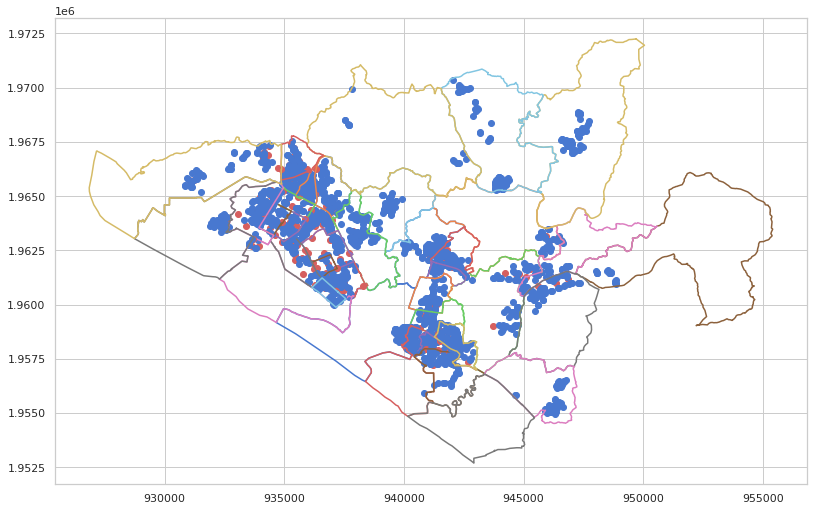

In [320]:
# 실제 작동 코드
# 클러스터링 하기전 모든 후보군
for idx, row in dong_df.iterrows():
    exist_station = station_dong_df[station_dong_df['DONG_NM'] == idx]
    for i, r in exist_station.iterrows():
        x, y = r['geometry'].xy
        plt.plot(x, y, 'ro')
    
    candidate_station = test_df[test_df['DONG_NM'] == idx]
    for i, r in candidate_station.iterrows():
        x, y = r['geometry'].xy
        plt.plot(x, y, 'bo')
    x, y = row['geometry'][0].exterior.xy
    plt.plot(x, y)

클러스터링 하기전의 후보군과 이미 배치된 거치대를 시각화해보았다.

|색|의미|
|:-:|:-:|
|파랑|배치될 수 있는 후보군|
|빨강|배치된 거치대|



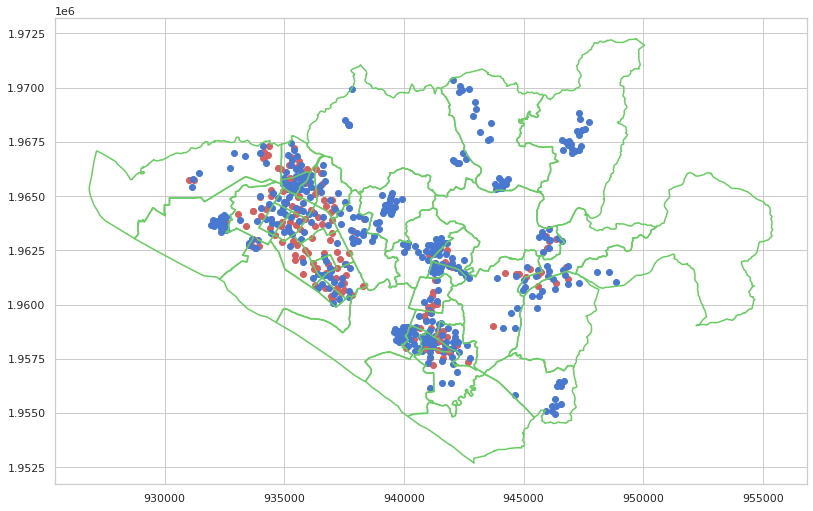

In [321]:
# 절대 수요 기반 클러스터링 진행 후 압축된 후보군 시각화
def createClusterDf(candidate_station, need):
    num = need * 3
    if len(candidate_station) < num:
        candidate_station['X'] = candidate_station['geometry'].apply(lambda x : x.coords[0][0])
        candidate_station['Y'] = candidate_station['geometry'].apply(lambda x : x.coords[0][1])
        return candidate_station[['X', 'Y', 'geometry']]
    kmeans = sklearn.cluster.KMeans(n_clusters=num)
    kmeans.fit(
        X=np.stack([candidate_station['geometry'].apply(lambda x : x.coords[0][0]), 
                    candidate_station['geometry'].apply(lambda x : x.coords[0][1])], axis=1),
        sample_weight=candidate_station['TOTAL_MEAN'],
    )
    cluster_df = kmeans.cluster_centers_ 
    cluster_df = gpd.GeoDataFrame(kmeans.cluster_centers_, columns=['X', 'Y'])
    cluster_df['XY'] = cluster_df['X'].apply(lambda x : str(x)) + ' ' + cluster_df['Y'].apply(lambda x : str(x))
    cluster_df['geometry'] = cluster_df['XY'].apply(lambda x : Point(float(x.split(' ')[0]), float(x.split(' ')[1])))
    cluster_df = cluster_df.set_crs(meter_crs)
    cluster_df = cluster_df[['X', 'Y', 'geometry']]
    return cluster_df

for idx, row in dong_df.iterrows():
    exist_station = station_dong_df[station_dong_df['DONG_NM'] == idx]
    for i, r in exist_station.iterrows():
        x, y = r['geometry'].xy
        plt.plot(x, y, 'ro')
    
    if row['need'] != 0:
        candidate_station = test_df[test_df['DONG_NM'] == idx]
        candidate_station = createClusterDf(candidate_station, row['need'])
 
        for i, r in candidate_station.iterrows():
            x, y = r['geometry'].xy
            plt.plot(x, y, 'bo')
            
    x, y = row['geometry'][0].exterior.xy
    plt.plot(x, y, 'g')

절대 수요 기반 클러스터링을 진행한 후의 압축된 후보군과 배치된 거치대를 비교해보았다.

|색|의미|
|:-:|:-:|
|파랑|배치될 수 있는 압축된 후보군|
|빨강|배치된 거치대|

결과적으로 절대 수요 기반 클러스터링의 결과가 기존의 후보군을 잘 대표해주며, 이를 압축한 결과를 보여주었다. 이를 기반으로 해당 알고리즘을 수행하게 된다.

In [322]:
# 고양시 상하한 설정 -> 추후 부피를 구하기 위함
min_x = np.inf; max_x = 0;
min_y = np.inf; max_y = 0;
for idx, row in dong_df.iterrows():
    x, y = row['geometry'][0].exterior.xy
    min_x = min(min_x , min(x))
    max_x = max(max_x , max(x))
    min_y = min(min_y , min(y))
    max_y = max(max_y , max(y))
    
print("min_x : ", min_x)
print("max_x : ", max_x)
print("min_y : ", min_y)
print("max_y : ", max_y)

min_x :  926848.4293160742
max_x :  955407.2741176265
min_y :  1952687.3247267555
max_y :  1972247.8892937824


In [323]:
# Rebalancing을 고려한 최적 후보군 선정 알고리즘
import scipy.integrate
from scipy.integrate import dblquad
from numpy import exp,arange
from pylab import meshgrid,cm,imshow,contour,clabel,colorbar,axis,title,show

def createClusterDf(candidate_station, need):
    num = need * 3
    if len(candidate_station) < num:
        candidate_station['X'] = candidate_station['geometry'].apply(lambda x : x.coords[0][0])
        candidate_station['Y'] = candidate_station['geometry'].apply(lambda x : x.coords[0][1])
        candidate_station.reset_index(drop=True, inplace=True)
        return candidate_station[['X', 'Y', 'geometry']]
    kmeans = sklearn.cluster.KMeans(n_clusters=num)
    kmeans.fit(
        X=np.stack([candidate_station['geometry'].apply(lambda x : x.coords[0][0]), 
                    candidate_station['geometry'].apply(lambda x : x.coords[0][1])], axis=1),
        sample_weight=candidate_station['TOTAL_MEAN'],
    )
    cluster_df = kmeans.cluster_centers_ 
    cluster_df = gpd.GeoDataFrame(kmeans.cluster_centers_, columns=['X', 'Y'])
    cluster_df['XY'] = cluster_df['X'].apply(lambda x : str(x)) + ' ' + cluster_df['Y'].apply(lambda x : str(x))
    cluster_df['geometry'] = cluster_df['XY'].apply(lambda x : Point(float(x.split(' ')[0]), float(x.split(' ')[1])))
    cluster_df = cluster_df.set_crs(meter_crs)
    cluster_df = cluster_df[['X', 'Y', 'geometry']]
    return cluster_df

def predData(candidate_station, data_columns, model_out):
    candidate_station = candidate_station.to_crs(default_crs)
    candidate_station['LAT'] = candidate_station['geometry'].apply(lambda x : x.coords[0][1])
    candidate_station['LON'] = candidate_station['geometry'].apply(lambda x : x.coords[0][0])
    candidate_station = candidate_station[['LON', 'LAT', 'geometry']]
    candidate_station = createVariableInTest(candidate_station)
    test_data = candidate_station[data_columns]
    alg = model_out["RTN-LEAS_MEAN"]
    pred = alg.predict(test_data)
    candidate_station["RTN-LEAS_MEAN"] = pred
    candidate_station = candidate_station.to_crs(meter_crs)
    candidate_station['X'] = candidate_station['geometry'].apply(lambda x : x.coords[0][0])
    candidate_station['Y'] = candidate_station['geometry'].apply(lambda x : x.coords[0][1])
    return candidate_station[['X', 'Y', 'RTN-LEAS_MEAN', 'geometry']]

def f(x, y):
    global X, Y
    sigma = 1.0
    scale = 1
    z = 0
    for i in range(X.shape[0]):
        rv = sp.stats.multivariate_normal([X[i, 0], X[i, 1]], [[sigma * sigma, 0.0], [0.0, sigma * sigma]])
        z += scale*(Y[i])*rv.pdf([x, y])
    return abs(z)

final_data_x = np.array([[0, 0]])
final_data_y = np.array([0])
num = 0
for idx, row in dong_df.iterrows():
    start = time.time()
    print("---------------",idx,"---------------")
    print("{} / {}".format(num, len(dong_df)))
    num += 1
        
    exist_station = station_dong_df[station_dong_df['DONG_NM'] == idx]
    candidate_station = test_df[test_df['DONG_NM'] == idx]
    if row['need'] == 0:
        if len(exist_station['geometry']) > 0:
            x1 = np.array(exist_station['geometry'].apply(lambda x : x.coords[0][0])).reshape(-1, 1)
            x2 = np.array(exist_station['geometry'].apply(lambda x : x.coords[0][1])).reshape(-1, 1)
            X = np.hstack((x1, x2))
            Y = np.array(exist_station['RTN-LEAS_MEAN'])
            final_data_x = np.vstack((final_data_x, X))
            final_data_y = np.hstack((final_data_y, Y))
        continue
    candidate_station = createClusterDf(candidate_station, row['need'])
    if len(candidate_station) == 0:
        continue
    candidate_station = predData(candidate_station, data_columns, model_out)
    candidate_station.sort_values(by=['RTN-LEAS_MEAN'], axis=0, ascending=False, inplace=True)
    candidate_station.reset_index(drop=True, inplace=True)
    x1 = np.array(exist_station['geometry'].apply(lambda x : x.coords[0][0])).reshape(-1, 1)
    x2 = np.array(exist_station['geometry'].apply(lambda x : x.coords[0][1])).reshape(-1, 1)
    X = np.hstack((x1, x2))
    Y = np.array(exist_station['RTN-LEAS_MEAN'])
    ok = []
    
    if len(candidate_station) < row['need']:
        row['need'] = len(candidate_station)
        
    for t in range(row['need']):
        min_value = np.inf
        min_idx = t
        param = []
        for i, r in candidate_station.iterrows():
            print("reblancing 진행중 {} / {} || {} / {}".format(i, len(candidate_station), t, row['need']))
            if i in ok:
                continue
            X = np.vstack((X, np.array([[r['X'], r['Y']]])))
            Y = np.hstack((Y, np.array(r['RTN-LEAS_MEAN'])))
            #area = dblquad(lambda x, y : f(x, y), min_y, max_y, min_x, max_x)
            #area = dblquad(lambda x, y : f(x, y), min_x, max_x, min_y, max_y)
            area = dblquad(lambda x, y : f(x, y), row['min_x'], row['max_x'], row['min_y'], row['max_y'])
            X = X[:-1, :]
            Y = Y[:-1]
            if area[0] < min_value:
                min_value = area[0]
                min_idx = i
                param = [r['X'], r['Y'], r['RTN-LEAS_MEAN']]
        X = np.vstack((X, np.array([[param[0], param[1]]])))
        Y = np.hstack((Y, np.array(param[2])))
        ok.append(min_idx)
    final_data_x = np.vstack((final_data_x, X))
    final_data_y = np.hstack((final_data_y, Y))
    print("시간 : ", time.time() - start)
    
final_data_x = final_data_x[1:, :]
final_data_y = final_data_y[1:]

--------------- 주교동 ---------------
0 / 39
busstop_cnt_200m 작업중
busstop_cnt_300m 작업중
busstop_cnt_500m 작업중
busstop_GETON_CNT_sum_200m 작업중
busstop_GETON_CNT_sum_300m 작업중
busstop_GETON_CNT_sum_500m 작업중
busstop_GETON_CNT_mean_200m 작업중
busstop_GETON_CNT_mean_300m 작업중
busstop_GETON_CNT_mean_500m 작업중
subway_cnt_500m 작업중
subway_cnt_1000m 작업중
subway_cnt_1500m 작업중
subway_IN_sum_500m 작업중
subway_IN_sum_1000m 작업중
subway_IN_sum_1500m 작업중
subway_IN_mean_500m 작업중
subway_IN_mean_1000m 작업중
subway_IN_mean_1500m 작업중
subway_OUT_sum_500m 작업중
subway_OUT_sum_1000m 작업중
subway_OUT_sum_1500m 작업중
subway_OUT_mean_500m 작업중
subway_OUT_mean_1000m 작업중
subway_OUT_mean_1500m 작업중
subway_NET_TOTAL_sum_500m 작업중
subway_NET_TOTAL_sum_1000m 작업중
subway_NET_TOTAL_sum_1500m 작업중
subway_NET_TOTAL_mean_500m 작업중
subway_NET_TOTAL_mean_1000m 작업중
subway_NET_TOTAL_mean_1500m 작업중
school_cnt_500m 작업중
school_cnt_1000m 작업중
school_cnt_1500m 작업중
sports_cnt_500m 작업중
sports_cnt_1000m 작업중
sports_cnt_1500m 작업중
altitude 작업중
진행중 : 0 / 21
진행시간 :  5.

## 5.3 결과 시각화/해석

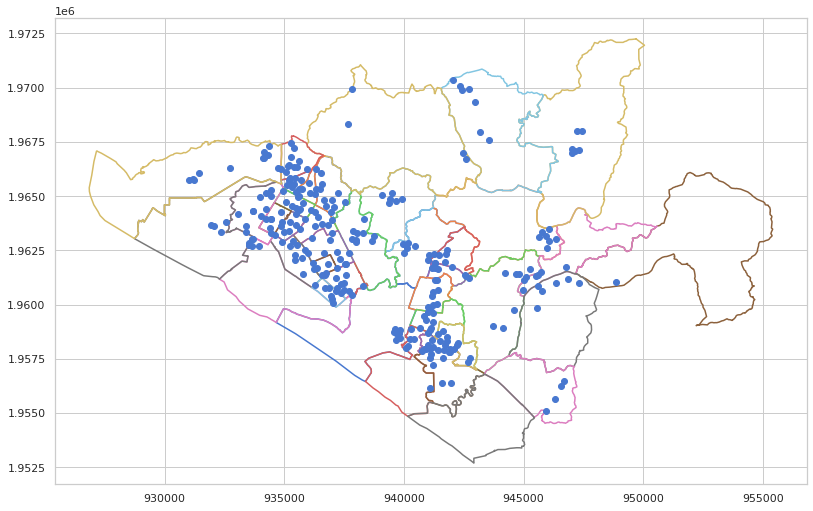

In [324]:
# Rebalancing을 해결하는 최적 후보군 시각화
for idx, row in dong_df.iterrows():           
    x, y = row['geometry'][0].exterior.xy
    plt.plot(x, y)
#     axis("off")
plt.plot(final_data_x[:, 0], final_data_x[:, 1], 'bo')

전체적으로 거치대가 잘 뿌려진것을 확인할수 있다. 

In [325]:
# 정규 분포계산 함수
def calc_f(x, y):
    global X, Y
    sigma = 300.0
    scale = 10000
    if len(x.shape) == 1:
        z = np.zeros((x.shape[0]))
    elif len(x.shape) == 2:
        z = np.zeros((x.shape[0], x.shape[1]))
    pos = np.dstack((x, y))
    num = X.shape[0]
    for i in range(X.shape[0]):
        if i % 50 == 0:
            print("진행중 {} / {}".format(i, num))
        rv = sp.stats.multivariate_normal([X[i, 0], X[i, 1]], sigma*sigma*np.eye(2))
        z += scale*(Y[i])*rv.pdf(pos)  
    return z

In [326]:
# 고양시 전체를 기준으로 z값 계산
X = final_data_x
Y = final_data_y
x, y = np.mgrid[min_x:max_x:10, min_y:max_y:10]
z = calc_f(x, y)

진행중 0 / 294
진행중 50 / 294
진행중 100 / 294
진행중 150 / 294
진행중 200 / 294
진행중 250 / 294


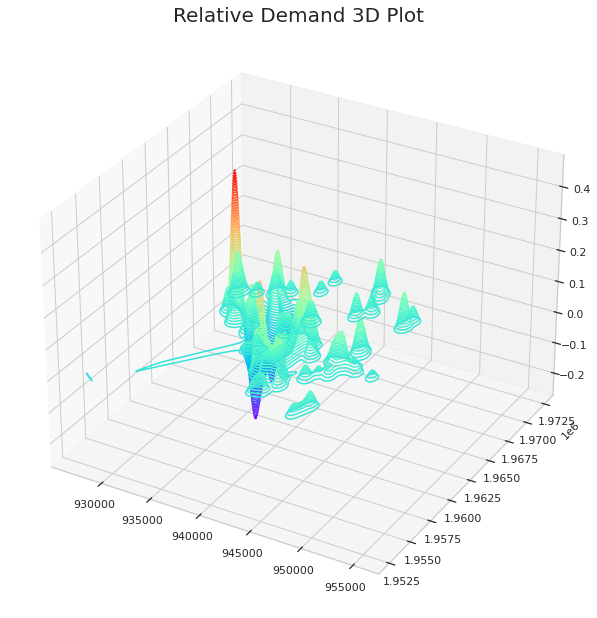

In [327]:
#고양시 전체 Rebalancing 정도
fig = plt.figure(figsize=(12, 10))
ax = plt.axes(projection='3d')
ax.contour3D(x, y, z, 100, cmap=plt.cm.rainbow)
plt.title("Relative Demand 3D Plot", fontsize=20)
plt.show()



극단적으로 치운친 봉오리가 많이 없는 것으로 보아 리벨런싱이 잘 되었다고 생각할 수 있다.

하지만 중간에 극단적인 부분이 있다. 이 부분을 확대해서 관찰할 필요성이 있다.

Text(0.5, 1.0, 'Relative Demand Heatmap In Goyang City')

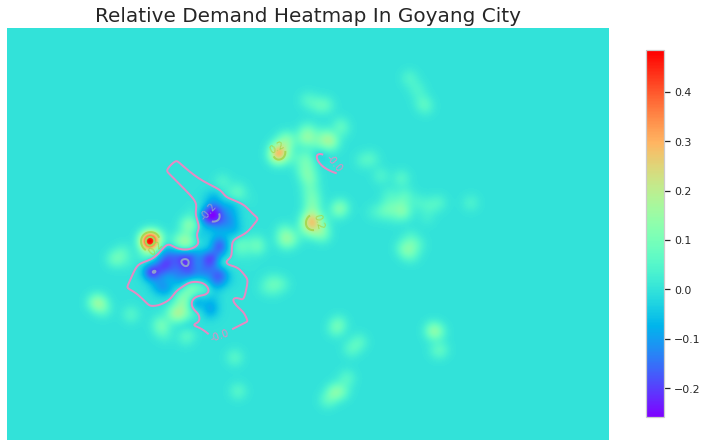

In [328]:
# 후보군 포함 상대 수요 히트맵
from numpy import exp,arange
from pylab import meshgrid,cm,imshow,contour,clabel,colorbar,axis,title,show
# fig, ax = plt.subplots()
fig = plt.figure(figsize=(12,9))
ax = fig.add_subplot(1,1,1)
im = imshow(z.T,cmap=plt.cm.rainbow)
cset = ax.contour(z.T,arange(-1,1.5,0.2),linewidths=2,cmap=cm.Set2)
ax.clabel(cset,inline=True,fmt='%1.1f',fontsize=10)
ax.axis('off')
colorbar(im, shrink=0.7)
plt.title("Relative Demand Heatmap In Goyang City", fontsize=20)

중간에 극단적인 부분이 호수공원, 킨텍스, 대화역, 주엽역, 라페스타, 웨스턴돔 부분인 것을 확인했다.

해당 부분만 떼어내서 관찰해보자.

In [329]:
# 호수공원, 킨텍스, 대화역, 주엽역, 라페스타, 웨스턴돔 부분 plot
row_index = ['주엽1동', '주엽2동', '대화동','정발산동','중산동','탄현동', '일산1동', '일산2동', '일산3동']
min_x_ = dong_df.loc[row_index]['min_x'].min()
max_x_ = dong_df.loc[row_index]['max_x'].max()
min_y_ = dong_df.loc[row_index]['min_y'].min()
max_y_ = dong_df.loc[row_index]['max_y'].max()

x, y = np.mgrid[min_x_:max_x_:10, min_y_:max_y_:10]
z = calc_f(x, y)

진행중 0 / 294
진행중 50 / 294
진행중 100 / 294
진행중 150 / 294
진행중 200 / 294
진행중 250 / 294


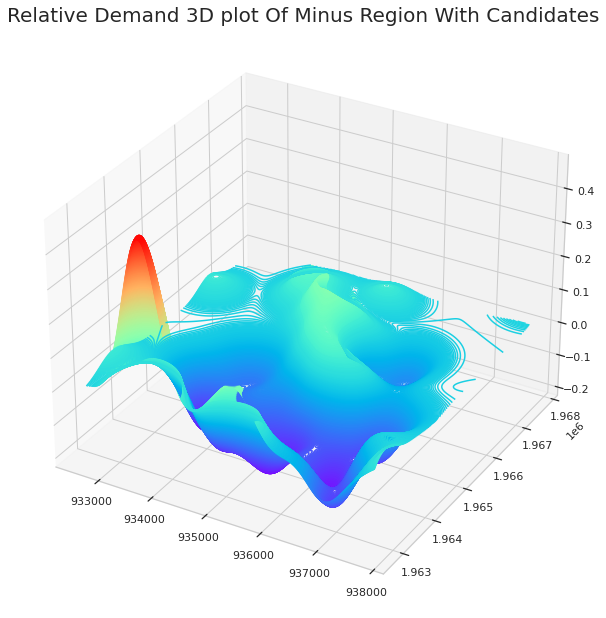

In [330]:
# 호수공원, 킨텍스, 대화역, 주엽역, 라페스타, 웨스턴돔 부분 plot
fig = plt.figure(figsize=(12, 10))
ax = plt.axes(projection='3d')
ax.contour3D(x, y, z, 1000, cmap=plt.cm.rainbow)
plt.title("Relative Demand 3D plot Of Minus Region With Candidates", fontsize=20)
plt.show()

기존의 설치된 거치대의 상대수요와 Rebalancing된 후의 상태를 비교해보자.

In [331]:
x1 = np.array(station_dong_df['geometry'].apply(lambda x : x.coords[0][0])).reshape(-1, 1)
x2 = np.array(station_dong_df['geometry'].apply(lambda x : x.coords[0][1])).reshape(-1, 1)
X = np.hstack((x1, x2))
Y = np.array(station_dong_df['RTN-LEAS_MEAN'] + bias)

In [332]:
row_index = ['주엽1동', '주엽2동', '대화동','정발산동','중산동','탄현동', '일산1동', '일산2동', '일산3동']
min_x_ = dong_df.loc[row_index]['min_x'].min()
max_x_ = dong_df.loc[row_index]['max_x'].max()
min_y_ = dong_df.loc[row_index]['min_y'].min()
max_y_ = dong_df.loc[row_index]['max_y'].max()

x, y = np.mgrid[min_x_:max_x_:10, min_y_:max_y_:10]
z = calc_f(x, y)

진행중 0 / 155
진행중 50 / 155
진행중 100 / 155
진행중 150 / 155


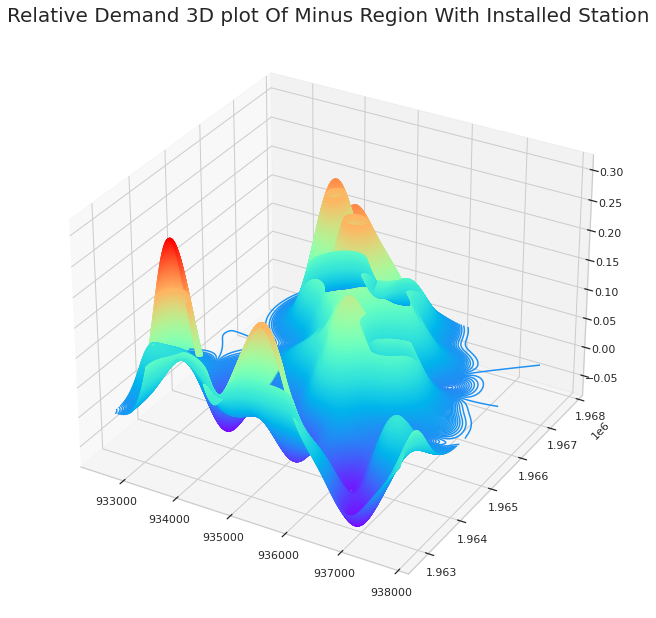

In [333]:
# 기존 거치대 기반 상대수요 시각화
fig = plt.figure(figsize=(12, 10))
ax = plt.axes(projection='3d')
ax.contour3D(x, y, z, 1000, cmap=plt.cm.rainbow)
plt.title("Relative Demand 3D plot Of Minus Region With Installed Station", fontsize=20)
plt.show()

후보군을 포함하지 않았을 때, 상대 수요의 분포를 보면 굉장히 들쑥날쑥함을 알 수 있다.

제안한 후보군을 추가한 이후 그래프가 완만해졌고, 이는 곧 어느정도 불균형을 해소했음을 의미한다.

하지만 여전히 거치대에 따른 상대 수요의 불균형이 존재하고, 이를 해결하기 위해 자전거 운송 차량을 배치할 필요성이 엿보인다.

## 5.4 위치 보정/최종 답안 제작

마지막으로 제안된 후보군의 위치를 보정해주는 작업을 진행한다.

가장 가까운 도로로 후보군들을 이동시킨다. 그리고 마지막으로 답안 양식으로 후보군을 추가한다.

In [334]:
# 후보군의 geometry 정보만을 가져온다.
final_gdf = gpd.GeoDataFrame(final_data_x, columns=['X', 'Y'])
final_gdf['XY'] = final_gdf['X'].apply(lambda x : str(x)) + ' ' + final_gdf['Y'].apply(lambda x : str(x))
final_gdf['geometry'] = final_gdf['XY'].apply(lambda x : Point(float(x.split()[0]), float(x.split()[1])))
final_gdf = final_gdf.set_crs(meter_crs)
final_gdf = final_gdf.to_crs(default_crs)
final_gdf = final_gdf[['geometry']]
final_gdf

,geometry
0,POINT (126.83159 37.65797)
1,POINT (126.81968 37.65887)
2,POINT (126.83137 37.65609)
3,POINT (126.82098 37.66114)
4,POINT (126.81942 37.66287)
...,...
289,POINT (126.75264 37.69784)
290,POINT (126.75309 37.69787)
291,POINT (126.73695 37.69384)
292,POINT (126.71944 37.68886)


In [335]:
# 도로 데이터에서 geometry 정보를 제외한 describe
address_road_gdf.drop('geometry', axis=1).describe(include='all')

,RDS_MAN_NO,RN,WDR_RD_CD,ROA_CLS_SE,RDS_DPN_SE,ROAD_BT,ROAD_LT
count,4544.000000,4544,4544,4544,4544,4544.000000,4544.000000
unique,NaN,999,3,4,3,NaN,NaN
top,NaN,장항로,3,4,1,NaN,NaN
freq,NaN,45,4265,3166,3383,NaN,NaN
mean,3338.099472,NaN,NaN,NaN,NaN,6.242427,2496.335392
std,4662.033692,NaN,NaN,NaN,NaN,5.420730,12378.489916
min,1.000000,NaN,NaN,NaN,NaN,0.000000,12.000000
25%,1195.750000,NaN,NaN,NaN,NaN,3.000000,96.000000
50%,2387.500000,NaN,NaN,NaN,NaN,5.000000,178.000000
75%,3559.250000,NaN,NaN,NaN,NaN,7.000000,452.250000


In [336]:
# 모든 도로의 RDS_MAN_NO를 형변환한다.
for column in ['RDS_MAN_NO']:
    address_road_gdf[column] = address_road_gdf[column].apply(str)
    
address_road_gdf.drop('geometry', axis=1).describe(include='all')

,RDS_MAN_NO,RN,WDR_RD_CD,ROA_CLS_SE,RDS_DPN_SE,ROAD_BT,ROAD_LT
count,4544,4544,4544,4544,4544,4544.000000,4544.000000
unique,4544,999,3,4,3,NaN,NaN
top,2010,장항로,3,4,1,NaN,NaN
freq,1,45,4265,3166,3383,NaN,NaN
mean,NaN,NaN,NaN,NaN,NaN,6.242427,2496.335392
std,NaN,NaN,NaN,NaN,NaN,5.420730,12378.489916
min,NaN,NaN,NaN,NaN,NaN,0.000000,12.000000
25%,NaN,NaN,NaN,NaN,NaN,3.000000,96.000000
50%,NaN,NaN,NaN,NaN,NaN,5.000000,178.000000
75%,NaN,NaN,NaN,NaN,NaN,7.000000,452.250000


In [337]:
# 도로 정보를 점으로 변경한다.
import shapely
x0, x1 = list(), list()
for lines in address_road_gdf['geometry']:
    for line in lines:
        for _x0, _y0, _x1, _y1 in zip(line.xy[0][:-1], line.xy[1][:-1], line.xy[0][1:], line.xy[1][1:]):
            x0.append([_x0, _y0])
            x1.append([_x1, _y1])

lines = shapely.ops.cascaded_union([shapely.geometry.LineString([x0, x1]) for x0, x1 in zip(x0, x1)])

In [338]:
# 가장 가까운 점을 가져온다.
def find_nearest_point(x0, x1, x2):
    x0 = tf.reshape(tf.constant(x0, dtype=tf.float32), [-1, 2, 1])
    x1 = tf.reshape(tf.constant(x1, dtype=tf.float32), [-1, 2, 1])
    x2 = tf.reshape(tf.constant(x2, dtype=tf.float32), [-1, 2, 1])
    A = tf.reshape(
        tf.stack([
            (x0[:, 1, 0] - x1[:, 1, 0]), -(x0[:, 0, 0] - x1[:, 0, 0]),
            (x0[:, 0, 0] - x1[:, 0, 0]),  (x0[:, 1, 0] - x1[:, 1, 0]),
        ], axis=1),
        [-1, 2, 2],
    )
    A_I = tf.reshape(
        tf.stack([
             (x0[:, 1, 0] - x1[:, 1, 0]), (x0[:, 0, 0] - x1[:, 0, 0]),
            -(x0[:, 0, 0] - x1[:, 0, 0]), (x0[:, 1, 0] - x1[:, 1, 0]),
        ], axis=1)  / tf.reshape((x0[:, 0, 0] - x1[:, 0, 0])**2 + (x0[:, 1, 0] - x1[:, 1, 0])**2, [-1, 1]),
        [-1, 2, 2],
    )
    c_0 = tf.matmul(A, x0)
    c_1 = tf.matmul(A, x1)
    c_2 = tf.matmul(A, x2)
    c_01 = tf.stack([c_0[:, 1, 0], c_1[:, 1, 0]], axis=1)
    c_min = tf.reduce_min(c_01, axis=1)
    c_max = tf.reduce_max(c_01, axis=1)
    c = tf.reduce_max(
        tf.stack([
            tf.reduce_min(tf.stack([c_2[:, 1, 0], c_max], axis=1), axis=1),
            c_min,
        ], axis=1),
        axis=1,
    )
    y = tf.reshape(
        tf.stack([c_0[:, 0, 0], c], axis=1),
        [-1, 2, 1],
    )
    x4 = tf.matmul(A_I, y)
    dist = tf.reduce_sum((tf.reshape(x2, [-1, 2]) - tf.reshape(x4, [-1, 2]))**2, axis=1)
    idx = tf.argmin(dist)
    res = x4[idx, :, 0]
    return res[0].numpy(), res[1].numpy()

In [339]:
# 후보군에 대해 가장 가까운 도로로 재배치 한다.
result = list()
for idx, row in final_gdf.iterrows():
    point = [row['geometry'].coords[0][0], row['geometry'].coords[0][1]]
    result.append(find_nearest_point(x0, x1, point))

In [340]:
# output list를 df로 변경한다.
result_gdf = gpd.GeoDataFrame(result, columns=['X', 'Y'])
result_gdf['XY'] = result_gdf['X'].apply(lambda x : str(x)) + ' ' + result_gdf['Y'].apply(lambda x : str(x))
result_gdf['geometry'] = result_gdf['XY'].apply(lambda x : Point(float(x.split()[0]), float(x.split()[1])))
result_gdf = result_gdf.set_crs(default_crs)
result_gdf = result_gdf[['geometry']]
result_gdf

,geometry
0,POINT (126.83154 37.65788)
1,POINT (126.81967 37.65888)
2,POINT (126.83138 37.65609)
3,POINT (126.82145 37.66129)
4,POINT (126.81943 37.66288)
...,...
289,POINT (126.75289 37.69783)
290,POINT (126.75289 37.69787)
291,POINT (126.73695 37.69394)
292,POINT (126.71977 37.68850)


In [341]:
# 후보군을 고양시 지도 위에 띄워본다.
from folium import IFrame
from folium.plugins import MarkerCluster
import folium
import random as rd


m = folium.Map(location=center, tiles="OpenStreetMap", zoom_start=12)

width, height = 310,150
popups, locations = [], []

for idx, row in result_gdf.iterrows():
    locations.append([row['geometry'].y, row['geometry'].x])

h = folium.FeatureGroup(name='candidate')
h.add_children(MarkerCluster(locations=locations))
m.add_children(h)

In [342]:
# 사용하기 전 변수 세팅
result_gdf = result_gdf.to_crs(meter_crs)
args = [result_gdf, gdf_boundary_town, "DONG_NM"]

# 함수 실행
result_gdf_visual = join_Town2Candidate(*args)
result_gdf_visual.head()

진행률 : 0 / 294
진행시간 : 0.0009772777557373047


,geometry,DONG_NM
0,POINT (941039.313 1962251.767),주교동
1,POINT (939993.010 1962371.031),주교동
2,POINT (941023.096 1962053.801),주교동
3,POINT (940151.741 1962637.377),주교동
4,POINT (939974.695 1962814.734),주교동


In [343]:
# 행정동별 자전거 정류장 정보를 모두 합해주는 함수
def calculateStationPerTown2(gdf1, gdf2, rel_method=gpd.GeoSeries.intersects):
  """
  input : (gdf_station, gdf_pop_dist, latitude, longitude, coverage, space_relation_method, cal_method)
  output : ret_gdf

  describe : 행정동 데이터 행 하나에 해당하는 정류장의 개수를 feature로 추가한다.

  space_relation_method = gpd.GeoSeries.within, gpd.GeoSeries.intersects
  """
  ret_df = copy.deepcopy(gdf1)

  for i in range(ret_df.shape[0]):
    town = gdf1.iloc[i]["geometry"]
    temp_df = gdf2[rel_method(gdf2, town)]
    if temp_df.shape[0] == 0:
      ret_df.loc[i, "STATION_COUNT"] = 0
    else:
      ret_df.loc[i, "STATION_COUNT"] = temp_df.shape[0]


  return ret_df

In [344]:
# 사용하기 전 변수 세팅
args = [gdf_boundary_town, result_gdf_visual, gpd.GeoSeries.intersects]

# 함수 실행
gdf_boundary_town_result = calculateStationPerTown2(*args)
gdf_boundary_town_result.head()

,GU_CD,GU_NM,DONG_CD,DONG_NM,geometry,STATION_COUNT,STATION_RTN_COUNTS,STATION_LEAS_COUNTS,STATION_RTN-LEAS,STATION_TOTAL,...,POP_PER_HOUSEHOLDS,M_POP,W_POP,MW_RATE,STATION_PER_POP,RIDE_PER_POP,PROB_STATION_COUNT,PROB_TOTAL_POP,LOCATE_PROB,LOCATE_NUM
0,31101,덕양구,3110151,주교동,"MULTIPOLYGON (((941371.354 1964353.054, 941373...",8.0,2950.0,3671.0,-721.0,6621.0,...,2.14,8126,7622,1.07,15748.0,0.420434,1.000000,0.014768,0.052409,7
1,31101,덕양구,3110152,원신동,"MULTIPOLYGON (((942677.321 1965788.996, 942688...",7.0,9496.0,13472.0,-3976.0,22968.0,...,2.54,11568,12374,0.93,5985.5,0.959318,0.250000,0.022452,0.019919,3
2,31101,덕양구,3110153,흥도동,"MULTIPOLYGON (((944966.339 1961093.460, 944919...",9.0,36059.0,41872.0,-5813.0,77931.0,...,2.43,21702,22863,0.95,7427.5,1.748704,0.166667,0.041792,0.024718,3
3,31101,덕양구,3110154,성사1동,"MULTIPOLYGON (((942585.687 1963444.268, 942600...",6.0,10174.0,11785.0,-1611.0,21959.0,...,2.28,10928,11134,0.98,7354.0,0.995331,0.333333,0.020689,0.024474,3
4,31101,덕양구,3110155,성사2동,"MULTIPOLYGON (((941344.035 1961920.305, 941365...",6.0,9207.0,8366.0,841.0,17573.0,...,2.45,5689,6040,0.94,11729.0,1.498252,1.000000,0.010999,0.039033,5


In [345]:
# 후보군을 포함한 행정동 내 자전거 거치대 수를 파악한다.
from branca.colormap import linear

m = folium.Map(center, zoom_start=12,tiles=None)



feature_group2 = folium.FeatureGroup(name='STATION_COUNT',overlay=False).add_to(m) 


fs = [feature_group2]#,feature_group1]#,feature_group2]
feature_list = ["STATION_COUNT"]#,"STATION_COUNT"]#,"STATION_PER_POP"]
for i in range(len(feature_list)): 
    choropleth1 = folium.Choropleth(
    geo_data=gdf_boundary_town,
    name='choropleth',
    data=gdf_boundary_town_result,
    columns=['DONG_NM', feature_list[i]],
    key_on='feature.properties.DONG_NM',
    fill_color='YlGn',
    nan_fill_color="black",
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Arrival (in Quintal)',
    highlight=True,
    line_color='black').geojson.add_to(fs[i])

    colormap = linear.YlGn_09.scale(
    gdf_boundary_town[feature_list[i]].min(),
    gdf_boundary_town[feature_list[i]].max()).to_step(10)
    colormap.caption = feature_list[i]
    colormap.add_to(m)
    
   
folium.TileLayer('cartodbpositron',overlay=True,name="background").add_to(m)
folium.LayerControl('topright',collapsed=False).add_to(m)

m

In [346]:
# 거치대 용량 평균
np.mean(station_df["HOLDER_CAPACITY"])

26.1890243902439

거치대 용량의 평균이 26인 것을 확인했다.

우리는 이 거치대 용량의 평균에 맞는 숫자를 배정하려 했다.

결과적으로 상대 수요를 기반으로 정렬하고 이를 3등분하여 순차적으로 30, 25, 20개의 거치대 수량을 배정하여 이 평균치에 맞도록 하였다.

In [347]:
# 상대 수요 기반으로 거치대 수량 배정
station_num_df = pd.DataFrame(np.abs(final_data_y), columns=['value'])
station_num_df['station_id'] = station_num_df.index
station_num_df['num'] = pd.qcut(station_num_df['value'], 3, labels=[20, 25, 30])
station_num_df

,value,station_id,num
0,1.640951,0,25
1,2.427242,1,30
2,2.311319,2,30
3,2.296151,3,30
4,2.125839,4,30
...,...,...,...
289,1.206764,289,25
290,1.817808,290,25
291,2.438309,291,30
292,2.429705,292,30


In [348]:
result_gdf = result_gdf.to_crs(default_crs)

In [349]:
# 답안 제출
result_gdf['스테이션 번호'] = result_gdf.index
result_gdf['거치대 수량'] = station_num_df['num']
result_gdf['X 좌표(위도)'] = result_gdf['geometry'].apply(lambda x : x.coords[0][1])
result_gdf['Y 좌표(경도)'] = result_gdf['geometry'].apply(lambda x : x.coords[0][0])
result_gdf = result_gdf[['스테이션 번호', '거치대 수량', 'X 좌표(위도)', 'Y 좌표(경도)']]
result_gdf

,스테이션 번호,거치대 수량,X 좌표(위도),Y 좌표(경도)
0,0,25,37.657875,126.831543
1,1,30,37.658882,126.819672
2,2,30,37.656090,126.831375
3,3,30,37.661293,126.821449
4,4,30,37.662880,126.819427
...,...,...,...,...
289,289,25,37.697830,126.752892
290,290,25,37.697868,126.752892
291,291,30,37.693939,126.736946
292,292,30,37.688496,126.719772


# 6. 보완사항


## 6.1 수요 예측을 위한 데이터의 부족

기존에 설치된 거치대를 기반으로 새로운 후보군의 수요를 예측했다. 

하지만 기존의 정류장 수 160개를 기반으로 이러한 수요 특성을 파악하기에는 모집단의 수가 너무 적다는 문제가 있다. 최대한 일반화 성능을 높히는 방향으로 진행했지만, 보다 많은 수의 데이터가 있었다면 더 정확한 제안을 하지 않았을까 한다.

## 6.2 전역 Rebalancing

시간 복잡도의 문제로, 지역을 기반으로 Rebalancing을 해결하고자 하였다. 우리가 선정한 Metric은 근본적으로 3차원 그래프의 부피를 구하는 작업이다. 이 작업은 굉장히 많은 연산량을 요구한다. 따라서 지역의 Rebalancing을 최소화하는 후보군을 선택하고, 이것들의 모임을 전체 고양시의 거치대의 불균형 문제를 해결하는 답안으로 제출했다. 더 좋은 Metric을 설정하거나 빠른 연산이 가능하다면 전역 Rebalancing을 해결하는 답안을 찾고 싶다.

## 6.3 Greedy Algorithm

지역적으로 후보군을 찾는데 있어서 역시 완전 탐색을 통한 최적 후보군을 찾지 못했다. 이 역시 연산량에서 근간한 문제로, 완전 탐색으로 대표 후보군 3N개로부터 N개의 최적 후보군을 찾기 위해서는 $O(n!)$ 정도의 시간 복잡도를 요구한다. 또한 각각의 Metric을 구하는 것도 6.2에서 말했듯 굉장히 높은 연산량을 요구하기 때문에 이를 시도하지 못했다.

이를 보완 할 수 있는 알고리즘으로 유전 알고리즘을 제안한다. 유전 알고리즘은 후보군을 랜덤으로 여러개 생성한뒤 Metric을 통해
세대를 거듭하고 이에 따라 더 낮은 Metric을 갖는 후보군을 찾는다.

## 6.4 Rebalancing 차량 정보 부족

최적 입지를 선정하는데 있어서 수요만을 고려한다면, 우리가 진행한 평균 수요를 기반으로 한 방법은 매우 합리적이다. 하지만 Rebalancing 문제에 있어서 평균 수요를 가지고 이를 고려하는 것은 정적인 불균형 문제만을 해소하기 때문에 약간의 부족함이 있다. 만약 시간대 별로 자전거 재배치 차량의 동선, 수량 등에 대한 데이터가 있었다면, 좀더 나은 Rebalancing 해결 방안을 제시할 수 있지 않았을까 하는 아쉬움이 남는다.